In [118]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from scipy.stats import shapiro, skew, kurtosis
import re
from datetime import datetime
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.feature_selection import mutual_info_classif
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder

In [119]:
# Helper Utility Functions
def redundant_columns(df):
    """
    Identify columns that have only one unique value (redundant).
    """
    return [col for col in df.columns if df[col].nunique() <= 1]

def standardize_boolean(series):
    """
    Convert a series with potential boolean values to 0/1.
    Handles numeric (0/1) and common string values ("YES"/"NO", "Y"/"N", "TRUE"/"FALSE").
    """
    mapping = {"yes": 1, "y": 1, "true": 1, "1": 1,
               "no": 0,  "n": 0, "false": 0, "0": 0}
    if series.dtype == object:
        return series.str.lower().map(mapping)
    else:
        return series

def check_placeholder_values(series, placeholders=[9999, 99, "UNKNOWN", "unknown", ""]):
    """
    Count occurrences of typical placeholder values in a series.
    """
    counts = {}
    for ph in placeholders:
        counts[ph] = (series == ph).sum()
    return counts

def convert_datetime_columns(df):
    """
    Convert columns containing 'date' or 'time' in their names to datetime.
    Returns a list of columns successfully converted.
    """
    converted = []
    for col in df.columns:
        if "date" in col.lower() or "time" in col.lower():
            try:
                df[col] = pd.to_datetime(df[col], errors='coerce')
                converted.append(col)
            except Exception as e:
                print(f"Could not convert column {col}: {e}")
    return converted

In [120]:
# Analysis Functions for Each File Type
def analyze_flag_file(df):
    """
    Analysis for FLAG files:
      - Check boolean fields (standardize if necessary).
      - Look for missing/placeholder values (-1, 9999, etc.).
      - Check duplicates and redundant columns.
      - Verify linkage to CRASH file via 'CRN' (Crash Record Number).
    """
    print("FLAG File Analysis")
    print("-------------------")
    print("Data Shape:", df.shape)
    print("Columns:", df.columns.tolist())
    print("\nFirst 5 rows:")
    print(df.head())
    print("\nData Types:")
    print(df.dtypes)
    
    # Missing values analysis
    missing_counts = df.isnull().sum()
    missing_percent = 100 * missing_counts / len(df)
    missing_df = pd.DataFrame({'Missing Count': missing_counts, 'Missing Percent': missing_percent})
    print("\nMissing Values Analysis:")
    print(missing_df)
    plt.figure(figsize=(10, 6))
    sns.heatmap(df.isnull(), cbar=False, cmap="viridis")
    plt.title("Missing Data Heatmap (FLAG File)")
    plt.show()
    
    # Duplicate rows
    duplicate_count = df.duplicated().sum()
    print("\nNumber of duplicate rows:", duplicate_count)
    
    # Redundant columns
    redun_cols = redundant_columns(df)
    print("\nRedundant columns (constant values):", redun_cols)
    
    # Standardize boolean fields (if a column has exactly 2 unique values, assume boolean)
    for col in df.columns:
        unique_vals = df[col].dropna().unique()
        if len(unique_vals) == 2:
            print(f"Standardizing boolean field: {col}")
            df[col] = standardize_boolean(df[col])
            print(f"New unique values in {col}: {df[col].dropna().unique()}")
    
    # Check for placeholder values in numeric/boolean columns
    placeholders = [99, 9999]
    for col in df.columns:
        if pd.api.types.is_numeric_dtype(df[col]):
            ph_counts = check_placeholder_values(df[col], placeholders)
            if any(val > 0 for val in ph_counts.values()):
                print(f"Column '{col}' has placeholder values: {ph_counts}")
    
    # Linkage check: Ensure 'CRN' exists and appears valid
    if 'CRN' in df.columns:
        unique_crn = df['CRN'].nunique()
        total_rows = len(df)
        print(f"\nLinkage Check: CRN column has {unique_crn} unique values out of {total_rows} rows.")
        if unique_crn < total_rows:
            print("Warning: There might be duplicate or unlinked records in CRN.")
    else:
        print("CRN column not found. Cannot verify linkage to CRASH file.")
    
    return df


def analyze_crash_file(df):
    """
    Analysis for CRASH files:
      - Ensure Crash ID ('CRN') uniqueness.
      - Convert date/time columns.
      - Check numeric columns for negative/placeholder values.
      - List unique values for categorical codes.
      - Identify duplicates.
    """
    print("CRASH File Analysis")
    print("---------------------")
    print("Data Shape:", df.shape)
    print("Columns:", df.columns.tolist())
    print("\nFirst 5 rows:")
    print(df.head())
    
    # Check Crash ID uniqueness
    if 'CRN' in df.columns:
        unique_crn = df['CRN'].nunique()
        print(f"\nUnique Crash IDs (CRN): {unique_crn} out of {len(df)} rows.")
        if unique_crn < len(df):
            print("Warning: Duplicate Crash IDs detected.")
    else:
        print("CRN column not found.")
    
    # Convert date/time columns
    converted_cols = convert_datetime_columns(df)
    if converted_cols:
        print("Converted columns to datetime:", converted_cols)
    else:
        print("No date/time columns detected for conversion.")
    
    # Check numeric columns for negative values and placeholders
    numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
    for col in numeric_cols:
        min_val = df[col].min()
        max_val = df[col].max()
        if min_val < 0:
            print(f"Column '{col}' has negative values: min = {min_val}")
        placeholders = [-1, 9999]
        ph_counts = check_placeholder_values(df[col], placeholders)
        if any(count > 0 for count in ph_counts.values()):
            print(f"Column '{col}' placeholder values: {ph_counts}")
    
    # For categorical columns, list a sample of unique values
    object_cols = df.select_dtypes(include=['object']).columns.tolist()
    for col in object_cols:
        unique_vals = df[col].dropna().unique()
        print(f"Categorical column '{col}' unique values (sample): {unique_vals[:10]}")
    
    # Duplicate rows
    duplicate_count = df.duplicated().sum()
    print("\nNumber of duplicate rows:", duplicate_count)
    
    return df


def analyze_person_file(df):
    """
    Analysis for PERSON files:
      - Check demographic fields (age, gender) for out-of-range values.
      - Verify injury severity codes for consistency.
      - Check missing/placeholder values.
      - Confirm linkage with CRASH via 'CRN'.
      - Flag potential PII (if columns like 'NAME', 'PHONE' exist).
    """
    print("PERSON File Analysis")
    print("----------------------")
    print("Data Shape:", df.shape)
    print("Columns:", df.columns.tolist())
    print("\nFirst 5 rows:")
    print(df.head())
    
    # Check for age issues
    if 'AGE' in df.columns:
        age_min = df['AGE'].min()
        age_max = df['AGE'].max()
        print(f"Age range: {age_min} to {age_max}")
        if age_min < 0 or age_max > 120 or age_max == 9999:
            print("Warning: AGE column contains out-of-range or placeholder values.")
    
    # Check for injury severity (if any injury-related columns exist)
    possible_severity_cols = [col for col in df.columns if "injury" in col.lower()]
    for col in possible_severity_cols:
        unique_vals = df[col].dropna().unique()
        print(f"Injury severity column '{col}' unique values: {unique_vals}")
    
    # Missing values check
    missing_counts = df.isnull().sum()
    print("\nMissing Values in PERSON File:")
    print(missing_counts[missing_counts > 0])
    
    # Duplicate rows
    duplicate_count = df.duplicated().sum()
    print("\nNumber of duplicate rows:", duplicate_count)
    
    # Linkage: Check for CRN column
    if 'CRN' in df.columns:
        unique_crn = df['CRN'].nunique()
        print(f"Linkage Check: CRN column has {unique_crn} unique values out of {len(df)} rows.")
    else:
        print("CRN column not found. Cannot verify linkage to CRASH file.")
    
    # Check for potential PII
    pii_keywords = ['name', 'phone', 'address', 'ssn']
    for col in df.columns:
        for keyword in pii_keywords:
            if keyword in col.lower():
                print(f"Warning: Column '{col}' might contain PII.")
    
    return df


def analyze_vehicle_file(df):
    """
    Analysis for VEHICLE files:
      - Check model year and vehicle type for realistic values.
      - Review make/model text fields for standardization issues.
      - Check numeric fields for placeholders or negative values.
      - Identify duplicates and verify linkage to CRASH via CRN.
    """
    print("VEHICLE File Analysis")
    print("-----------------------")
    print("Data Shape:", df.shape)
    print("Columns:", df.columns.tolist())
    print("\nFirst 5 rows:")
    print(df.head())
    
    # Check for MODEL_YEAR issues
    if 'MODEL_YEAR' in df.columns:
        current_year = datetime.now().year
        min_year = df['MODEL_YEAR'].min()
        max_year = df['MODEL_YEAR'].max()
        print(f"Model Year range: {min_year} to {max_year}")
        if min_year < 1900 or max_year > current_year + 5:
            print("Warning: MODEL_YEAR contains unrealistic values.")
    
    # Check Make/Model for consistency
    for col in ['MAKE', 'MODEL']:
        if col in df.columns:
            unique_vals = df[col].dropna().unique()
            print(f"Column '{col}' has {len(unique_vals)} unique values. Sample: {unique_vals[:10]}")
            # Standardize by trimming whitespace and converting to uppercase
            df[col] = df[col].str.strip().str.upper()
    
    # Check numeric columns for negative or placeholder values
    numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
    for col in numeric_cols:
        min_val = df[col].min()
        if min_val < 0:
            print(f"Column '{col}' has negative values: min = {min_val}")
        placeholders = [-1, 9999]
        ph_counts = check_placeholder_values(df[col], placeholders)
        if any(count > 0 for count in ph_counts.values()):
            print(f"Column '{col}' placeholder counts: {ph_counts}")
    
    # Duplicate rows
    duplicate_count = df.duplicated().sum()
    print("\nNumber of duplicate rows:", duplicate_count)
    
    # Linkage: Check if 'CRN' exists
    if 'CRN' in df.columns:
        unique_crn = df['CRN'].nunique()
        print(f"Linkage Check: CRN column has {unique_crn} unique values out of {len(df)} rows.")
    else:
        print("CRN column not found. Cannot verify linkage to CRASH file.")
    
    return df

In [121]:
# Domain-Driven Keep Lists + Advanced Feature Importance
def domain_driven_filter(crash_df, flag_df, person_df, vehicle_df):
    """
    Domain-based 'keep' sets for each table.
    Based on research questions / KPI alignment.
    """
    # Crash: keep relevant columns
    crash_keep = [
        'CRN', 'CRASH_MONTH', 'CRASH_YEAR', 'DAY_OF_WEEK', 'HOUR_OF_DAY', 'TIME_OF_DAY',
        'COUNTY', 'MUNICIPALITY', 'DISTRICT', 'DEC_LAT', 'DEC_LONG', 'MAX_SEVERITY_LEVEL',
        'COLLISION_TYPE', 'INTERSECTION_RELATED', 'RELATION_TO_ROAD', 'ROAD_CONDITION',
        'ILLUMINATION', 'URBAN_RURAL', 'DRIVER_COUNT_16YR',
        'DRIVER_COUNT_17YR', 'DRIVER_COUNT_18YR', 'DRIVER_COUNT_19YR', 'DRIVER_COUNT_20YR',
        'DRIVER_COUNT_50_64YR', 'DRIVER_COUNT_65_74YR', 'DRIVER_COUNT_75PLUS', 'FATAL_COUNT',
        'INJURY_COUNT', 'TOT_INJ_COUNT', 'VEHICLE_COUNT', 'TOTAL_UNITS', 'AUTOMOBILE_COUNT',
        'BICYCLE_COUNT', 'BUS_COUNT', 'COMM_VEH_COUNT', 'HEAVY_TRUCK_COUNT',
        'MOTORCYCLE_COUNT', 'SMALL_TRUCK_COUNT', 'SUV_COUNT', 'VAN_COUNT','PERSON_COUNT'
    ]
    crash_keep = [col for col in crash_keep if col in crash_df.columns]

    # Flag: keep columns essential to opioid/drug analysis
    flag_keep = [
        'CRN','ALCOHOL_RELATED', 'DRUG_RELATED', 'DRUGGED_DRIVER', 'OPIOID_RELATED',
        'ILLEGAL_DRUG_RELATED', 'MARIJUANA_DRUGGED_DRIVER', 'MARIJUANA_RELATED', 'FATAL', 'INJURY',
        'INJURY_OR_FATAL', 'FATAL_OR_SUSP_SERIOUS_INJ', 'POSSIBLE_INJURY',
        'SUSPECTED_MINOR_INJURY', 'SUSPECTED_SERIOUS_INJURY', 'PROPERTY_DAMAGE_ONLY',
        'AGGRESSIVE_DRIVING', 'CELL_PHONE', 'DISTRACTED', 'FATIGUE_ASLEEP',
        'SPEEDING', 'SPEEDING_RELATED', 'IMPAIRED_DRIVER', 'DRIVER_16YR', 'DRIVER_17YR',
        'DRIVER_18YR', 'DRIVER_19YR', 'DRIVER_20YR', 'DRIVER_50_64YR', 'DRIVER_65_74YR',
        'DRIVER_75PLUS', 'YOUNG_DRIVER', 'MATURE_DRIVER', 'INTERSECTION',
        'NON_INTERSECTION', 'RURAL', 'URBAN', 'LOCAL_ROAD', 'STATE_ROAD', 'INTERSTATE'
    ]
    flag_keep = [col for col in flag_keep if col in flag_df.columns]

    # Person: keep certain person-level info
    person_keep = [
        'CRN','UNIT_NUM', 'AGE', 'SEX', 'INJ_SEVERITY', 'PERSON_TYPE', 'SEAT_POSITION',
        'RESTRAINT_HELMET', 'TRANSPORTED', 'DVR_PED_CONDITION', 'VULNERABLE_ROAD_USER'
    ]
    person_keep = [col for col in person_keep if col in person_df.columns]

    # Vehicle: keep basic vehicle fields
    vehicle_keep = [
        'CRN','UNIT_NUM','VEH_TYPE','BODY_TYPE','MODEL_YR','MAKE_CD','COMM_VEH','VEH_ROLE',
        'VEH_MOVEMENT','TRAVEL_SPD','UNIT_TYPE'
    ]
    vehicle_keep = [col for col in vehicle_keep if col in vehicle_df.columns]

    return set(crash_keep), set(flag_keep), set(person_keep), set(vehicle_keep)


def advanced_feature_importance(df, target_col='OPIOID_RELATED',
                                method='random_forest',
                                importance_threshold=0.01):
    """
    For a given DataFrame 'df' (already domain-filtered) and a binary target_col,
    we:
      1) Separate X (features) vs y (target).
      2) Label-encode any categorical columns in X.
      3) Fit either a RandomForestClassifier or mutual_info_classif
         to get feature importances.
      4) Return set of columns with very low importance (< threshold).
    """
    if target_col not in df.columns:
        # If the table doesn't have the target, we do nothing
        return set()
    
    # Drop rows where target is missing
    df = df.dropna(subset=[target_col])
    if df.empty:
        return set()
    
    # Make sure the target is numeric 0/1
    y_series = df[target_col].copy()
    if not pd.api.types.is_numeric_dtype(y_series):
        # Attempt label-encode if it's not numeric
        le_t = LabelEncoder()
        y_series = le_t.fit_transform(y_series.astype(str))
        # If it isn't strictly 2 classes, skip
        if len(le_t.classes_) != 2:
            return set()
    
    # We'll exclude the target col & unique ID columns
    exclude_cols = {target_col, 'CRN', 'UNIT_NUM'}
    all_candidates = [c for c in df.columns if c not in exclude_cols]

    if not all_candidates:
        return set()

    X = df[all_candidates].copy()
    # Label-encode object columns, fill numeric missing w/ median
    for col in X.columns:
        if X[col].dtype == object or pd.api.types.is_categorical_dtype(X[col]):
            X[col] = X[col].fillna('missing_cat')
            le = LabelEncoder()
            X[col] = le.fit_transform(X[col].astype(str))
        else:
            # numeric -> fill missing with median
            X[col] = X[col].fillna(X[col].median())

    y = np.array(y_series)

    # If method == 'random_forest', do that; else mutual_info_classif
    if method == 'random_forest':
        clf = RandomForestClassifier(
            n_estimators=100,
            random_state=42,
            max_depth=10,
            class_weight='balanced_subsample'
        )
        clf.fit(X, y)
        importances = clf.feature_importances_
    else:
        importances = mutual_info_classif(X, y, discrete_features='auto', random_state=42)

    to_remove = []
    for col, imp in zip(X.columns, importances):
        if imp < importance_threshold:
            to_remove.append(col)

    return set(to_remove)


def find_excess_columns_for_kpis_advanced(df_crash, df_flag,
                                          df_person, df_vehicle):
    """
    1) Keep domain-important columns,
    2) do advanced ML-based feature importance (if target OPIOID_RELATED present),
    3) unify => final keep vs. drop sets.
    """
    # A. Domain-based keep sets
    keep_crash_domain, keep_flag_domain, keep_person_domain, keep_vehicle_domain = \
        domain_driven_filter(df_crash, df_flag, df_person, df_vehicle)

    # domain drop => everything not in keep
    crash_domain_drop   = set(df_crash.columns)   - keep_crash_domain
    flag_domain_drop    = set(df_flag.columns)    - keep_flag_domain
    person_domain_drop  = set(df_person.columns)  - keep_person_domain
    vehicle_domain_drop = set(df_vehicle.columns) - keep_vehicle_domain

    # B. advanced approach
    # CRASH
    if 'OPIOID_RELATED' in df_crash.columns:
        crash_advanced_drop = advanced_feature_importance(
            df_crash[list(keep_crash_domain)],
            target_col='OPIOID_RELATED',
            method='random_forest', # or 'mutual_info'
            importance_threshold=0.01
        )
    else:
        crash_advanced_drop = set()
    
    # FLAG 
    if 'OPIOID_RELATED' in df_flag.columns:
        flag_advanced_drop = advanced_feature_importance(
            df_flag[list(keep_flag_domain)],
            target_col='OPIOID_RELATED',
            method='random_forest',
            importance_threshold=0.01
        )
    else:
        flag_advanced_drop = set()

    # PERSON & VEHICLE => skip advanced if no OPIOID_RELATED
    person_advanced_drop  = set()
    vehicle_advanced_drop = set()

    # Combine domain drop + advanced drop
    final_crash_drop   = crash_domain_drop.union(crash_advanced_drop)
    final_flag_drop    = flag_domain_drop.union(flag_advanced_drop)
    final_person_drop  = person_domain_drop.union(person_advanced_drop)
    final_vehicle_drop = vehicle_domain_drop.union(vehicle_advanced_drop)

    # Build final keep lists
    crash_keep   = [c for c in df_crash.columns   if c not in final_crash_drop]
    flag_keep    = [c for c in df_flag.columns    if c not in final_flag_drop]
    person_keep  = [c for c in df_person.columns  if c not in final_person_drop]
    vehicle_keep = [c for c in df_vehicle.columns if c not in final_vehicle_drop]

    return {
        'CRASH': {
            'keep': crash_keep,
            'drop': sorted(list(final_crash_drop))
        },
        'FLAG': {
            'keep': flag_keep,
            'drop': sorted(list(final_flag_drop))
        },
        'PERSON': {
            'keep': person_keep,
            'drop': sorted(list(final_person_drop))
        },
        'VEHICLE': {
            'keep': vehicle_keep,
            'drop': sorted(list(final_vehicle_drop))
        }
    }

In [122]:
# Corrective Actions Report + Additional Checks
def report_corrective_actions(df, file_type):
    actions = {}
    
    # Identify boolean columns: those with exactly 2 unique non-NaN values.
    bool_cols = [col for col in df.columns if df[col].dropna().nunique() == 2]
    actions['Boolean Standardization'] = bool_cols if bool_cols else "No boolean fields require standardization."
    
    # Identify date/time columns
    date_time_cols = [col for col in df.columns if "date" in col.lower() or "time" in col.lower()]
    actions['Date/Time Conversion'] = date_time_cols if date_time_cols else "No date/time columns identified."
    
    # Check for placeholder values in numeric columns (e.g. 9999 or "UNKNOWN")
    placeholder_cols = {}
    for col in df.select_dtypes(include=[np.number]).columns:
        ph_counts = check_placeholder_values(df[col], placeholders=[9999, "UNKNOWN", "unknown", ""])
        if any(count > 0 for count in ph_counts.values()):
            placeholder_cols[col] = ph_counts
    actions['Placeholder Values (Indicating "Unknown")'] = placeholder_cols if placeholder_cols else "No placeholder issues detected."
    
    # Check for negative values in numeric columns
    negative_cols = {}
    for col in df.select_dtypes(include=[np.number]).columns:
        min_val = df[col].min()
        if min_val < 0:
            negative_cols[col] = min_val
    actions['Negative Values'] = negative_cols if negative_cols else "No negative value issues detected."
    
    print(f"\nCorrective Actions Report for {file_type} file:")
    for key, value in actions.items():
        print(f"{key}: {value}")
        
    return actions


def check_text_case_consistency(df):
    """
    For each object column, check if values are consistently in lower, upper, or mixed case.
    Returns a dict with columns that have mixed usage.
    """
    consistency_report = {}
    for col in df.select_dtypes(include=['object']).columns:
        unique_vals = df[col].dropna().unique()
        cases = set()
        for val in unique_vals:
            s = str(val)
            if s.islower():
                cases.add('lower')
            elif s.isupper():
                cases.add('upper')
            else:
                cases.add('mixed')
        if len(cases) > 1:
            consistency_report[col] = cases
    return consistency_report

def check_encoding(df):
    """
    Check if any object column contains values that cannot be encoded to UTF-8.
    """
    encoding_issues = {}
    for col in df.select_dtypes(include=['object']).columns:
        issues = []
        for val in df[col].dropna().unique():
            try:
                str(val).encode('utf-8')
            except UnicodeEncodeError:
                issues.append(val)
        if issues:
            encoding_issues[col] = issues
    return encoding_issues

def report_location_consistency(df, location_cols):
    """
    For a list of columns expected to contain location data,
    report number of unique values as an indicator of granularity.
    """
    report = {}
    for col in location_cols:
        if col in df.columns:
            report[col] = df[col].dropna().nunique()
    return report

In [123]:
# Plots
def plot_numeric_distributions(df, numeric_cols, file_tag=""):
    """
    For each numeric column, produce:
        1) Histogram + KDE
        2) Boxplot
        3) QQ plot
        4) Print skewness, kurtosis, and Shapiro-Wilk test for normality
    """
    for col in numeric_cols:
        col_data = df[col].dropna()
        if col_data.empty:
            print(f"[{file_tag}] Column '{col}' has no data (all NaNs). Skipping.")
            continue

        # --- Basic stats ---
        sk = skew(col_data)
        kt = kurtosis(col_data)
        stat, p_value = (
            shapiro(col_data) if len(col_data) < 5000 else (np.nan, np.nan)
        )
        # (Shapiro-Wilk is not recommended for extremely large samples, so only run if < ~5k)

        print(f"\n[{file_tag}] Numeric Column: {col}")
        print(f"  Count: {len(col_data)}")
        print(f"  Skewness: {sk:.2f}")
        print(f"  Kurtosis: {kt:.2f}")
        if not np.isnan(stat):
            print(f"  Shapiro-Wilk p-value: {p_value:.6f} (Stat={stat:.4f})")

        # 1) Histogram + KDE
        plt.figure(figsize=(7, 4))
        sns.histplot(col_data, kde=True)
        plt.title(f"{file_tag} - Distribution of {col}")
        plt.xlabel(col)
        plt.ylabel("Frequency")
        plt.show()

        # 2) Boxplot
        plt.figure(figsize=(6, 4))
        sns.boxplot(x=col_data)
        plt.title(f"{file_tag} - Boxplot of {col}")
        plt.xlabel(col)
        plt.show()

        # 3) QQ plot
        # We’ll only do it if we have at least 10 points
        if len(col_data) > 10:
            plt.figure(figsize=(6, 5))
            sm.qqplot(col_data, line='s')
            plt.title(f"{file_tag} - QQ Plot of {col}")
            plt.show()


def plot_categorical_distributions(df, categorical_cols, file_tag=""):
    """
    For each categorical column, produce a count plot / bar chart.
    """
    for col in categorical_cols:
        if col not in df.columns:
            continue

        val_counts = df[col].value_counts(dropna=False)
        if val_counts.shape[0] > 50:
            # If it's extremely high-cardinality, just skip or print a warning
            print(
                f"\n[{file_tag}] Column '{col}' has high cardinality "
                f"({val_counts.shape[0]} unique). Skipping bar plot."
            )
            continue

        print(f"\n[{file_tag}] Categorical Column: {col}")
        print(val_counts)

        plt.figure(figsize=(8, 4))
        sns.countplot(x=df[col])
        plt.title(f"{file_tag} - Count Plot of {col}")
        plt.xlabel(col)
        plt.ylabel("Count")
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()


def correlation_and_vif(df, numeric_cols, file_tag=""):
    """
    1) Plot correlation heatmap for numeric_cols
    2) Compute VIF for each numeric column (dropping NA/infinite)
    3) Optional: Pairplot if numeric_cols is small enough
    """
    if not numeric_cols:
        print(f"[{file_tag}] No numeric columns to correlate.")
        return

    # Drop rows with NaNs in numeric cols
    df_clean = df[numeric_cols].dropna()
    if df_clean.shape[0] < 2:
        print(f"[{file_tag}] Not enough valid rows for correlation or VIF.")
        return

    corr_matrix = df_clean.corr()

    plt.figure(figsize=(10, 8))
    sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm")
    plt.title(f"{file_tag} - Correlation Matrix")
    plt.show()

    # Compute VIF
    # If there's perfect collinearity we might get errors, so handle gracefully
    vif_data = []
    X_values = df_clean.values
    for i in range(len(numeric_cols)):
        try:
            vif_value = variance_inflation_factor(X_values, i)
        except np.linalg.LinAlgError:
            vif_value = np.nan
        vif_data.append((numeric_cols[i], vif_value))

    vif_df = pd.DataFrame(vif_data, columns=["Feature", "VIF"])
    print(f"\n[{file_tag}] Variance Inflation Factors:")
    print(vif_df.round(2))

    # Optional: pairplot if the number of numeric columns is not too large
    if len(numeric_cols) <= 6:
        sns.pairplot(df_clean, diag_kind='kde')
        plt.suptitle(f"{file_tag} - Pairplot", y=1.02)
        plt.show()


def extended_exploratory_plots(df, file_tag=""):
    """
    This function automatically detects numeric vs categorical columns
    then calls the plotting routines above for distribution,
    correlation, VIF, etc.
    """
    numeric_cols = [col for col in df.columns if pd.api.types.is_numeric_dtype(df[col])]
    categorical_cols = [col for col in df.columns if not pd.api.types.is_numeric_dtype(df[col])]

    
    # Plot numeric distributions
    plot_numeric_distributions(df, numeric_cols, file_tag=file_tag)

    # Plot categorical distributions
    plot_categorical_distributions(df, categorical_cols, file_tag=file_tag)

    # Correlation & VIF
    correlation_and_vif(df, numeric_cols, file_tag=file_tag)


def plot_scatter_relationships(df_merged, df_person, df_vehicle):
    """
    Generate scatter plots to explore relationships between key variables,
    informed by EDA findings and project KPIs.
    Args:
        df_merged: DataFrame containing merged CRASH and FLAG data.
        df_person: DataFrame containing PERSON data.
        df_vehicle: DataFrame containing VEHICLE data.
    """
    print("\n=== SCATTER PLOT RELATIONSHIP ANALYSIS ===")

    # --- Plots using Merged CRASH and FLAG data ---
    required_merged_cols = [
        'HOUR_OF_DAY', 'MAX_SEVERITY_LEVEL', 'OPIOID_RELATED', 'VEHICLE_COUNT',
        'FATAL_COUNT', 'PERSON_COUNT', 'INJURY_COUNT', 'DEC_LAT', 'DEC_LONG'
    ]
    if not all(col in df_merged.columns for col in required_merged_cols):
        print(
            "Warning: Not all required columns found in df_merged for "
            "scatter plots. Skipping some plots."
        )
    else:
        print("\n--- Scatter Plots: Merged Crash & Flag Data ---")

        # 1. Hour of Day vs. Max Severity, colored by Opioid Related
        plt.figure(figsize=(12, 6))
        # Sample for performance
        sample_size_merged = min(10000, len(df_merged))
        df_merged_sample = df_merged.sample(sample_size_merged)

        sns.scatterplot(
            data=df_merged_sample,
            x=np.random.normal(df_merged_sample['HOUR_OF_DAY'], 0.3),  # jitter
            y=np.random.normal(df_merged_sample['MAX_SEVERITY_LEVEL'], 0.3),
            hue='OPIOID_RELATED',
            alpha=0.6, palette='viridis'
        )
        plt.title('Crash Severity vs. Hour of Day (Color by Opioid Related)')
        plt.xlabel('Hour of Day (0-23, Jittered)')
        plt.ylabel('Max Severity Level (Jittered)')
        plt.yticks(
            ticks=range(0, 10),
            labels=[
                '0-PDO', '1-Fatal', '2-Sus Serious', '3-Sus Minor',
                '4-Possible', '5', '6', '7', '8-Unk Inj', '9-Unk'
            ]
        )
        plt.grid(True, which='both', linestyle='--', linewidth=0.5)
        plt.show()

        # 2. Vehicle Count vs. Fatal Count, colored by Opioid Related
        plt.figure(figsize=(10, 6))
        sns.scatterplot(
            data=df_merged, x='VEHICLE_COUNT', y='FATAL_COUNT',
            hue='OPIOID_RELATED', alpha=0.5
        )
        plt.title('Fatalities vs. Vehicle Count (Color by Opioid Related)')
        plt.xlabel('Number of Vehicles Involved')
        plt.ylabel('Number of Fatalities')
        plt.grid(True, linestyle='--')
        plt.show()

        # 3. Person Count vs. Injury Count, colored by Opioid Related
        plt.figure(figsize=(10, 6))
        sns.scatterplot(
            data=df_merged, x='PERSON_COUNT', y='INJURY_COUNT',
            hue='OPIOID_RELATED', alpha=0.5
        )
        plt.title('Total Injuries vs. Person Count (Color by Opioid Related)')
        plt.xlabel('Number of People Involved')
        plt.ylabel('Number of Injuries')
        plt.grid(True, linestyle='--')
        plt.show()

        # 4. Geographic Scatter Plot (Latitude vs. Longitude), colored by Opioid Related
        df_geo = df_merged[
            (df_merged['DEC_LAT'] != 0) & (df_merged['DEC_LONG'] != 0) &
            (df_merged['DEC_LONG'] < 0)
        ]
        sample_size_geo = min(50000, len(df_geo))
        df_geo_sample = df_geo.sample(sample_size_geo, random_state=42)

        plt.figure(figsize=(10, 8))
        sns.scatterplot(
            data=df_geo_sample,
            x='DEC_LONG', y='DEC_LAT',
            hue='OPIOID_RELATED',
            alpha=0.3, s=10, palette='coolwarm'
        )
        plt.title(
            f'Geographic Distribution of Crashes (Sample {sample_size_geo}), '
            f'Colored by Opioid Related'
        )
        plt.xlabel('Longitude')
        plt.ylabel('Latitude')
        plt.grid(True, linestyle='--')
        plt.show()

    # --- Plots using PERSON data ---
    required_person_cols = ['AGE', 'INJ_SEVERITY', 'SEX']
    if not all(col in df_person.columns for col in required_person_cols):
        print(
            "Warning: Not all required columns found in df_person for "
            "scatter plots. Skipping some plots."
        )
    else:
        print("\n--- Scatter Plots: Person Data ---")
        # 5. Age vs. Injury Severity, colored by Sex
        df_person['INJ_SEVERITY_NUM'] = pd.to_numeric(
            df_person['INJ_SEVERITY'], errors='coerce'
        )
        df_person_plot = df_person.dropna(
            subset=['AGE', 'INJ_SEVERITY_NUM', 'SEX']
        )

        plt.figure(figsize=(12, 6))
        sample_size_person = min(10000, len(df_person_plot))
        df_person_sample = df_person_plot.sample(sample_size_person)
        sns.scatterplot(
            data=df_person_sample,
            x=np.random.normal(df_person_sample['AGE'], 0.3),
            y=np.random.normal(df_person_sample['INJ_SEVERITY_NUM'], 0.3),
            hue='SEX', alpha=0.5, palette='muted'
        )
        plt.title('Injury Severity vs. Age (Color by Sex)')
        plt.xlabel('Age (Jittered)')
        plt.ylabel('Injury Severity Level (Numeric, Jittered)')
        plt.yticks(
            ticks=range(0, 10),
            labels=[
                '0-Not Inj', '1-Killed', '2-Sus Serious', '3-Sus Minor',
                '4-Possible', '5', '6', '7', '8-Unk Inj', '9-Unk'
            ]
        )
        plt.grid(True, which='both', linestyle='--', linewidth=0.5)
        plt.show()

    # --- Plots using VEHICLE data ---
    required_vehicle_cols = ['MODEL_YR', 'TRAVEL_SPD', 'VEH_ROLE']
    if not all(col in df_vehicle.columns for col in required_vehicle_cols):
        print(
            "Warning: Not all required columns found in df_vehicle for "
            "scatter plots. Skipping some plots."
        )
    else:
        print("\n--- Scatter Plots: Vehicle Data ---")
        df_vehicle['TRAVEL_SPD_NUM'] = pd.to_numeric(
            df_vehicle['TRAVEL_SPD'], errors='coerce'
        )
        df_vehicle_plot = df_vehicle[
            (df_vehicle['TRAVEL_SPD_NUM'].notna()) &
            (df_vehicle['TRAVEL_SPD_NUM'] < 999) &
            (df_vehicle['TRAVEL_SPD_NUM'] >= 0) &
            (df_vehicle['MODEL_YR'].notna()) &
            (df_vehicle['MODEL_YR'] > 1950) &
            (df_vehicle['MODEL_YR'] < 9999) &
            (df_vehicle['VEH_ROLE'].notna())
        ].copy()

        # Map numeric role codes to descriptions if needed
        role_map = {
            0.0: 'Non-Collision',
            1.0: 'Striking',
            2.0: 'Struck',
            3.0: 'Striking & Struck'
        }
        df_vehicle_plot['VEH_ROLE_DESC'] = df_vehicle_plot['VEH_ROLE'].map(role_map)

        plt.figure(figsize=(12, 6))
        sample_size_vehicle = min(10000, len(df_vehicle_plot))
        df_vehicle_sample = df_vehicle_plot.sample(sample_size_vehicle)

        sns.scatterplot(
            data=df_vehicle_sample,
            x='MODEL_YR',
            y='TRAVEL_SPD_NUM',
            hue='VEH_ROLE_DESC',
            alpha=0.5
        )
        plt.title('Travel Speed vs. Vehicle Model Year (Color by Vehicle Role)')
        plt.xlabel('Model Year')
        plt.ylabel('Estimated Travel Speed (mph)')
        plt.grid(True, linestyle='--')
        plt.show()

# --- Prepare for Fully Merged Analysis ---

# Ensure keys are appropriate type (string often safest for merge)
df_crash['CRN'] = df_crash['CRN'].astype(str)
df_flag['CRN'] = df_flag['CRN'].astype(str)
df_person['CRN'] = df_person['CRN'].astype(str)
df_person['UNIT_NUM'] = df_person['UNIT_NUM'].astype(str) # Assuming UNIT_NUM is numeric initially
df_vehicle['CRN'] = df_vehicle['CRN'].astype(str)
df_vehicle['UNIT_NUM'] = df_vehicle['UNIT_NUM'].astype(str) # Assuming UNIT_NUM is numeric initially

# Create the previously merged crash+flag dataframe again if not already available
# (Assuming df_merged_crash_flag from previous step exists, otherwise recreate it)
if 'df_merged_crash_flag' not in locals():
    print("Recreating df_merged_crash_flag...")
    flag_cols_to_merge = [col for col in df_flag.columns if col != 'CRN']
    df_merged_crash_flag = pd.merge(df_crash, df_flag[['CRN'] + flag_cols_to_merge], on='CRN', how='left')
    print(f"Shape after merging CRASH and FLAG: {df_merged_crash_flag.shape}")


# Merge Person data into the merged Crash+Flag data
# Need to merge on both CRN and UNIT_NUM if PERSON data is unit-specific
# First, decide which person attributes to bring over (use the 'keep' list defined earlier)
person_keep_final = advanced_results['PERSON']['keep'] # From previous execution output/variable
person_cols_to_merge = [col for col in person_keep_final if col not in ['CRN', 'UNIT_NUM'] and col in df_person.columns]

# Merge PERSON data (requires CRN and UNIT_NUM)
# This merge assumes VEHICLE data also has CRN and UNIT_NUM to link person to vehicle unit
# Let's merge VEHICLE first, then PERSON to VEHICLE, then VEHICLE+PERSON to CRASH+FLAG

# Decide which vehicle attributes to bring over
vehicle_keep_final = advanced_results['VEHICLE']['keep'] # From previous execution output/variable
vehicle_cols_to_merge = [col for col in vehicle_keep_final if col not in ['CRN', 'UNIT_NUM']]

# Merge Person into Vehicle (on CRN and UNIT_NUM)
# Add suffixes to avoid column name collisions except for keys
df_unit_merged = pd.merge(
    df_vehicle[['CRN', 'UNIT_NUM'] + vehicle_cols_to_merge],
    df_person[['CRN', 'UNIT_NUM'] + person_cols_to_merge],
    on=['CRN', 'UNIT_NUM'],
    how='left', # Keep all vehicles, match persons where possible
    suffixes=('_veh', '_pers')
)
print(f"Shape after merging VEHICLE and PERSON: {df_unit_merged.shape}")


# Merge the Unit-level data (Vehicle+Person) into the Crash+Flag data
# Merge on CRN. This will fan out crash records for each unit involved.
df_full_merged = pd.merge(
    df_merged_crash_flag,
    df_unit_merged,
    on='CRN',
    how='left', # Keep all crash records
    suffixes=('_crash', '_unit') # Suffixes for any remaining conflicts (like UNIT_NUM if kept in crash_keep)
)
print(f"Shape after merging CRASH+FLAG and VEHICLE+PERSON: {df_full_merged.shape}")
print("Columns available in fully merged data:", df_full_merged.columns.tolist())

# --- Plots (Continued) - Scatter Plots on Fully Merged Data ---

def plot_fully_merged_relationships(df):
    """
    Generate scatter plots and correlation heatmap using the fully merged dataset.
    """
    print("\n=== FULLY MERGED DATA SCATTER PLOT ANALYSIS ===")

    # --- Data Preparation for Plotting ---
    # Convert relevant columns to numeric, handling potential errors/placeholders
    numeric_candidates = ['AGE', 'HOUR_OF_DAY', 'TRAVEL_SPD', 'INJ_SEVERITY', 'MODEL_YR', 'MAX_SEVERITY_LEVEL', 'FATAL_COUNT']
    for col in numeric_candidates:
        if col in df.columns:
            df[f'{col}_NUM'] = pd.to_numeric(df[col], errors='coerce')

    # Define key binary/categorical columns for hue
    hue_candidates = ['OPIOID_RELATED', 'DRUG_RELATED', 'ALCOHOL_RELATED', 'SEX', 'VEH_ROLE'] # VEH_ROLE might be _unit suffixed
    veh_role_col = 'VEH_ROLE_unit' if 'VEH_ROLE_unit' in df.columns else 'VEH_ROLE' # Adjust based on actual merge result

    # Clean data specifically for plots - handle NaNs and placeholders more robustly here if needed
    # Example: Filter TRAVEL_SPD based on realistic ranges found in EDA/dictionary
    df_plot = df[(df['TRAVEL_SPD_NUM'].notna()) & (df['TRAVEL_SPD_NUM'] >= 0) & (df['TRAVEL_SPD_NUM'] < 200)].copy() # Example filter
    df_plot = df_plot[(df_plot['AGE_NUM'].notna()) & (df_plot['AGE_NUM'] >= 0) & (df_plot['AGE_NUM'] < 100)].copy() # Example filter
    df_plot = df_plot[(df_plot['MODEL_YR_NUM'].notna()) & (df_plot['MODEL_YR_NUM'] > 1950) & (df_plot['MODEL_YR_NUM'] < 2025)].copy() # Example filter


    # --- Scatter Plots ---
    # Select a manageable sample size for scatter plots
    sample_size = min(15000, len(df_plot))
    df_sample = df_plot.sample(sample_size, random_state=42)

    # 1. AGE vs. HOUR_OF_DAY, hue=OPIOID_RELATED
    print("\nPlotting: Age vs Hour of Day (Hue: Opioid Related)...")
    if 'AGE_NUM' in df_sample.columns and 'HOUR_OF_DAY_NUM' in df_sample.columns and 'OPIOID_RELATED' in df_sample.columns:
        plt.figure(figsize=(12, 7))
        sns.scatterplot(data=df_sample, x='HOUR_OF_DAY_NUM', y='AGE_NUM', hue='OPIOID_RELATED', alpha=0.6, palette='coolwarm', s=15)
        plt.title('Age vs. Hour of Day for Crashes (Colored by Opioid Related)')
        plt.xlabel('Hour of Day (0-23)')
        plt.ylabel('Age')
        plt.grid(True, linestyle='--')
        plt.show()
    else:
        print("Skipping Age vs Hour of Day plot - Required columns missing.")

    # 2. TRAVEL_SPD vs INJ_SEVERITY, hue=OPIOID_RELATED
    print("\nPlotting: Travel Speed vs Injury Severity (Hue: Opioid Related)...")
    if 'TRAVEL_SPD_NUM' in df_sample.columns and 'INJ_SEVERITY_NUM' in df_sample.columns and 'OPIOID_RELATED' in df_sample.columns:
        plt.figure(figsize=(12, 7))
        # Jitter y-axis (Injury Severity) as it's ordinal
        y_jitter = np.random.normal(df_sample['INJ_SEVERITY_NUM'], 0.2)
        sns.scatterplot(data=df_sample, x='TRAVEL_SPD_NUM', y=y_jitter, hue='OPIOID_RELATED', alpha=0.5, palette='viridis', s=15)
        plt.title('Injury Severity vs. Travel Speed (Colored by Opioid Related)')
        plt.xlabel('Estimated Travel Speed (mph)')
        plt.ylabel('Injury Severity (Numeric, Jittered)')
        plt.yticks(ticks=range(0, 10), labels=['0-Not Inj', '1-Killed', '2-Sus Serious', '3-Sus Minor', '4-Possible', '5', '6', '7', '8-Unk Inj', '9-Unk'])
        plt.grid(True, which='both', linestyle='--', linewidth=0.5)
        plt.show()
    else:
        print("Skipping Travel Speed vs Injury Severity plot - Required columns missing.")

    # 3. AGE vs TRAVEL_SPD, hue=SEX
    print("\nPlotting: Age vs Travel Speed (Hue: Sex)...")
    if 'AGE_NUM' in df_sample.columns and 'TRAVEL_SPD_NUM' in df_sample.columns and 'SEX' in df_sample.columns:
        plt.figure(figsize=(12, 7))
        sns.scatterplot(data=df_sample, x='AGE_NUM', y='TRAVEL_SPD_NUM', hue='SEX', alpha=0.5, palette='magma', s=15)
        plt.title('Travel Speed vs. Age (Colored by Sex)')
        plt.xlabel('Age')
        plt.ylabel('Estimated Travel Speed (mph)')
        plt.grid(True, linestyle='--')
        plt.show()
    else:
        print("Skipping Age vs Travel Speed plot - Required columns missing.")

    # 4. MAX_SEVERITY_LEVEL vs ROAD_CONDITION, hue=OPIOID_RELATED
    print("\nPlotting: Max Severity Level vs Road Condition (Hue: Opioid Related)...")
    if 'MAX_SEVERITY_LEVEL_NUM' in df_sample.columns and 'ROAD_CONDITION' in df_sample.columns and 'OPIOID_RELATED' in df_sample.columns:
        # Ensure ROAD_CONDITION is treated appropriately (might need mapping if not numeric)
        df_sample['ROAD_CONDITION_NUM'] = pd.to_numeric(df_sample['ROAD_CONDITION'], errors='coerce')
        df_plot_cond = df_sample.dropna(subset=['MAX_SEVERITY_LEVEL_NUM', 'ROAD_CONDITION_NUM', 'OPIOID_RELATED'])

        plt.figure(figsize=(12, 7))
        # Jitter both axes as they are discrete/ordinal
        x_jitter = np.random.normal(df_plot_cond['ROAD_CONDITION_NUM'], 0.3)
        y_jitter = np.random.normal(df_plot_cond['MAX_SEVERITY_LEVEL_NUM'], 0.3)
        sns.scatterplot(x=x_jitter, y=y_jitter, hue=df_plot_cond['OPIOID_RELATED'], alpha=0.5, palette='coolwarm', s=15)
        plt.title('Max Severity vs. Road Condition (Colored by Opioid Related)')
        plt.xlabel('Road Condition Code (Numeric, Jittered)') # Refer to dictionary for codes
        plt.ylabel('Max Severity Level (Numeric, Jittered)')
        plt.xticks(rotation=45) # Show ticks, labels might need lookup
        plt.yticks(ticks=range(0, 10), labels=['0-PDO', '1-Fatal', '2-Sus Serious', '3-Sus Minor', '4-Possible', '5', '6', '7', '8-Unk Inj', '9-Unk'])
        plt.grid(True, which='both', linestyle='--', linewidth=0.5)
        plt.show()
    else:
        print("Skipping Max Severity vs Road Condition plot - Required columns missing.")


    # --- Correlation Heatmap for Fully Merged Data ---
    print("\n--- Correlation Heatmap: Fully Merged Data (Selected Numeric Features) ---")
    # Select a subset of potentially interesting numeric variables from the merged dataset
    # Include outcomes, key flags (if numeric), person details, vehicle details, time/environment
    correlation_cols = [
        'MAX_SEVERITY_LEVEL_NUM', 'FATAL_COUNT', 'INJURY_COUNT', 'TOT_INJ_COUNT', # Outcomes
        'OPIOID_RELATED', 'DRUG_RELATED', 'ALCOHOL_RELATED', # Key Flags (ensure they are 0/1 numeric)
        'AGE_NUM', # Person
        'MODEL_YR_NUM', 'TRAVEL_SPD_NUM', # Vehicle
        'HOUR_OF_DAY_NUM', 'DAY_OF_WEEK', # Time/Environment (ensure DAY_OF_WEEK is numeric)
        'VEHICLE_COUNT', 'PERSON_COUNT' # Crash Scale
    ]
    # Filter out columns that might not exist or were converted
    correlation_cols = [col for col in correlation_cols if col in df.columns and pd.api.types.is_numeric_dtype(df[col])]

    if len(correlation_cols) > 1:
        # Drop rows with NaNs *only* in the selected columns for correlation
        df_corr_clean = df[correlation_cols].dropna()
        if df_corr_clean.shape[0] > 2:
            corr_matrix_full = df_corr_clean.corr()
            plt.figure(figsize=(15, 12))
            sns.heatmap(corr_matrix_full, annot=True, fmt=".2f", cmap="coolwarm", linewidths=.5)
            plt.title('Correlation Matrix for Selected Features in Fully Merged Data')
            plt.xticks(rotation=45, ha='right')
            plt.yticks(rotation=0)
            plt.tight_layout()
            plt.show()
        else:
            print("Not enough valid rows for correlation after cleaning selected columns.")
    else:
        print("Not enough numeric columns selected or available for correlation heatmap.")

def plot_next_level_scatter(df):
    """
    Generate a second level of scatter plots using the fully merged dataset
    to explore more nuanced relationships and interactions.
    """
    print("\n=== NEXT LEVEL SCATTER PLOT ANALYSIS ===")

    # --- Data Preparation for Plotting (Ensure necessary columns are numeric) ---
    # Reuse or re-run conversions if needed, handle NaNs
    numeric_candidates = ['AGE', 'HOUR_OF_DAY', 'TRAVEL_SPD', 'INJ_SEVERITY',
                          'MODEL_YR', 'MAX_SEVERITY_LEVEL', 'FATAL_COUNT',
                          'PERSON_COUNT', 'DAY_OF_WEEK', 'ROAD_CONDITION']
    for col in numeric_candidates:
        if col in df.columns:
            # Use existing _NUM columns if created previously, otherwise create them
            if f'{col}_NUM' not in df.columns:
                 df[f'{col}_NUM'] = pd.to_numeric(df[col], errors='coerce')
        elif f'{col}_NUM' in df.columns:
             # Ensure it's numeric if it already exists
             df[f'{col}_NUM'] = pd.to_numeric(df[f'{col}_NUM'], errors='coerce')


    # Define key binary/categorical columns for hue/filtering
    hue_candidates = ['OPIOID_RELATED', 'DRUG_RELATED', 'ALCOHOL_RELATED',
                      'SEX', 'FATAL', 'URBAN_RURAL'] # FATAL from FLAG, URBAN_RURAL from CRASH

    # Select a subset of the dataframe with fewer NaNs in key columns for plotting efficiency
    # Adjust columns based on actual analysis needs and available non-NaN data
    plot_cols_subset = [
        'AGE_NUM', 'HOUR_OF_DAY_NUM', 'TRAVEL_SPD_NUM', 'INJ_SEVERITY_NUM',
        'MAX_SEVERITY_LEVEL_NUM', 'OPIOID_RELATED', 'SEX', 'FATAL', 'DAY_OF_WEEK',
        'ROAD_CONDITION_NUM', 'PERSON_COUNT', 'DEC_LAT', 'DEC_LONG'
    ]
    plot_cols_subset = [col for col in plot_cols_subset if col in df.columns] # Ensure columns exist
    df_plot_ready = df[plot_cols_subset].dropna().copy() # Drop rows with any NaN in this subset


    # Reduce sample size if df_plot_ready is still very large
    sample_size = min(20000, len(df_plot_ready))
    df_sample = df_plot_ready.sample(sample_size, random_state=42) if len(df_plot_ready) > sample_size else df_plot_ready


    # --- Scatter Plots ---

    # 1. AGE vs. MAX_SEVERITY_LEVEL, hue=OPIOID_RELATED
    print("\nPlotting: Age vs Max Severity Level (Hue: Opioid Related)...")
    if 'AGE_NUM' in df_sample.columns and 'MAX_SEVERITY_LEVEL_NUM' in df_sample.columns and 'OPIOID_RELATED' in df_sample.columns:
        plt.figure(figsize=(12, 7))
        # Jitter both axes
        x_jitter = np.random.normal(df_sample['AGE_NUM'], 0.3)
        y_jitter = np.random.normal(df_sample['MAX_SEVERITY_LEVEL_NUM'], 0.3)
        sns.scatterplot(x=x_jitter, y=y_jitter, hue=df_sample['OPIOID_RELATED'],
                        alpha=0.5, palette='viridis', s=15)
        plt.title('Max Crash Severity vs. Person Age (Colored by Opioid Related)')
        plt.xlabel('Age (Jittered)')
        plt.ylabel('Max Severity Level (Numeric, Jittered)')
        plt.yticks(ticks=range(0, 10), labels=['0-PDO', '1-Fatal', '2-Sus Serious', '3-Sus Minor', '4-Possible', '5', '6', '7', '8-Unk Inj', '9-Unk'])
        plt.grid(True, which='both', linestyle='--', linewidth=0.5)
        plt.show()
    else:
        print("Skipping Age vs Max Severity Level plot - Required columns missing.")

    # 2. HOUR_OF_DAY vs. TRAVEL_SPD, hue=OPIOID_RELATED
    print("\nPlotting: Hour of Day vs Travel Speed (Hue: Opioid Related)...")
    if 'HOUR_OF_DAY_NUM' in df_sample.columns and 'TRAVEL_SPD_NUM' in df_sample.columns and 'OPIOID_RELATED' in df_sample.columns:
        plt.figure(figsize=(12, 7))
        # Jitter x-axis
        x_jitter = np.random.normal(df_sample['HOUR_OF_DAY_NUM'], 0.3)
        sns.scatterplot(x=x_jitter, y=df_sample['TRAVEL_SPD_NUM'], hue=df_sample['OPIOID_RELATED'],
                        alpha=0.5, palette='coolwarm', s=15)
        plt.title('Travel Speed vs. Hour of Day (Colored by Opioid Related)')
        plt.xlabel('Hour of Day (0-23, Jittered)')
        plt.ylabel('Estimated Travel Speed (mph)')
        plt.grid(True, which='both', linestyle='--', linewidth=0.5)
        plt.show()
    else:
        print("Skipping Hour of Day vs Travel Speed plot - Required columns missing.")

    # 3. AGE vs. PERSON_COUNT, hue=FATAL (Flag)
    print("\nPlotting: Age vs Person Count (Hue: Fatal Crash)...")
    if 'AGE_NUM' in df_sample.columns and 'PERSON_COUNT' in df_sample.columns and 'FATAL' in df_sample.columns:
        plt.figure(figsize=(12, 7))
        # Jitter y-axis
        y_jitter = np.random.normal(df_sample['PERSON_COUNT'], 0.3)
        sns.scatterplot(data=df_sample, x='AGE_NUM', y=y_jitter, hue='FATAL', alpha=0.6, palette='magma', s=15)
        plt.title('Number of Persons Involved vs. Age (Colored by Fatal Crash Flag)')
        plt.xlabel('Age')
        plt.ylabel('Number of Persons Involved (Jittered)')
        plt.grid(True, which='both', linestyle='--', linewidth=0.5)
        plt.show()
    else:
        print("Skipping Age vs Person Count plot - Required columns missing.")

    # 4. Geographic Plot - Filtered for OPIOID_RELATED == 1
    print("\nPlotting: Geographic Distribution of OPIOID_RELATED Crashes...")
    if 'DEC_LAT' in df.columns and 'DEC_LONG' in df.columns and 'OPIOID_RELATED' in df.columns and 'MAX_SEVERITY_LEVEL_NUM' in df.columns:
        df_opioid_geo = df[
            (df['OPIOID_RELATED'] == 1) &
            (df['DEC_LAT'].notna()) & (df['DEC_LAT'] != 0) &
            (df['DEC_LONG'].notna()) & (df['DEC_LONG'] < 0) & # Basic PA filter
            (df['MAX_SEVERITY_LEVEL_NUM'].notna())
        ].copy()

        if not df_opioid_geo.empty:
            plt.figure(figsize=(10, 8))
            sns.scatterplot(data=df_opioid_geo, x='DEC_LONG', y='DEC_LAT',
                            hue='MAX_SEVERITY_LEVEL_NUM', # Color by severity
                            size='MAX_SEVERITY_LEVEL_NUM', # Size by severity (optional)
                            sizes=(20, 200), # Adjust size range
                            alpha=0.7, palette='YlOrRd') # Use a sequential palette
            plt.title('Geographic Distribution of Opioid-Related Crashes (Colored/Sized by Max Severity)')
            plt.xlabel('Longitude')
            plt.ylabel('Latitude')
            plt.legend(title='Max Severity')
            plt.grid(True, linestyle='--')
            plt.show()
        else:
            print("No opioid-related crashes found with valid coordinates to plot.")
    else:
         print("Skipping filtered Geographic plot - Required columns missing.")


    # 5. Pairplot for Key Variables with Hue = OPIOID_RELATED
    print("\nGenerating Pairplot for selected variables (Hue: Opioid Related)...")
    pairplot_cols = [
        'AGE_NUM', 'TRAVEL_SPD_NUM', 'HOUR_OF_DAY_NUM',
        'MAX_SEVERITY_LEVEL_NUM', 'OPIOID_RELATED' # Include hue variable
    ]
    pairplot_cols = [col for col in pairplot_cols if col in df_plot.columns] # Ensure columns exist

    if 'OPIOID_RELATED' in pairplot_cols and len(pairplot_cols) > 2:
         # Use a smaller sample for pairplot as it generates many plots
         pair_sample_size = min(2000, len(df_plot))
         df_pair_sample = df_plot.sample(pair_sample_size, random_state=42)

         sns.pairplot(df_pair_sample[pairplot_cols], hue='OPIOID_RELATED', palette='coolwarm', diag_kind='kde', plot_kws={'alpha':0.6, 's':20})
         plt.suptitle('Pairplot of Key Features (Hue: Opioid Related)', y=1.02)
         plt.show()
    else:
         print("Skipping Pairplot - Not enough relevant columns or OPIOID_RELATED missing.")

    # Plot Figures 1 to 8
##############################################################################
# FIGURE 1: Crash Severity Distribution
##############################################################################
def figure_1_crash_severity_distribution(crash_flag_df):
    """
    Creates a bar chart of crash counts by MAX_SEVERITY_LEVEL.
    """
    severity_map = {
        0: 'Property Damage Only',
        1: 'Fatal',
        2: 'Serious Injury',
        3: 'Minor Injury',
        4: 'Possible Injury',
        8: 'Unknown Severity Level',
        9: 'Unknown if Injured'
    }
    crash_flag_df['SEVERITY_LABEL'] = crash_flag_df['MAX_SEVERITY_LEVEL'].map(severity_map)

    sev_counts = crash_flag_df['SEVERITY_LABEL'].value_counts().sort_index()
    
    plt.figure(figsize=(8,6))
    sns.barplot(x=sev_counts.index, y=sev_counts.values, palette='Blues_d')
    plt.title("Figure 1: Distribution of Crash Severity Outcomes")
    plt.xlabel("Max Severity Level")
    plt.ylabel("Number of Crashes")
    plt.xticks(rotation=30, ha='right')
    plt.tight_layout()
    plt.show()

##############################################################################
# FIGURE 2: Opioid vs. Alcohol Crash Counts
##############################################################################
def figure_2_opioid_vs_alcohol_counts(crash_flag_df):
    """
    Creates a bar chart comparing total number of opioid-related crashes 
    vs. alcohol-related crashes, plus a third bar for overlap (both).
    """
    opioid_count = (crash_flag_df['OPIOID_RELATED'] == 1).sum()
    alcohol_count = (crash_flag_df['ALCOHOL_RELATED'] == 1).sum()
    overlap_count = ((crash_flag_df['OPIOID_RELATED'] == 1) & 
                     (crash_flag_df['ALCOHOL_RELATED'] == 1)).sum()

    category = ['Opioid-Related', 'Alcohol-Related', 'Overlap (Both)']
    counts   = [opioid_count, alcohol_count, overlap_count]

    plt.figure(figsize=(7,6))
    sns.barplot(x=category, y=counts, palette='RdBu')
    plt.title("Figure 2: Opioid vs. Alcohol-Related Crash Counts")
    plt.ylabel("Number of Crashes")
    plt.xlabel("")
    for i, val in enumerate(counts):
        plt.text(i, val+50, str(val), ha='center', va='bottom', fontweight='bold')
    plt.tight_layout()
    plt.show()

##############################################################################
# FIGURE 3: Age Distribution (Opioid vs. Non-Opioid Drivers)
##############################################################################
def figure_3_age_distribution_opioid(drivers_df):
    """
    Overlaid histograms or density for driver age, comparing
    opioid-related crash drivers vs. non-opioid drivers.
    """
    # Subsets
    opioid_drivers = drivers_df.loc[drivers_df['OPIOID_RELATED'] == 1, 'AGE'].dropna()
    non_opioid_drivers = drivers_df.loc[drivers_df['OPIOID_RELATED'] == 0, 'AGE'].dropna()

    plt.figure(figsize=(10,6))
    sns.histplot(opioid_drivers, color='red', label='Opioid Crash Drivers',
                 kde=True, alpha=0.5, bins=20)
    sns.histplot(non_opioid_drivers, color='blue', label='Non-Opioid Crash Drivers',
                 kde=True, alpha=0.5, bins=20)

    plt.title("Figure 3: Age Distribution (Opioid vs. Non-Opioid Drivers)")
    plt.xlabel("Driver Age")
    plt.ylabel("Count")
    plt.legend()
    plt.tight_layout()
    plt.show()

##############################################################################
# FIGURE 4: County Bar Chart of Opioid-Related Crashes
##############################################################################
def figure_4_county_opioid_bar(crash_flag_df):
    """
    Bar chart: number of opioid-related crashes by county, 
    sorted descending by count.
    """
    df_county = crash_flag_df.groupby('COUNTY')['OPIOID_RELATED'].sum().reset_index()
    df_county.columns = ['COUNTY','OpioidCrashes']
    df_county = df_county.sort_values('OpioidCrashes', ascending=False)
    
    plt.figure(figsize=(10,6))
    sns.barplot(data=df_county, x='COUNTY', y='OpioidCrashes', palette='magma')
    plt.title("Figure 4: Opioid-Related Crashes by County")
    plt.xlabel("County Code")
    plt.ylabel("Number of Opioid-Related Crashes")
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

##############################################################################
# FIGURE 5: Correlation Heatmap
##############################################################################
def figure_5_correlation_heatmap(crash_flag_df):
    """
    Heatmap of correlation among selected numeric/flag columns.
    Adjust 'cols' as needed for your data.
    """
    cols = [
        'OPIOID_RELATED', 'ALCOHOL_RELATED', 'FATAL',
        'INJURY_COUNT', 'FATAL_COUNT', 'VEHICLE_COUNT',
        'YOUNG_DRIVER', 'MATURE_DRIVER'
    ]
    cols = [c for c in cols if c in crash_flag_df.columns]

    for c in cols:
        if crash_flag_df[c].dtype == bool:
            crash_flag_df[c] = crash_flag_df[c].astype(int)

    corr_matrix = crash_flag_df[cols].corr(method='pearson')

    plt.figure(figsize=(8,6))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
    plt.title("Figure 5: Correlation Heatmap of Key Variables")
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

##############################################################################
# FIGURE 6: Box Plot of INJURY_COUNT by Opioid Involvement
##############################################################################
def figure_6_injury_boxplot(crash_flag_df):
    """
    Box plot comparing 'INJURY_COUNT' in opioid vs non-opioid crashes.
    """
    crash_flag_df['OPIOID_LABEL'] = crash_flag_df['OPIOID_RELATED'].apply(
        lambda x: 'Opioid-Related' if x == 1 else 'Non-Opioid'
    )
    plt.figure(figsize=(8,6))
    sns.boxplot(data=crash_flag_df, x='OPIOID_LABEL', y='INJURY_COUNT',
                palette='Set2', showfliers=True)
    plt.title("Figure 6: Injury Count by Opioid Involvement")
    plt.xlabel("")
    plt.ylabel("Number of Injuries in Crash")
    plt.tight_layout()
    plt.show()

##############################################################################
# FIGURE 7: Monthly Trend of Opioid-Related Crashes
##############################################################################
def figure_7_monthly_opioid_trend(crash_flag_df):
    """
    Line plot showing monthly counts of opioid-related crashes.
    CRASH_MONTH should be 1..12.
    """
    df_month = crash_flag_df.groupby('CRASH_MONTH')['OPIOID_RELATED'].sum().reset_index()
    df_month.columns = ['Month','OpioidCrashes']
    df_month = df_month.sort_values('Month')

    plt.figure(figsize=(8,5))
    sns.lineplot(data=df_month, x='Month', y='OpioidCrashes', marker='o', color='red')
    plt.title("Figure 7: Monthly Opioid-Related Crash Trend (2022)")
    plt.xlabel("Month (1=Jan ... 12=Dec)")
    plt.ylabel("Opioid-Related Crashes")
    plt.grid(True, linestyle='--')
    plt.xticks(range(1,13))
    plt.tight_layout()
    plt.show()

##############################################################################
# FIGURE 8: Contributing Factors in Opioid-Related Crashes
##############################################################################
def figure_8_opioid_contributing_factors(crash_flag_df):
    """
    Bar chart of selected factor flags among opioid-related crashes,
    e.g., 'SPEEDING','DISTRACTED','AGGRESSIVE_DRIVING','UNBELTED','FATIGUE_ASLEEP'
    """
    factor_cols = [
        'SPEEDING',
        'DISTRACTED',
        'AGGRESSIVE_DRIVING',
        'UNBELTED',
        'FATIGUE_ASLEEP'
    ]
    opioid_df = crash_flag_df[crash_flag_df['OPIOID_RELATED'] == 1]
    
    factor_counts = {}
    for col in factor_cols:
        if col in opioid_df.columns:
            factor_counts[col] = opioid_df[col].sum()
        else:
            factor_counts[col] = 0
    
    factor_items = sorted(factor_counts.items(), key=lambda x: x[1], reverse=True)
    factors = [f[0] for f in factor_items]
    counts  = [f[1] for f in factor_items]

    plt.figure(figsize=(8,5))
    sns.barplot(x=factors, y=counts, palette='Spectral')
    plt.title("Figure 8: Top Contributing Factors in Opioid-Related Crashes")
    plt.xlabel("Contributing Factor Flag")
    plt.ylabel("Number of Opioid-Related Crashes (Flag=1)")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

##############################################################################
# CALL THE FUNCTIONS TO OUTPUT ALL 8 FIGURES
##############################################################################
def output_all_figures(crash_flag_df, drivers_df):
    """
    Calls each of the eight figure functions in sequence so that
    all 8 figures display in the current Notebook session.
    """
    
    print("Generating Figure 1...")
    figure_1_crash_severity_distribution(crash_flag_df)
    
    print("Generating Figure 2...")
    figure_2_opioid_vs_alcohol_counts(crash_flag_df)
    
    print("Generating Figure 3...")
    figure_3_age_distribution_opioid(drivers_df)
    
    print("Generating Figure 4...")
    figure_4_county_opioid_bar(crash_flag_df)
    
    print("Generating Figure 5...")
    figure_5_correlation_heatmap(crash_flag_df)
    
    print("Generating Figure 6...")
    figure_6_injury_boxplot(crash_flag_df)
    
    print("Generating Figure 7...")
    figure_7_monthly_opioid_trend(crash_flag_df)
    
    print("Generating Figure 8...")
    figure_8_opioid_contributing_factors(crash_flag_df)
    
    print("All 8 figures have been displayed.")

Shape after merging VEHICLE and PERSON: (266831, 19)
Shape after merging CRASH+FLAG and VEHICLE+PERSON: (266831, 98)
Columns available in fully merged data: ['CRN', 'CRASH_MONTH', 'CRASH_YEAR', 'DAY_OF_WEEK', 'HOUR_OF_DAY', 'TIME_OF_DAY', 'COUNTY', 'MUNICIPALITY', 'DISTRICT', 'DEC_LAT', 'DEC_LONG', 'MAX_SEVERITY_LEVEL', 'COLLISION_TYPE', 'INTERSECTION_RELATED', 'RELATION_TO_ROAD', 'ROAD_CONDITION', 'ILLUMINATION', 'URBAN_RURAL', 'DRIVER_COUNT_16YR', 'DRIVER_COUNT_17YR', 'DRIVER_COUNT_18YR', 'DRIVER_COUNT_19YR', 'DRIVER_COUNT_20YR', 'DRIVER_COUNT_50_64YR', 'DRIVER_COUNT_65_74YR', 'DRIVER_COUNT_75PLUS', 'FATAL_COUNT', 'INJURY_COUNT', 'TOT_INJ_COUNT', 'VEHICLE_COUNT', 'TOTAL_UNITS', 'AUTOMOBILE_COUNT', 'BICYCLE_COUNT', 'BUS_COUNT', 'COMM_VEH_COUNT', 'HEAVY_TRUCK_COUNT', 'MOTORCYCLE_COUNT', 'SMALL_TRUCK_COUNT', 'SUV_COUNT', 'VAN_COUNT', 'PERSON_COUNT', 'ALCOHOL_RELATED', 'DRUG_RELATED', 'DRUGGED_DRIVER', 'OPIOID_RELATED', 'ILLEGAL_DRUG_RELATED', 'MARIJUANA_DRUGGED_DRIVER', 'MARIJUANA_RELAT

FLAG File Analysis
-------------------
Data Shape: (116118, 40)
Columns: ['CRN', 'ALCOHOL_RELATED', 'DRUG_RELATED', 'DRUGGED_DRIVER', 'OPIOID_RELATED', 'ILLEGAL_DRUG_RELATED', 'MARIJUANA_DRUGGED_DRIVER', 'MARIJUANA_RELATED', 'FATAL', 'INJURY', 'INJURY_OR_FATAL', 'FATAL_OR_SUSP_SERIOUS_INJ', 'POSSIBLE_INJURY', 'SUSPECTED_MINOR_INJURY', 'SUSPECTED_SERIOUS_INJURY', 'PROPERTY_DAMAGE_ONLY', 'AGGRESSIVE_DRIVING', 'CELL_PHONE', 'DISTRACTED', 'FATIGUE_ASLEEP', 'SPEEDING', 'SPEEDING_RELATED', 'IMPAIRED_DRIVER', 'DRIVER_16YR', 'DRIVER_17YR', 'DRIVER_18YR', 'DRIVER_19YR', 'DRIVER_20YR', 'DRIVER_50_64YR', 'DRIVER_65_74YR', 'DRIVER_75PLUS', 'YOUNG_DRIVER', 'MATURE_DRIVER', 'INTERSECTION', 'NON_INTERSECTION', 'RURAL', 'URBAN', 'LOCAL_ROAD', 'STATE_ROAD', 'INTERSTATE']

First 5 rows:
          CRN  ALCOHOL_RELATED  DRUG_RELATED  DRUGGED_DRIVER  OPIOID_RELATED  \
0  2022063933                0             0               0               0   
1  2022088219                0             0               0

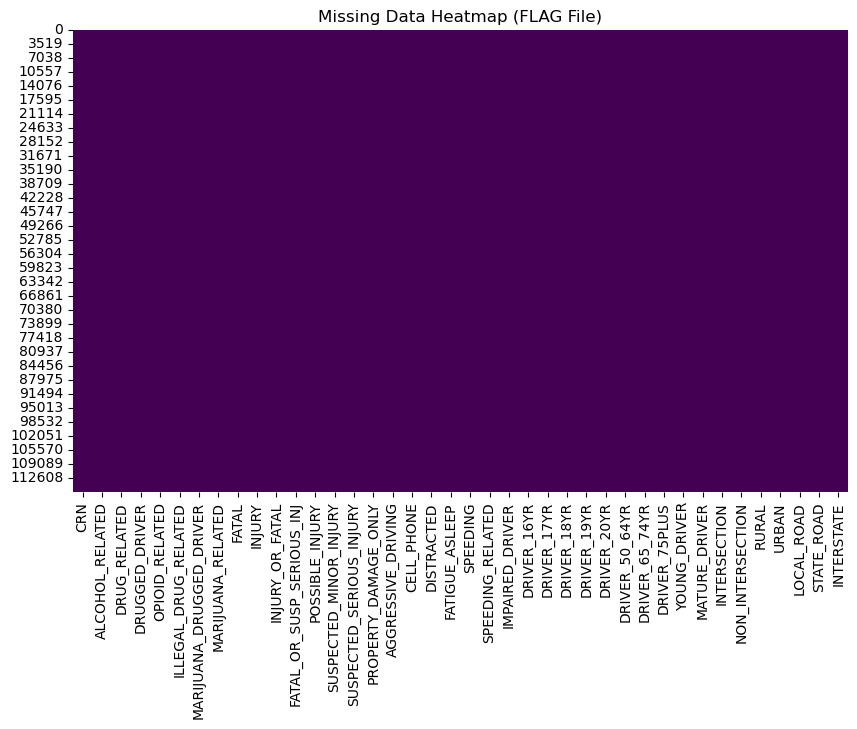


Number of duplicate rows: 0

Redundant columns (constant values): []
Standardizing boolean field: ALCOHOL_RELATED
New unique values in ALCOHOL_RELATED: [0 1]
Standardizing boolean field: DRUG_RELATED
New unique values in DRUG_RELATED: [0 1]
Standardizing boolean field: DRUGGED_DRIVER
New unique values in DRUGGED_DRIVER: [0 1]
Standardizing boolean field: OPIOID_RELATED
New unique values in OPIOID_RELATED: [0 1]
Standardizing boolean field: ILLEGAL_DRUG_RELATED
New unique values in ILLEGAL_DRUG_RELATED: [0 1]
Standardizing boolean field: MARIJUANA_DRUGGED_DRIVER
New unique values in MARIJUANA_DRUGGED_DRIVER: [0 1]
Standardizing boolean field: MARIJUANA_RELATED
New unique values in MARIJUANA_RELATED: [0 1]
Standardizing boolean field: FATAL
New unique values in FATAL: [0 1]
Standardizing boolean field: INJURY
New unique values in INJURY: [0 1]
Standardizing boolean field: INJURY_OR_FATAL
New unique values in INJURY_OR_FATAL: [0 1]
Standardizing boolean field: FATAL_OR_SUSP_SERIOUS_INJ
N

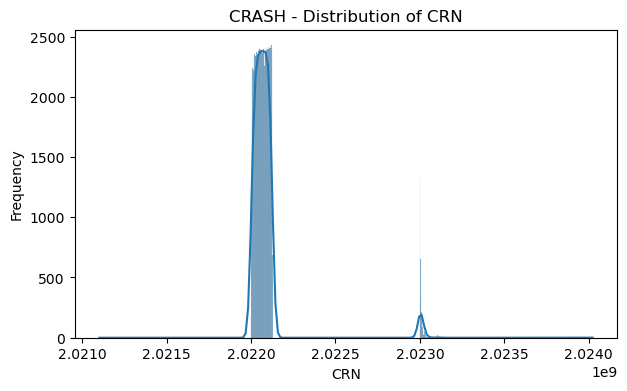

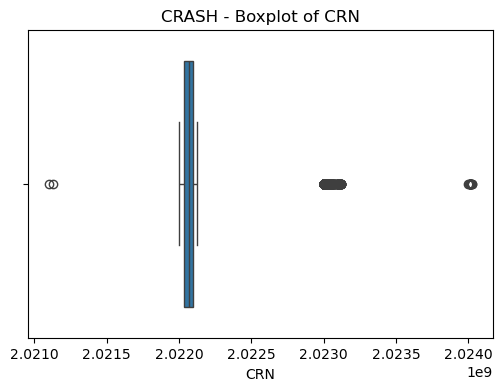

<Figure size 600x500 with 0 Axes>

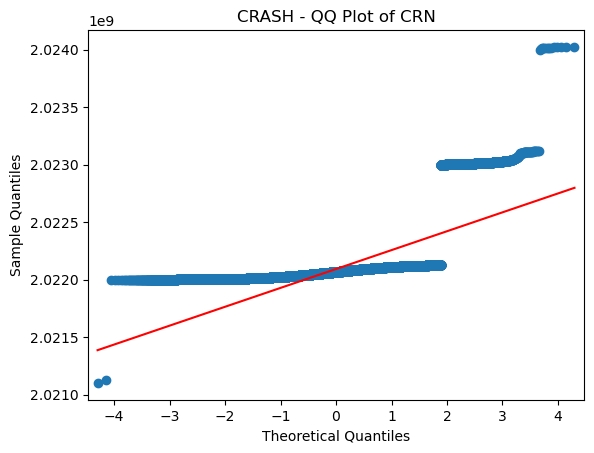


[CRASH] Numeric Column: CRASH_MONTH
  Count: 116118
  Skewness: -0.07
  Kurtosis: -1.26


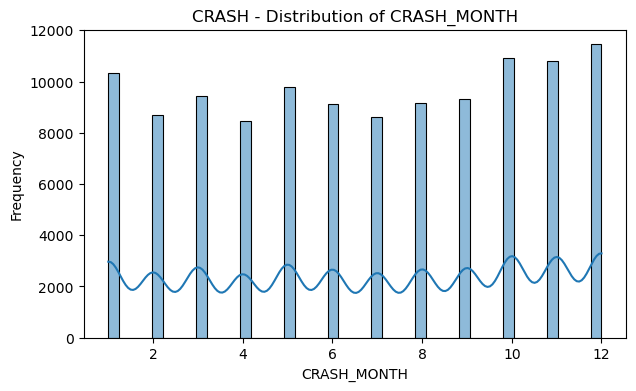

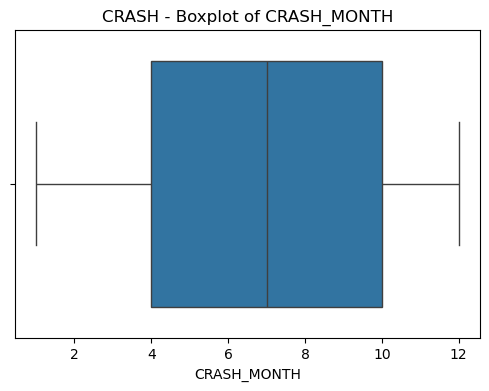

<Figure size 600x500 with 0 Axes>

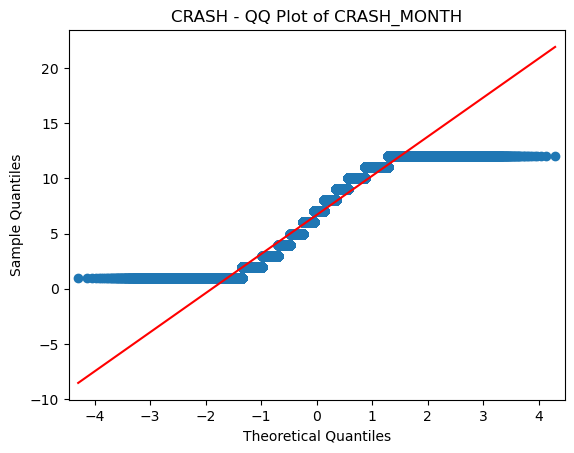

C:\Users\jason\AppData\Local\Temp\ipykernel_22248\2537165921.py:17: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  sk = skew(col_data)
C:\Users\jason\AppData\Local\Temp\ipykernel_22248\2537165921.py:18: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kt = kurtosis(col_data)



[CRASH] Numeric Column: CRASH_YEAR
  Count: 116118
  Skewness: nan
  Kurtosis: nan


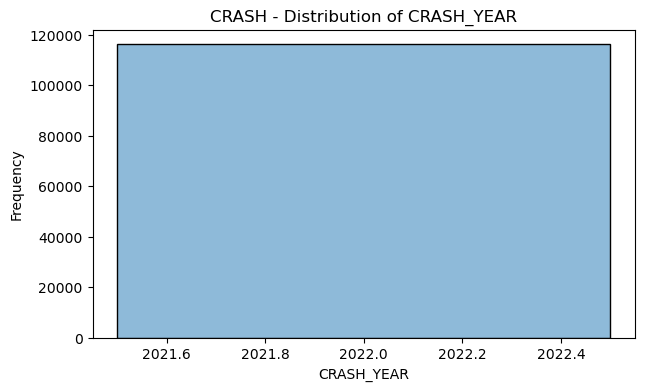

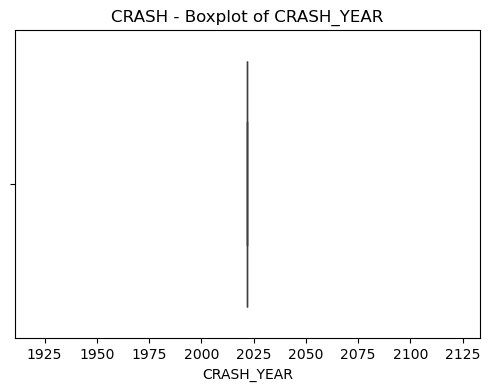

<Figure size 600x500 with 0 Axes>

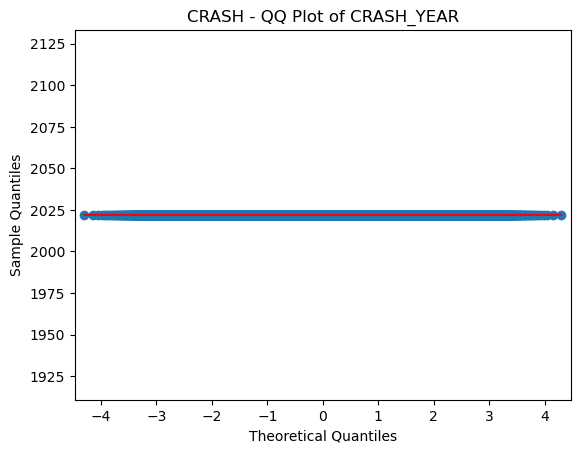


[CRASH] Numeric Column: DAY_OF_WEEK
  Count: 116118
  Skewness: -0.11
  Kurtosis: -1.23


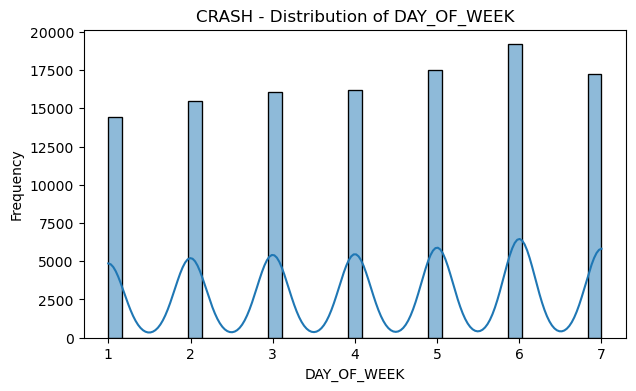

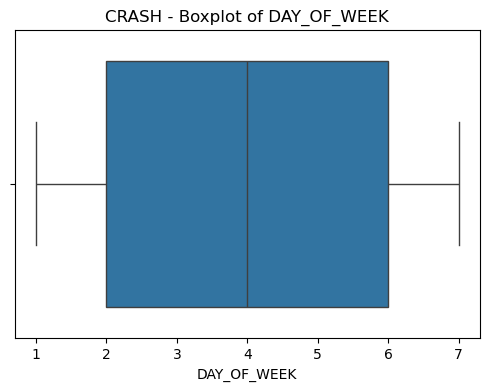

<Figure size 600x500 with 0 Axes>

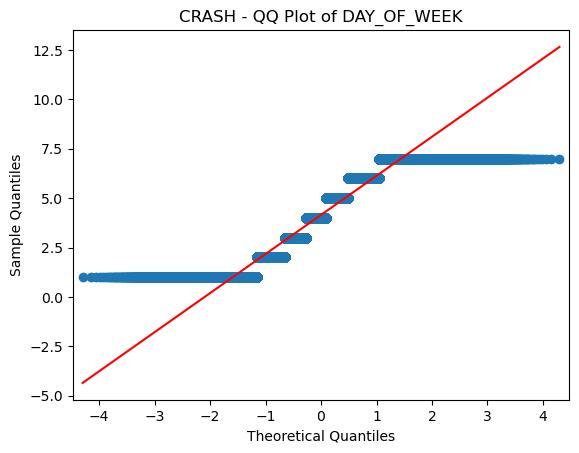


[CRASH] Numeric Column: HOUR_OF_DAY
  Count: 116117
  Skewness: 2.67
  Kurtosis: 35.81


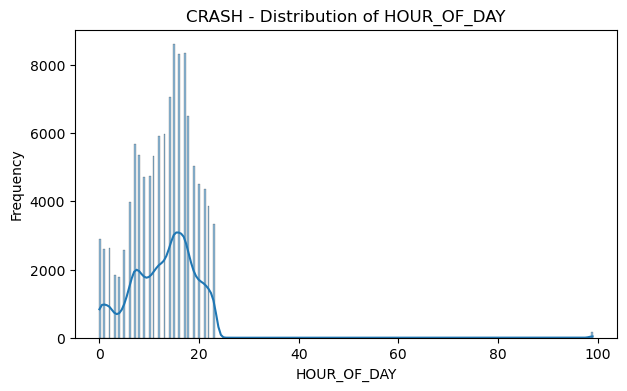

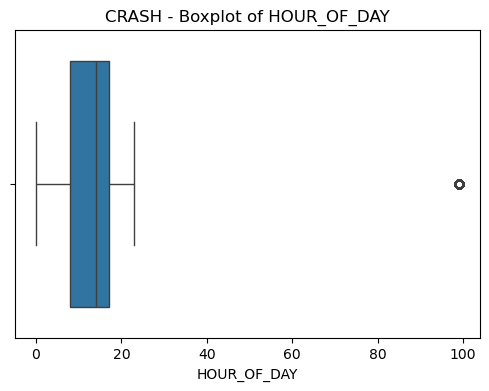

<Figure size 600x500 with 0 Axes>

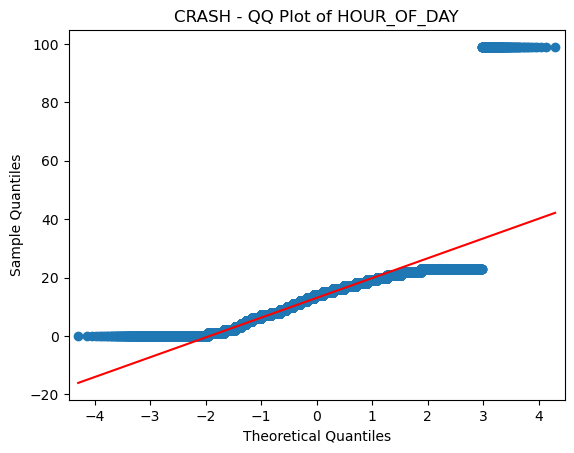


[CRASH] Numeric Column: COUNTY
  Count: 116118
  Skewness: 0.16
  Kurtosis: -1.20


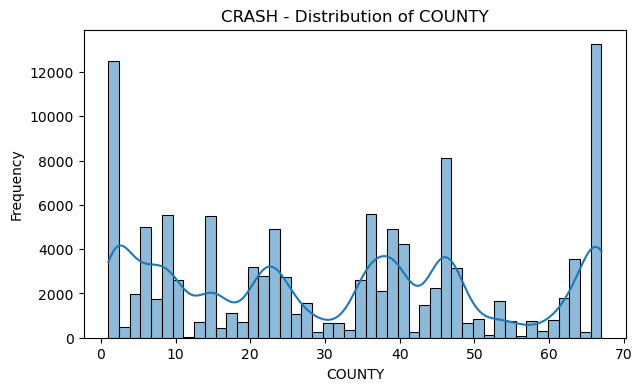

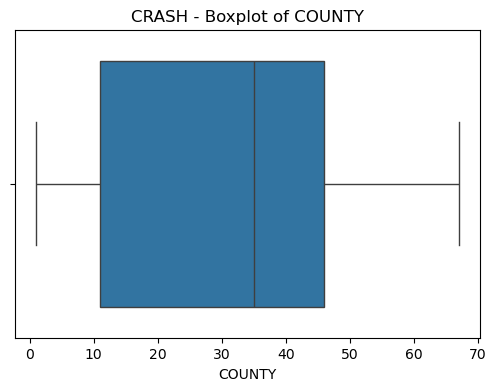

<Figure size 600x500 with 0 Axes>

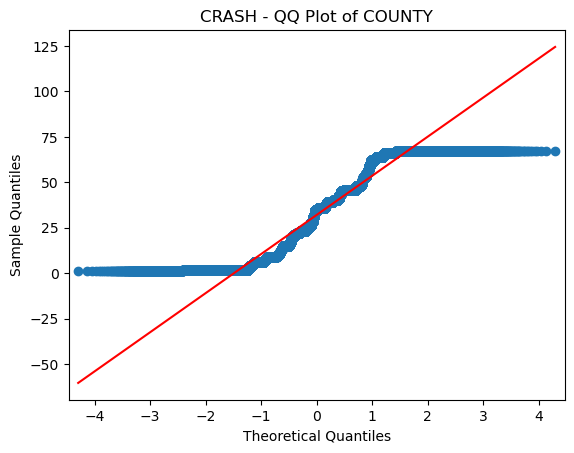


[CRASH] Numeric Column: MUNICIPALITY
  Count: 116118
  Skewness: 0.16
  Kurtosis: -1.20


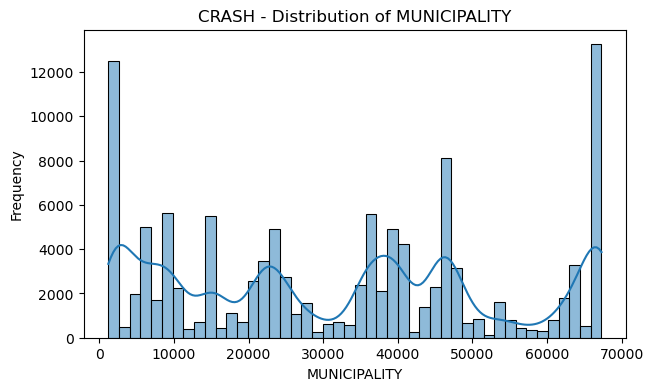

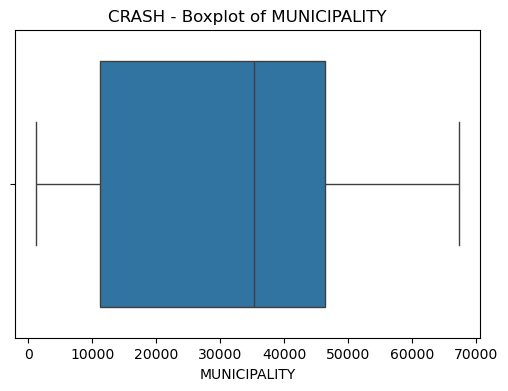

<Figure size 600x500 with 0 Axes>

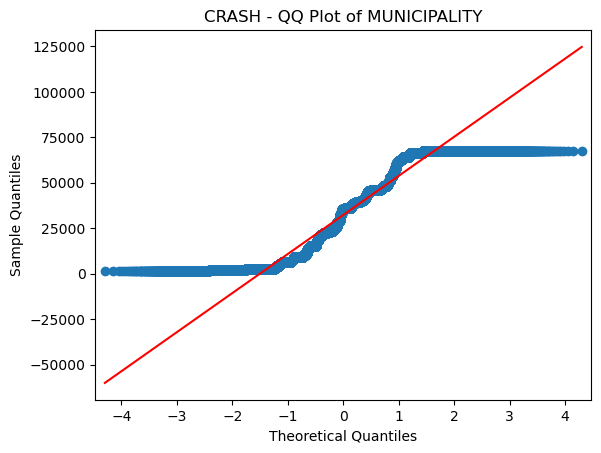


[CRASH] Numeric Column: DISTRICT
  Count: 116118
  Skewness: 0.12
  Kurtosis: -0.56


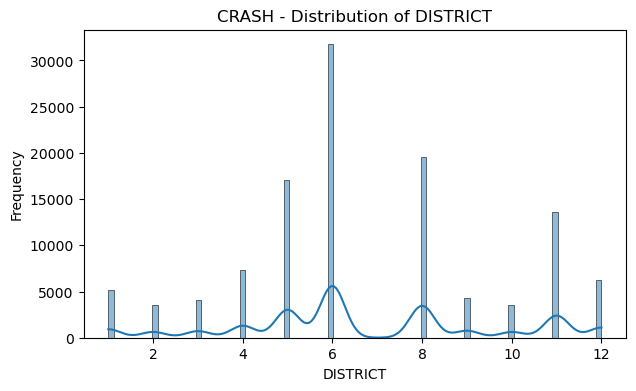

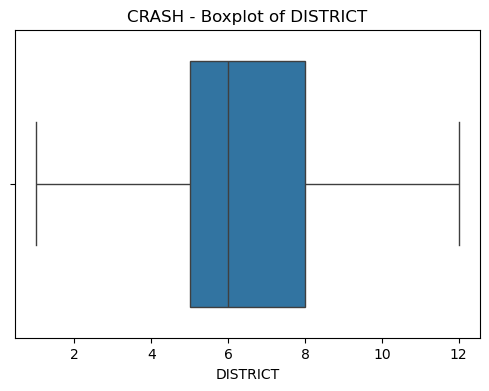

<Figure size 600x500 with 0 Axes>

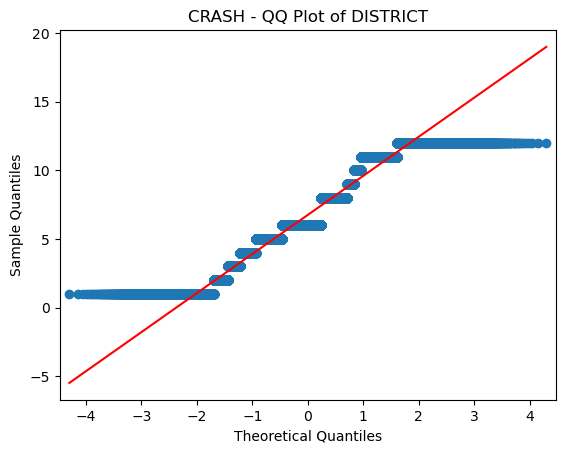


[CRASH] Numeric Column: DEC_LAT
  Count: 115906
  Skewness: 1.18
  Kurtosis: 0.96


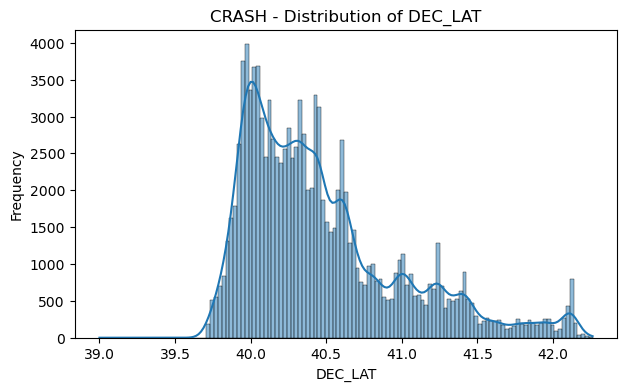

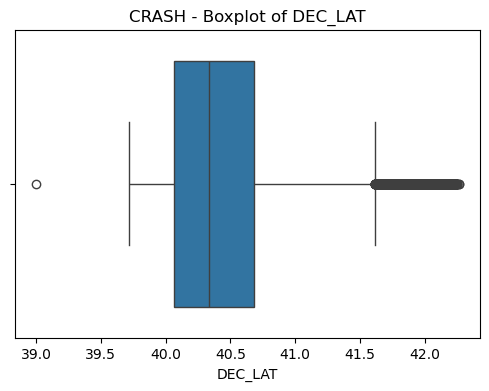

<Figure size 600x500 with 0 Axes>

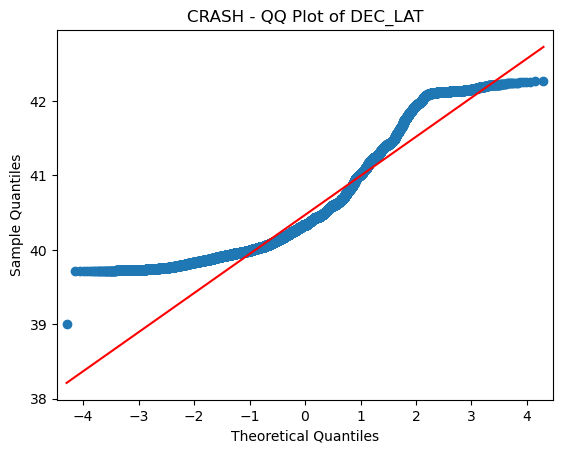


[CRASH] Numeric Column: DEC_LONG
  Count: 115909
  Skewness: -0.67
  Kurtosis: -1.15


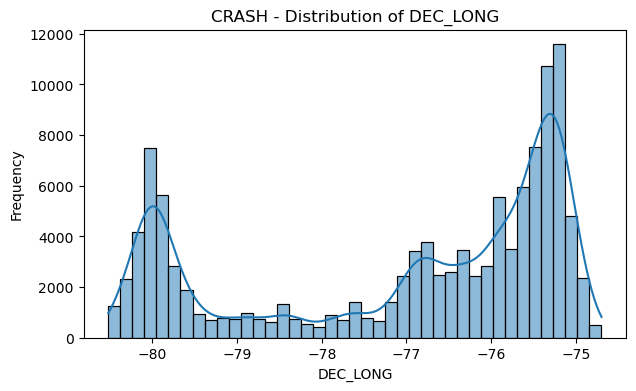

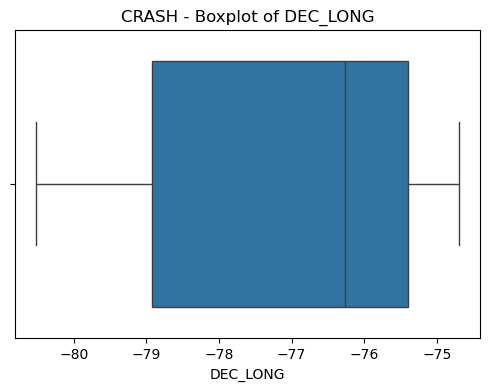

<Figure size 600x500 with 0 Axes>

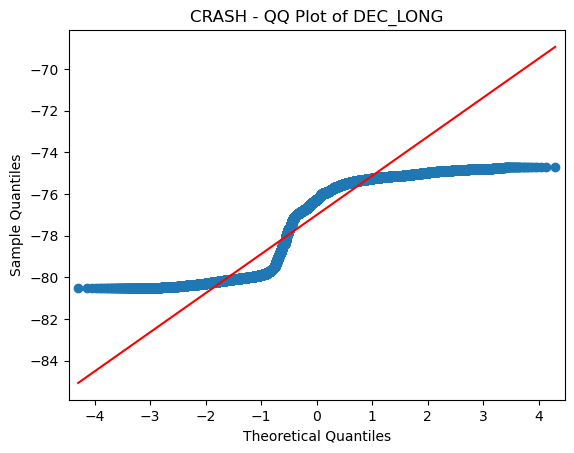


[CRASH] Numeric Column: MAX_SEVERITY_LEVEL
  Count: 116118
  Skewness: 1.24
  Kurtosis: 0.44


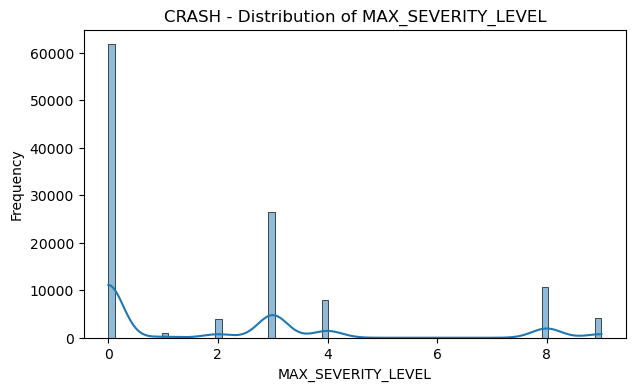

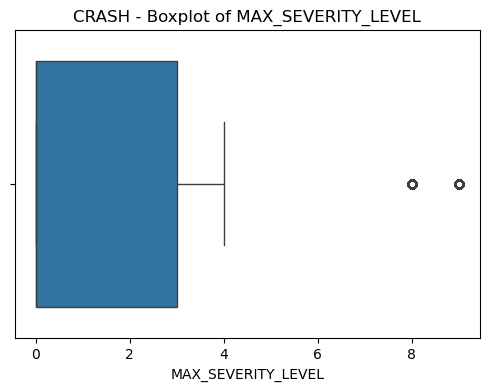

<Figure size 600x500 with 0 Axes>

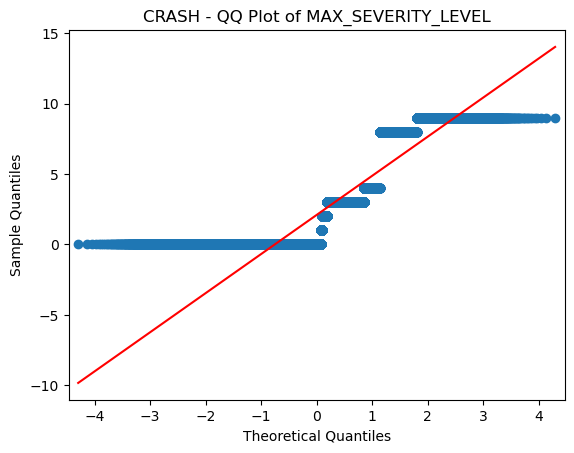


[CRASH] Numeric Column: COLLISION_TYPE
  Count: 116118
  Skewness: 4.21
  Kurtosis: 16.08


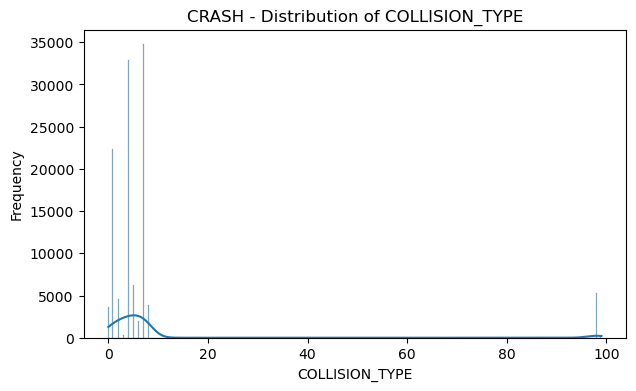

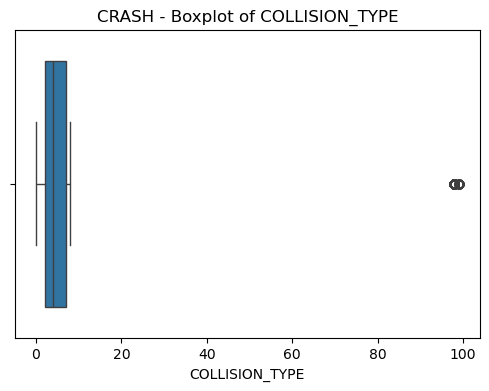

<Figure size 600x500 with 0 Axes>

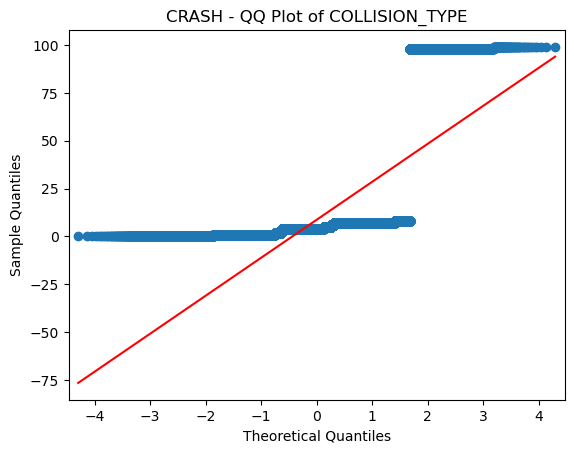


[CRASH] Numeric Column: RELATION_TO_ROAD
  Count: 116118
  Skewness: 1.18
  Kurtosis: 0.07


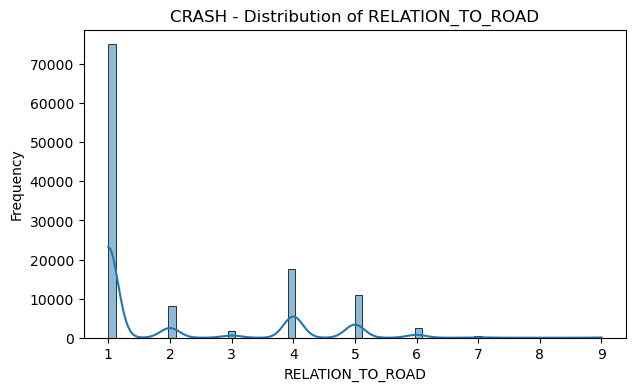

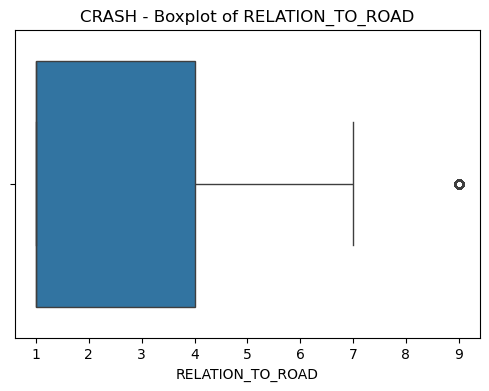

<Figure size 600x500 with 0 Axes>

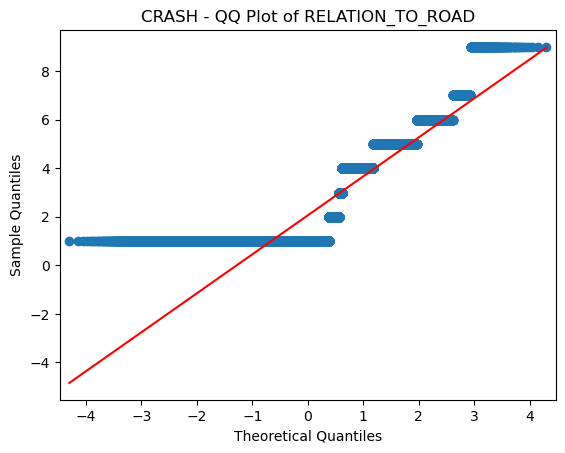


[CRASH] Numeric Column: ROAD_CONDITION
  Count: 116118
  Skewness: 11.19
  Kurtosis: 151.07


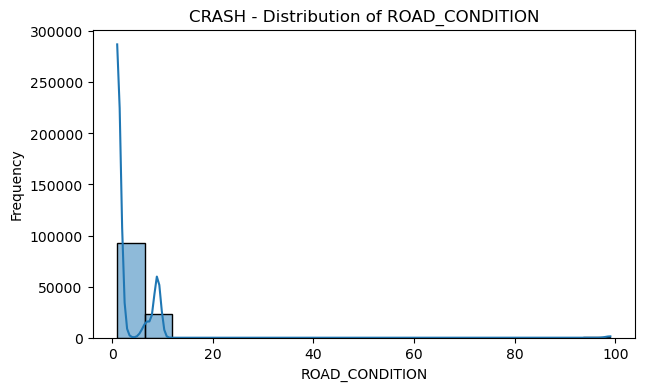

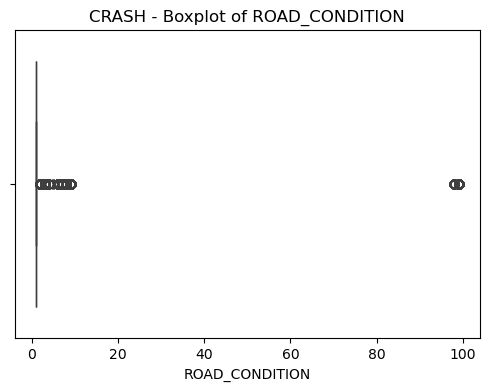

<Figure size 600x500 with 0 Axes>

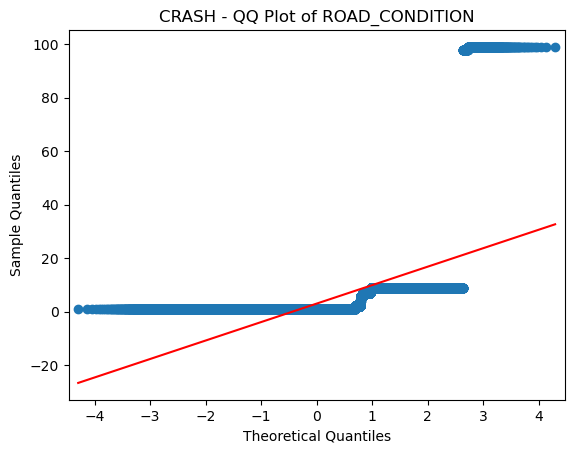


[CRASH] Numeric Column: ILLUMINATION
  Count: 116118
  Skewness: 1.78
  Kurtosis: 4.15


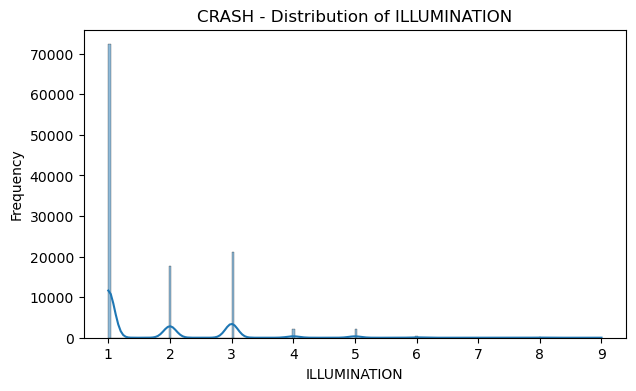

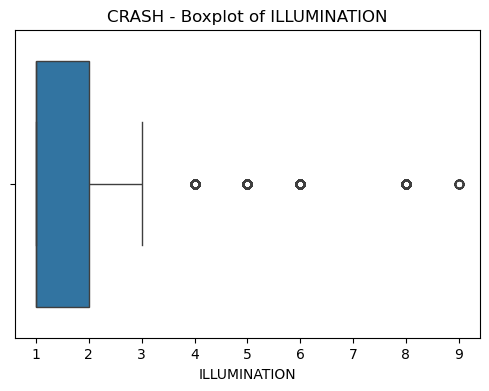

<Figure size 600x500 with 0 Axes>

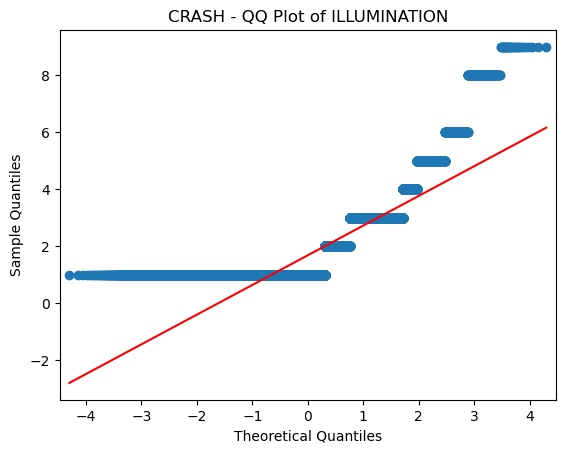


[CRASH] Numeric Column: URBAN_RURAL
  Count: 116118
  Skewness: -0.82
  Kurtosis: -1.32


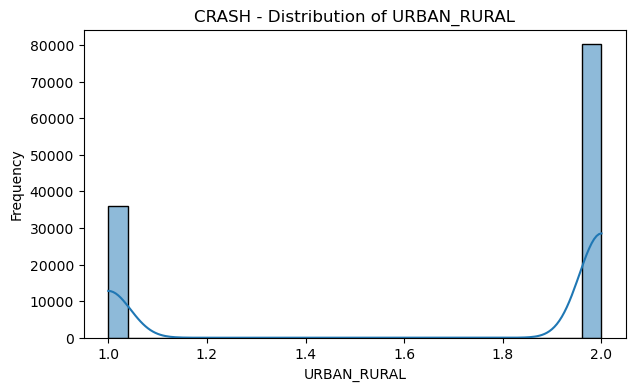

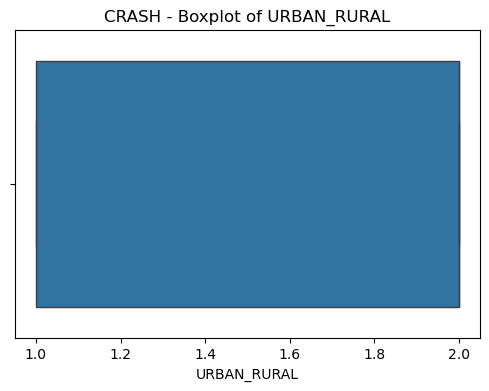

<Figure size 600x500 with 0 Axes>

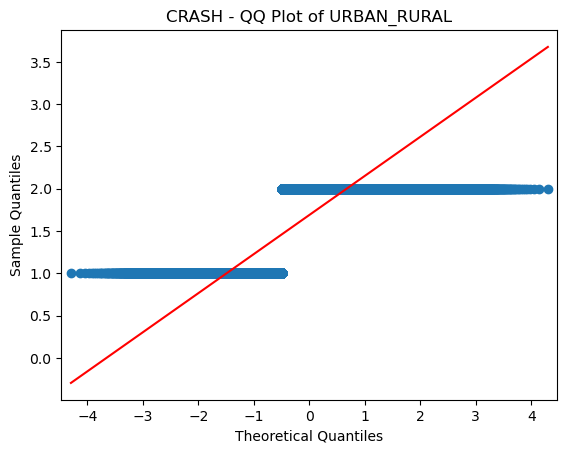


[CRASH] Numeric Column: DRIVER_COUNT_16YR
  Count: 116118
  Skewness: 7.82
  Kurtosis: 62.67


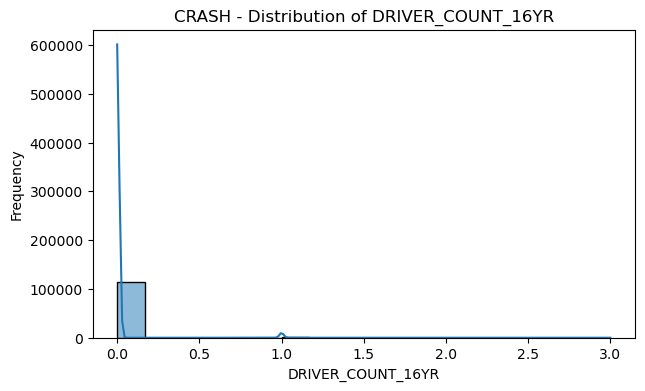

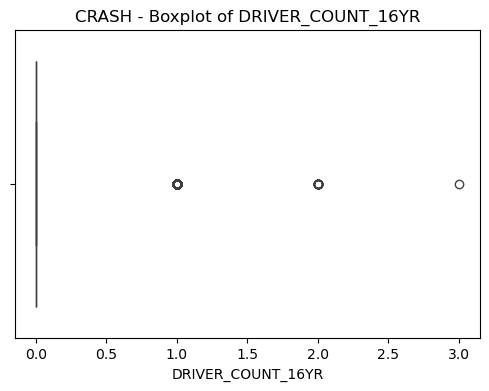

<Figure size 600x500 with 0 Axes>

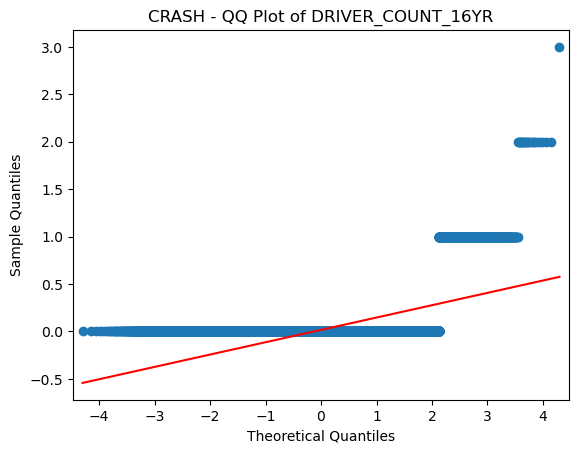


[CRASH] Numeric Column: DRIVER_COUNT_17YR
  Count: 116118
  Skewness: 5.14
  Kurtosis: 27.24


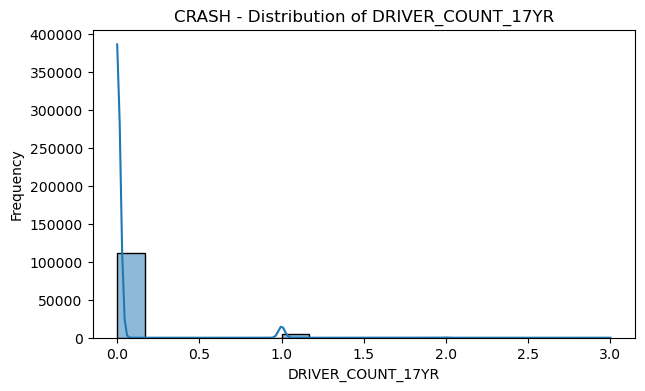

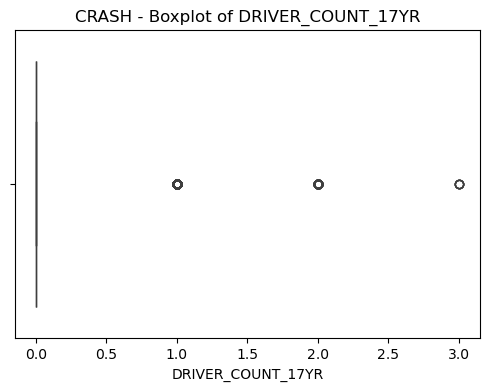

<Figure size 600x500 with 0 Axes>

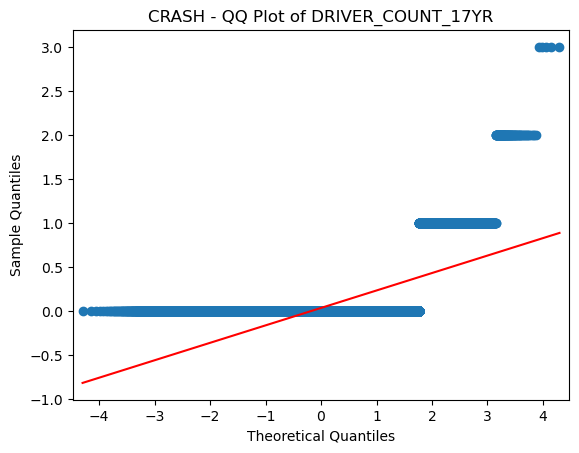


[CRASH] Numeric Column: DRIVER_COUNT_18YR
  Count: 116118
  Skewness: 4.67
  Kurtosis: 22.61


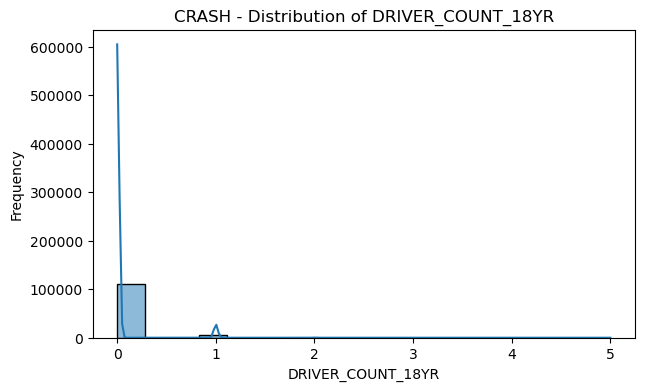

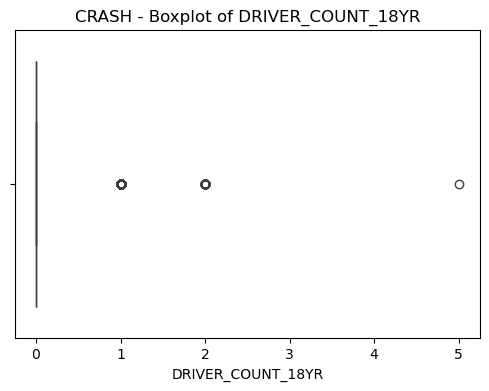

<Figure size 600x500 with 0 Axes>

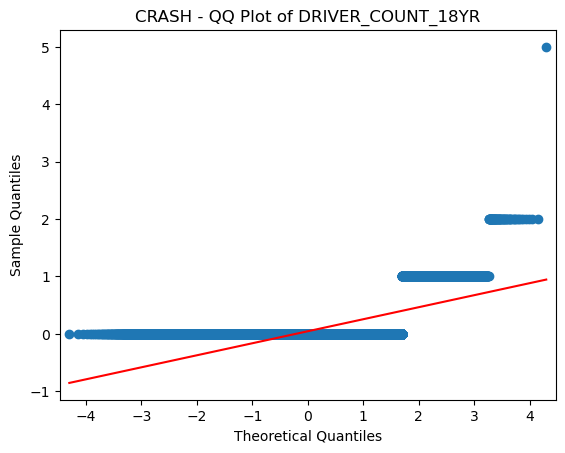


[CRASH] Numeric Column: DRIVER_COUNT_19YR
  Count: 116118
  Skewness: 4.70
  Kurtosis: 21.13


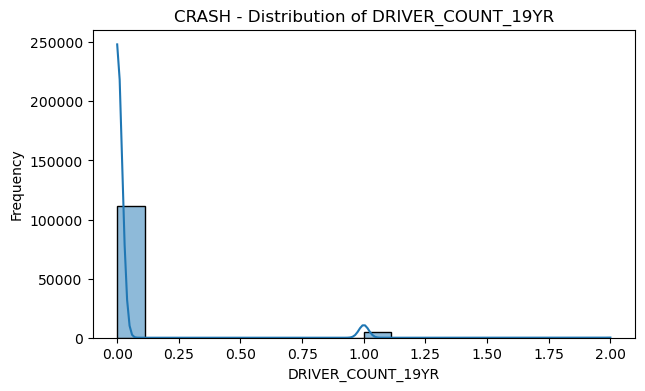

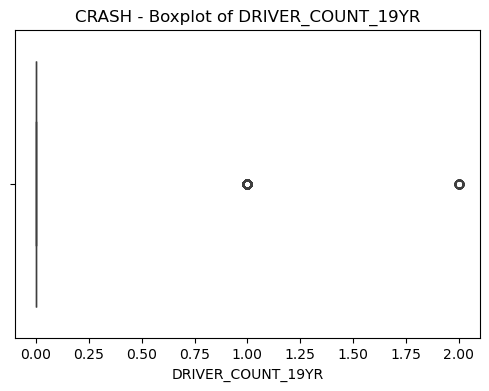

<Figure size 600x500 with 0 Axes>

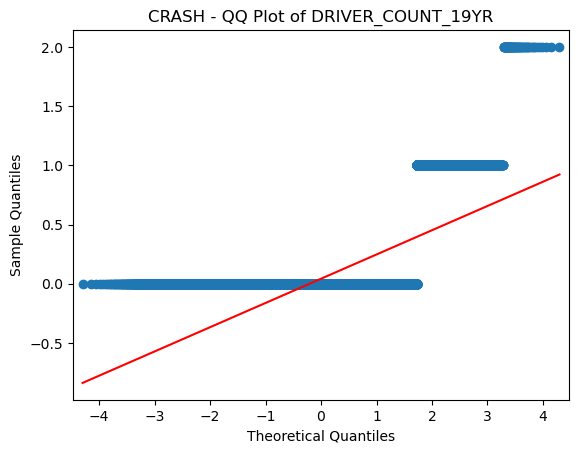


[CRASH] Numeric Column: DRIVER_COUNT_20YR
  Count: 116118
  Skewness: 4.74
  Kurtosis: 21.88


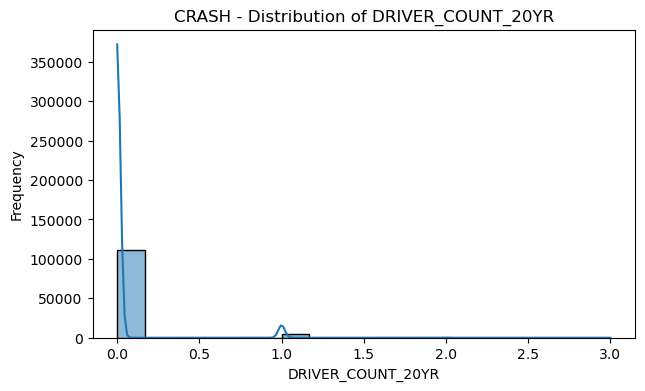

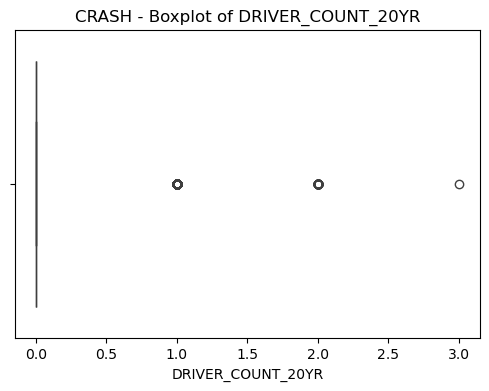

<Figure size 600x500 with 0 Axes>

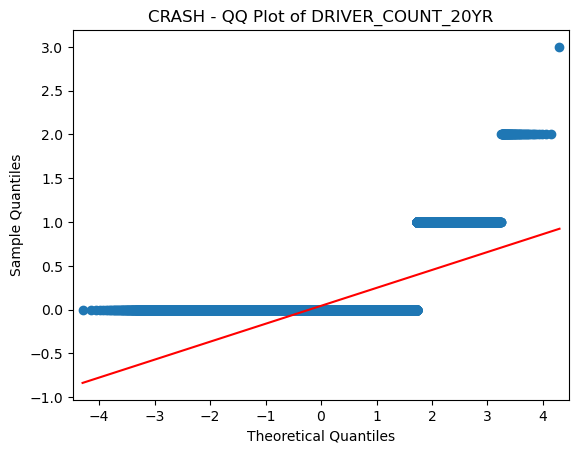


[CRASH] Numeric Column: DRIVER_COUNT_50_64YR
  Count: 116118
  Skewness: 1.63
  Kurtosis: 3.35


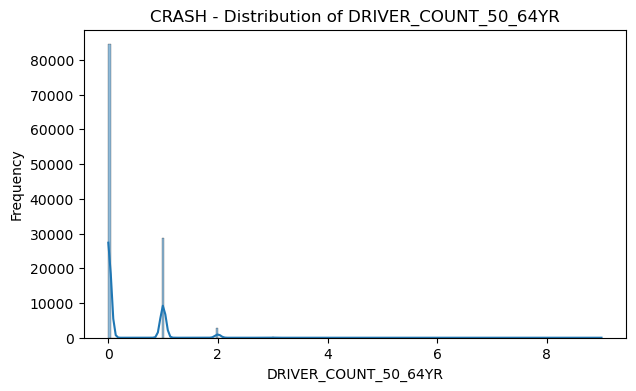

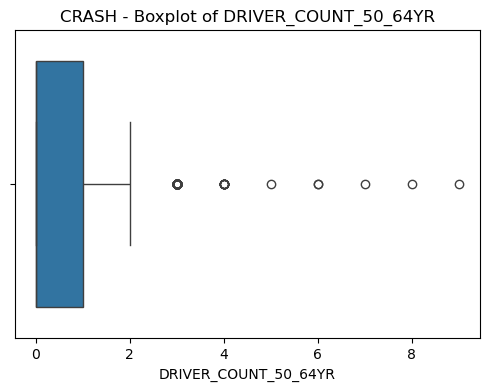

<Figure size 600x500 with 0 Axes>

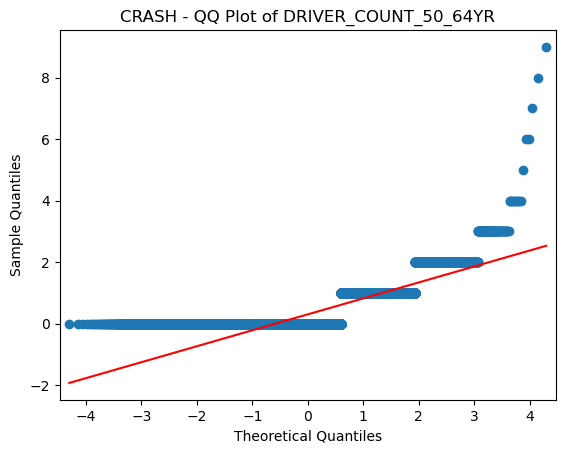


[CRASH] Numeric Column: DRIVER_COUNT_65_74YR
  Count: 116118
  Skewness: 2.78
  Kurtosis: 7.42


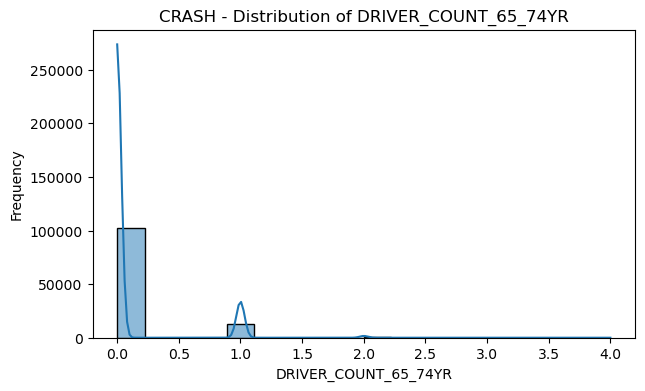

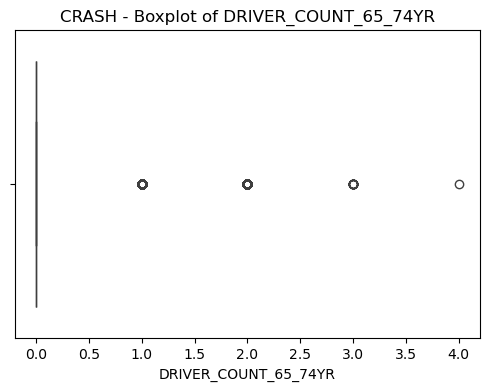

<Figure size 600x500 with 0 Axes>

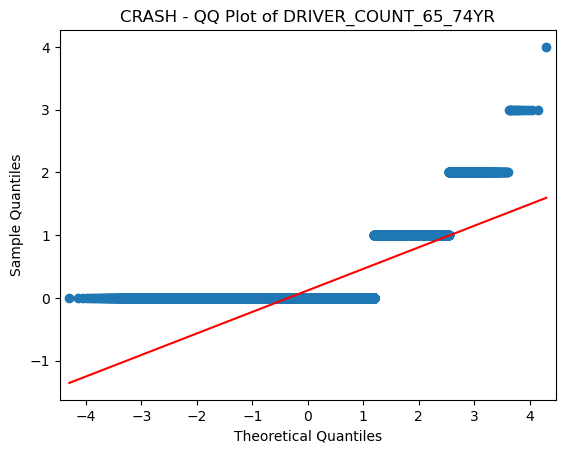


[CRASH] Numeric Column: DRIVER_COUNT_75PLUS
  Count: 116118
  Skewness: 3.69
  Kurtosis: 13.36


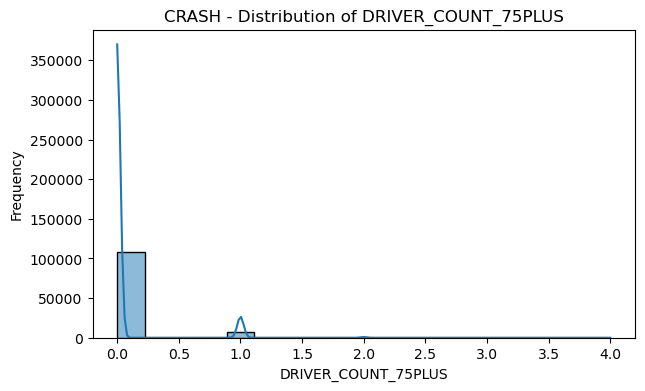

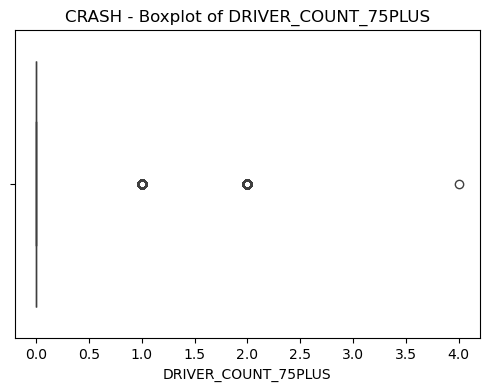

<Figure size 600x500 with 0 Axes>

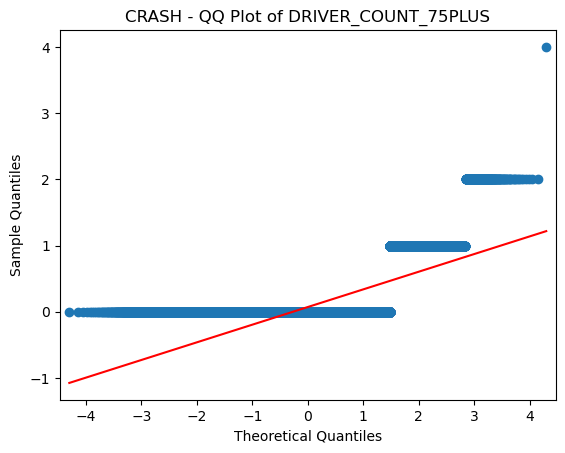


[CRASH] Numeric Column: FATAL_COUNT
  Count: 116118
  Skewness: 13.79
  Kurtosis: 289.81


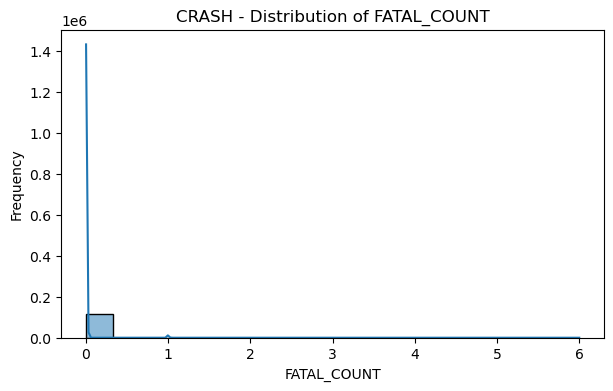

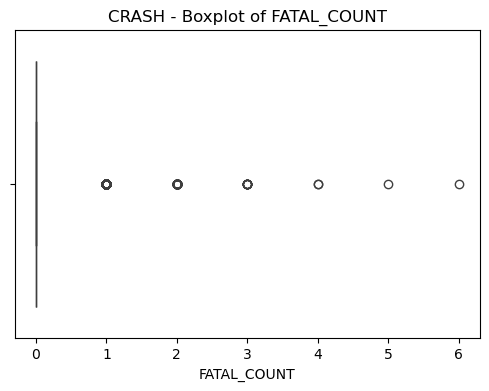

<Figure size 600x500 with 0 Axes>

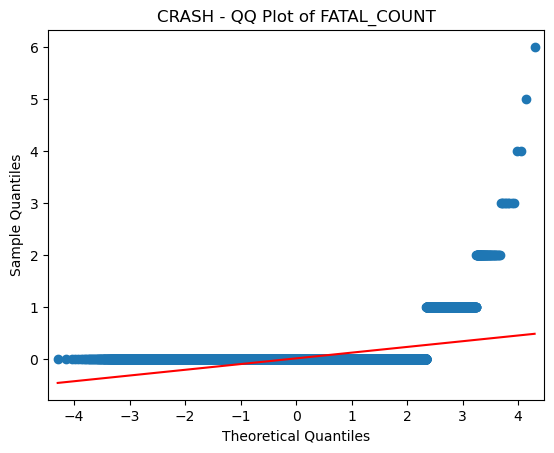


[CRASH] Numeric Column: INJURY_COUNT
  Count: 116118
  Skewness: 2.42
  Kurtosis: 15.13


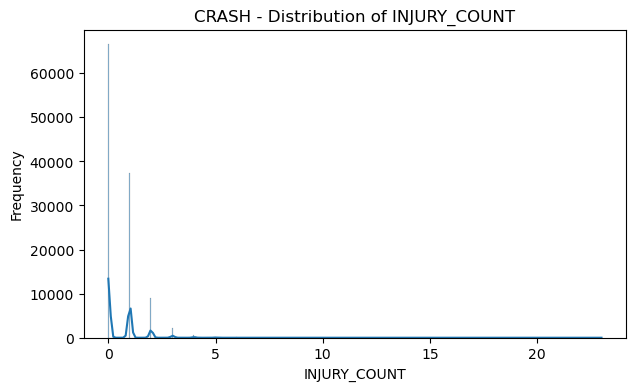

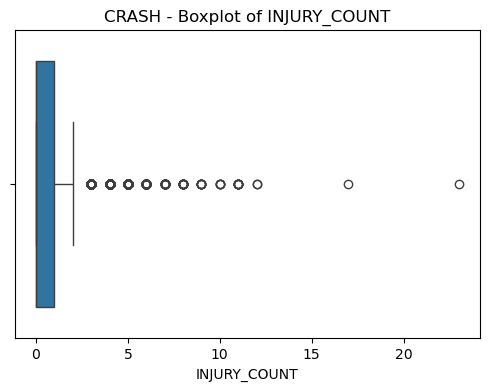

<Figure size 600x500 with 0 Axes>

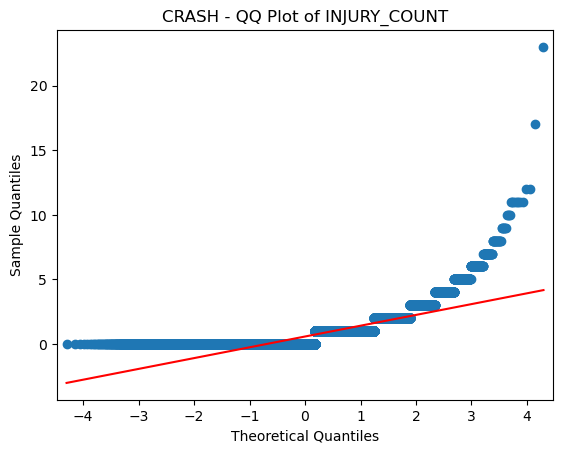


[CRASH] Numeric Column: TOT_INJ_COUNT
  Count: 116118
  Skewness: 2.42
  Kurtosis: 15.13


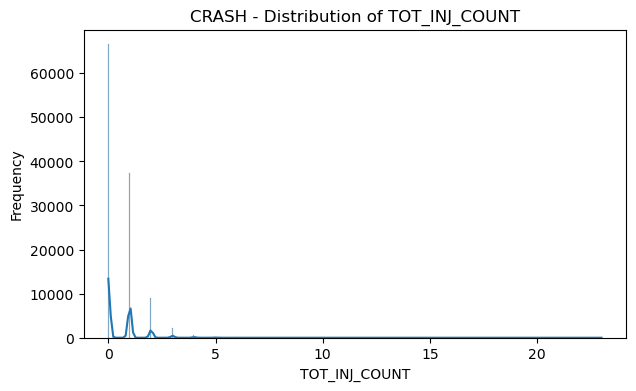

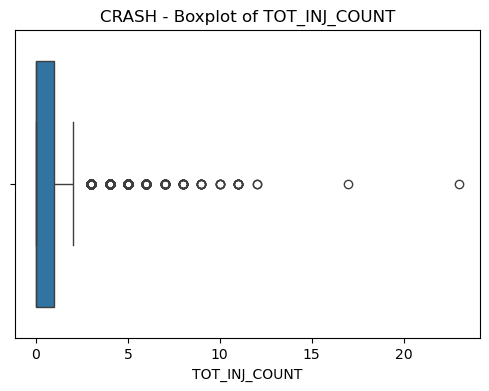

<Figure size 600x500 with 0 Axes>

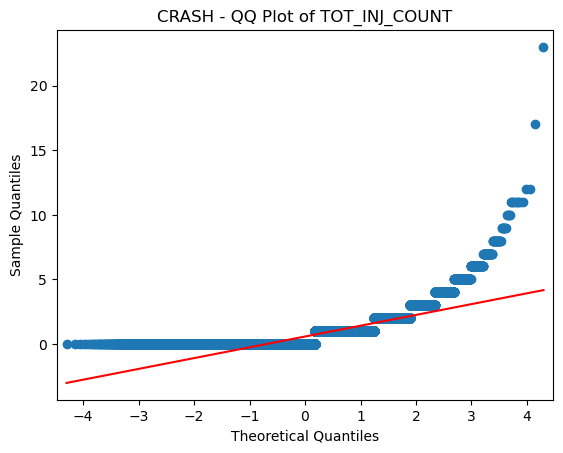


[CRASH] Numeric Column: VEHICLE_COUNT
  Count: 116118
  Skewness: 2.41
  Kurtosis: 31.08


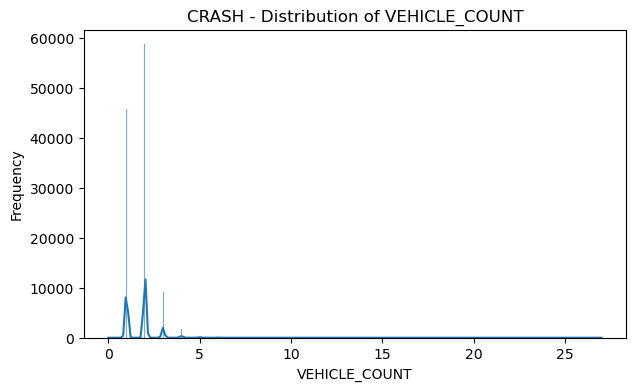

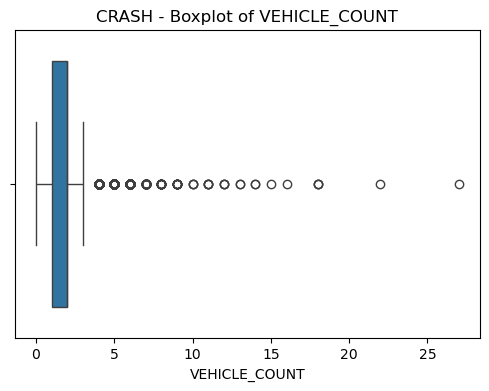

<Figure size 600x500 with 0 Axes>

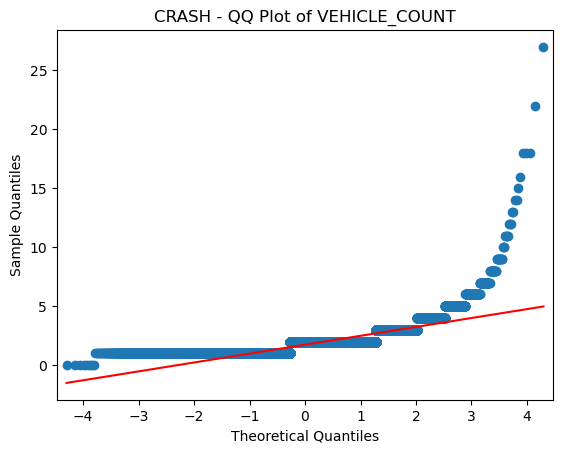


[CRASH] Numeric Column: TOTAL_UNITS
  Count: 116118
  Skewness: 2.40
  Kurtosis: 31.87


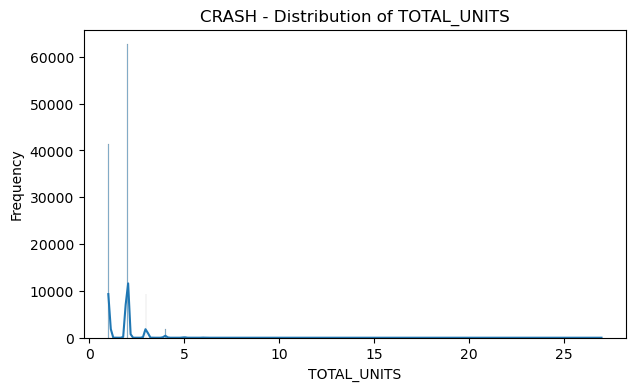

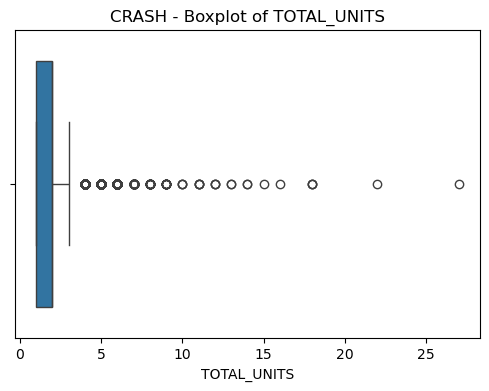

<Figure size 600x500 with 0 Axes>

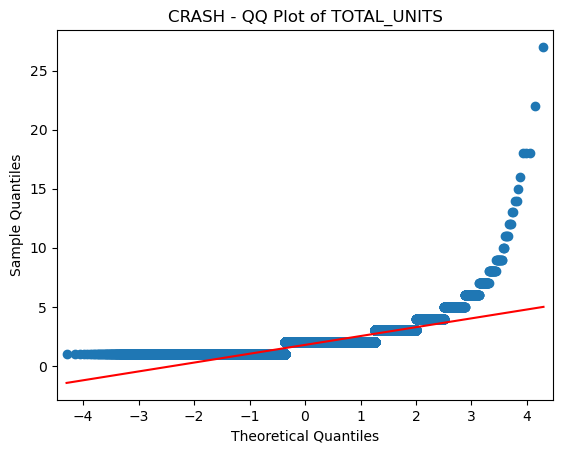


[CRASH] Numeric Column: AUTOMOBILE_COUNT
  Count: 116118
  Skewness: 0.80
  Kurtosis: 1.12


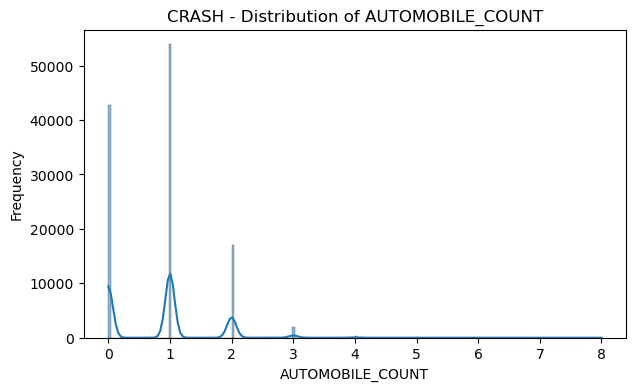

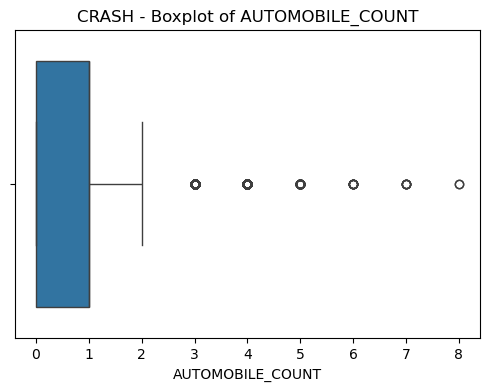

<Figure size 600x500 with 0 Axes>

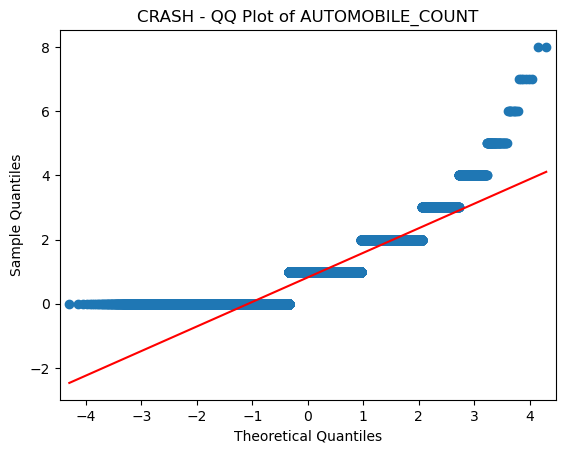


[CRASH] Numeric Column: BICYCLE_COUNT
  Count: 116118
  Skewness: 12.00
  Kurtosis: 145.26


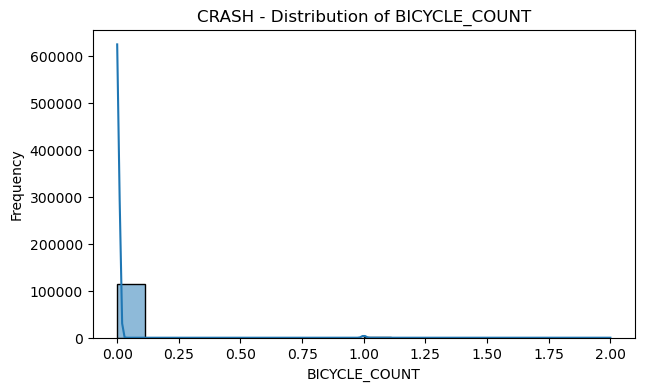

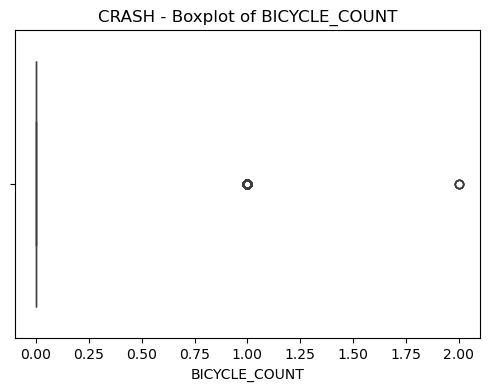

<Figure size 600x500 with 0 Axes>

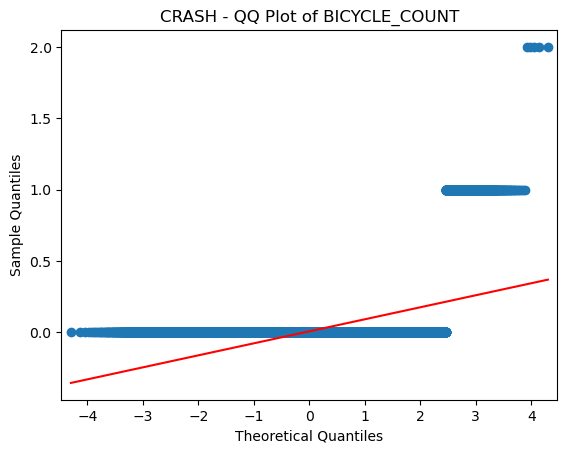


[CRASH] Numeric Column: BUS_COUNT
  Count: 116118
  Skewness: 12.85
  Kurtosis: 171.24


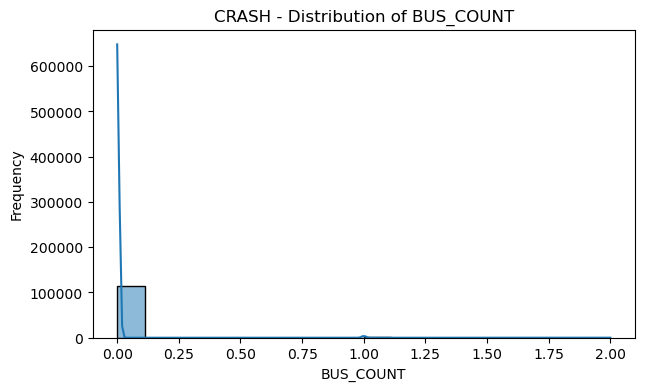

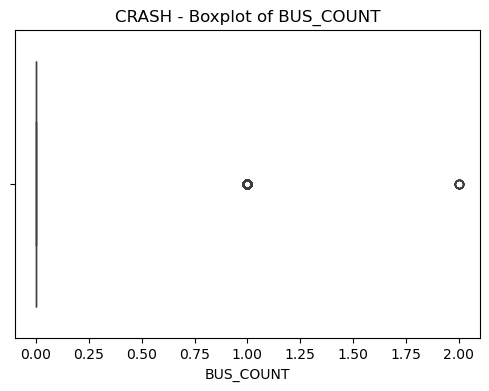

<Figure size 600x500 with 0 Axes>

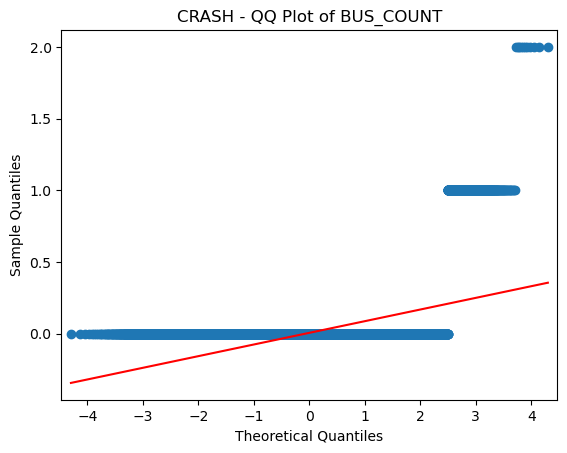


[CRASH] Numeric Column: COMM_VEH_COUNT
  Count: 116118
  Skewness: 5.28
  Kurtosis: 62.08


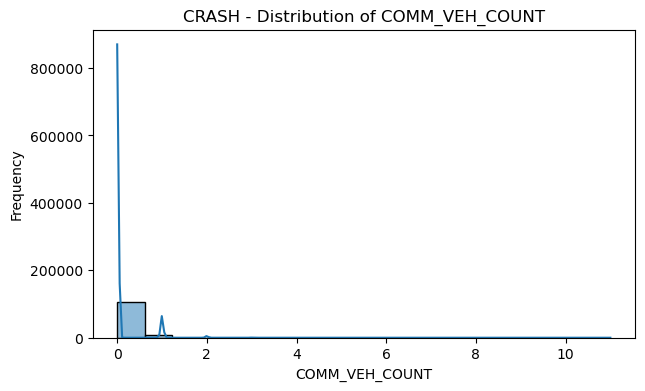

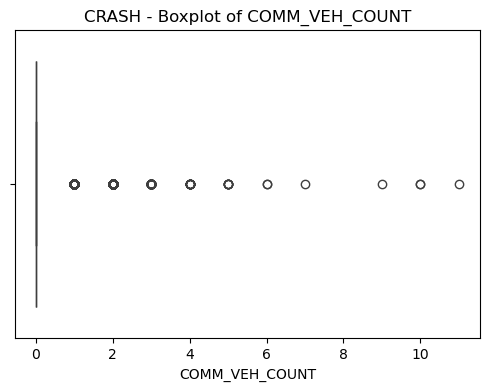

<Figure size 600x500 with 0 Axes>

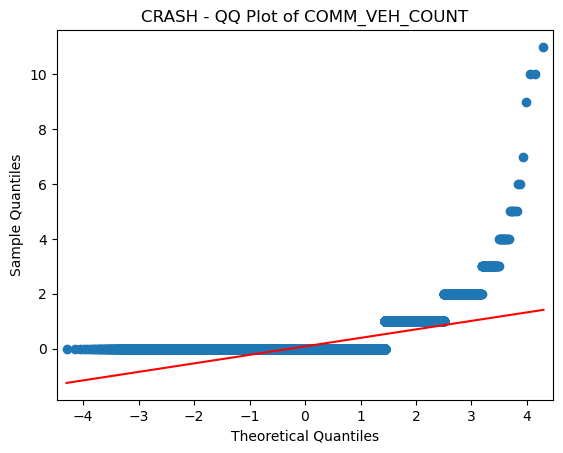


[CRASH] Numeric Column: HEAVY_TRUCK_COUNT
  Count: 116118
  Skewness: 5.53
  Kurtosis: 64.99


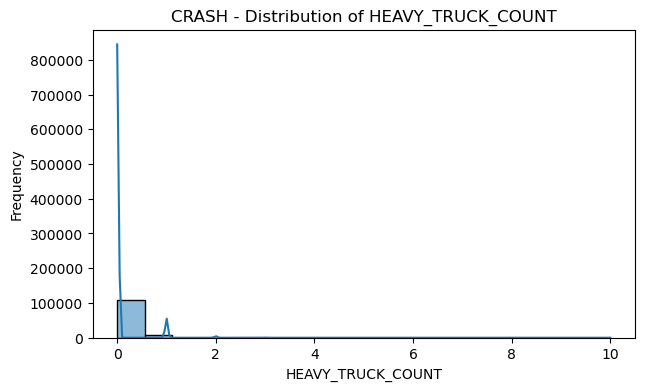

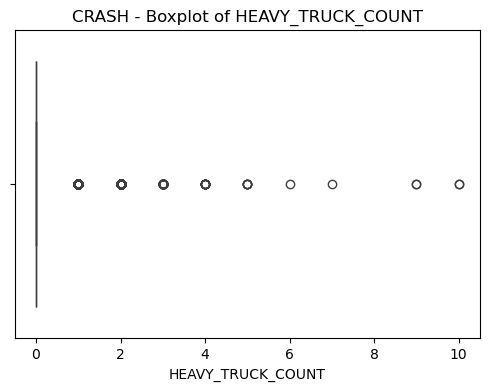

<Figure size 600x500 with 0 Axes>

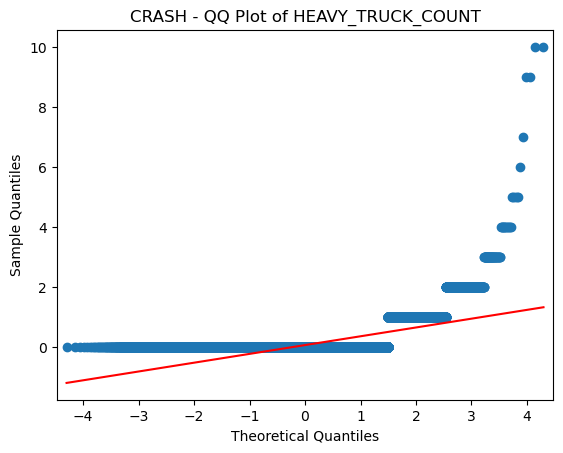


[CRASH] Numeric Column: MOTORCYCLE_COUNT
  Count: 116118
  Skewness: 6.76
  Kurtosis: 76.11


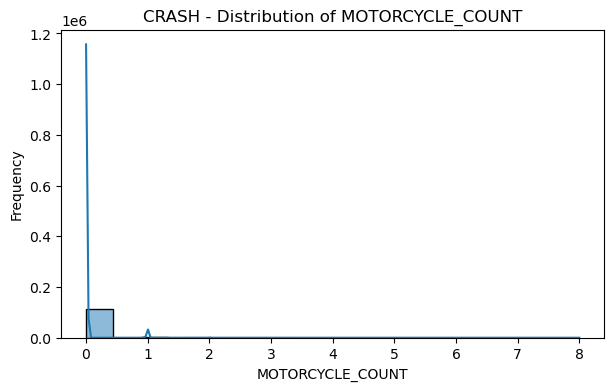

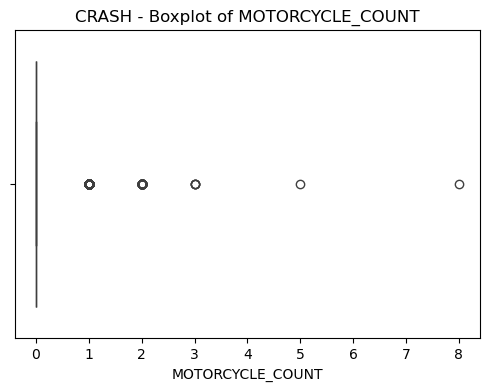

<Figure size 600x500 with 0 Axes>

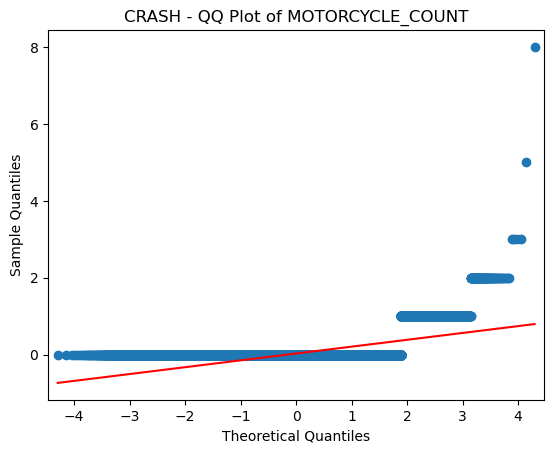


[CRASH] Numeric Column: SMALL_TRUCK_COUNT
  Count: 116118
  Skewness: 2.29
  Kurtosis: 5.08


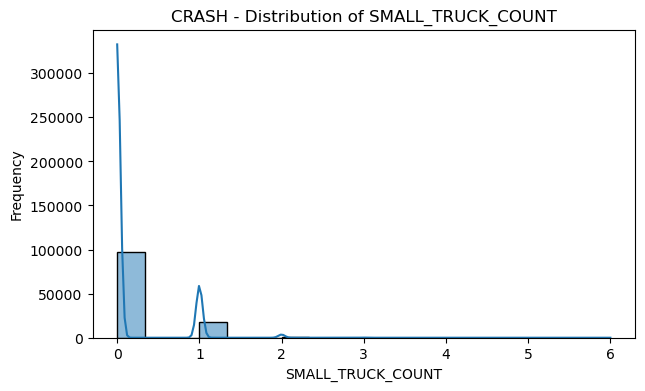

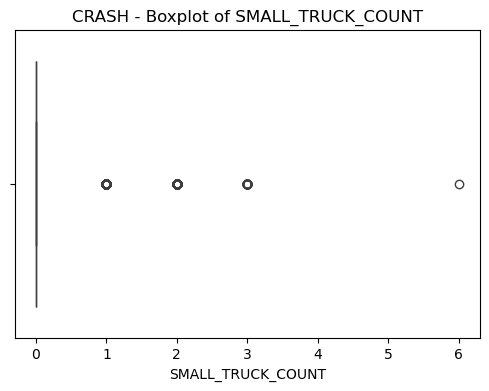

<Figure size 600x500 with 0 Axes>

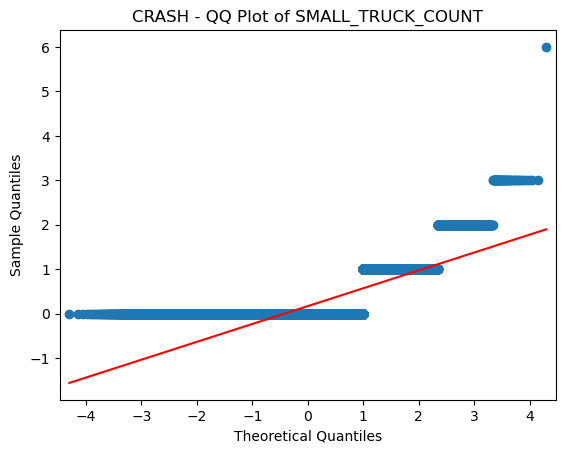


[CRASH] Numeric Column: SUV_COUNT
  Count: 116118
  Skewness: 1.10
  Kurtosis: 1.28


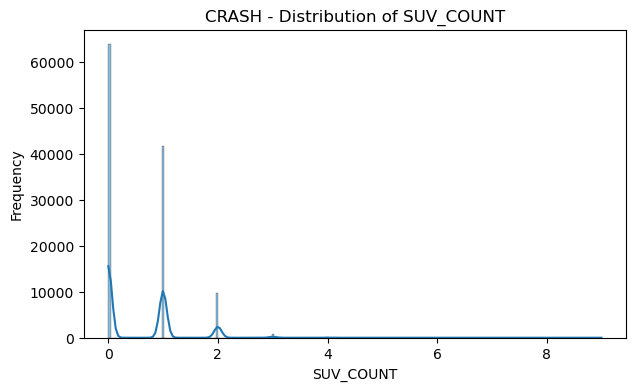

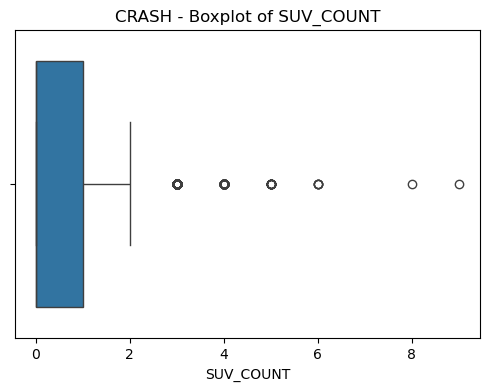

<Figure size 600x500 with 0 Axes>

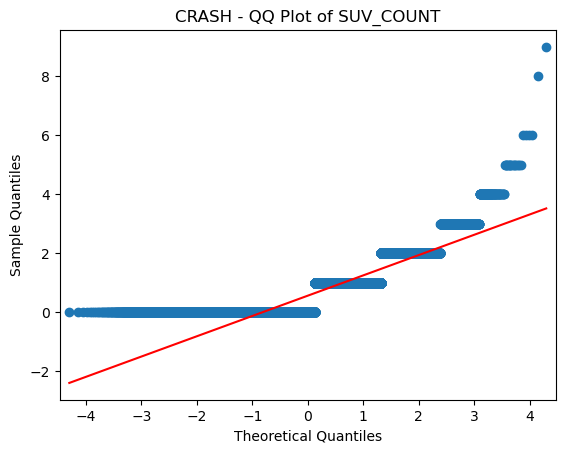


[CRASH] Numeric Column: VAN_COUNT
  Count: 116118
  Skewness: 4.00
  Kurtosis: 16.33


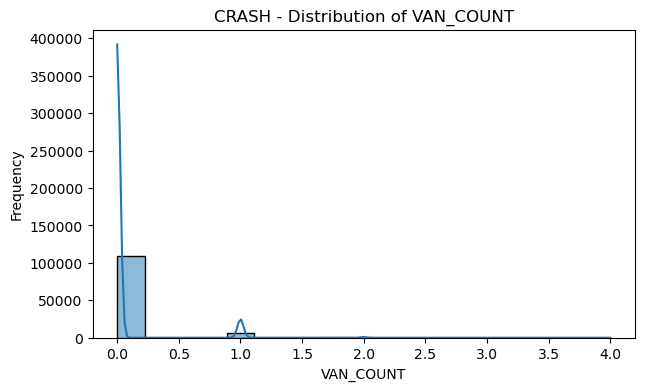

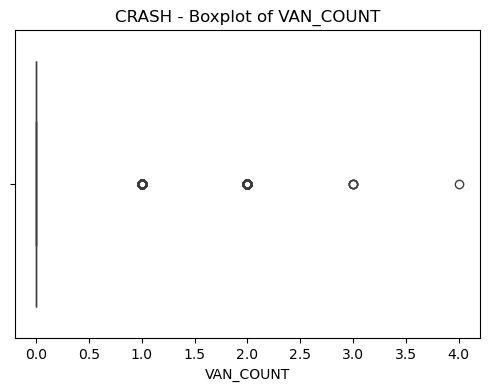

<Figure size 600x500 with 0 Axes>

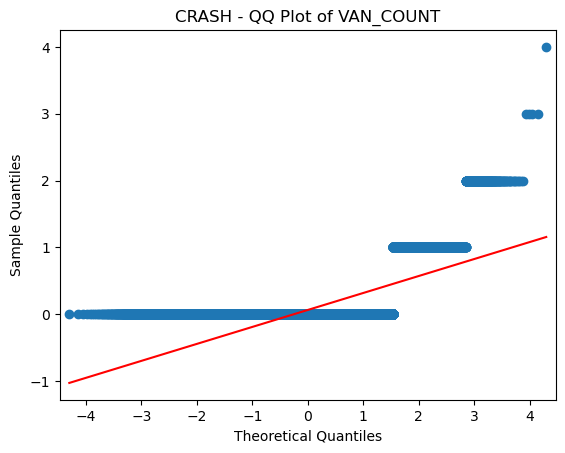


[CRASH] Numeric Column: PERSON_COUNT
  Count: 116118
  Skewness: 8.85
  Kurtosis: 248.29


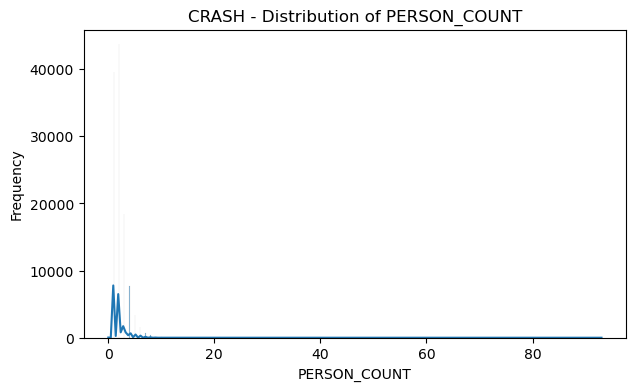

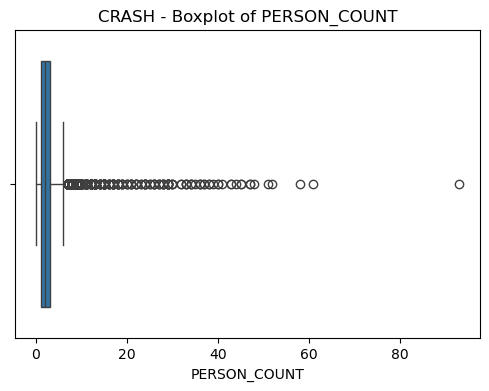

<Figure size 600x500 with 0 Axes>

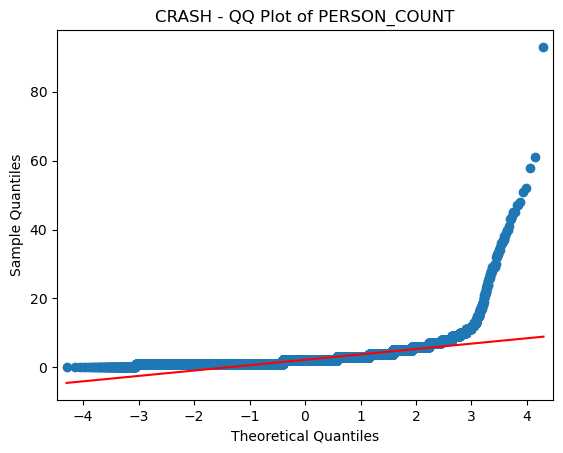


[CRASH] Column 'TIME_OF_DAY' has high cardinality (1442 unique). Skipping bar plot.

[CRASH] Categorical Column: INTERSECTION_RELATED
INTERSECTION_RELATED
N      78362
NaN    35069
Y       2687
Name: count, dtype: int64


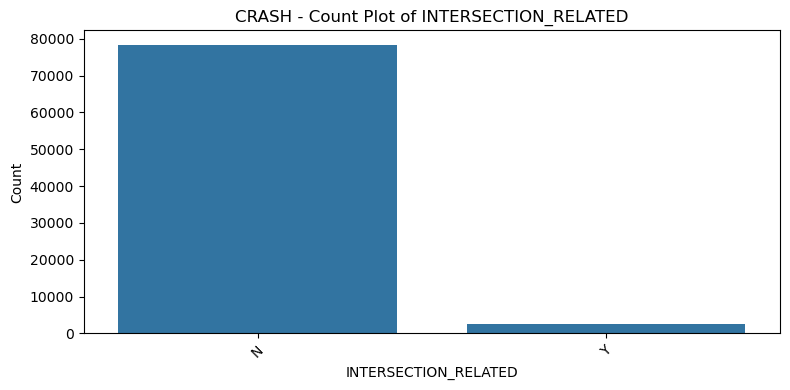

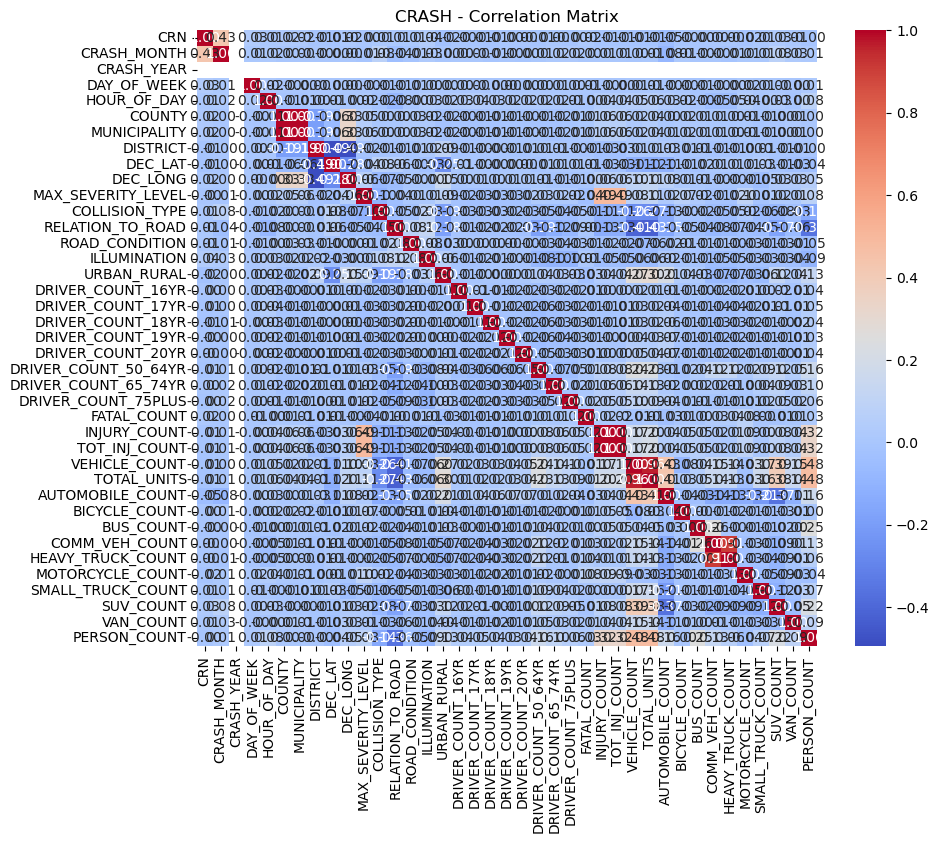

C:\Users\jason\anaconda3\envs\DeepL\lib\site-packages\statsmodels\regression\linear_model.py:1783: RuntimeWarning: divide by zero encountered in scalar divide
  return 1 - self.ssr/self.centered_tss



[CRASH] Variance Inflation Factors:
                 Feature       VIF
0                    CRN      1.24
1            CRASH_MONTH      1.26
2             CRASH_YEAR      0.00
3            DAY_OF_WEEK      1.00
4            HOUR_OF_DAY      1.03
5                 COUNTY  60889.38
6           MUNICIPALITY  60867.92
7               DISTRICT      3.07
8                DEC_LAT      2.55
9               DEC_LONG      2.66
10    MAX_SEVERITY_LEVEL      1.38
11        COLLISION_TYPE      1.18
12      RELATION_TO_ROAD      1.40
13        ROAD_CONDITION      1.02
14          ILLUMINATION      1.08
15           URBAN_RURAL      1.29
16     DRIVER_COUNT_16YR      1.01
17     DRIVER_COUNT_17YR      1.02
18     DRIVER_COUNT_18YR      1.02
19     DRIVER_COUNT_19YR      1.02
20     DRIVER_COUNT_20YR      1.02
21  DRIVER_COUNT_50_64YR      1.16
22  DRIVER_COUNT_65_74YR      1.07
23   DRIVER_COUNT_75PLUS      1.05
24           FATAL_COUNT      1.02
25          INJURY_COUNT  11581.36
26         TOT_INJ

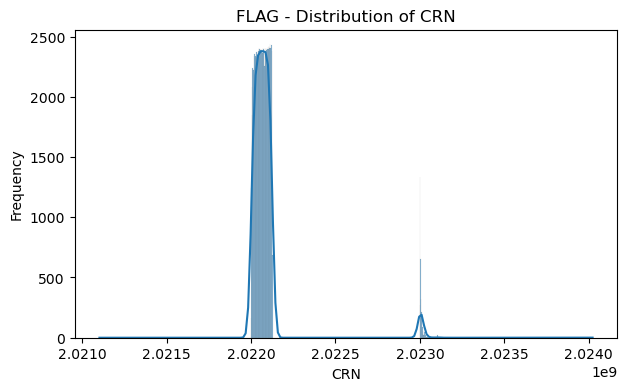

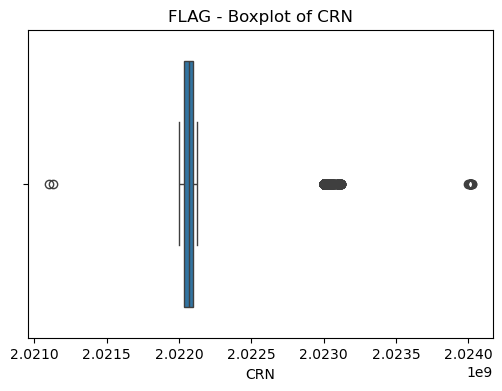

<Figure size 600x500 with 0 Axes>

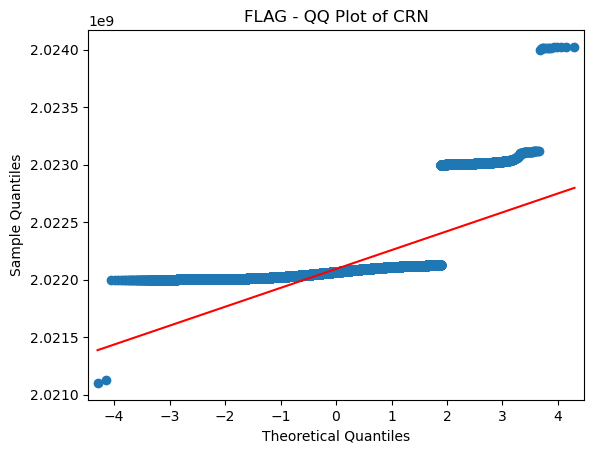


[FLAG] Numeric Column: ALCOHOL_RELATED
  Count: 116118
  Skewness: 3.23
  Kurtosis: 8.42


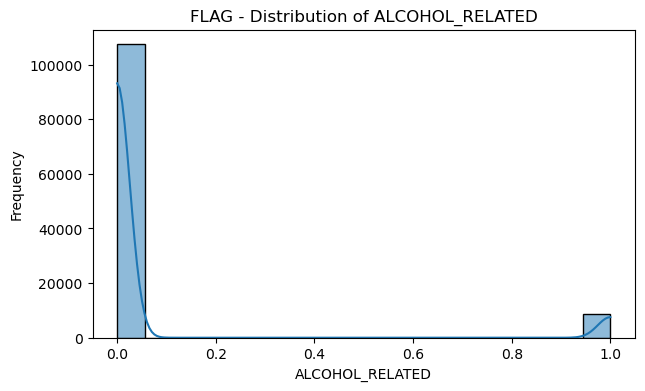

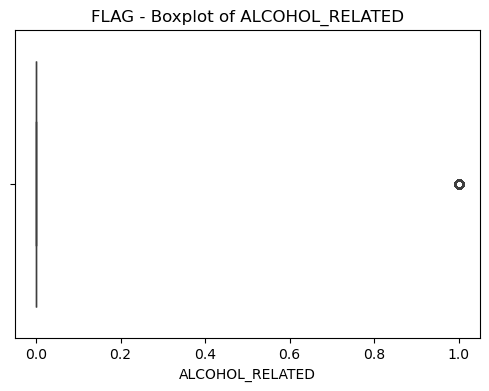

<Figure size 600x500 with 0 Axes>

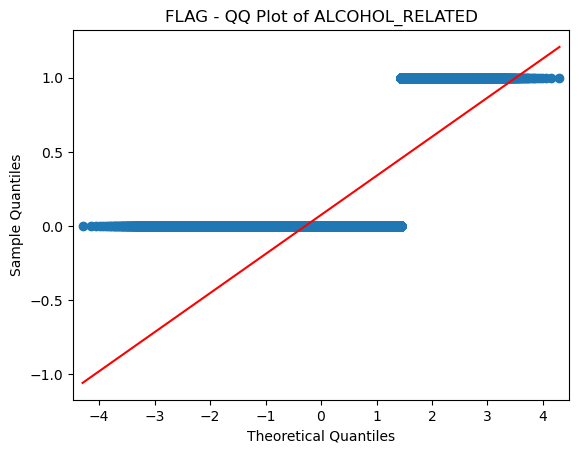


[FLAG] Numeric Column: DRUG_RELATED
  Count: 116118
  Skewness: 5.54
  Kurtosis: 28.65


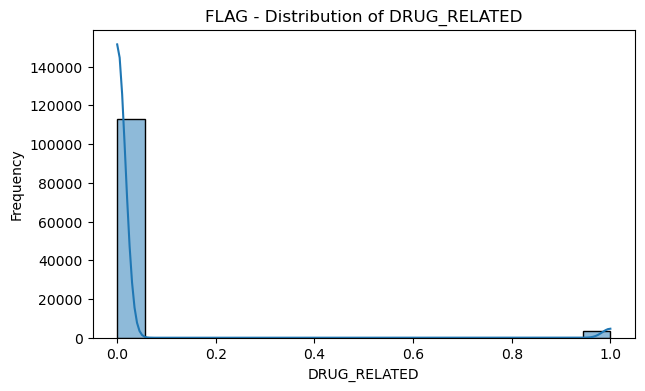

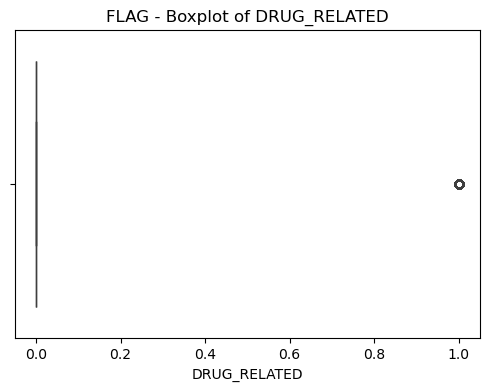

<Figure size 600x500 with 0 Axes>

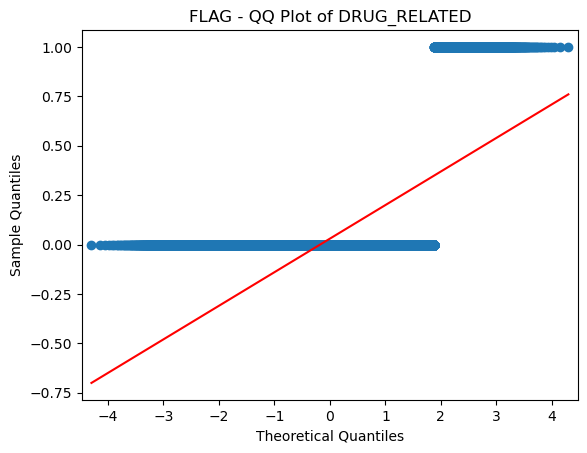


[FLAG] Numeric Column: DRUGGED_DRIVER
  Count: 116118
  Skewness: 5.61
  Kurtosis: 29.51


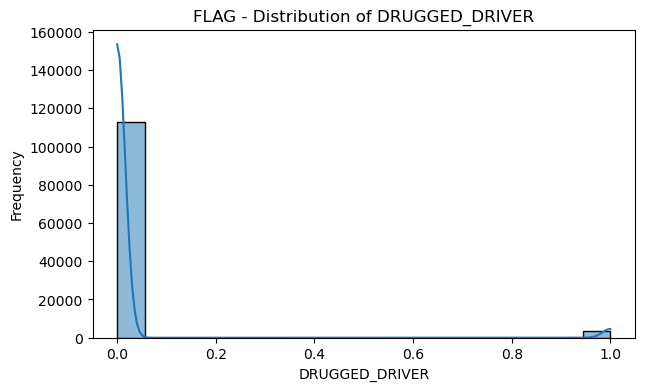

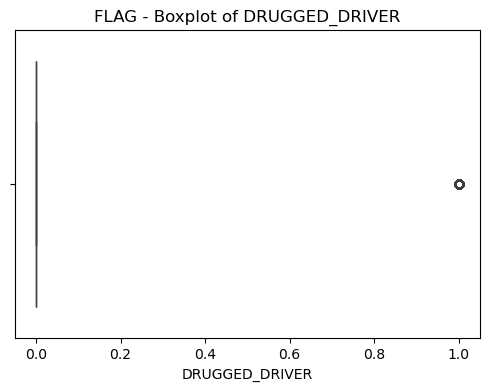

<Figure size 600x500 with 0 Axes>

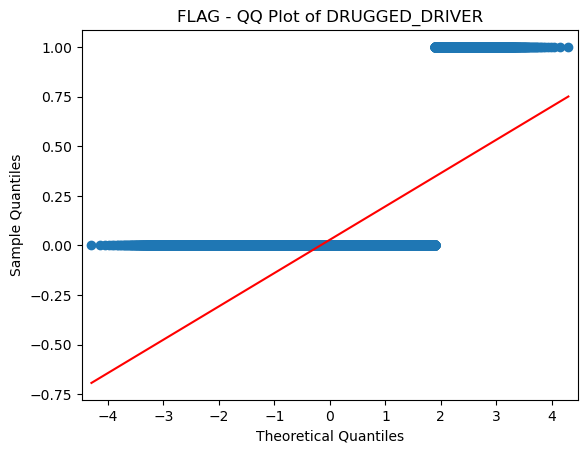


[FLAG] Numeric Column: OPIOID_RELATED
  Count: 116118
  Skewness: 20.40
  Kurtosis: 414.20


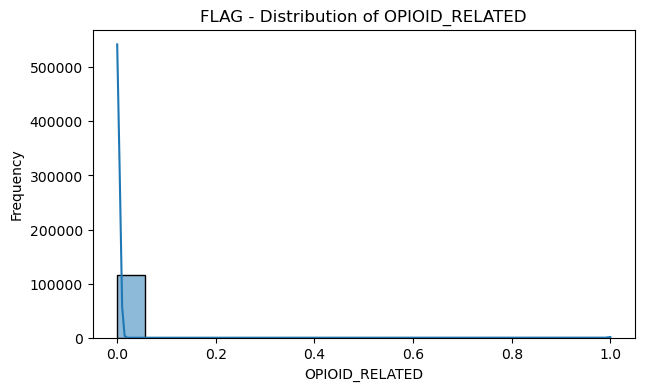

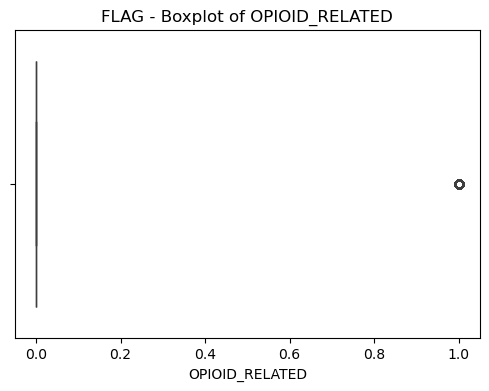

<Figure size 600x500 with 0 Axes>

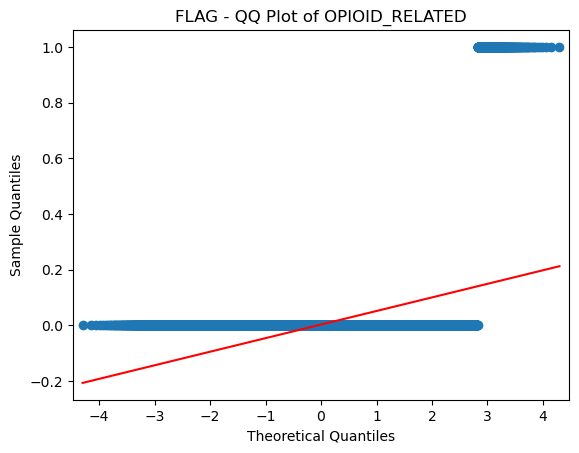


[FLAG] Numeric Column: ILLEGAL_DRUG_RELATED
  Count: 116118
  Skewness: 5.88
  Kurtosis: 32.55


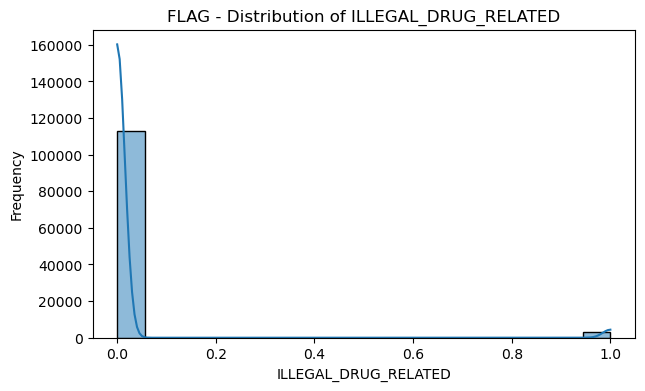

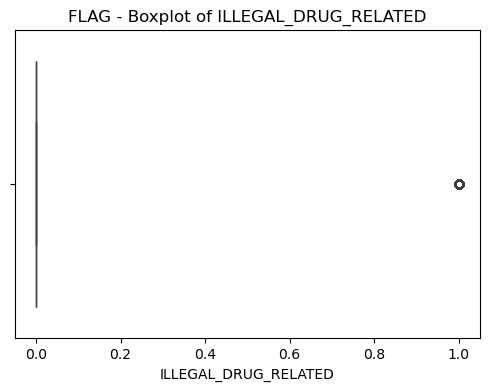

<Figure size 600x500 with 0 Axes>

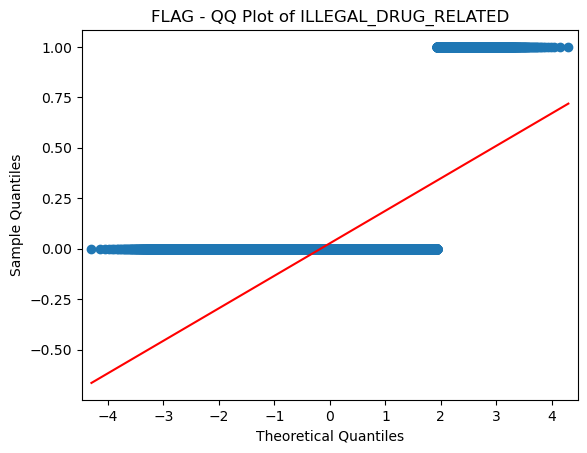


[FLAG] Numeric Column: MARIJUANA_DRUGGED_DRIVER
  Count: 116118
  Skewness: 13.05
  Kurtosis: 168.32


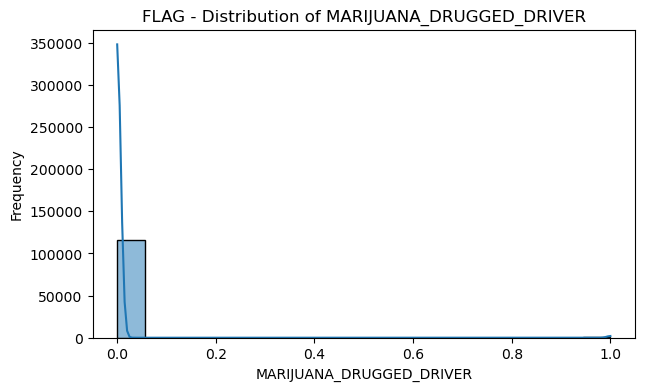

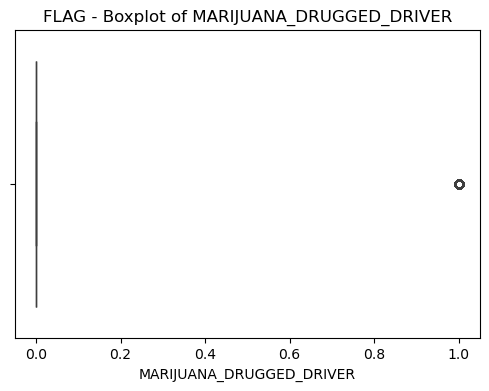

<Figure size 600x500 with 0 Axes>

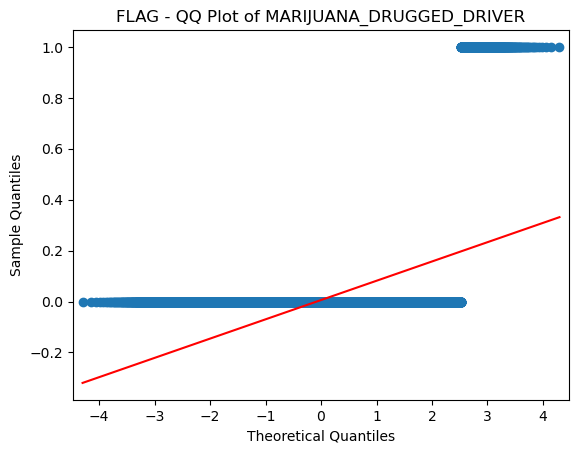


[FLAG] Numeric Column: MARIJUANA_RELATED
  Count: 116118
  Skewness: 12.97
  Kurtosis: 166.27


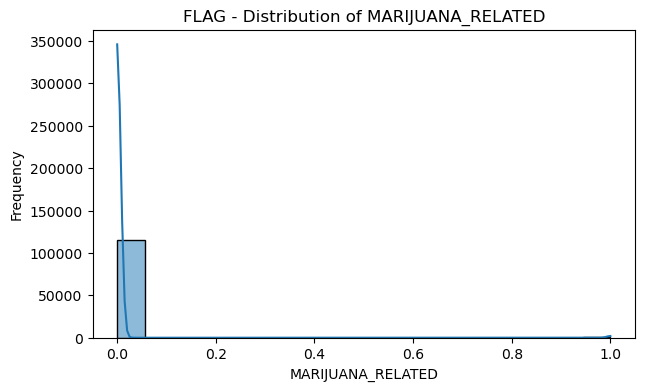

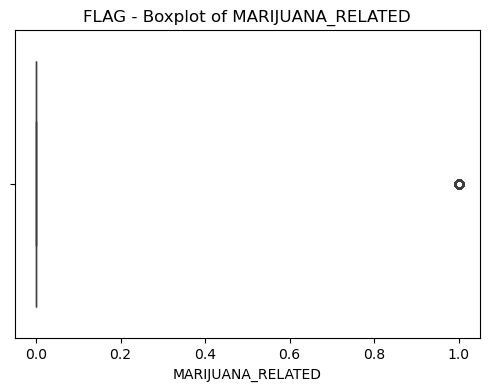

<Figure size 600x500 with 0 Axes>

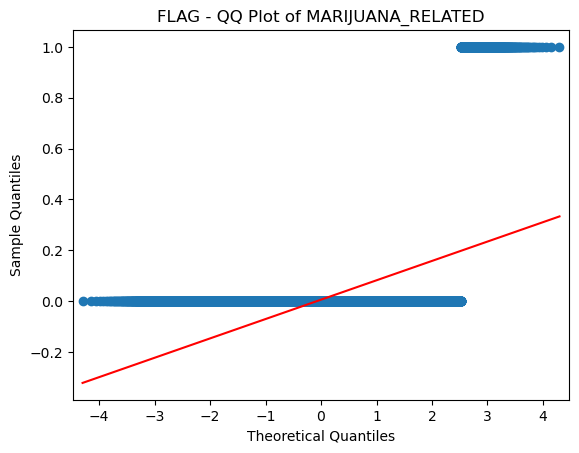


[FLAG] Numeric Column: FATAL
  Count: 116118
  Skewness: 10.17
  Kurtosis: 101.34


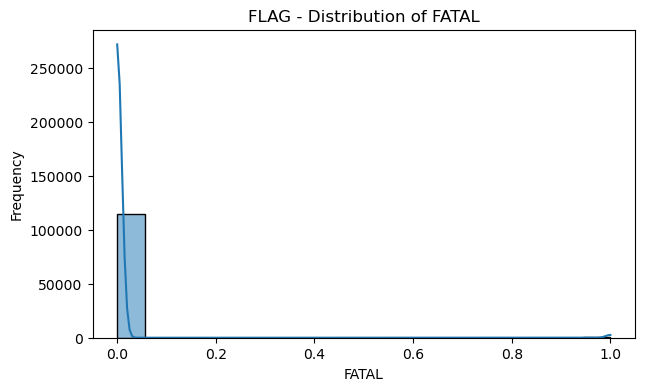

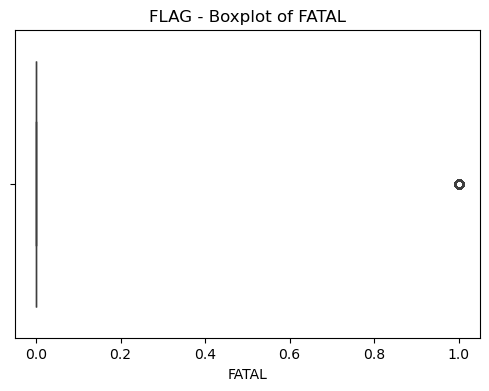

<Figure size 600x500 with 0 Axes>

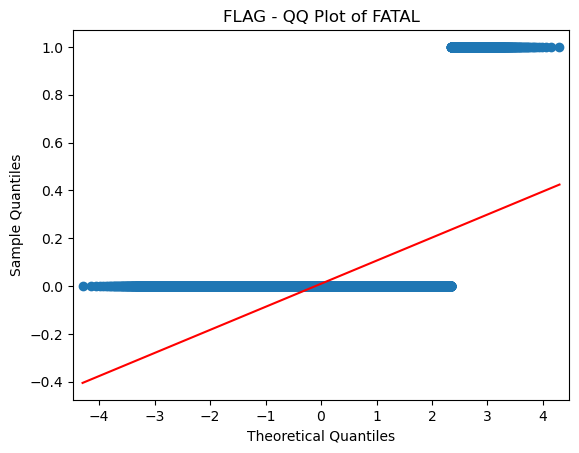


[FLAG] Numeric Column: INJURY
  Count: 116118
  Skewness: 0.30
  Kurtosis: -1.91


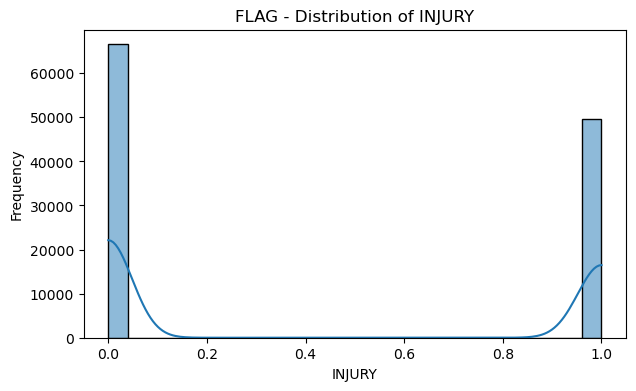

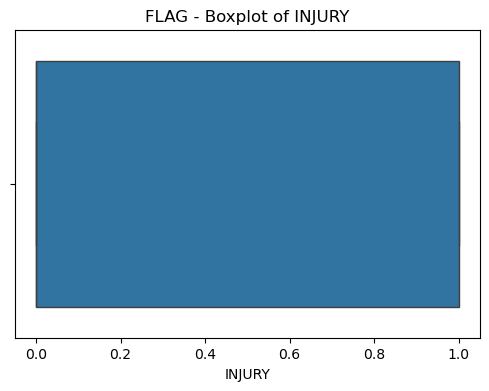

<Figure size 600x500 with 0 Axes>

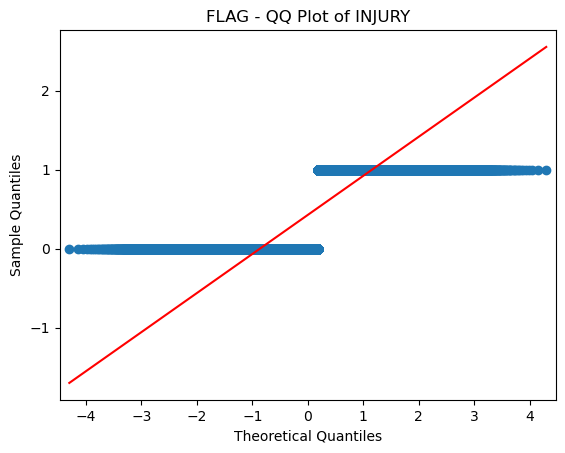


[FLAG] Numeric Column: INJURY_OR_FATAL
  Count: 116118
  Skewness: 0.27
  Kurtosis: -1.93


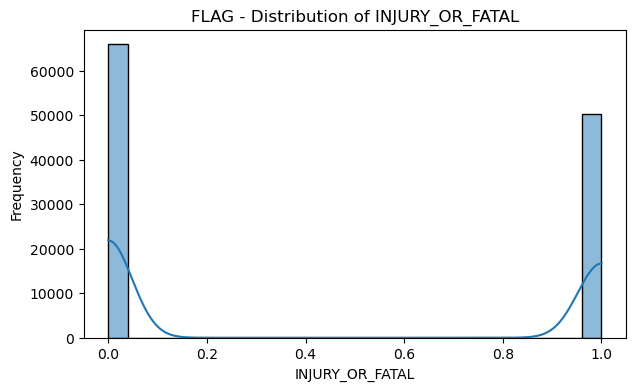

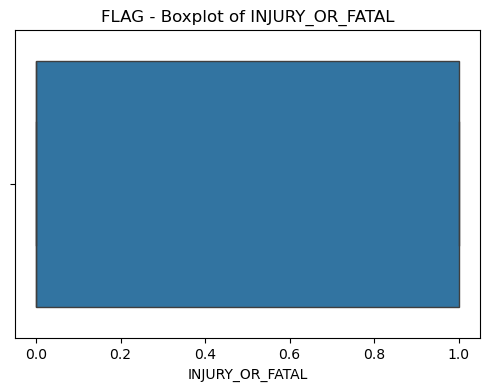

<Figure size 600x500 with 0 Axes>

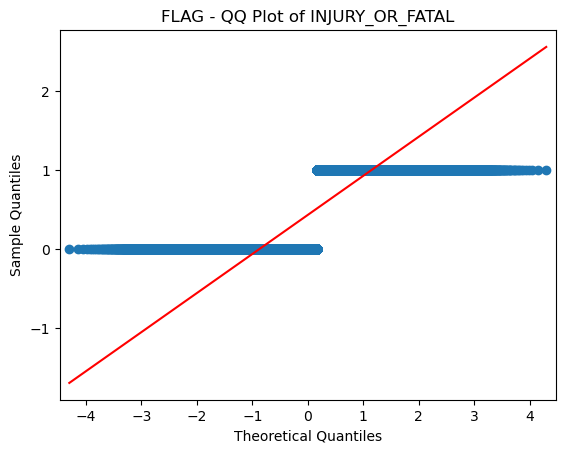


[FLAG] Numeric Column: FATAL_OR_SUSP_SERIOUS_INJ
  Count: 116118
  Skewness: 4.44
  Kurtosis: 17.73


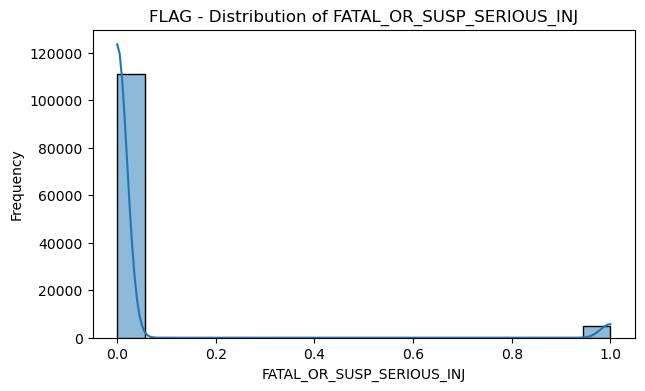

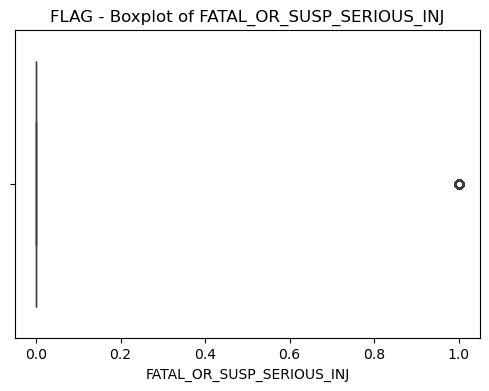

<Figure size 600x500 with 0 Axes>

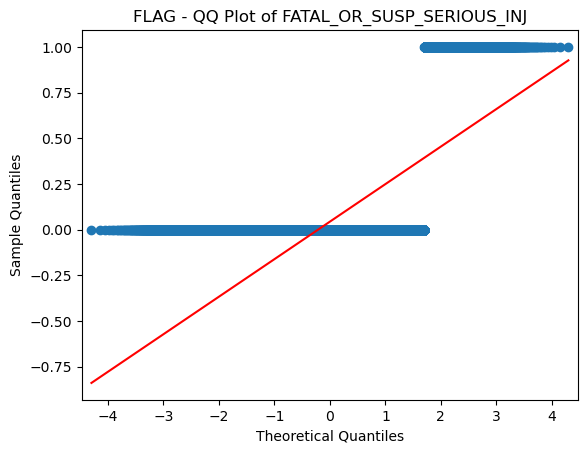


[FLAG] Numeric Column: POSSIBLE_INJURY
  Count: 116118
  Skewness: 3.09
  Kurtosis: 7.52


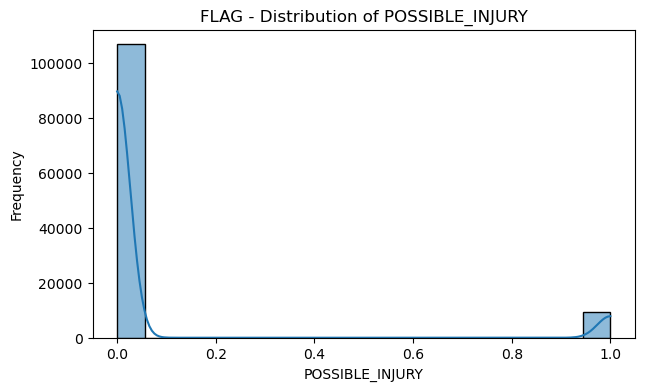

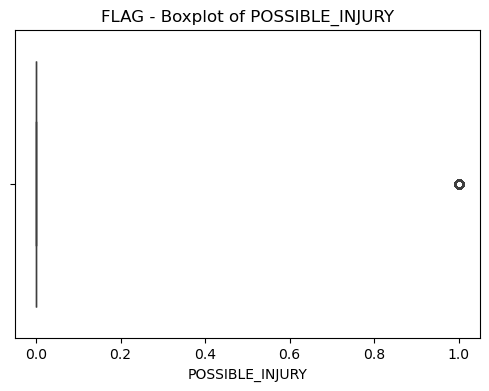

<Figure size 600x500 with 0 Axes>

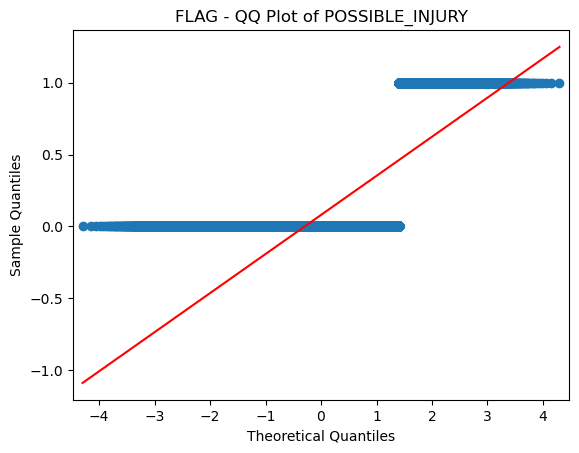


[FLAG] Numeric Column: SUSPECTED_MINOR_INJURY
  Count: 116118
  Skewness: 1.24
  Kurtosis: -0.47


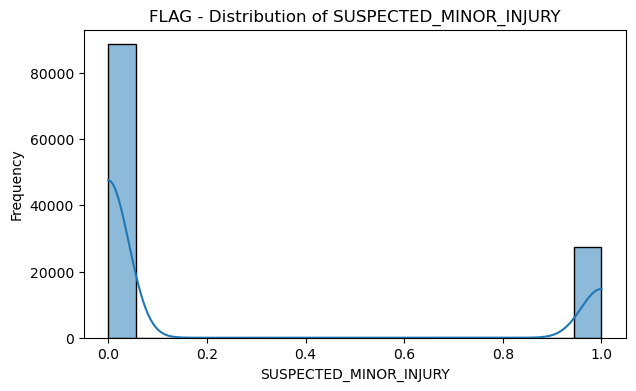

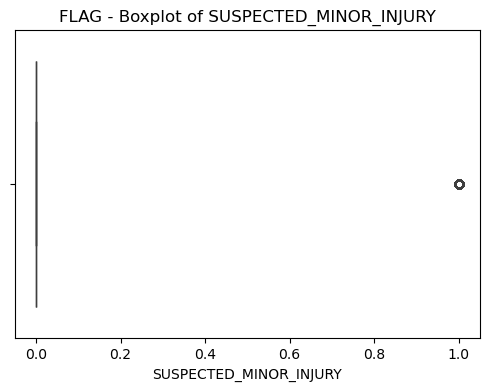

<Figure size 600x500 with 0 Axes>

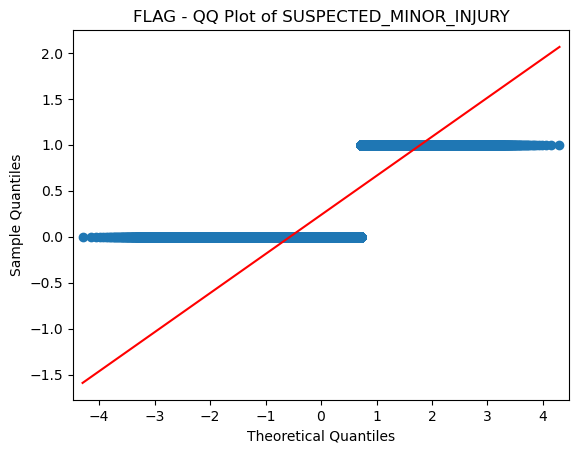


[FLAG] Numeric Column: SUSPECTED_SERIOUS_INJURY
  Count: 116118
  Skewness: 4.97
  Kurtosis: 22.67


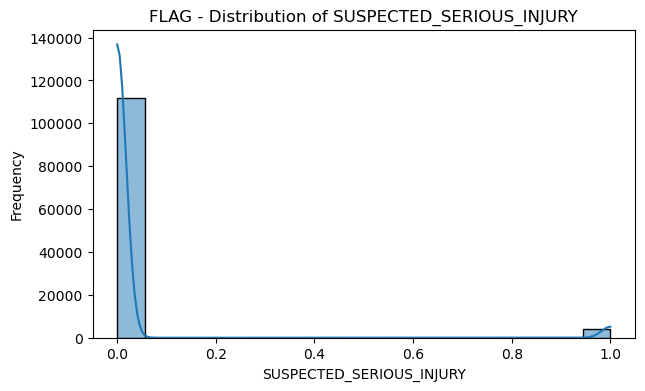

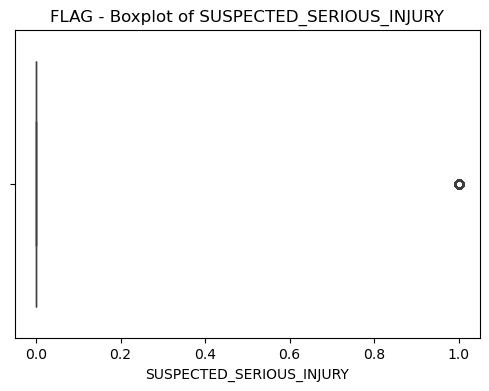

<Figure size 600x500 with 0 Axes>

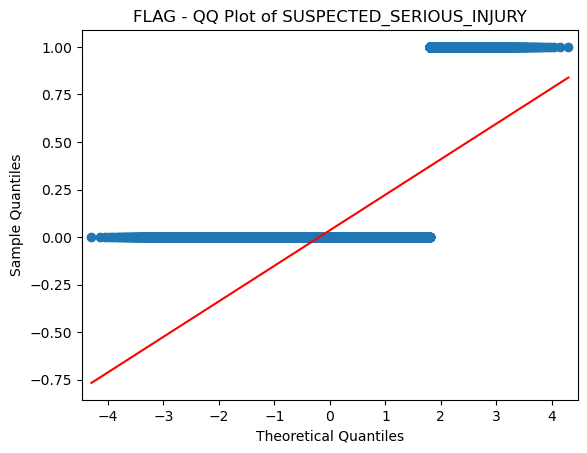


[FLAG] Numeric Column: PROPERTY_DAMAGE_ONLY
  Count: 116118
  Skewness: -0.13
  Kurtosis: -1.98


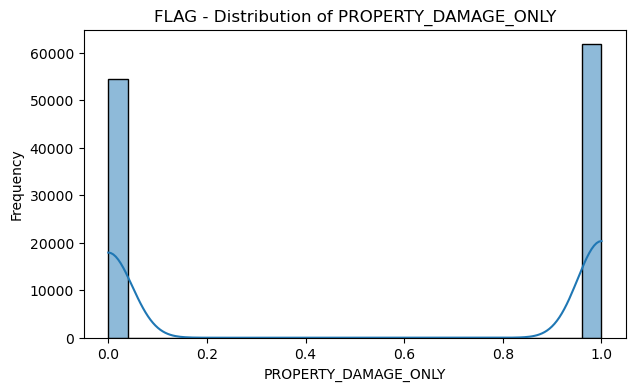

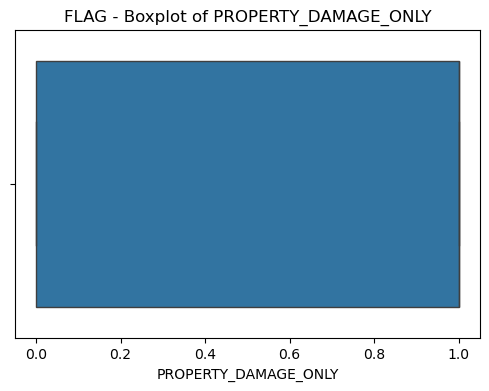

<Figure size 600x500 with 0 Axes>

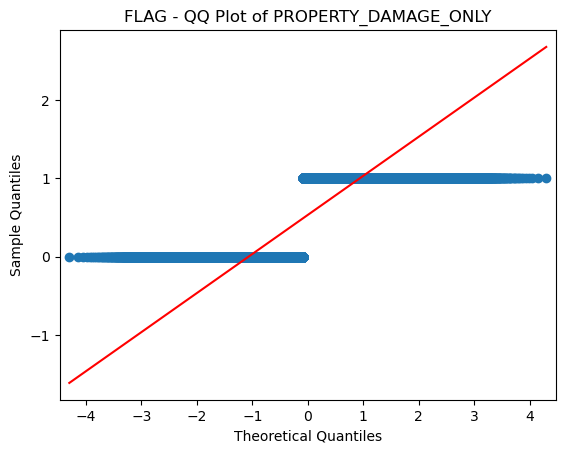


[FLAG] Numeric Column: AGGRESSIVE_DRIVING
  Count: 116118
  Skewness: -0.24
  Kurtosis: -1.94


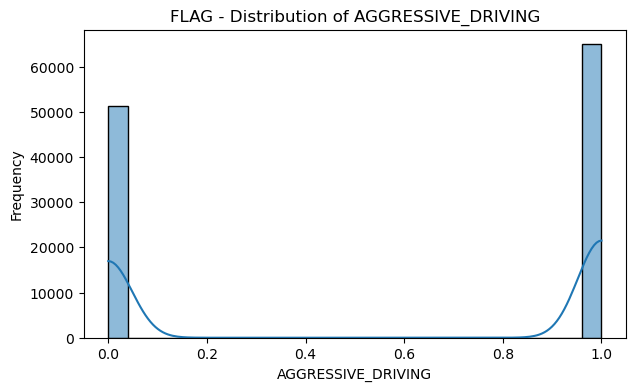

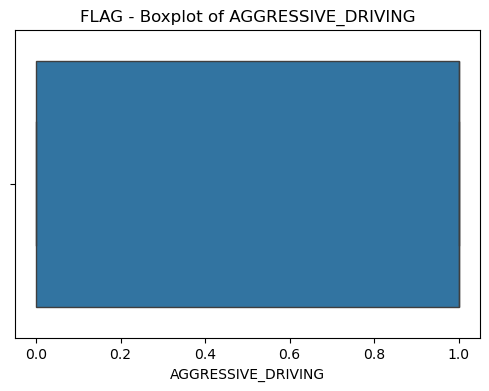

<Figure size 600x500 with 0 Axes>

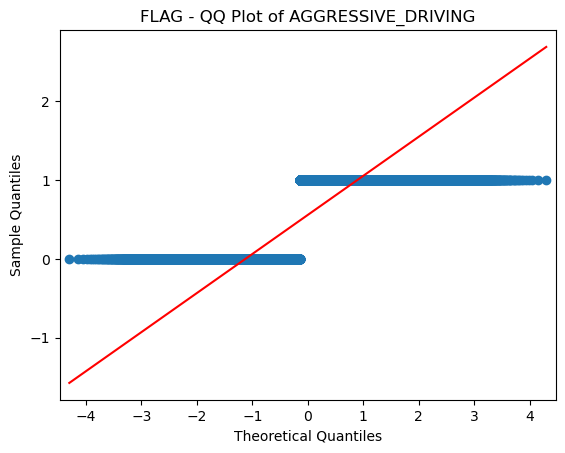


[FLAG] Numeric Column: CELL_PHONE
  Count: 116118
  Skewness: 7.33
  Kurtosis: 51.74


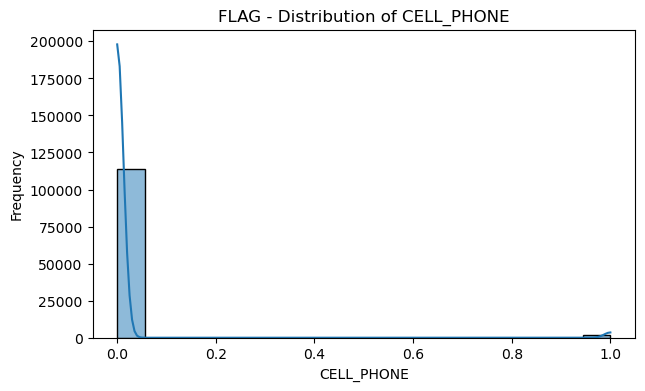

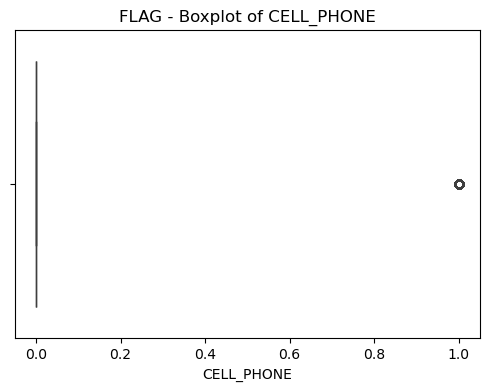

<Figure size 600x500 with 0 Axes>

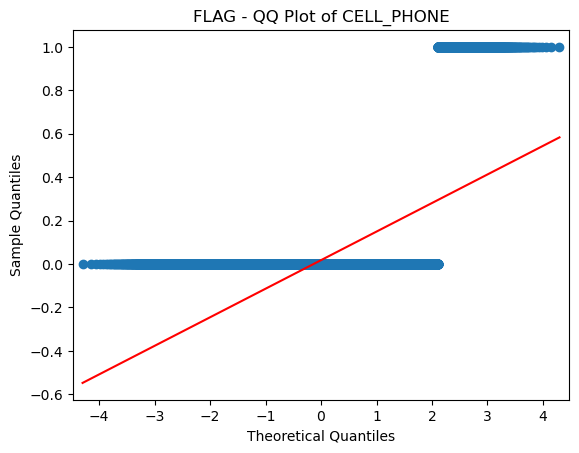


[FLAG] Numeric Column: DISTRACTED
  Count: 116118
  Skewness: 2.62
  Kurtosis: 4.86


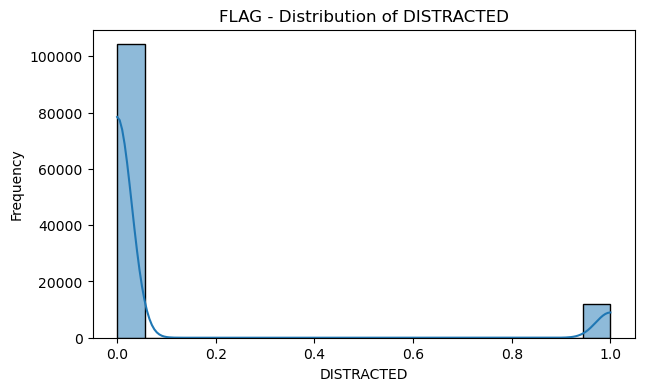

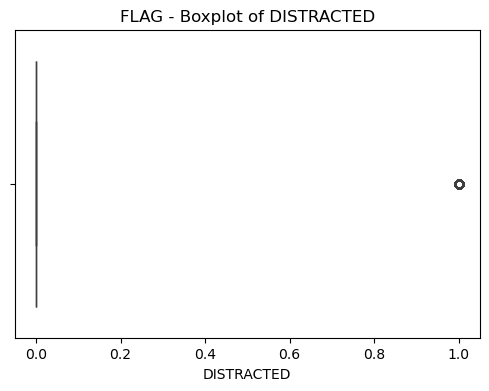

<Figure size 600x500 with 0 Axes>

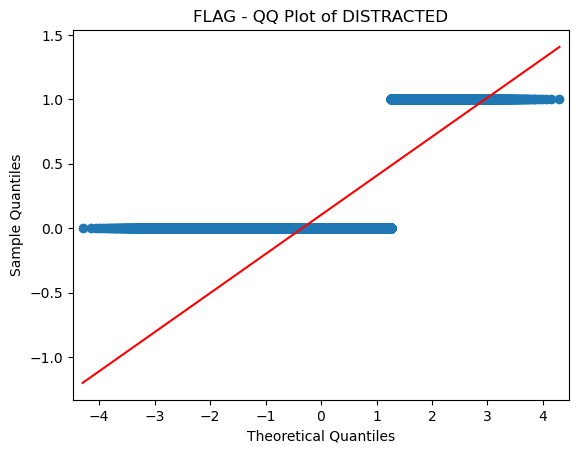


[FLAG] Numeric Column: FATIGUE_ASLEEP
  Count: 116118
  Skewness: 6.72
  Kurtosis: 43.16


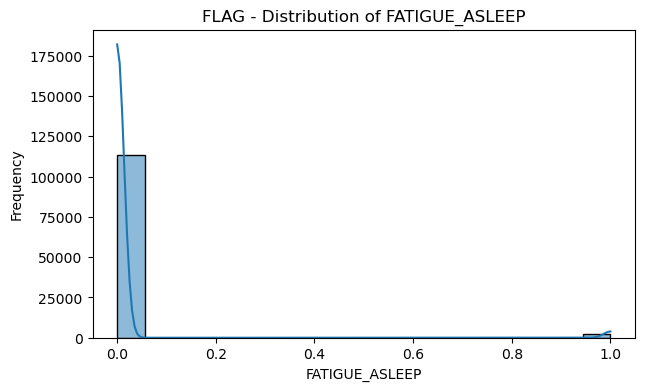

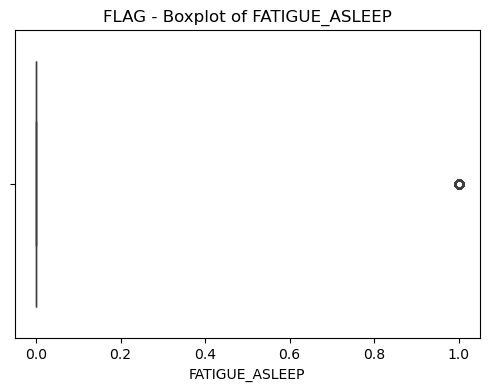

<Figure size 600x500 with 0 Axes>

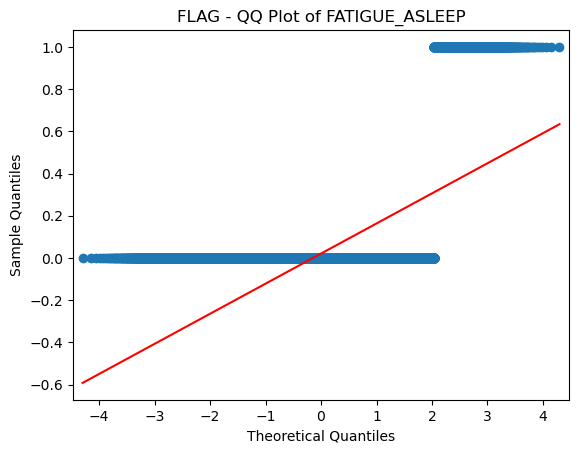


[FLAG] Numeric Column: SPEEDING
  Count: 116118
  Skewness: 5.29
  Kurtosis: 25.98


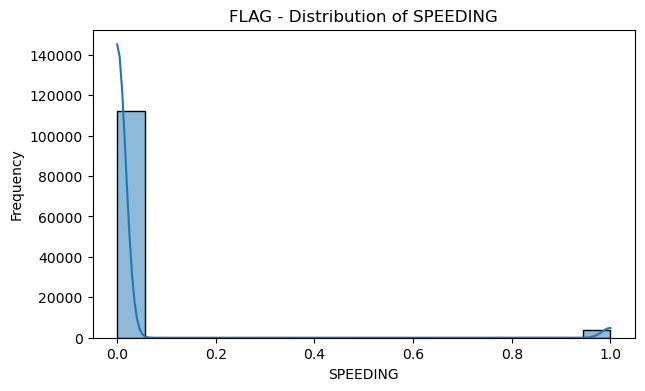

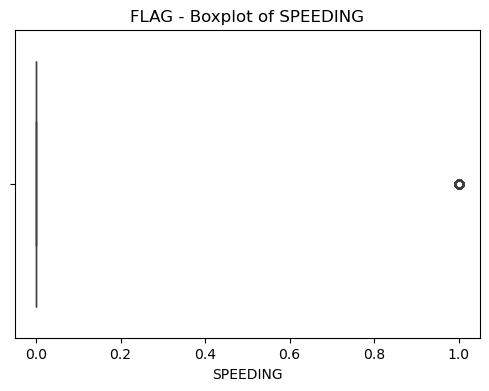

<Figure size 600x500 with 0 Axes>

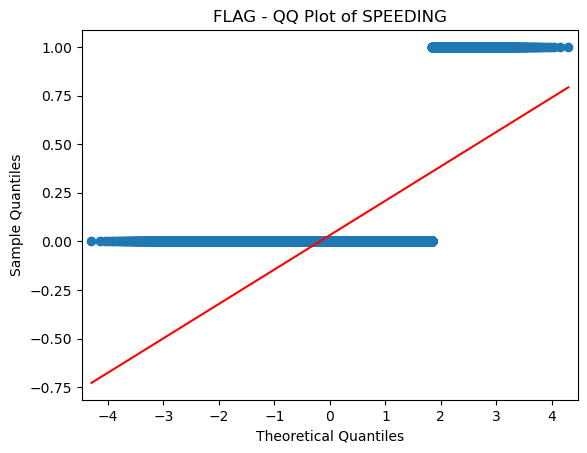


[FLAG] Numeric Column: SPEEDING_RELATED
  Count: 116118
  Skewness: 1.28
  Kurtosis: -0.36


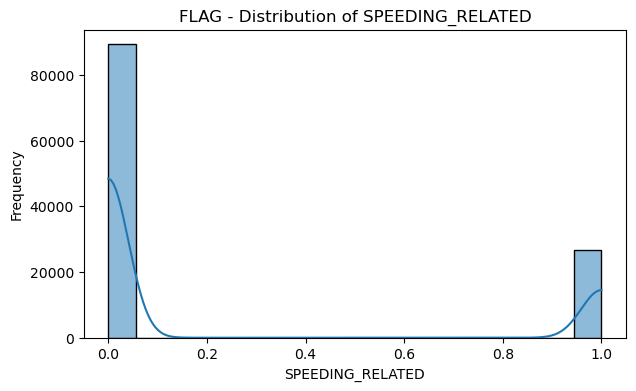

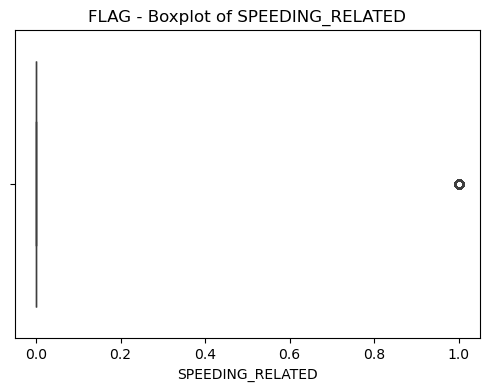

<Figure size 600x500 with 0 Axes>

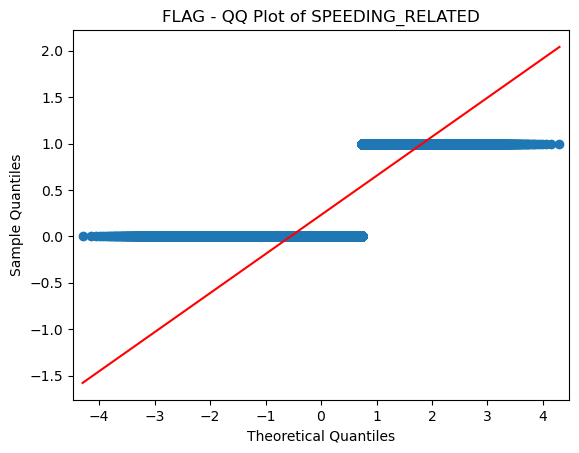


[FLAG] Numeric Column: IMPAIRED_DRIVER
  Count: 116118
  Skewness: 2.85
  Kurtosis: 6.15


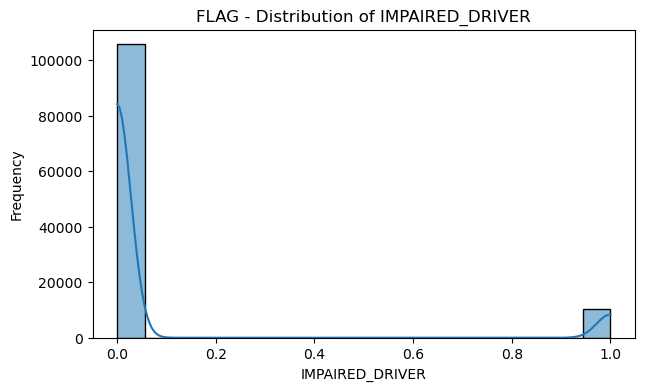

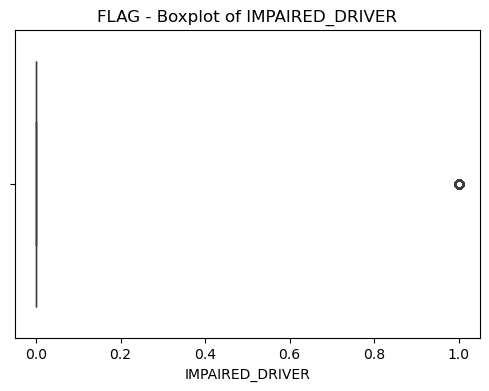

<Figure size 600x500 with 0 Axes>

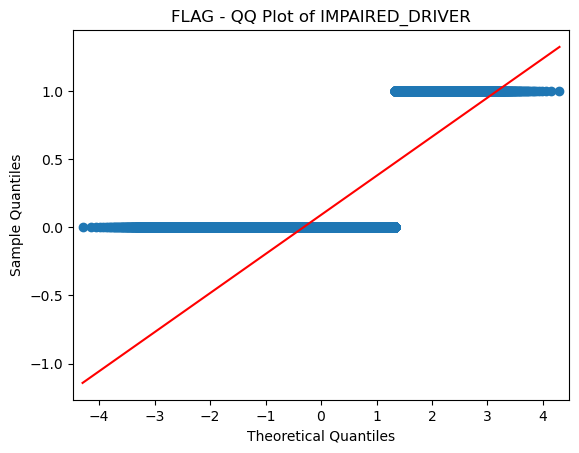


[FLAG] Numeric Column: DRIVER_16YR
  Count: 116118
  Skewness: 7.57
  Kurtosis: 55.28


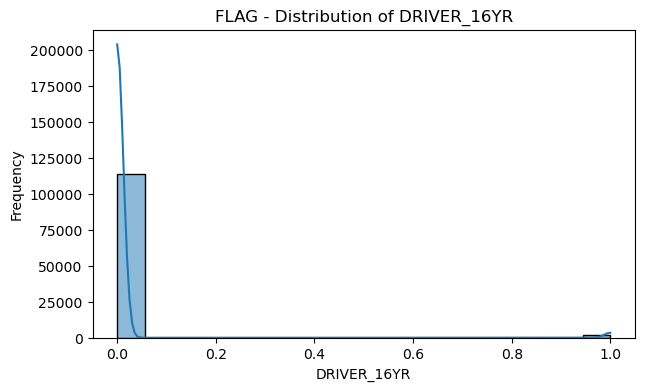

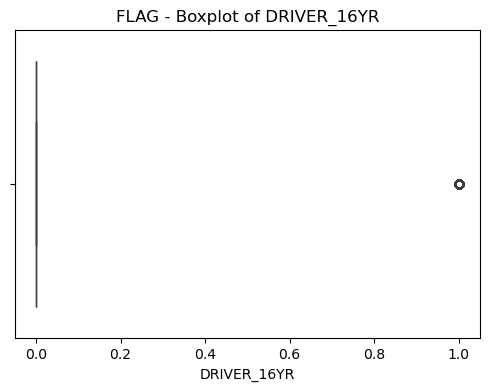

<Figure size 600x500 with 0 Axes>

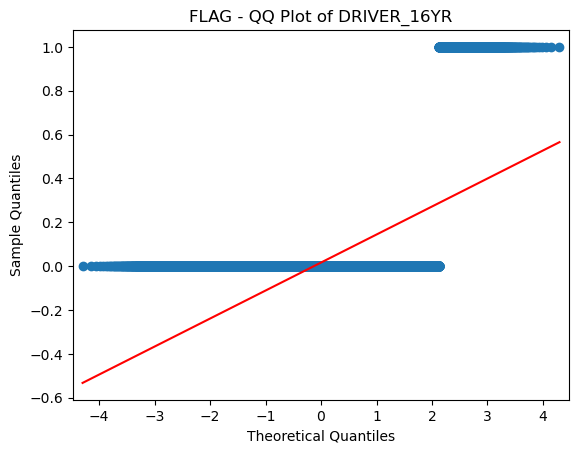


[FLAG] Numeric Column: DRIVER_17YR
  Count: 116118
  Skewness: 4.83
  Kurtosis: 21.32


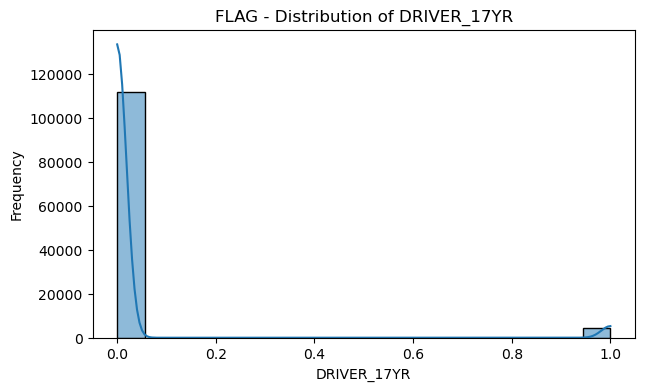

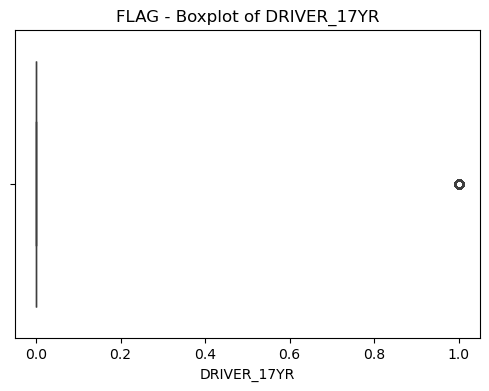

<Figure size 600x500 with 0 Axes>

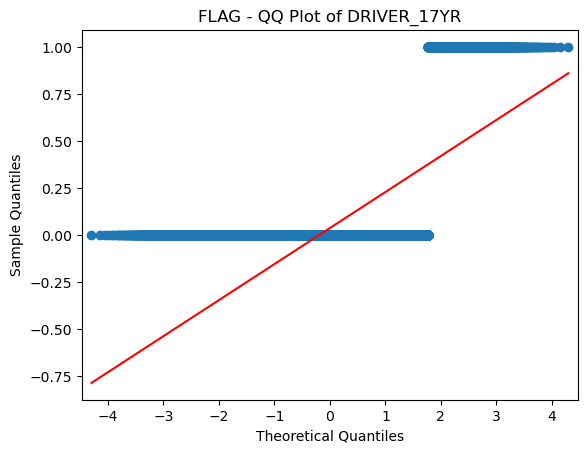


[FLAG] Numeric Column: DRIVER_18YR
  Count: 116118
  Skewness: 4.44
  Kurtosis: 17.74


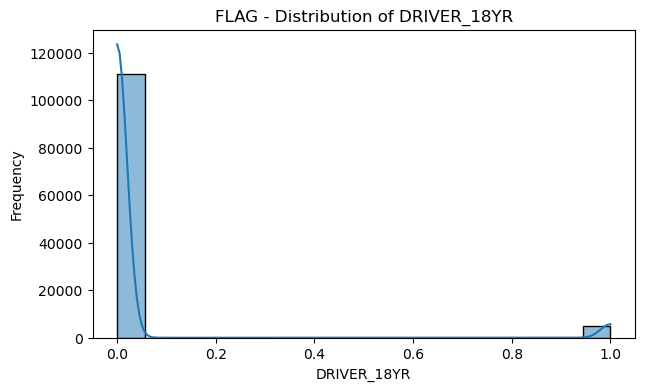

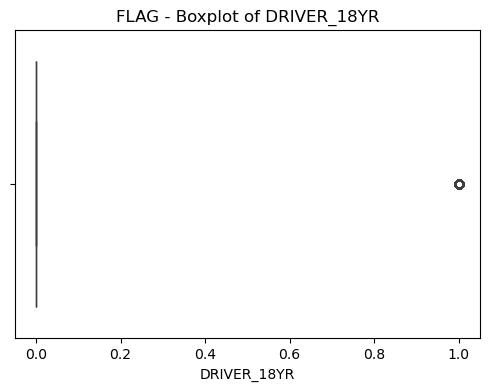

<Figure size 600x500 with 0 Axes>

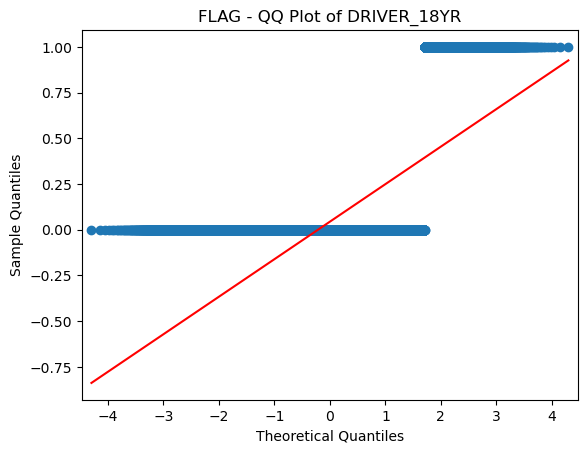


[FLAG] Numeric Column: DRIVER_19YR
  Count: 116118
  Skewness: 4.55
  Kurtosis: 18.72


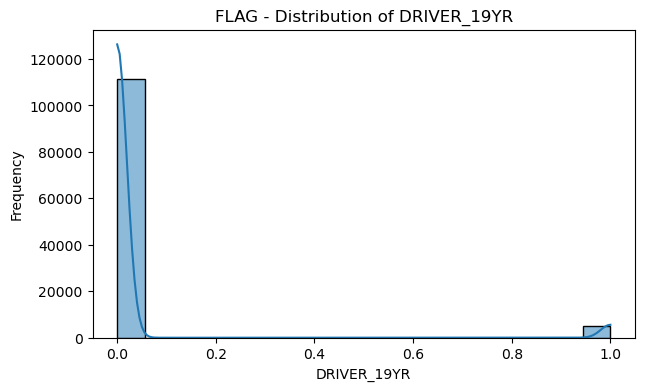

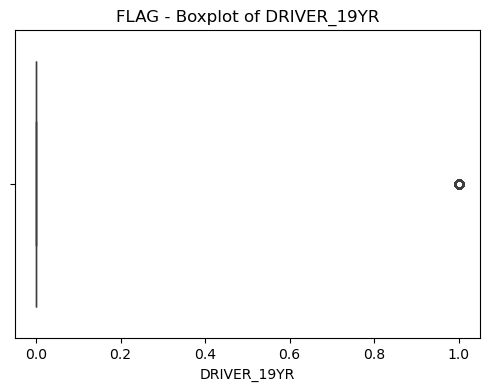

<Figure size 600x500 with 0 Axes>

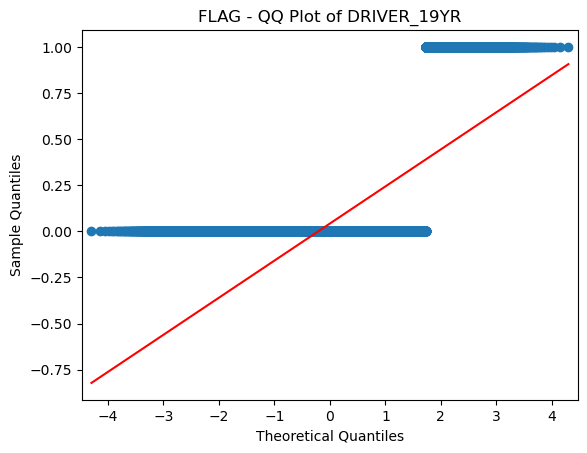


[FLAG] Numeric Column: DRIVER_20YR
  Count: 116118
  Skewness: 4.57
  Kurtosis: 18.85


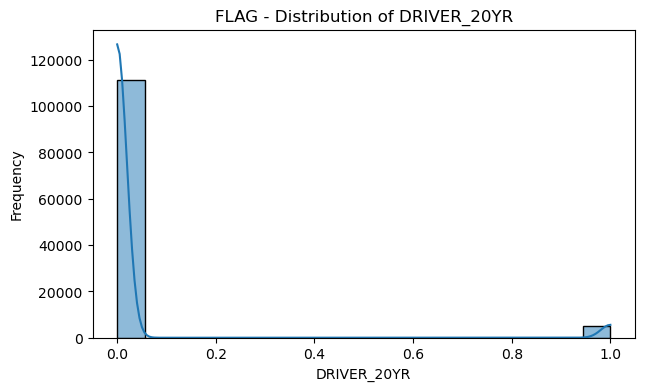

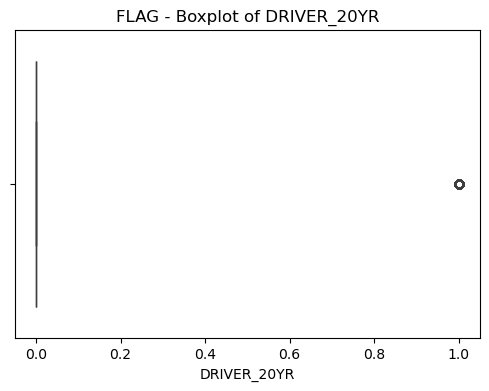

<Figure size 600x500 with 0 Axes>

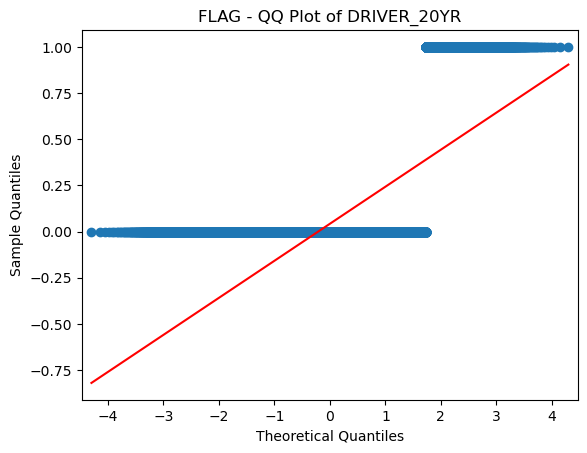


[FLAG] Numeric Column: DRIVER_50_64YR
  Count: 116118
  Skewness: 1.02
  Kurtosis: -0.96


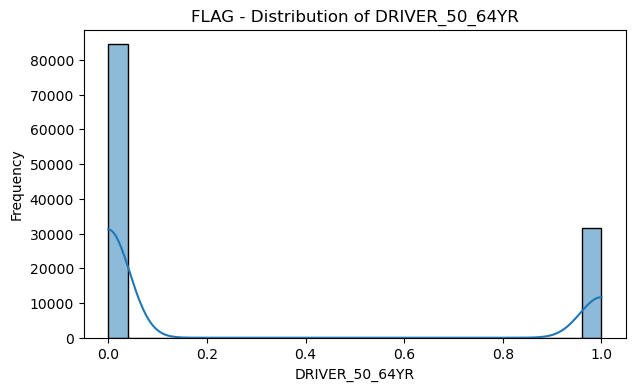

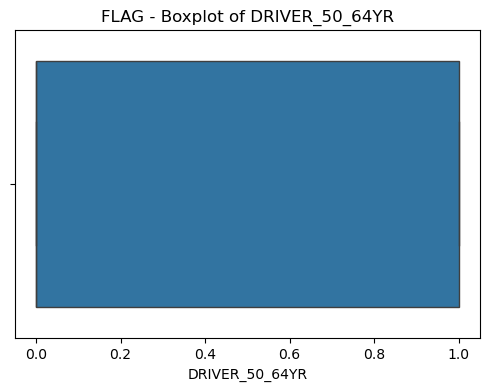

<Figure size 600x500 with 0 Axes>

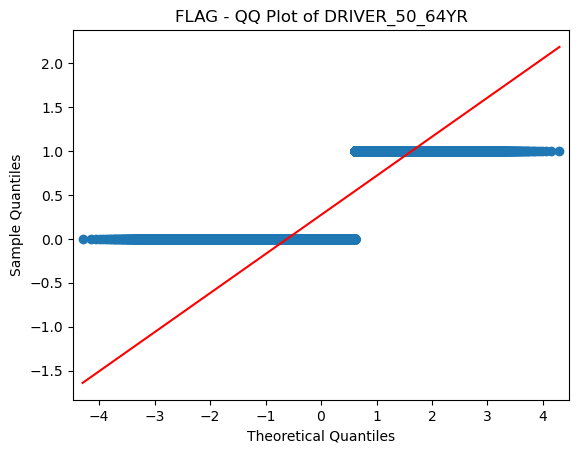


[FLAG] Numeric Column: DRIVER_65_74YR
  Count: 116118
  Skewness: 2.42
  Kurtosis: 3.84


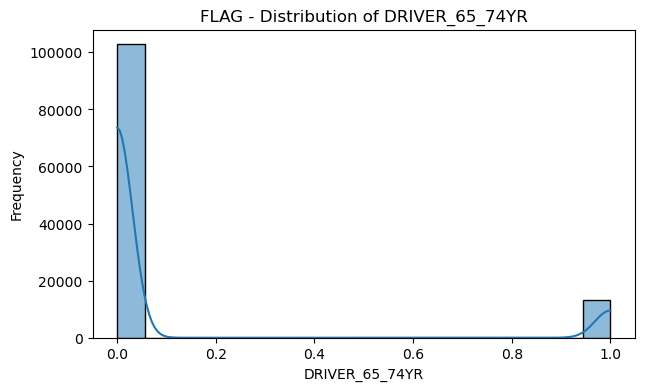

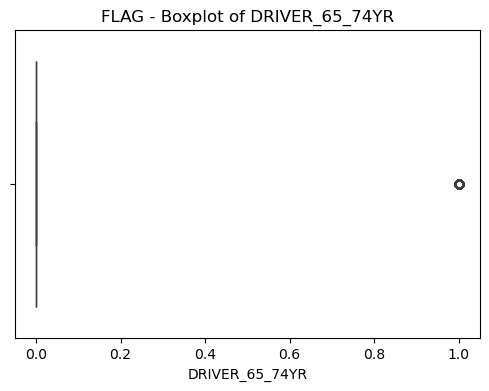

<Figure size 600x500 with 0 Axes>

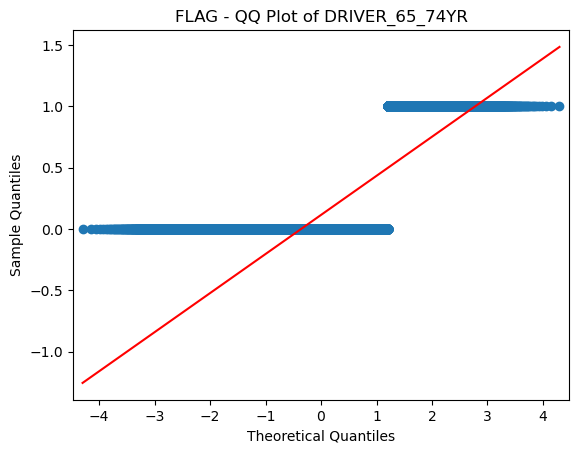


[FLAG] Numeric Column: DRIVER_75PLUS
  Count: 116118
  Skewness: 3.39
  Kurtosis: 9.47


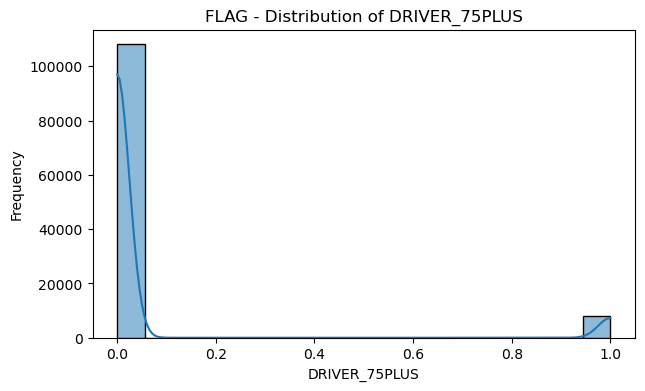

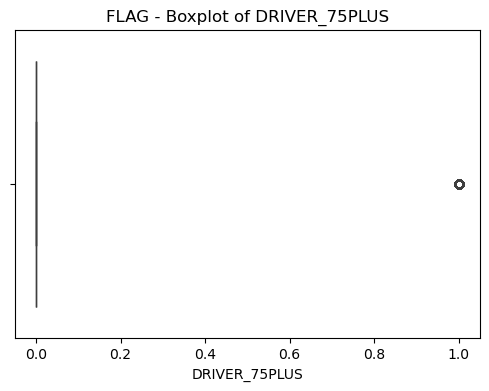

<Figure size 600x500 with 0 Axes>

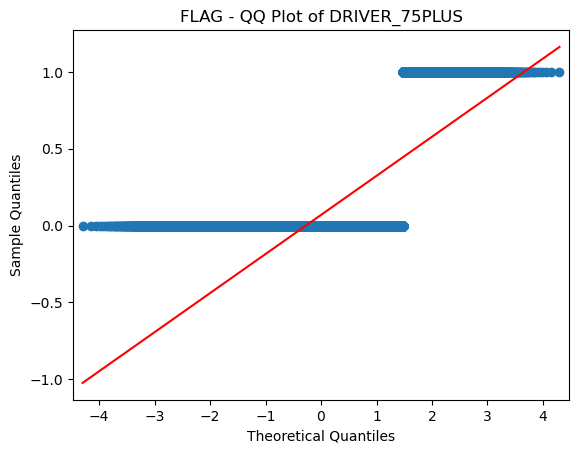


[FLAG] Numeric Column: YOUNG_DRIVER
  Count: 116118
  Skewness: 1.69
  Kurtosis: 0.84


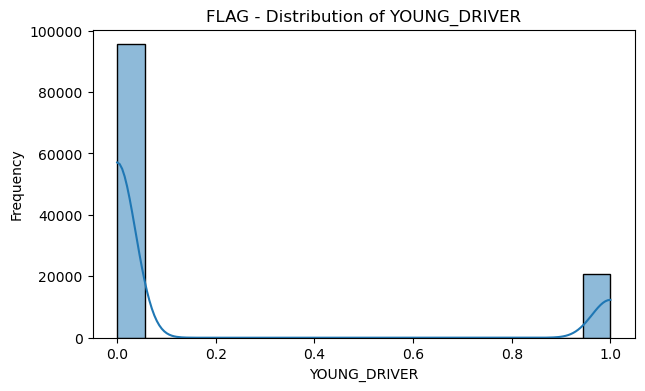

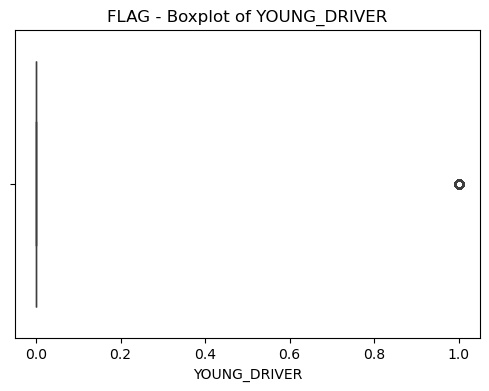

<Figure size 600x500 with 0 Axes>

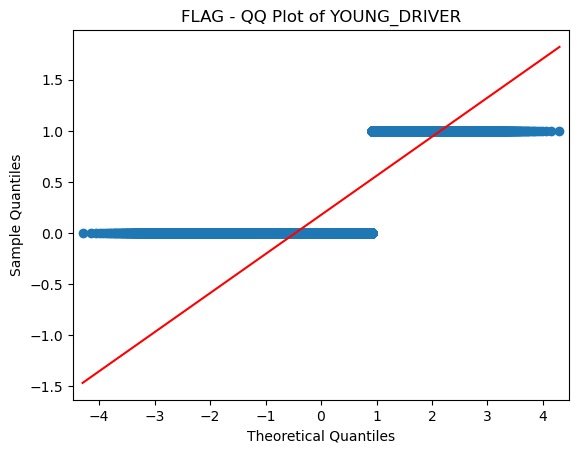


[FLAG] Numeric Column: MATURE_DRIVER
  Count: 116118
  Skewness: 1.69
  Kurtosis: 0.85


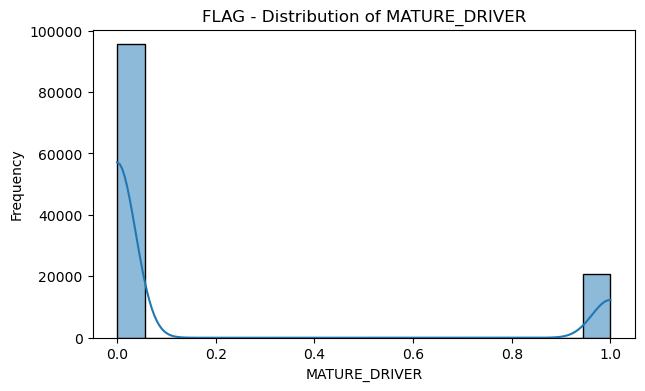

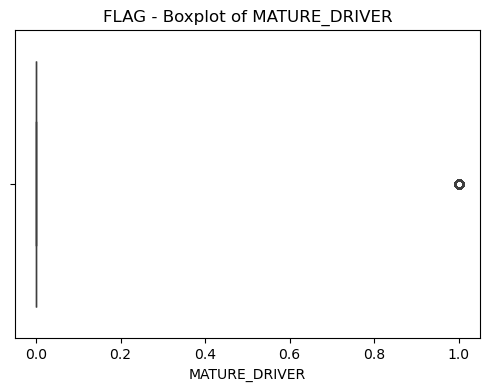

<Figure size 600x500 with 0 Axes>

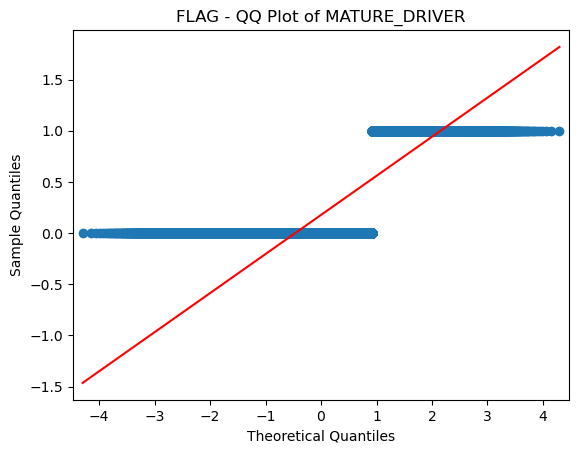


[FLAG] Numeric Column: INTERSECTION
  Count: 116118
  Skewness: 0.50
  Kurtosis: -1.75


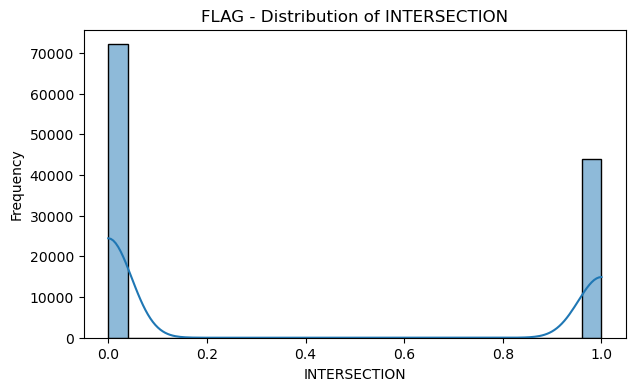

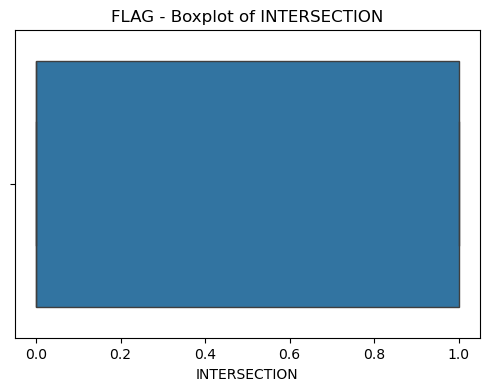

<Figure size 600x500 with 0 Axes>

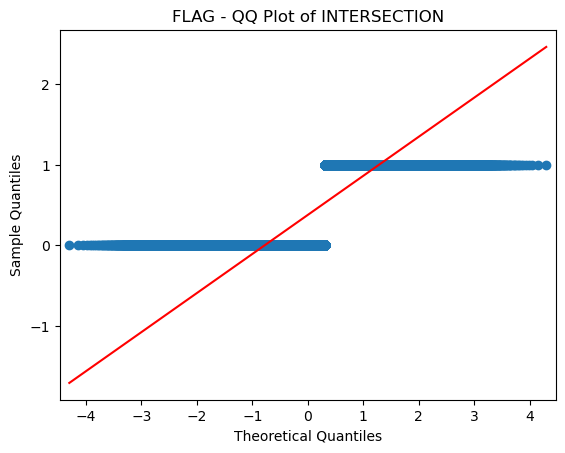


[FLAG] Numeric Column: NON_INTERSECTION
  Count: 116118
  Skewness: -0.50
  Kurtosis: -1.75


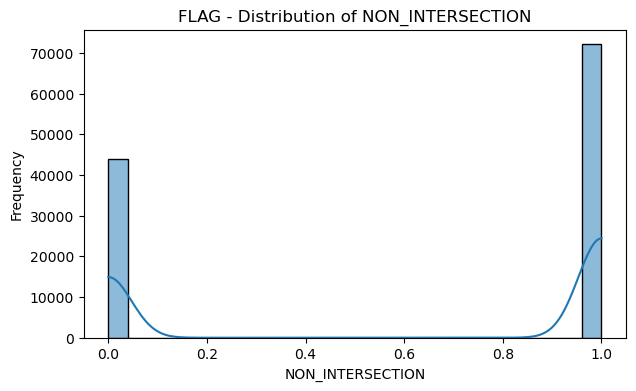

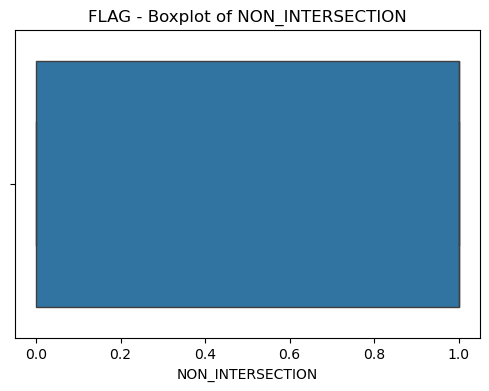

<Figure size 600x500 with 0 Axes>

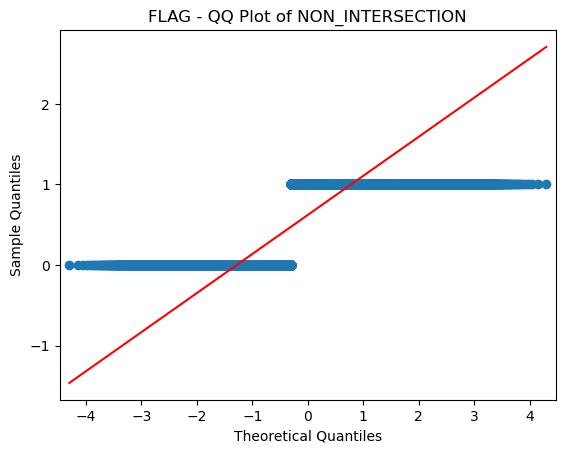


[FLAG] Numeric Column: RURAL
  Count: 116118
  Skewness: 0.82
  Kurtosis: -1.32


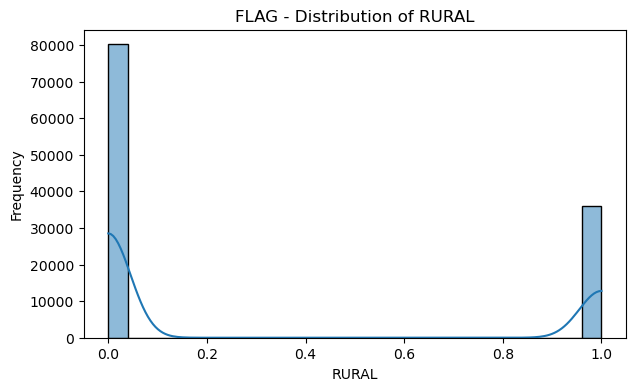

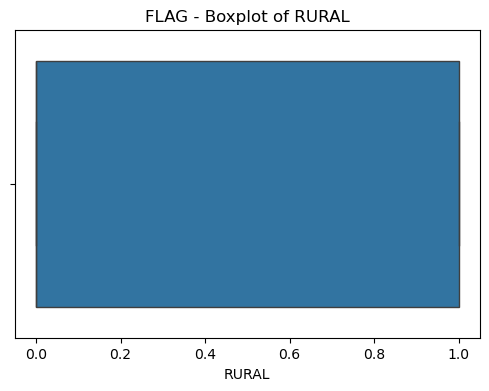

<Figure size 600x500 with 0 Axes>

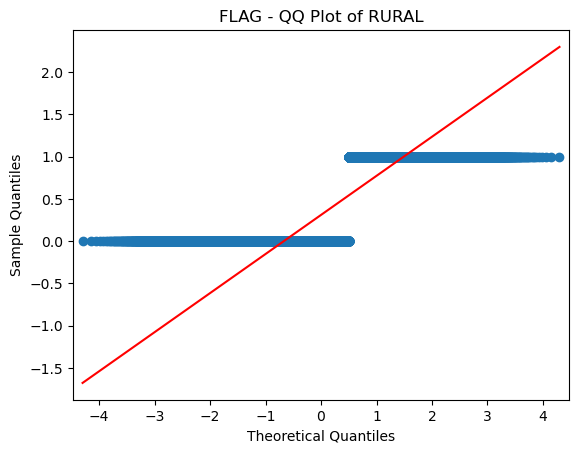


[FLAG] Numeric Column: URBAN
  Count: 116118
  Skewness: -0.82
  Kurtosis: -1.32


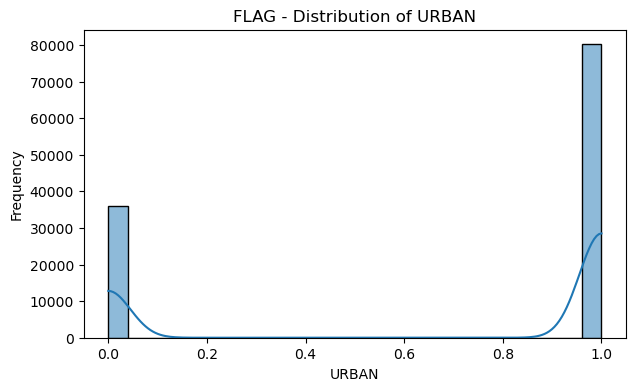

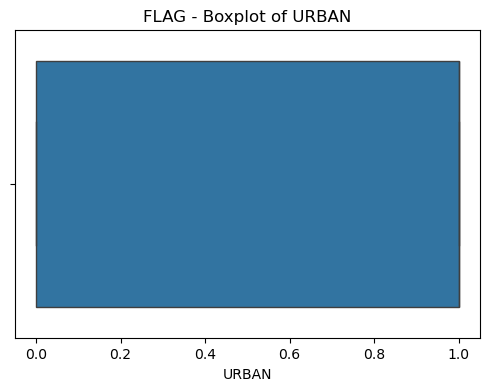

<Figure size 600x500 with 0 Axes>

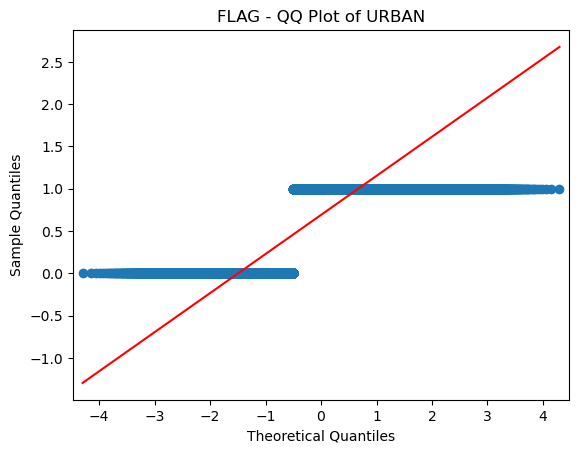


[FLAG] Numeric Column: LOCAL_ROAD
  Count: 116118
  Skewness: 0.22
  Kurtosis: -1.95


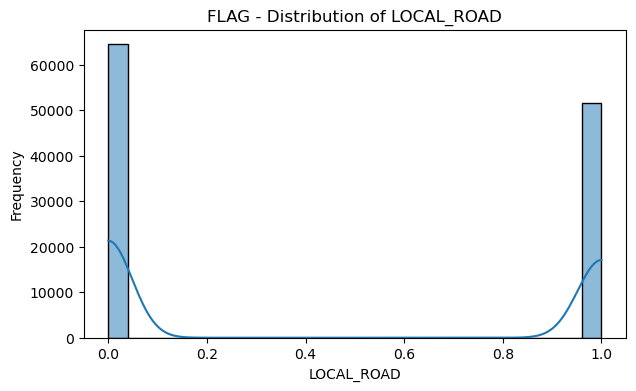

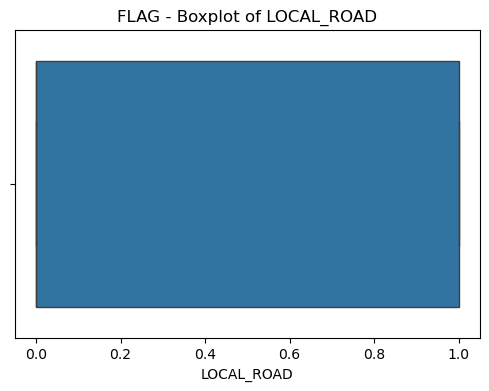

<Figure size 600x500 with 0 Axes>

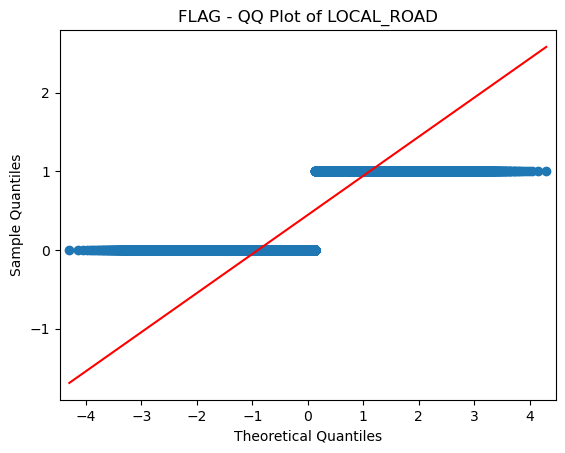


[FLAG] Numeric Column: STATE_ROAD
  Count: 116118
  Skewness: -1.06
  Kurtosis: -0.87


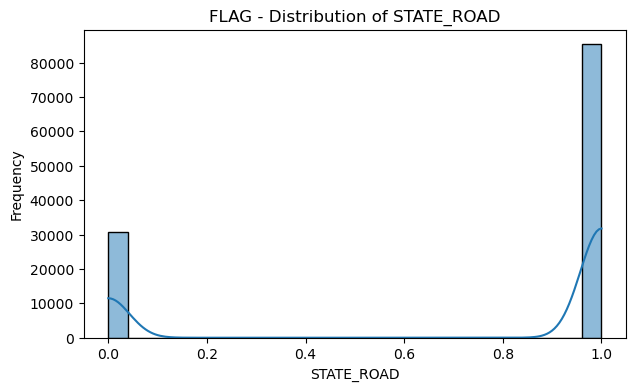

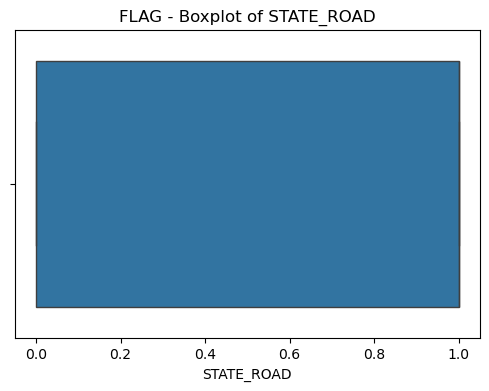

<Figure size 600x500 with 0 Axes>

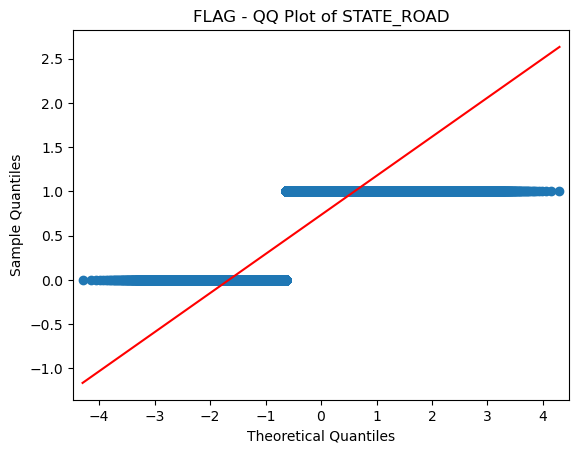


[FLAG] Numeric Column: INTERSTATE
  Count: 116118
  Skewness: 2.84
  Kurtosis: 6.05


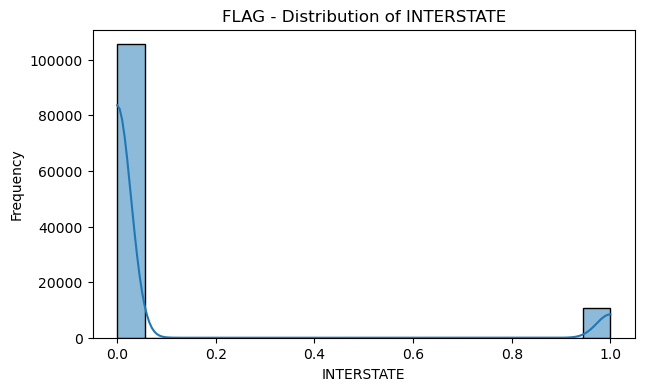

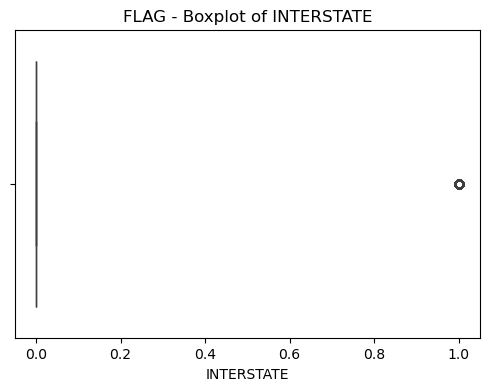

<Figure size 600x500 with 0 Axes>

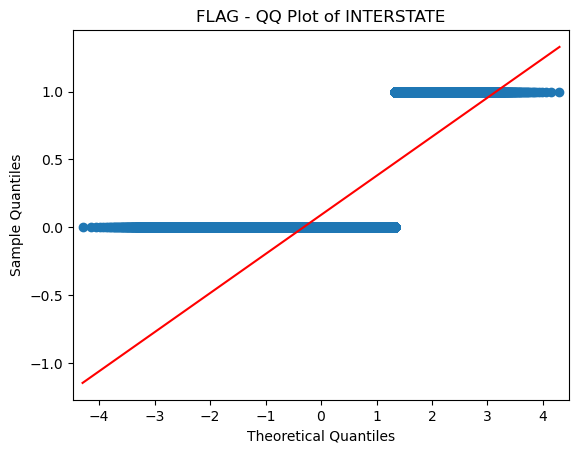

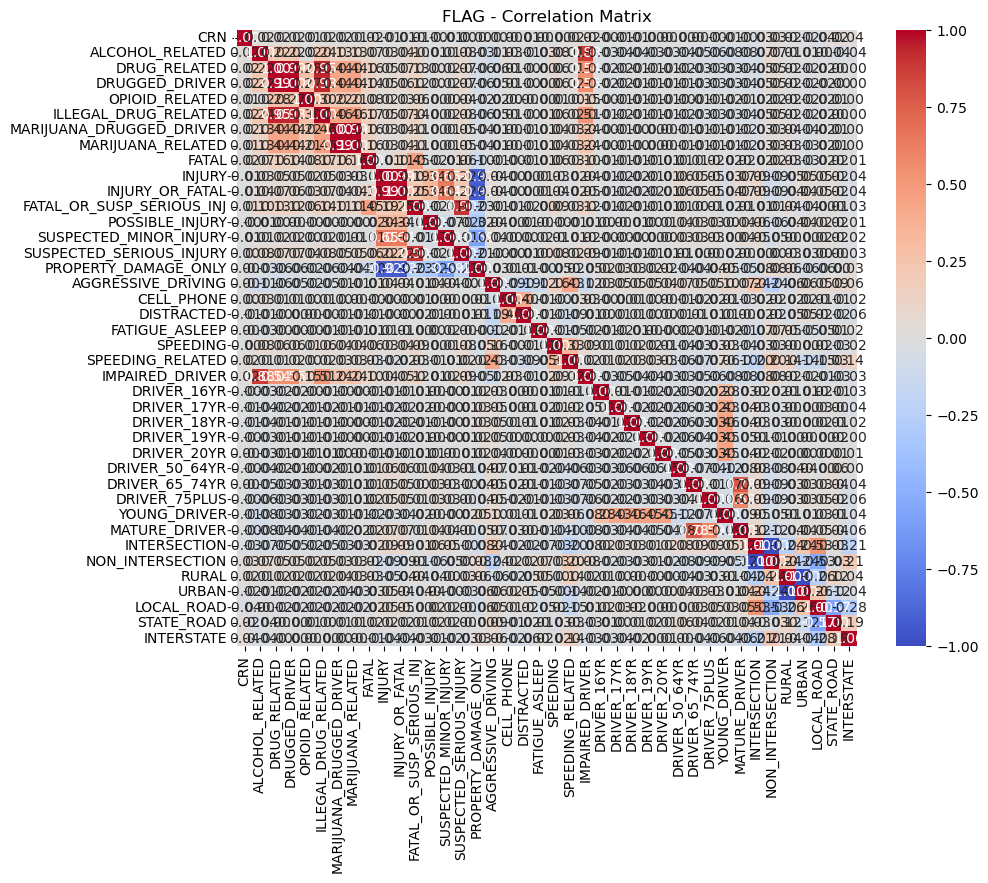

C:\Users\jason\anaconda3\envs\DeepL\lib\site-packages\statsmodels\stats\outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)



[FLAG] Variance Inflation Factors:
                      Feature           VIF
0                         CRN  1.000000e+00
1             ALCOHOL_RELATED  9.070000e+00
2                DRUG_RELATED  5.371000e+01
3              DRUGGED_DRIVER  4.738000e+01
4              OPIOID_RELATED  1.140000e+00
5        ILLEGAL_DRUG_RELATED  1.046000e+01
6    MARIJUANA_DRUGGED_DRIVER  9.343000e+01
7           MARIJUANA_RELATED  9.334000e+01
8                       FATAL  6.530000e+00
9                      INJURY  1.576900e+02
10            INJURY_OR_FATAL  1.641100e+02
11  FATAL_OR_SUSP_SERIOUS_INJ  4.890000e+01
12            POSSIBLE_INJURY  1.430000e+00
13     SUSPECTED_MINOR_INJURY  2.240000e+00
14   SUSPECTED_SERIOUS_INJURY  3.945000e+01
15       PROPERTY_DAMAGE_ONLY  7.550000e+00
16         AGGRESSIVE_DRIVING  1.560000e+00
17                 CELL_PHONE  1.190000e+00
18                 DISTRACTED  1.240000e+00
19             FATIGUE_ASLEEP  1.020000e+00
20                   SPEEDING  1.160000e

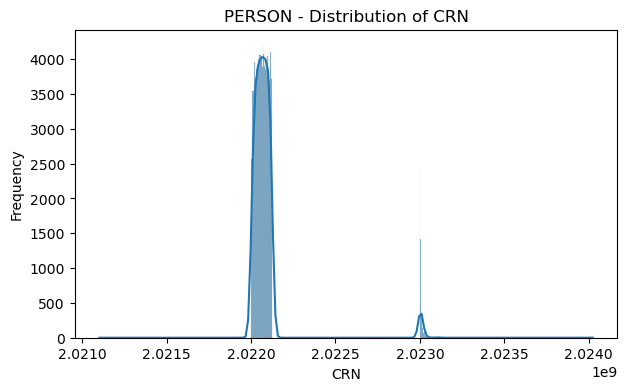

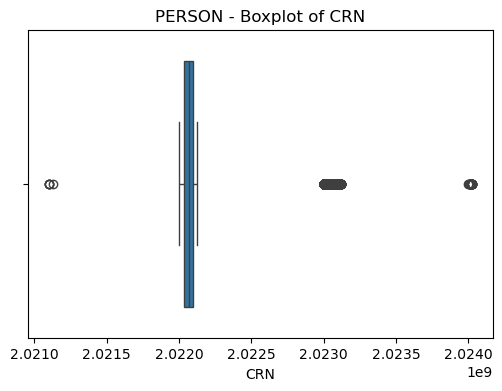

<Figure size 600x500 with 0 Axes>

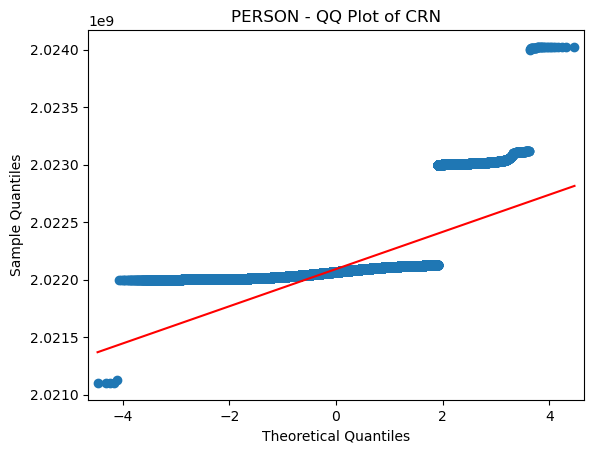


[PERSON] Numeric Column: UNIT_NUM
  Count: 254031
  Skewness: 5.17
  Kurtosis: 88.81


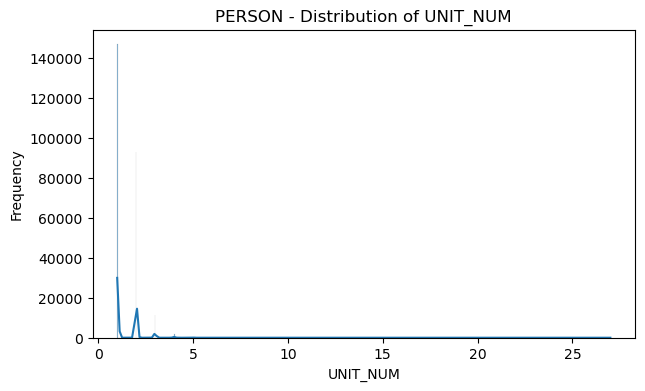

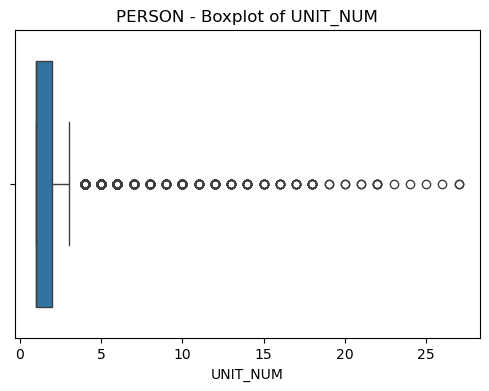

<Figure size 600x500 with 0 Axes>

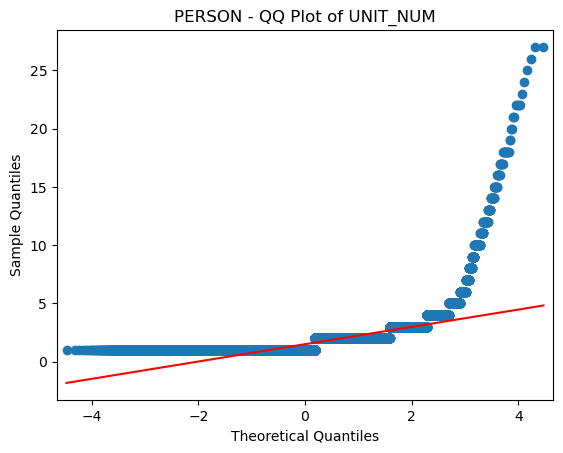


[PERSON] Numeric Column: AGE
  Count: 254031
  Skewness: 0.75
  Kurtosis: 0.10


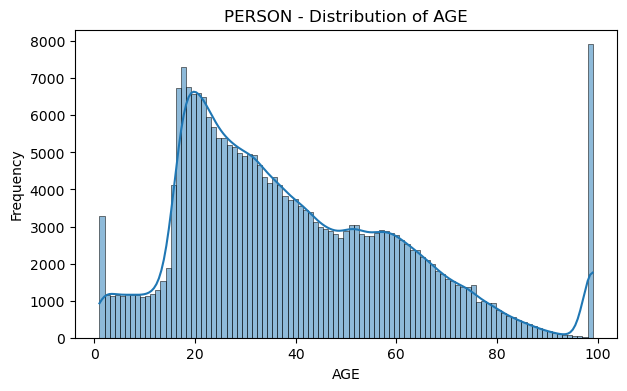

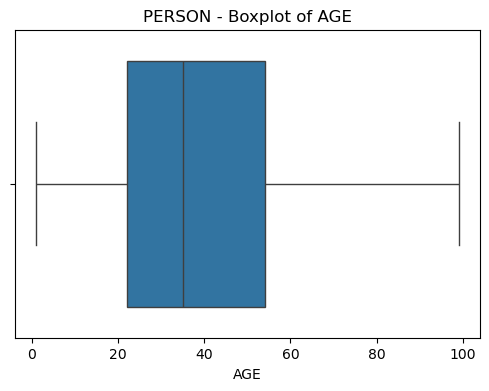

<Figure size 600x500 with 0 Axes>

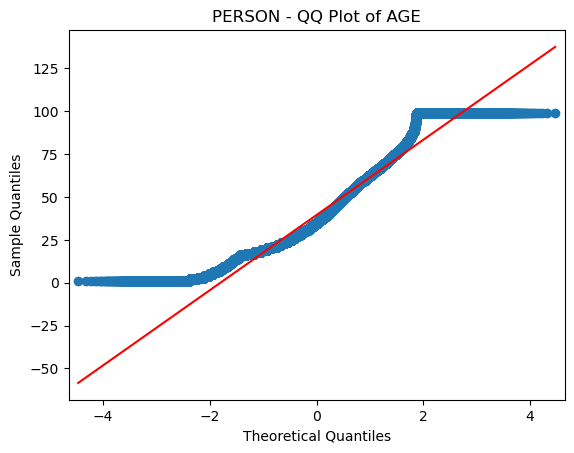


[PERSON] Numeric Column: INJ_SEVERITY
  Count: 254031
  Skewness: 1.84
  Kurtosis: 2.30


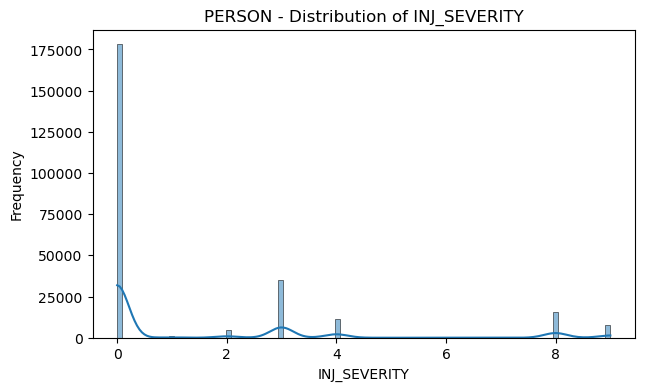

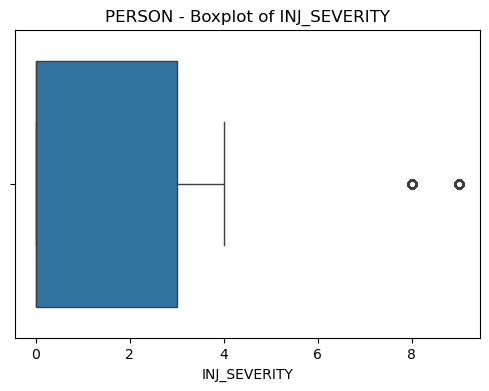

<Figure size 600x500 with 0 Axes>

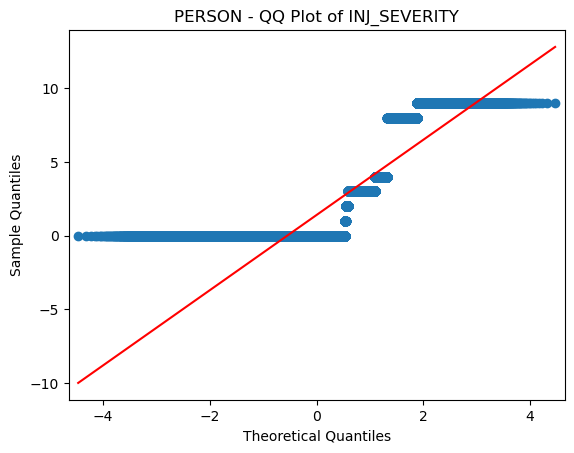


[PERSON] Numeric Column: PERSON_TYPE
  Count: 254031
  Skewness: 5.11
  Kurtosis: 31.56


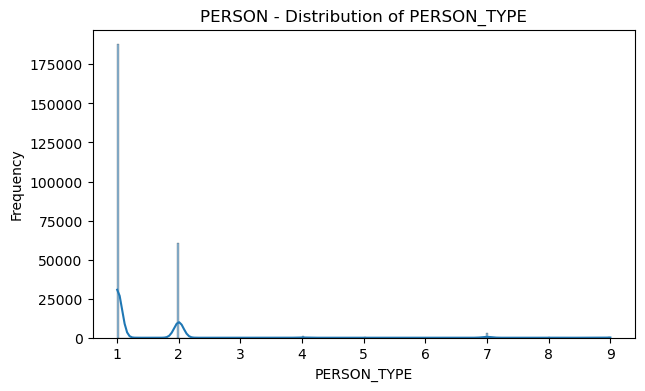

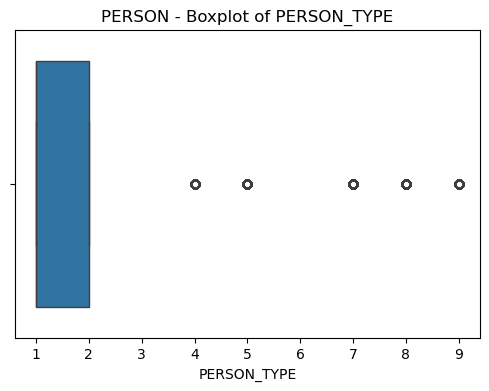

<Figure size 600x500 with 0 Axes>

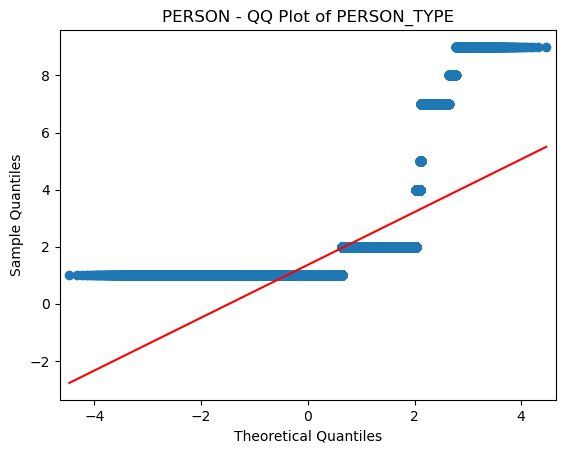


[PERSON] Numeric Column: SEAT_POSITION
  Count: 254031
  Skewness: 9.39
  Kurtosis: 90.14


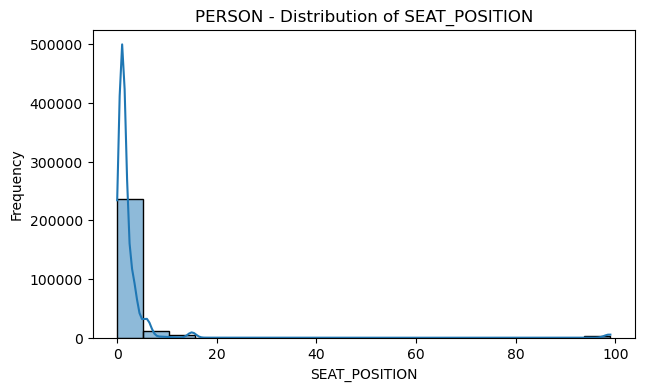

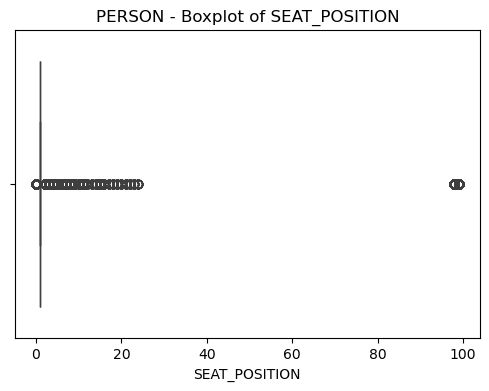

<Figure size 600x500 with 0 Axes>

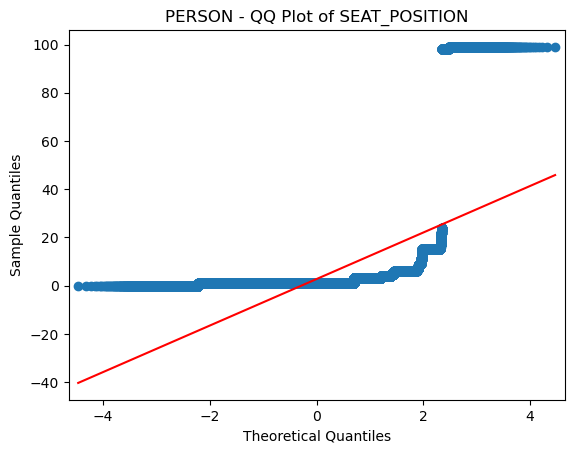


[PERSON] Numeric Column: RESTRAINT_HELMET
  Count: 254030
  Skewness: 2.22
  Kurtosis: 2.97


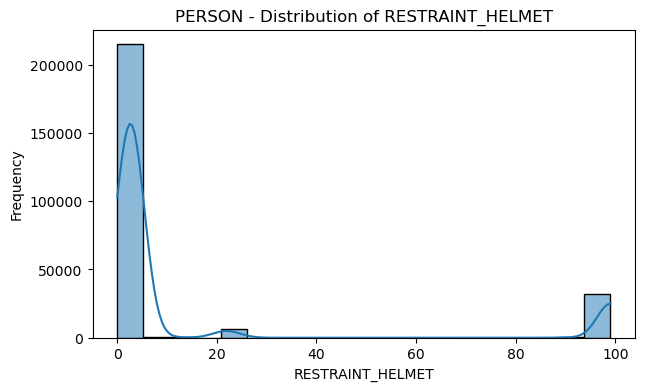

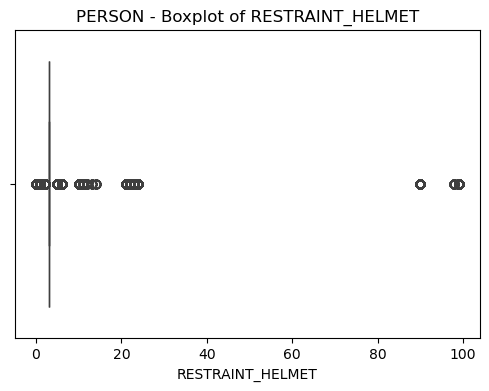

<Figure size 600x500 with 0 Axes>

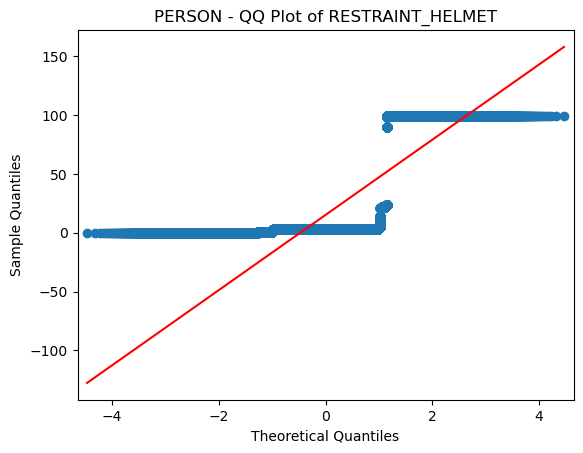


[PERSON] Numeric Column: DVR_PED_CONDITION
  Count: 250657
  Skewness: 3.73
  Kurtosis: 12.51


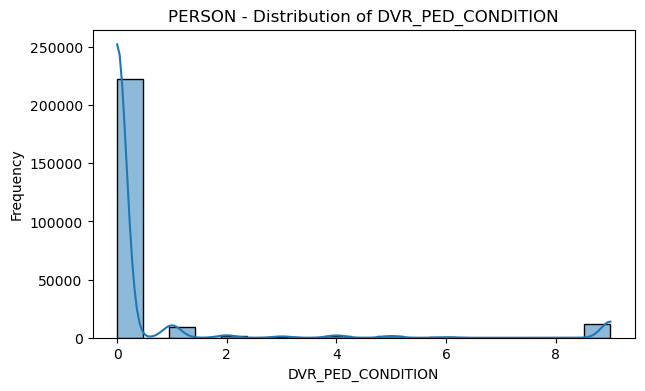

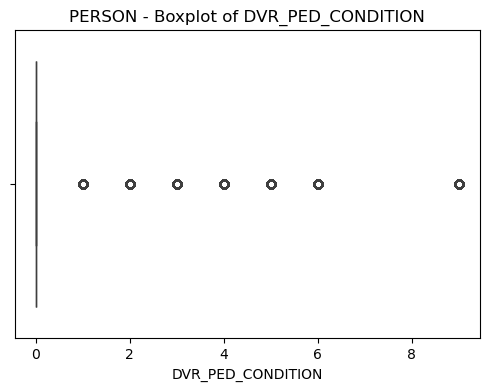

<Figure size 600x500 with 0 Axes>

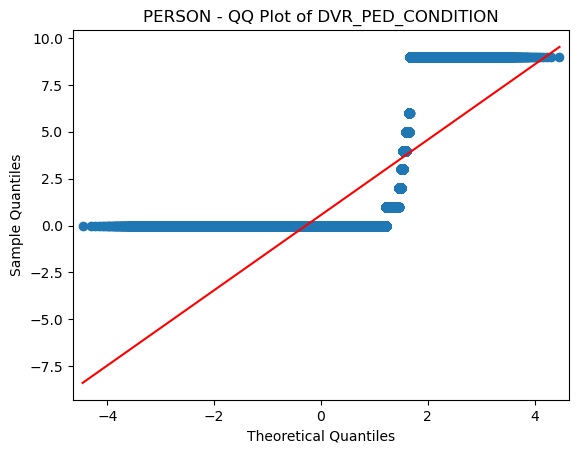


[PERSON] Numeric Column: VULNERABLE_ROAD_USER
  Count: 254031
  Skewness: 7.63
  Kurtosis: 56.29


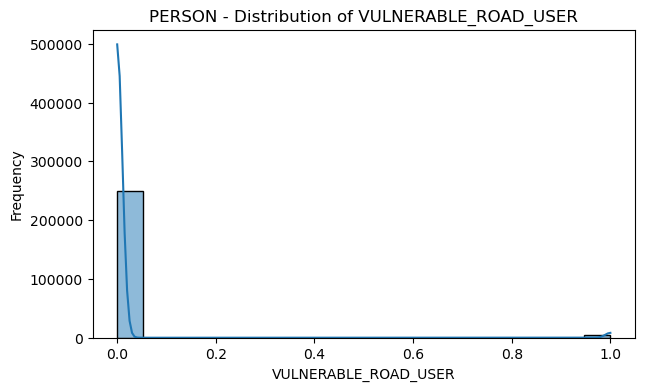

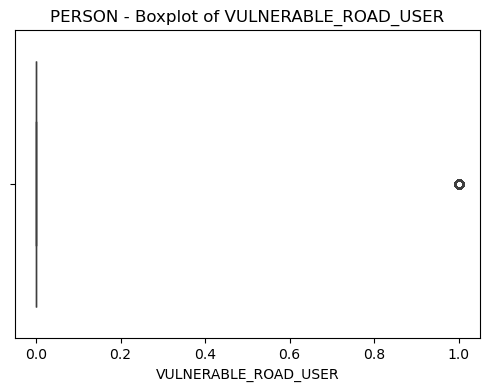

<Figure size 600x500 with 0 Axes>

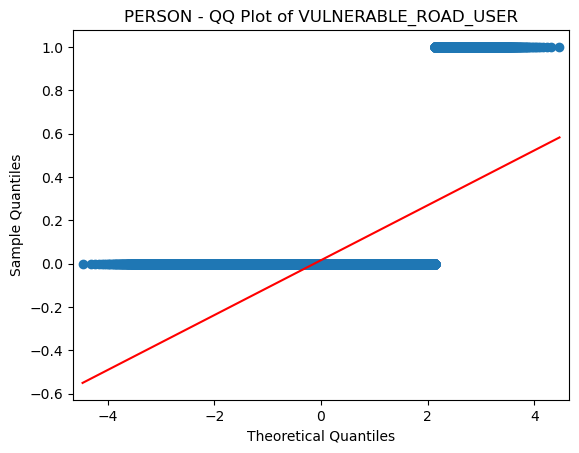


[PERSON] Categorical Column: SEX
SEX
M    141387
F    107270
U      5374
Name: count, dtype: int64


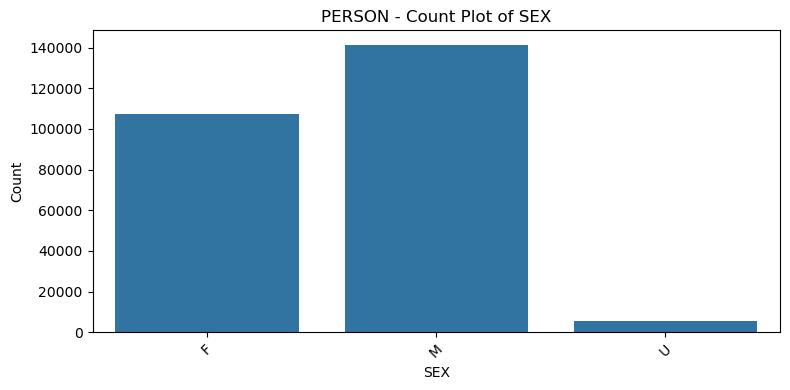


[PERSON] Categorical Column: TRANSPORTED
TRANSPORTED
N      182204
Y       44525
R       16917
NaN     10385
Name: count, dtype: int64


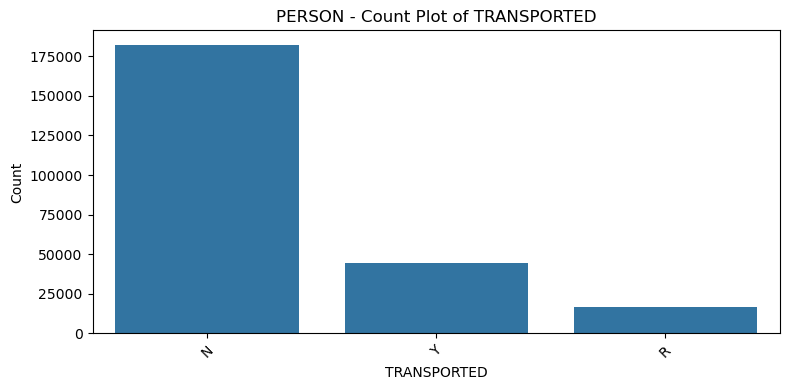

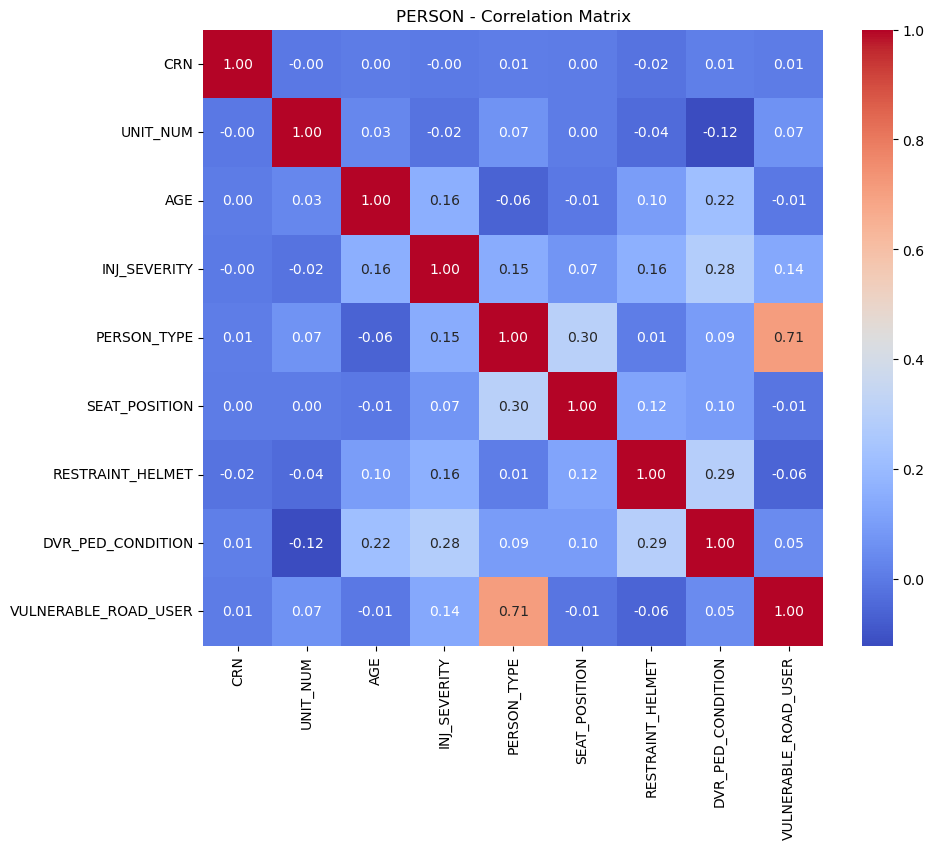


[PERSON] Variance Inflation Factors:
                Feature    VIF
0                   CRN  13.08
1              UNIT_NUM   1.03
2                   AGE   1.08
3          INJ_SEVERITY   1.13
4           PERSON_TYPE   2.54
5         SEAT_POSITION   1.26
6      RESTRAINT_HELMET   1.12
7     DVR_PED_CONDITION   1.23
8  VULNERABLE_ROAD_USER   2.30

=== EXTENDED EXPLORATORY PLOTS FOR VEHICLE FILE ===

[VEHICLE] Numeric Column: CRN
  Count: 206630
  Skewness: 5.33
  Kurtosis: 28.76


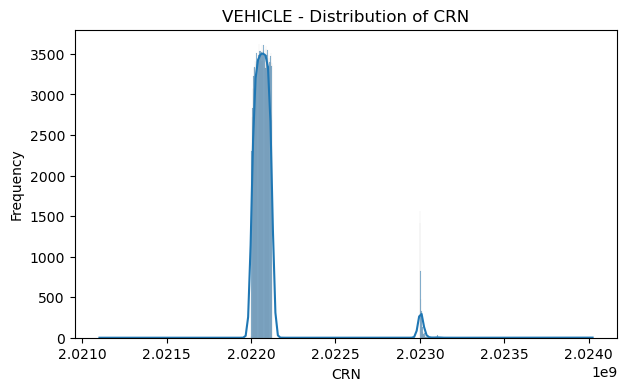

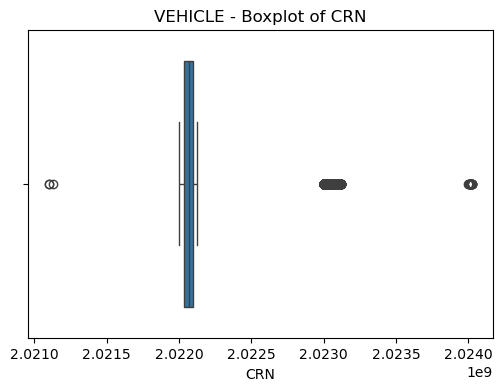

<Figure size 600x500 with 0 Axes>

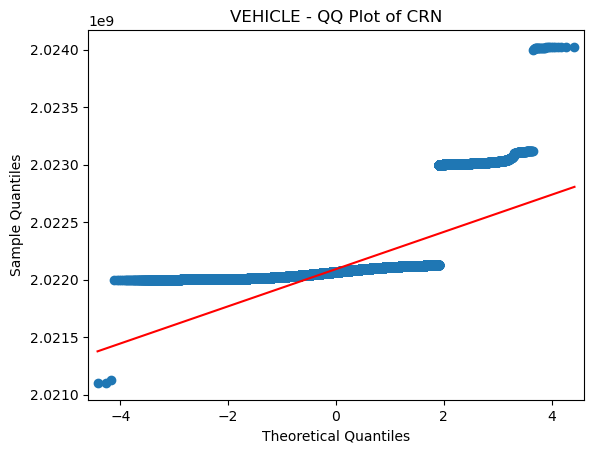


[VEHICLE] Numeric Column: UNIT_NUM
  Count: 206630
  Skewness: 4.21
  Kurtosis: 61.31


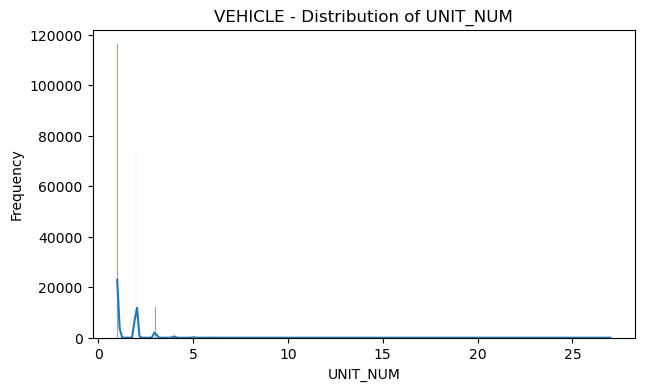

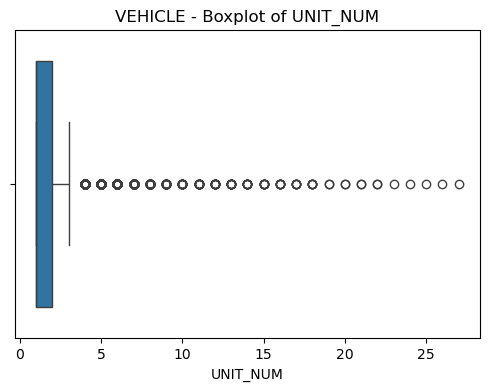

<Figure size 600x500 with 0 Axes>

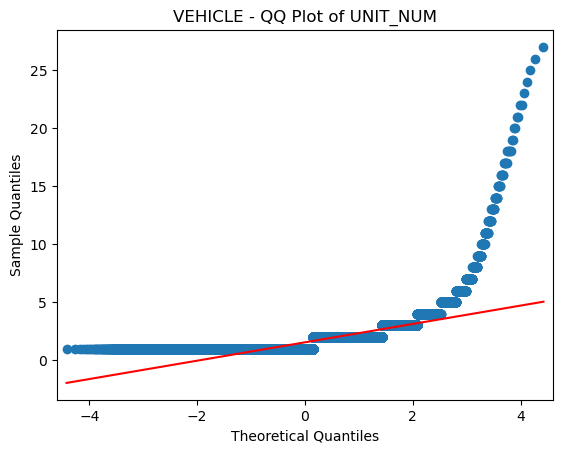


[VEHICLE] Numeric Column: VEH_TYPE
  Count: 206461
  Skewness: 7.75
  Kurtosis: 66.77


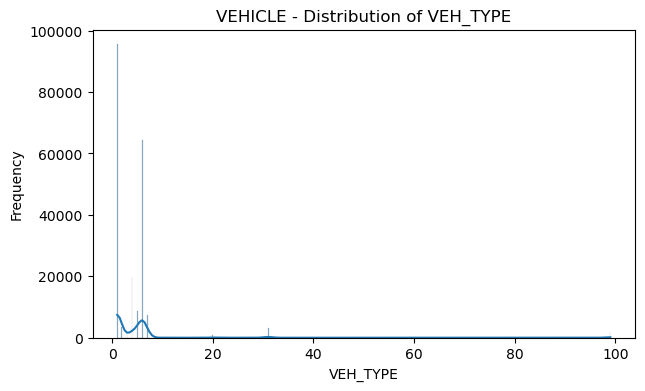

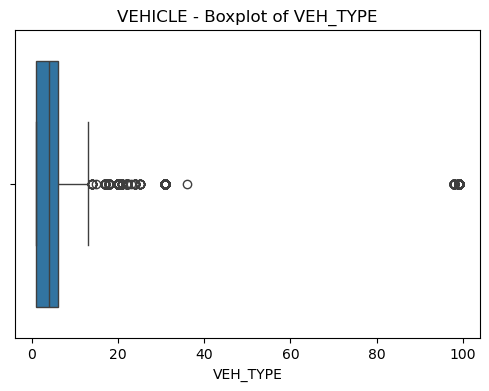

<Figure size 600x500 with 0 Axes>

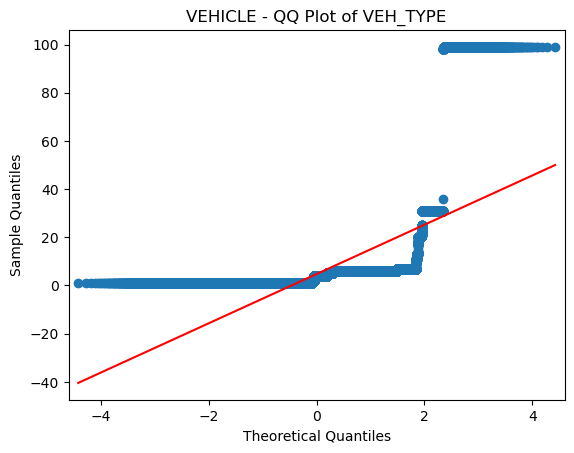


[VEHICLE] Numeric Column: BODY_TYPE
  Count: 199944
  Skewness: 0.78
  Kurtosis: -1.10


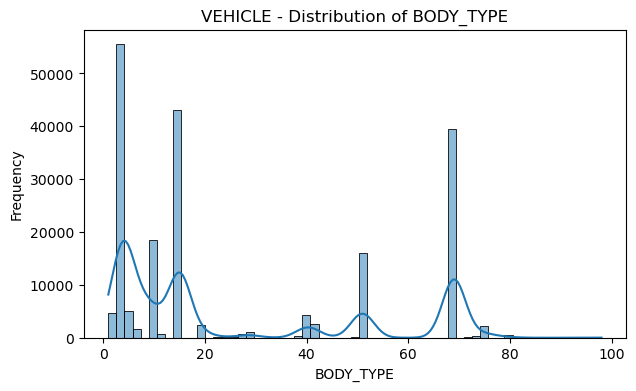

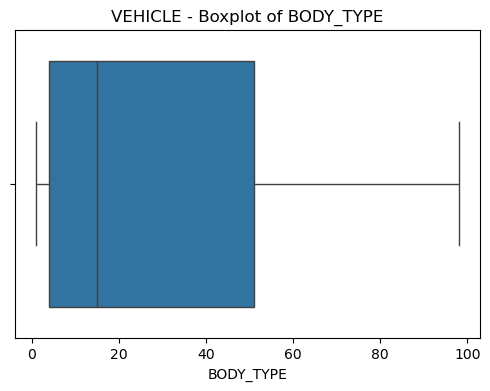

<Figure size 600x500 with 0 Axes>

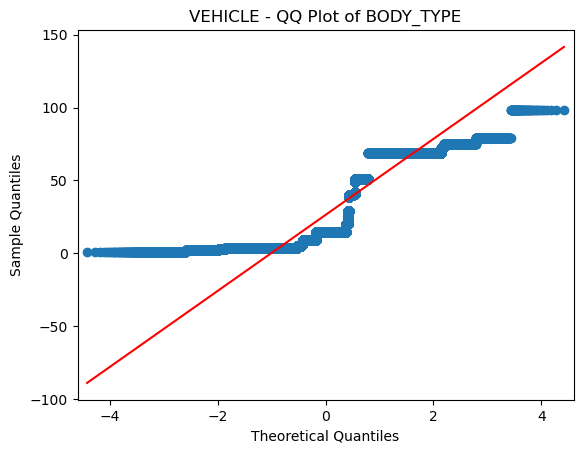


[VEHICLE] Numeric Column: MODEL_YR
  Count: 198185
  Skewness: 26.48
  Kurtosis: 699.56


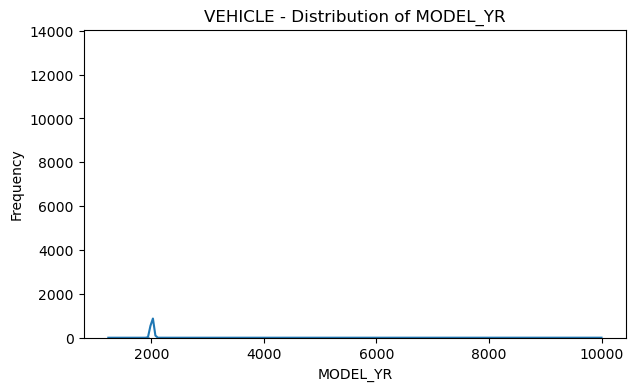

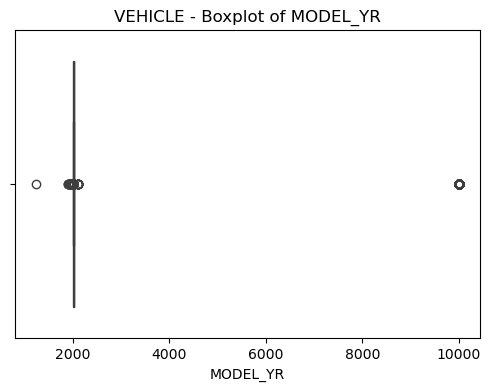

<Figure size 600x500 with 0 Axes>

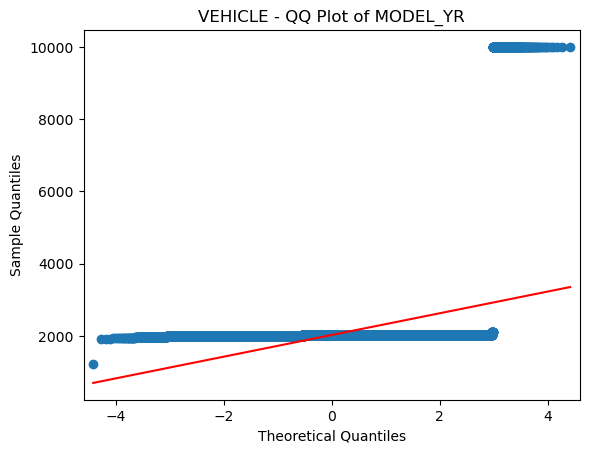


[VEHICLE] Numeric Column: VEH_ROLE
  Count: 206627
  Skewness: 0.27
  Kurtosis: -0.11


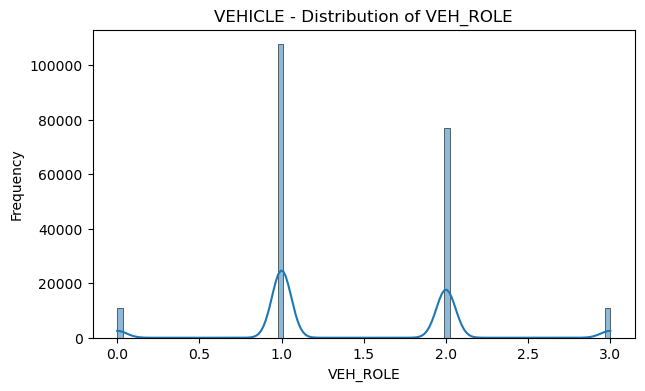

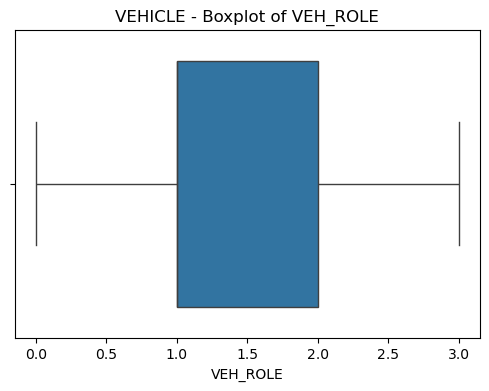

<Figure size 600x500 with 0 Axes>

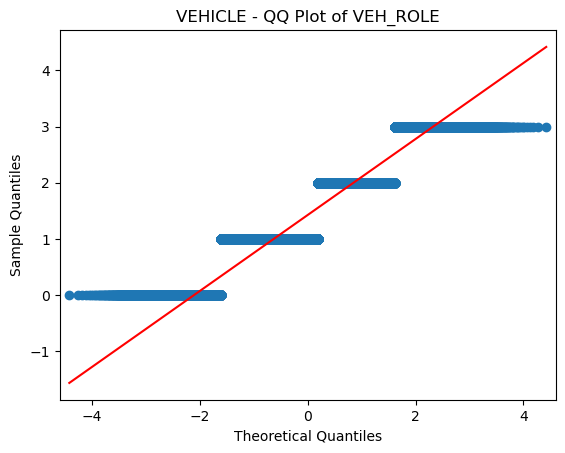


[VEHICLE] Numeric Column: VEH_MOVEMENT
  Count: 206541
  Skewness: 4.71
  Kurtosis: 23.31


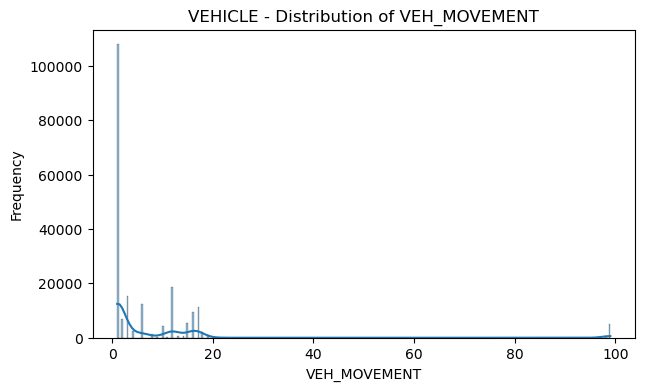

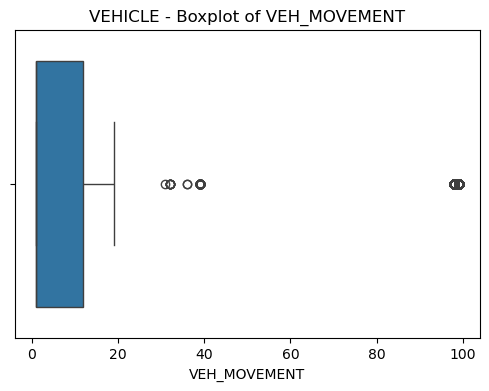

<Figure size 600x500 with 0 Axes>

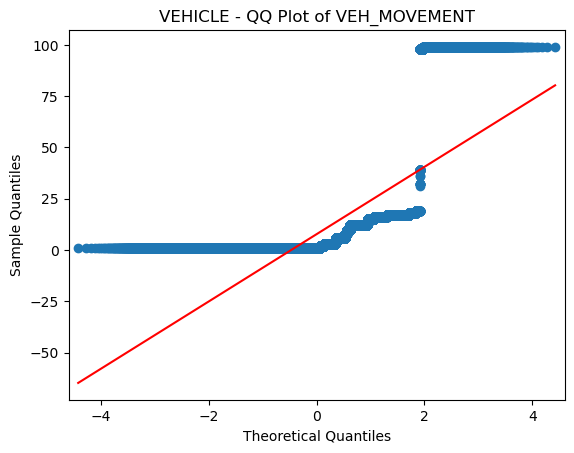


[VEHICLE] Numeric Column: TRAVEL_SPD
  Count: 202624
  Skewness: 0.96
  Kurtosis: -1.08


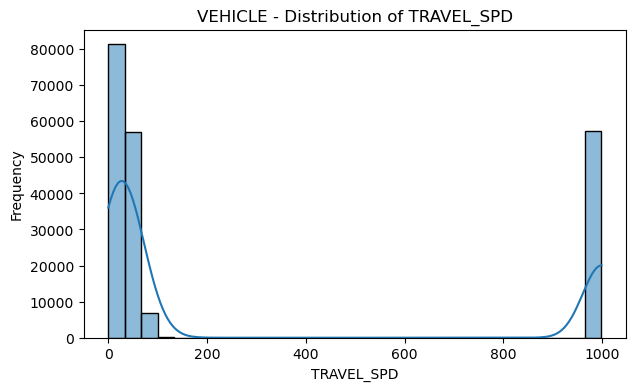

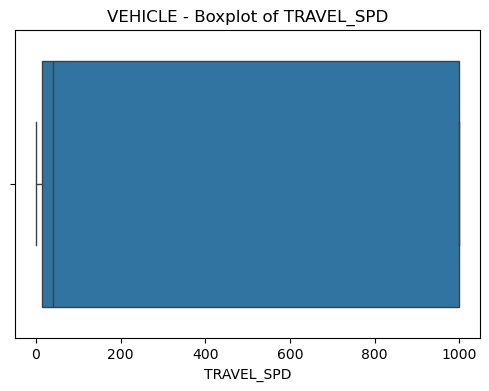

<Figure size 600x500 with 0 Axes>

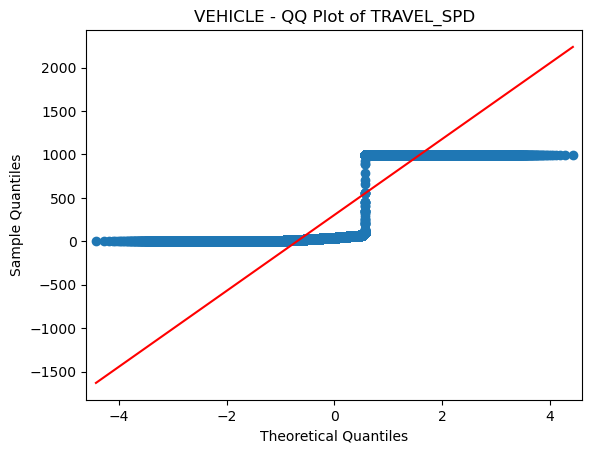


[VEHICLE] Numeric Column: UNIT_TYPE
  Count: 206630
  Skewness: 6.70
  Kurtosis: 47.49


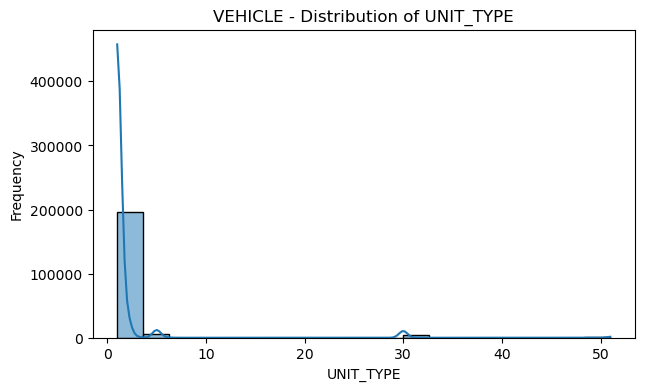

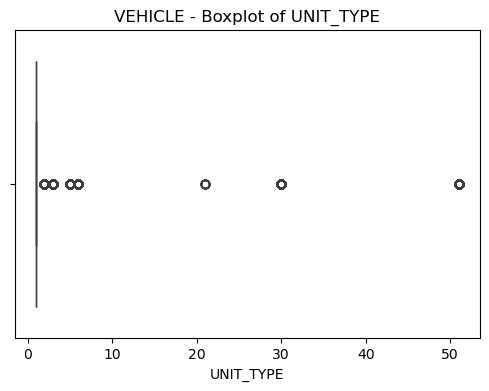

<Figure size 600x500 with 0 Axes>

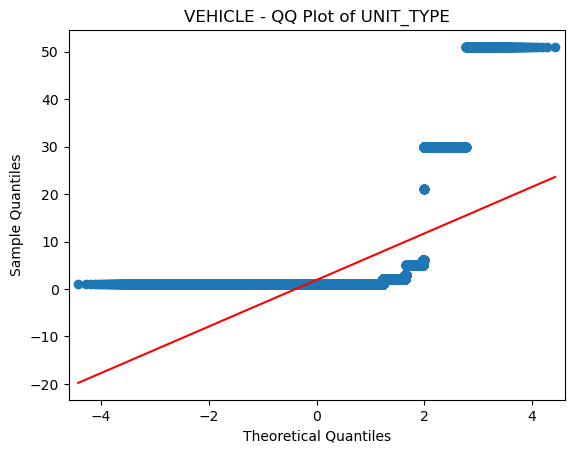


[VEHICLE] Column 'MAKE_CD' has high cardinality (163 unique). Skipping bar plot.

[VEHICLE] Categorical Column: COMM_VEH
COMM_VEH
N      194545
Y        9596
NaN      2447
U          42
Name: count, dtype: int64


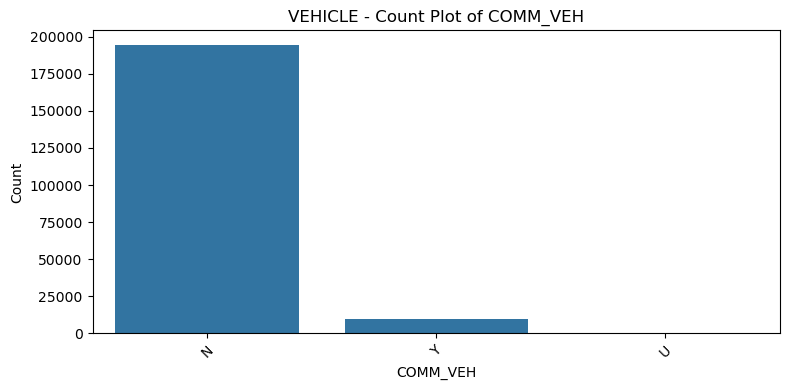

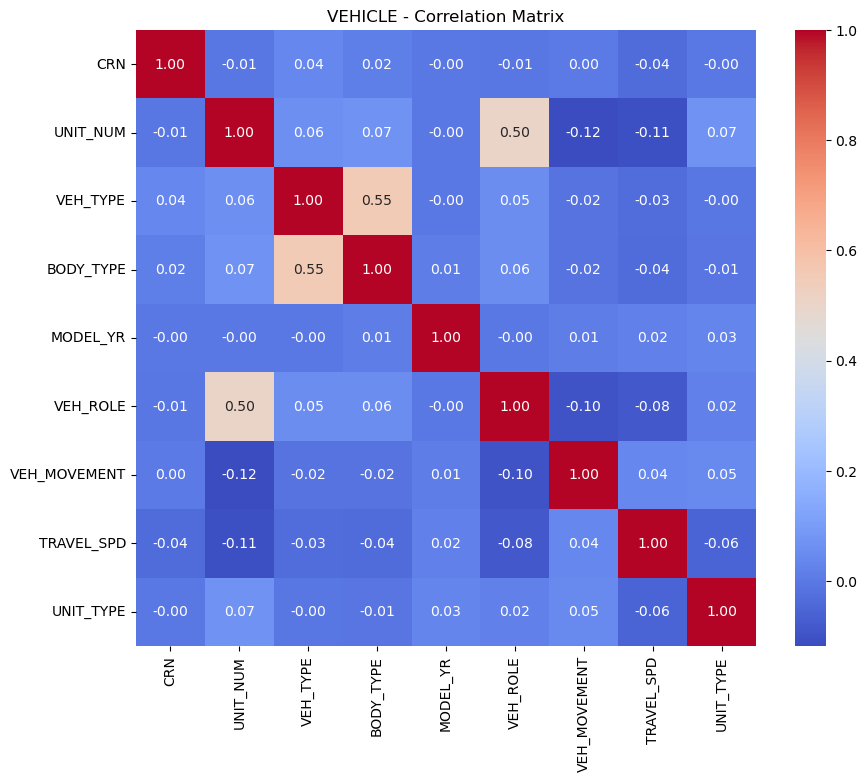


[VEHICLE] Variance Inflation Factors:
        Feature    VIF
0           CRN  57.31
1      UNIT_NUM   1.37
2      VEH_TYPE   1.44
3     BODY_TYPE   1.44
4      MODEL_YR   1.00
5      VEH_ROLE   1.35
6  VEH_MOVEMENT   1.02
7    TRAVEL_SPD   1.02
8     UNIT_TYPE   1.01

=== MERGING DATAFRAMES FOR SCATTER PLOTS ===
Shape after merging CRASH and FLAG: (116118, 80)
Shape after merging CRASH+FLAG and VEHICLE: (206630, 90)
Shape after merging CRASH+FLAG+VEHICLE and PERSON (on CRN, UNIT_NUM): (266831, 98)
Columns available in potentially fully merged data: ['CRN', 'CRASH_MONTH', 'CRASH_YEAR', 'DAY_OF_WEEK', 'HOUR_OF_DAY', 'TIME_OF_DAY', 'COUNTY', 'MUNICIPALITY', 'DISTRICT', 'DEC_LAT', 'DEC_LONG', 'MAX_SEVERITY_LEVEL', 'COLLISION_TYPE', 'INTERSECTION_RELATED', 'RELATION_TO_ROAD', 'ROAD_CONDITION', 'ILLUMINATION', 'URBAN_RURAL', 'DRIVER_COUNT_16YR', 'DRIVER_COUNT_17YR', 'DRIVER_COUNT_18YR', 'DRIVER_COUNT_19YR', 'DRIVER_COUNT_20YR', 'DRIVER_COUNT_50_64YR', 'DRIVER_COUNT_65_74YR', 'DRIVER_COUNT_7

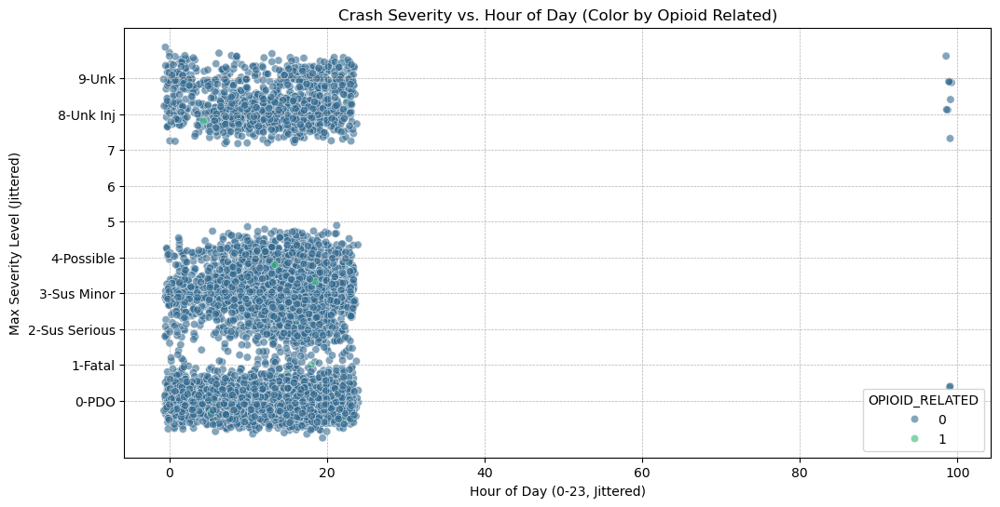

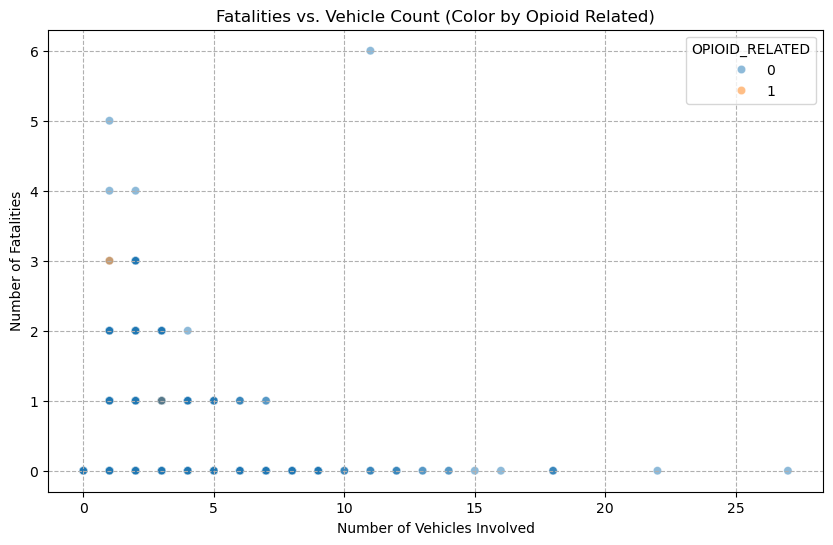

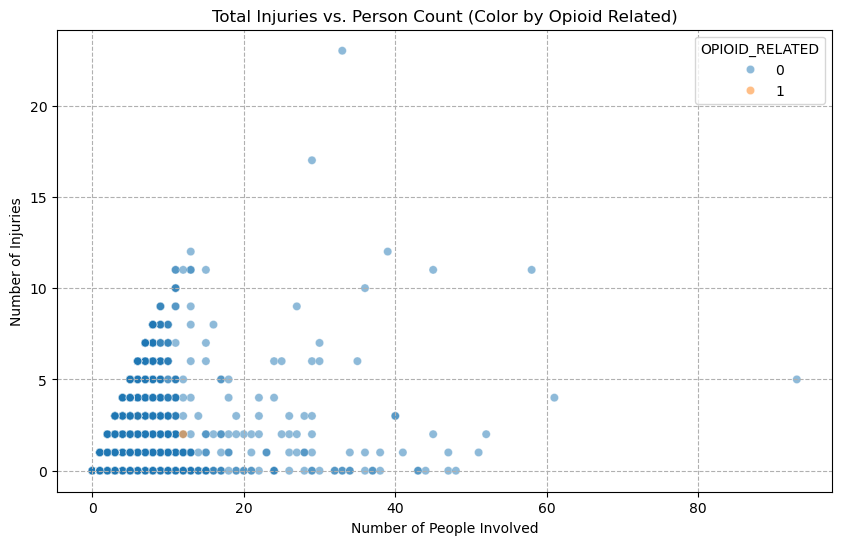

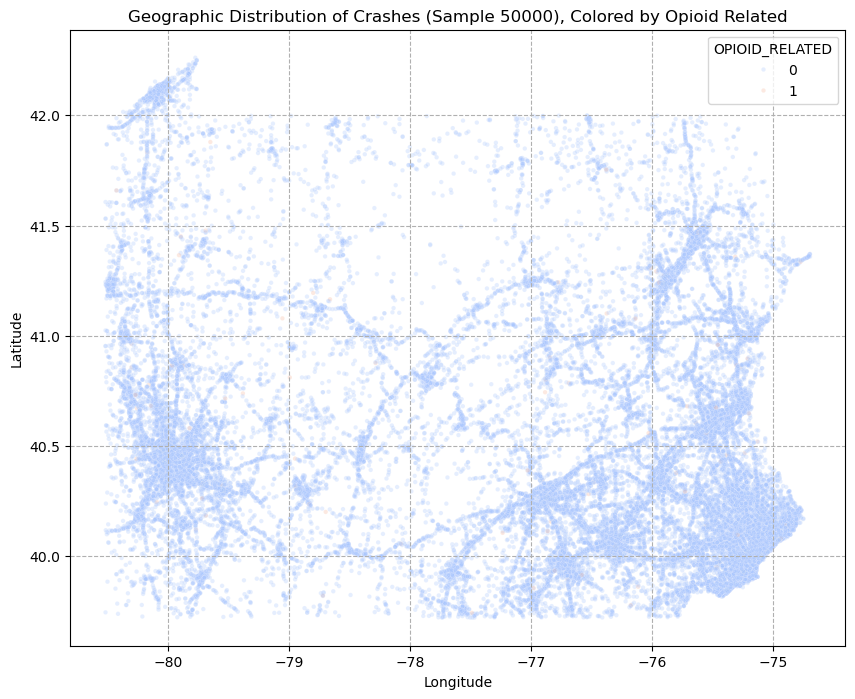


--- Scatter Plots: Person Data ---


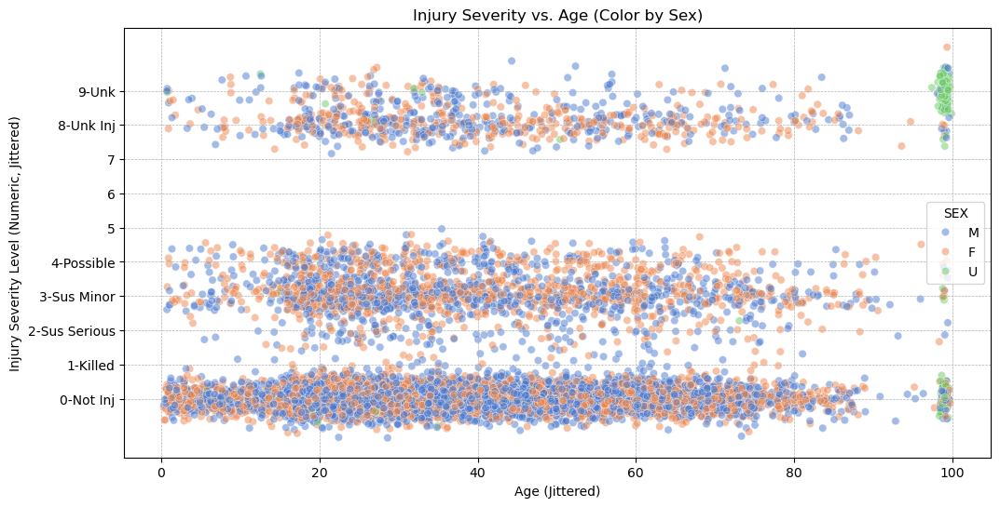


--- Scatter Plots: Vehicle Data ---


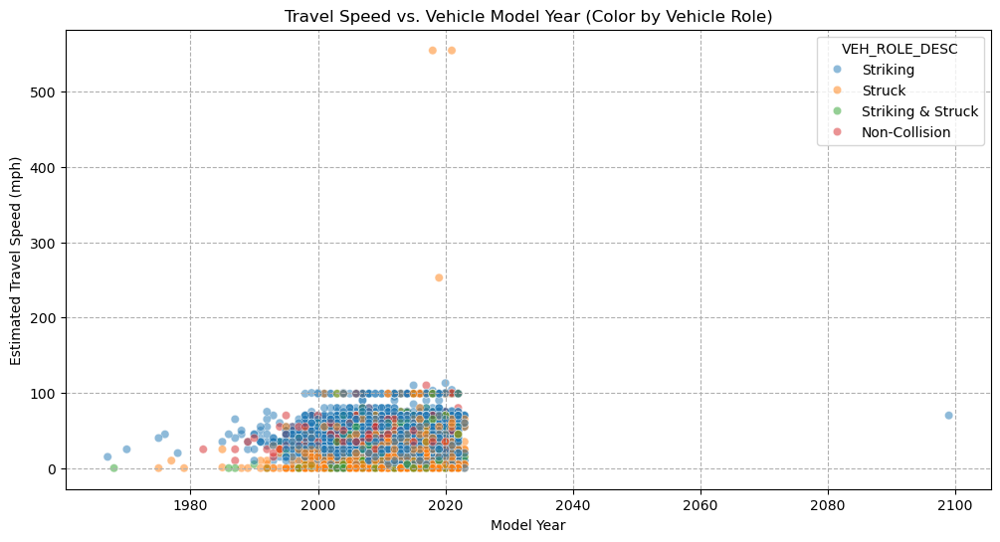


Analysis Complete.


C:\Users\jason\AppData\Local\Temp\ipykernel_22248\3061069833.py:93: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if X[col].dtype == object or pd.api.types.is_categorical_dtype(X[col]):



===== CRASH table advanced keep/drop =====
KEEP:
    CRN
    CRASH_MONTH
    CRASH_YEAR
    DAY_OF_WEEK
    HOUR_OF_DAY
    TIME_OF_DAY
    COUNTY
    MUNICIPALITY
    DISTRICT
    DEC_LAT
    DEC_LONG
    MAX_SEVERITY_LEVEL
    COLLISION_TYPE
    INTERSECTION_RELATED
    RELATION_TO_ROAD
    ROAD_CONDITION
    ILLUMINATION
    URBAN_RURAL
    DRIVER_COUNT_16YR
    DRIVER_COUNT_17YR
    DRIVER_COUNT_18YR
    DRIVER_COUNT_19YR
    DRIVER_COUNT_20YR
    DRIVER_COUNT_50_64YR
    DRIVER_COUNT_65_74YR
    DRIVER_COUNT_75PLUS
    FATAL_COUNT
    INJURY_COUNT
    TOT_INJ_COUNT
    VEHICLE_COUNT
    TOTAL_UNITS
    AUTOMOBILE_COUNT
    BICYCLE_COUNT
    BUS_COUNT
    COMM_VEH_COUNT
    HEAVY_TRUCK_COUNT
    MOTORCYCLE_COUNT
    SMALL_TRUCK_COUNT
    SUV_COUNT
    VAN_COUNT
    PERSON_COUNT
DROP:

===== FLAG table advanced keep/drop =====
KEEP:
    CRN
    DRUG_RELATED
    DRUGGED_DRIVER
    OPIOID_RELATED
    ILLEGAL_DRUG_RELATED
    MARIJUANA_DRUGGED_DRIVER
    MARIJUANA_RELATED
    FATAL_OR

In [124]:
# Main Analysis

if __name__ == "__main__":

    # Example: Analyze FLAG file for 2022
    flag_file_path = "C:/Users/jason/OneDrive - The Pennsylvania State University/DAAN 881, Data Drive Decision Making/Project/Auto Data/PA/Statewide_2022/FLAG_2022.csv"
    df_flag = pd.read_csv(flag_file_path, low_memory=False)
    df_flag = df_flag[[col for col in FLAG if col in df_flag.columns]].copy()
    df_flag = analyze_flag_file(df_flag)

    # Example: Analyze CRASH file for 2022
    crash_file_path = "C:/Users/jason/OneDrive - The Pennsylvania State University/DAAN 881, Data Drive Decision Making/Project/Auto Data/PA/Statewide_2022/CRASH_2022.csv"
    df_crash = pd.read_csv(crash_file_path, low_memory=False)
    df_crash = df_crash[[col for col in CRASH if col in df_crash.columns]].copy()
    df_crash = analyze_crash_file(df_crash)

    # Example: Analyze PERSON file for 2022
    person_file_path = "C:/Users/jason/OneDrive - The Pennsylvania State University/DAAN 881, Data Drive Decision Making/Project/Auto Data/PA/Statewide_2022/PERSON_2022.csv"
    df_person = pd.read_csv(person_file_path, low_memory=False)
    df_person = df_person[[col for col in PERSON if col in df_person.columns]].copy()
    df_person = analyze_person_file(df_person)

    # Example: Analyze VEHICLE file for 2022
    vehicle_file_path = "C:/Users/jason/OneDrive - The Pennsylvania State University/DAAN 881, Data Drive Decision Making/Project/Auto Data/PA/Statewide_2022/VEHICLE_2022.csv"
    df_vehicle = pd.read_csv(vehicle_file_path, low_memory=False)
    df_vehicle = df_vehicle[[col for col in VEHICLE if col in df_vehicle.columns]].copy()
    df_vehicle = analyze_vehicle_file(df_vehicle)

    # Corrective Actions
    print("\n=== Corrective Actions Reports ===")
    report_flag   = report_corrective_actions(df_flag,   "FLAG")
    report_crash  = report_corrective_actions(df_crash,  "CRASH")
    report_person = report_corrective_actions(df_person, "PERSON")
    report_vehicle= report_corrective_actions(df_vehicle,"VEHICLE")

    # Additional Cross-Dataset Checks
    print("\n--- Text Case Consistency Check ---")
    print("FLAG file:", check_text_case_consistency(df_flag))
    print("CRASH file:", check_text_case_consistency(df_crash))
    print("PERSON file:", check_text_case_consistency(df_person))
    print("VEHICLE file:", check_text_case_consistency(df_vehicle))

    print("\n--- Encoding Check (UTF-8) ---")
    print("FLAG file:", check_encoding(df_flag))
    print("CRASH file:", check_encoding(df_crash))
    print("PERSON file:", check_encoding(df_person))
    print("VEHICLE file:", check_encoding(df_vehicle))

    location_cols_crash = ['COUNTY', 'DISTRICT', 'MUNICIPALITY']
    print("\n--- Location Consistency Report for CRASH file ---")
    print(report_location_consistency(df_crash, location_cols_crash))

        # --- EXTENDED EXPLORATORY PLOTS ---
    print("\n=== EXTENDED EXPLORATORY PLOTS FOR CRASH FILE ===")
    extended_exploratory_plots(df_crash, file_tag="CRASH")

    print("\n=== EXTENDED EXPLORATORY PLOTS FOR FLAG FILE ===")
    extended_exploratory_plots(df_flag, file_tag="FLAG")

    print("\n=== EXTENDED EXPLORATORY PLOTS FOR PERSON FILE ===")
    extended_exploratory_plots(df_person, file_tag="PERSON")

    print("\n=== EXTENDED EXPLORATORY PLOTS FOR VEHICLE FILE ===")
    extended_exploratory_plots(df_vehicle, file_tag="VEHICLE")

        # --- Merge Data for Combined Analysis ---
    print("\n=== MERGING DATAFRAMES FOR SCATTER PLOTS ===")
    
    # Ensure keys are appropriate type (string often safest for merge)
    df_crash['CRN'] = df_crash['CRN'].astype(str)
    df_flag['CRN'] = df_flag['CRN'].astype(str)
    df_person['CRN'] = df_person['CRN'].astype(str)
    df_vehicle['CRN'] = df_vehicle['CRN'].astype(str)

    # Check if UNIT_NUM exists before converting
    if 'UNIT_NUM' in df_person.columns:
       df_person['CRN'] = df_person['CRN'].astype(str)
       df_person['UNIT_NUM'] = df_person['UNIT_NUM'].astype(str)
    else:
        print("Warning: UNIT_NUM not found in df_person. Merging might be incomplete.")

    if 'UNIT_NUM' in df_vehicle.columns:
        df_vehicle['CRN'] = df_vehicle['CRN'].astype(str)
        df_vehicle['UNIT_NUM'] = df_vehicle['UNIT_NUM'].astype(str)
    else:
        print("Warning: UNIT_NUM not found in df_vehicle. Merging might be incomplete.")
    
    # Merge FLAG data into CRASH data using CRN as the key
    flag_cols_to_merge = [col for col in df_flag.columns if col != 'CRN']
    df_merged_crash_flag = pd.merge(df_crash, df_flag[['CRN'] + flag_cols_to_merge], on='CRN', how='left', suffixes=('_crash', '_flag'))
    print(f"Shape after merging CRASH and FLAG: {df_merged_crash_flag.shape}")

    # Merge VEHICLE into CRASH+FLAG (on CRN)
    # Ensure 'advanced_results' is available from previous steps
    if 'advanced_results' in locals():
         vehicle_keep_final = advanced_results['VEHICLE']['keep']
    else:
         # Fallback if advanced_results wasn't run or saved - use domain filter list
         _, _, _, vehicle_keep_domain = domain_driven_filter(df_crash, df_flag, df_person, df_vehicle)
         vehicle_keep_final = list(vehicle_keep_domain)
         print("Warning: Using domain_driven_filter for vehicle columns as advanced_results not found.")

    vehicle_cols_to_merge = [col for col in vehicle_keep_final if col not in ['CRN']] # Keep UNIT_NUM if present
    if 'UNIT_NUM' not in df_vehicle.columns: # Add check before selecting columns
        vehicle_cols_to_merge = [col for col in vehicle_cols_to_merge if col != 'UNIT_NUM']
        print("UNIT_NUM not in df_vehicle, merging VEHICLE on CRN only.")
        df_merged_crash_unit = pd.merge(df_merged_crash_flag, df_vehicle[['CRN'] + vehicle_cols_to_merge], on='CRN', how='left', suffixes=('_crash_flag', '_veh'))
    elif 'UNIT_NUM' in vehicle_cols_to_merge :
         df_merged_crash_unit = pd.merge(df_merged_crash_flag, df_vehicle[['CRN', 'UNIT_NUM'] + [c for c in vehicle_cols_to_merge if c!='UNIT_NUM']], on='CRN', how='left', suffixes=('_crash_flag', '_veh'))
    else: # UNIT_NUM exists in vehicle but not in keep list? Add it temporarily for merge potential.
         df_merged_crash_unit = pd.merge(df_merged_crash_flag, df_vehicle[['CRN', 'UNIT_NUM'] + vehicle_cols_to_merge], on='CRN', how='left', suffixes=('_crash_flag', '_veh'))

    print(f"Shape after merging CRASH+FLAG and VEHICLE: {df_merged_crash_unit.shape}")

    # Merge PERSON into the crash-unit level data (on CRN and UNIT_NUM)
    if 'advanced_results' in locals():
        person_keep_final = advanced_results['PERSON']['keep']
    else:
        # Fallback if advanced_results wasn't run or saved - use domain filter list
        _, _, person_keep_domain, _ = domain_driven_filter(df_crash, df_flag, df_person, df_vehicle)
        person_keep_final = list(person_keep_domain)
        print("Warning: Using domain_driven_filter for person columns as advanced_results not found.")

    person_cols_to_merge = [col for col in person_keep_final if col not in ['CRN', 'UNIT_NUM'] and col in df_person.columns]

    # Check if UNIT_NUM exists in both dataframes for merging
    if 'UNIT_NUM' in df_merged_crash_unit.columns and 'UNIT_NUM' in df_person.columns:
        df_full_merged = pd.merge(df_merged_crash_unit, df_person[['CRN', 'UNIT_NUM'] + person_cols_to_merge], on=['CRN', 'UNIT_NUM'], how='left', suffixes=('_unit', '_pers'))
        print(f"Shape after merging CRASH+FLAG+VEHICLE and PERSON (on CRN, UNIT_NUM): {df_full_merged.shape}")
    elif 'UNIT_NUM' not in df_merged_crash_unit.columns and 'UNIT_NUM' not in df_person.columns:
         # Fallback to merging on CRN only if UNIT_NUM is missing in both (less ideal)
         print("Warning: UNIT_NUM missing in relevant dataframes, merging PERSON on CRN only.")
         df_full_merged = pd.merge(df_merged_crash_unit, df_person[['CRN'] + person_cols_to_merge], on='CRN', how='left', suffixes=('_unit', '_pers'))
         print(f"Shape after merging CRASH+FLAG+VEHICLE and PERSON (on CRN only): {df_full_merged.shape}")
    else:
        print("Error: UNIT_NUM mismatch between dataframes prevents merging PERSON data correctly. Skipping full merge.")
        # Assign df_merged_crash_unit to df_full_merged to avoid downstream errors, but plots needing PERSON data will fail.
        df_full_merged = df_merged_crash_unit

    print("Columns available in potentially fully merged data:", df_full_merged.columns.tolist())

    # --- Generate New Scatter Plots ---
    # Call the new function with the merged dataframe and the original person/vehicle frames
    # Ensure the original df_person and df_vehicle are passed correctly
    plot_scatter_relationships(df_merged_crash_flag, df_person, df_vehicle)

    print("\nAnalysis Complete.")

    # OPTIONAL: advanced keep/drop
    # If we want to see which columns we'd keep vs. drop for our final modeling:
    advanced_results = find_excess_columns_for_kpis_advanced(df_crash, df_flag, df_person, df_vehicle)
    for table_name in ['CRASH','FLAG','PERSON','VEHICLE']:
        print(f"\n===== {table_name} table advanced keep/drop =====")
        print("KEEP:")
        for c in advanced_results[table_name]['keep']:
            print("   ", c)
        print("DROP:")
        for c in advanced_results[table_name]['drop']:
            print("   ", c)


Numeric columns in FLAG file: ['ALCOHOL_RELATED', 'DRUG_RELATED', 'DRUGGED_DRIVER', 'OPIOID_RELATED', 'ILLEGAL_DRUG_RELATED', 'MARIJUANA_DRUGGED_DRIVER', 'MARIJUANA_RELATED', 'FATAL', 'INJURY', 'INJURY_OR_FATAL', 'FATAL_OR_SUSP_SERIOUS_INJ', 'POSSIBLE_INJURY', 'SUSPECTED_MINOR_INJURY', 'SUSPECTED_SERIOUS_INJURY', 'PROPERTY_DAMAGE_ONLY', 'AGGRESSIVE_DRIVING', 'CELL_PHONE', 'DISTRACTED', 'FATIGUE_ASLEEP', 'SPEEDING', 'SPEEDING_RELATED', 'IMPAIRED_DRIVER', 'DRIVER_16YR', 'DRIVER_17YR', 'DRIVER_18YR', 'DRIVER_19YR', 'DRIVER_20YR', 'DRIVER_50_64YR', 'DRIVER_65_74YR', 'DRIVER_75PLUS', 'YOUNG_DRIVER', 'MATURE_DRIVER', 'INTERSECTION', 'NON_INTERSECTION', 'RURAL', 'URBAN', 'LOCAL_ROAD', 'STATE_ROAD', 'INTERSTATE']

Outlier Summary for FLAG file:
                           Outlier Count  Lower Bound  Upper Bound
ALCOHOL_RELATED                   8704.0          0.0          0.0
DRUG_RELATED                      3454.0          0.0          0.0
DRUGGED_DRIVER                    3368.0          0

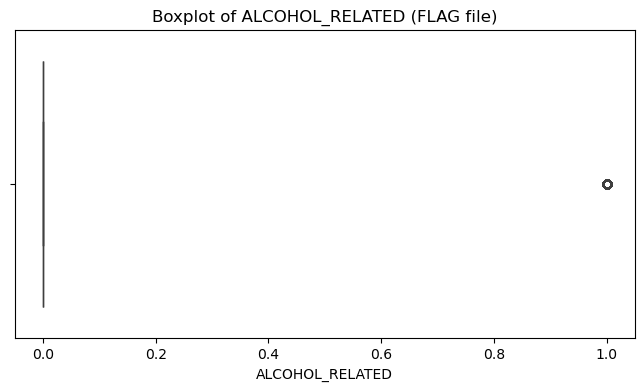

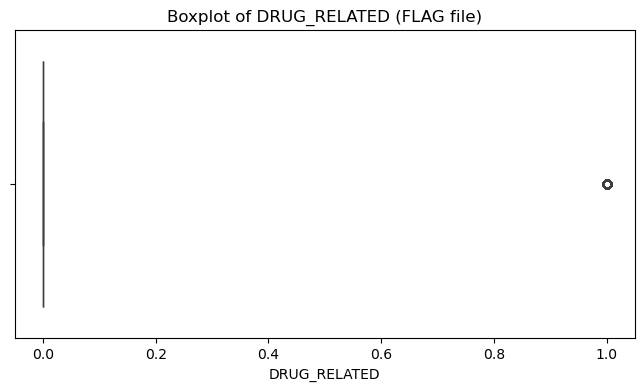

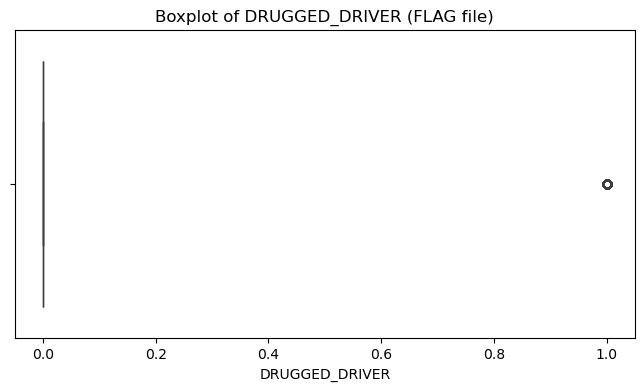

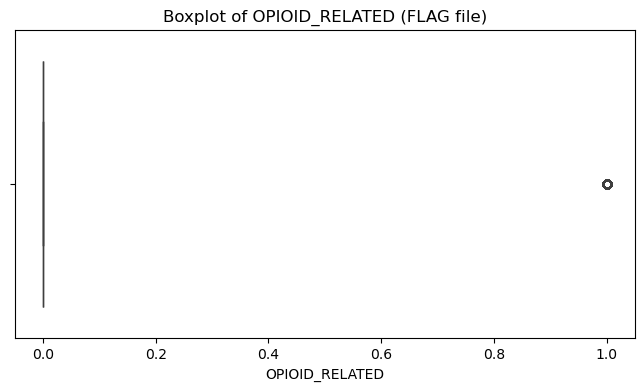

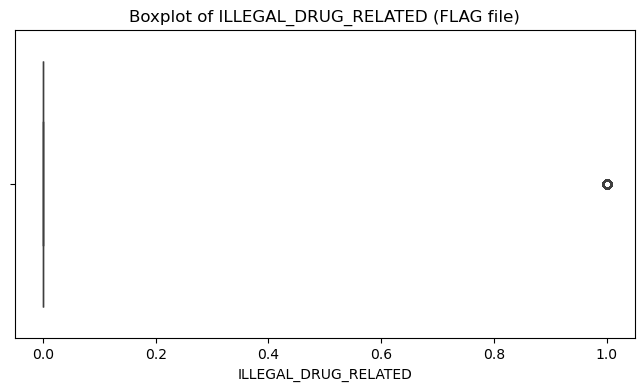

...

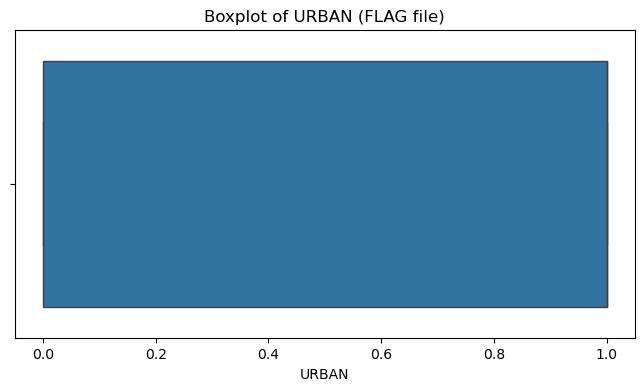

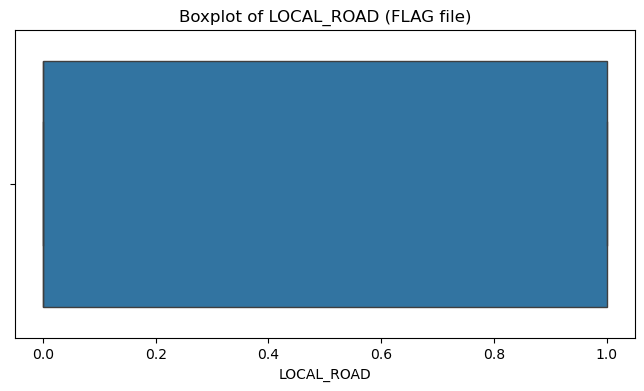

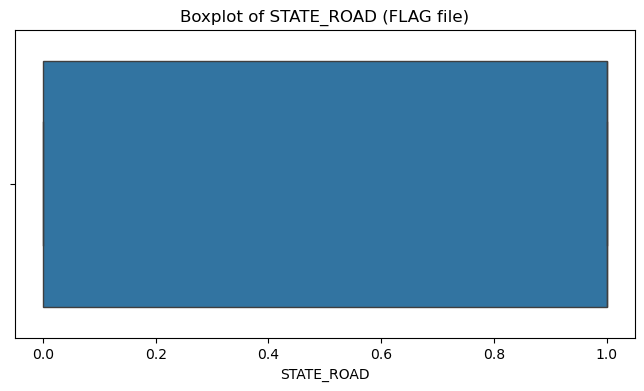

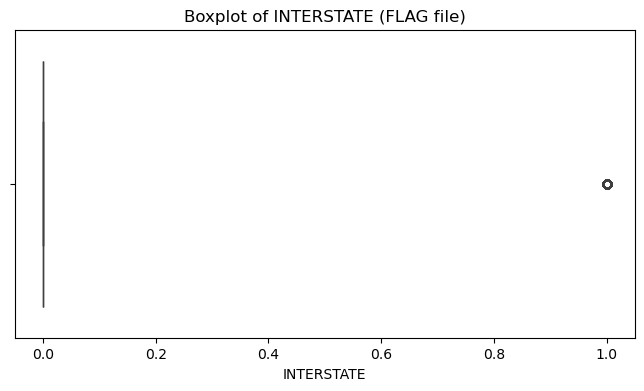

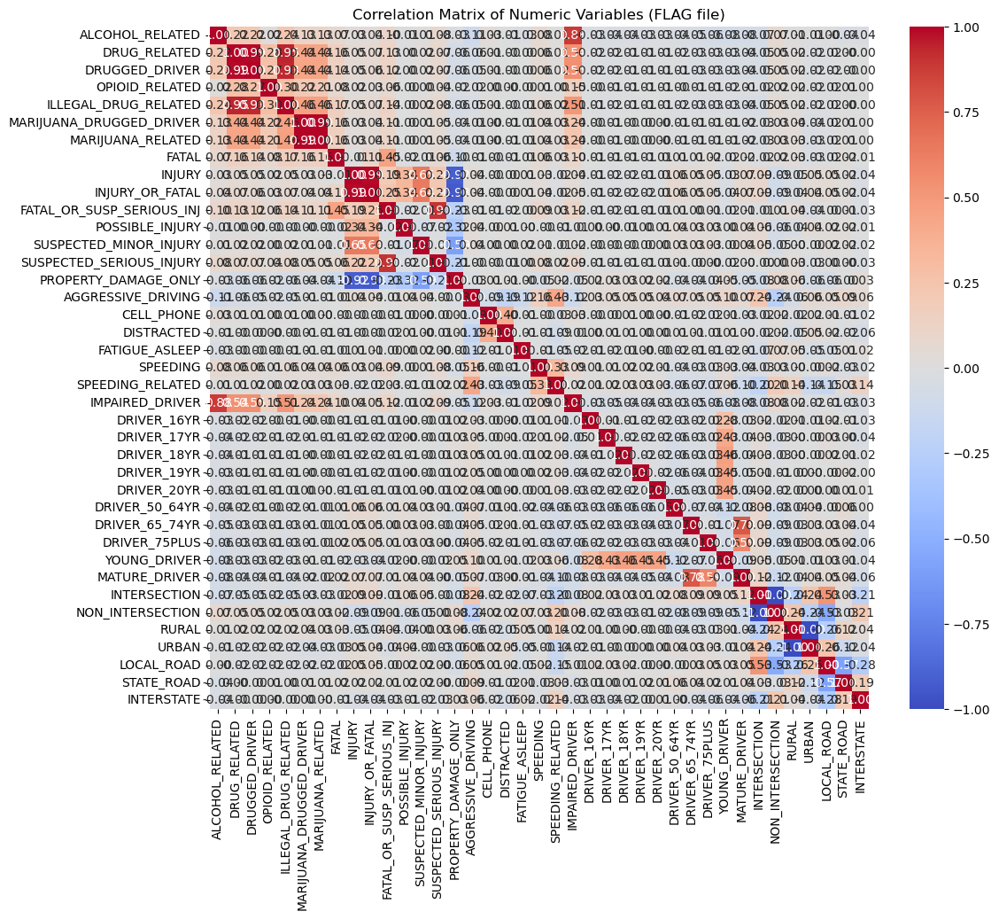

C:\Users\jason\anaconda3\envs\DeepL\lib\site-packages\statsmodels\stats\outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)



Variance Inflation Factor (VIF) for numeric features (FLAG file):
                      Feature         VIF
0             ALCOHOL_RELATED    9.069447
1                DRUG_RELATED   53.709742
2              DRUGGED_DRIVER   47.379703
3              OPIOID_RELATED    1.138181
4        ILLEGAL_DRUG_RELATED   10.456653
5    MARIJUANA_DRUGGED_DRIVER   93.427026
6           MARIJUANA_RELATED   93.339756
7                       FATAL    6.531388
8                      INJURY  131.587295
9             INJURY_OR_FATAL  164.100421
10  FATAL_OR_SUSP_SERIOUS_INJ   48.896378
11            POSSIBLE_INJURY    1.431084
12     SUSPECTED_MINOR_INJURY    2.239830
13   SUSPECTED_SERIOUS_INJURY   39.450794
14       PROPERTY_DAMAGE_ONLY    7.536645
15         AGGRESSIVE_DRIVING    1.557607
16                 CELL_PHONE    1.189733
17                 DISTRACTED    1.237395
18             FATIGUE_ASLEEP    1.024430
19                   SPEEDING    1.156241
20           SPEEDING_RELATED    1.584232
21       

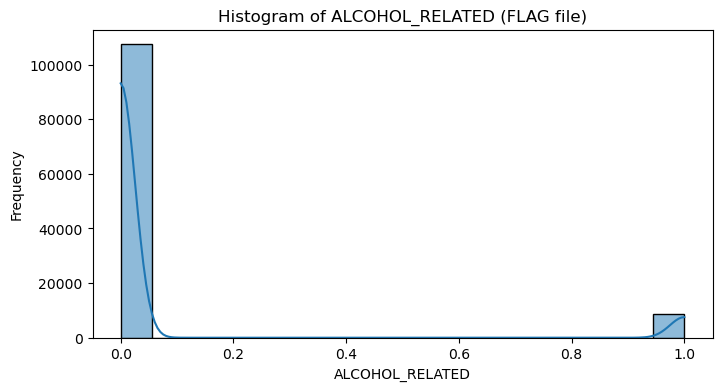

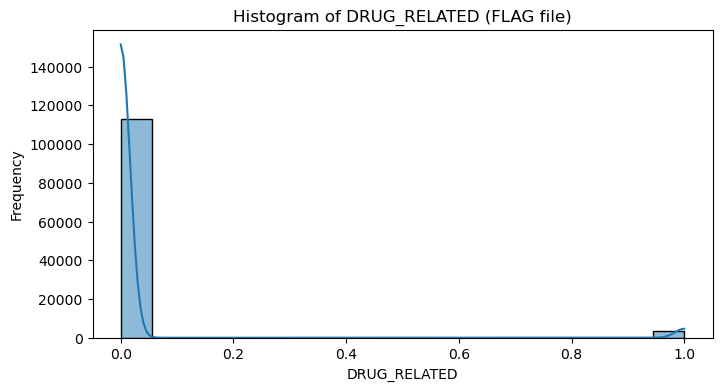

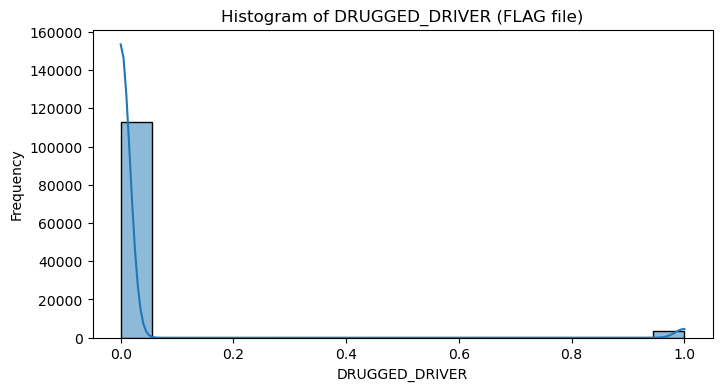

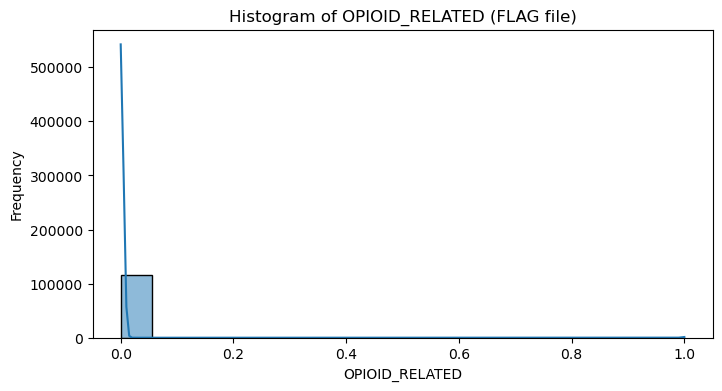

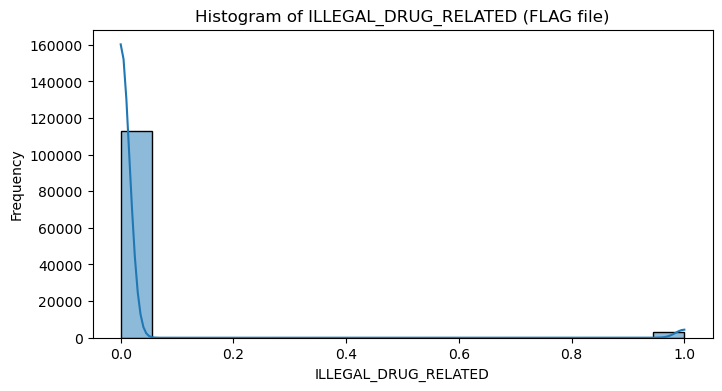

...

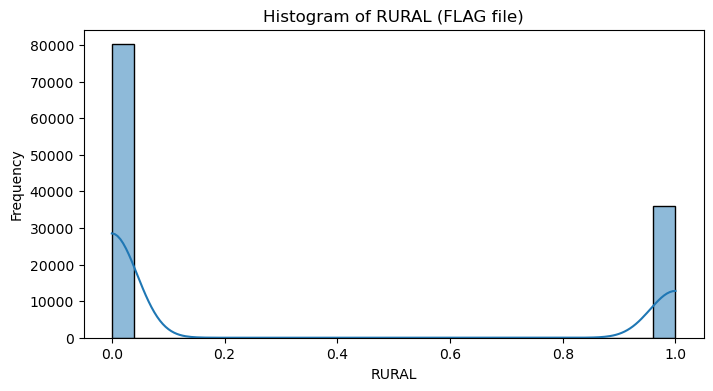

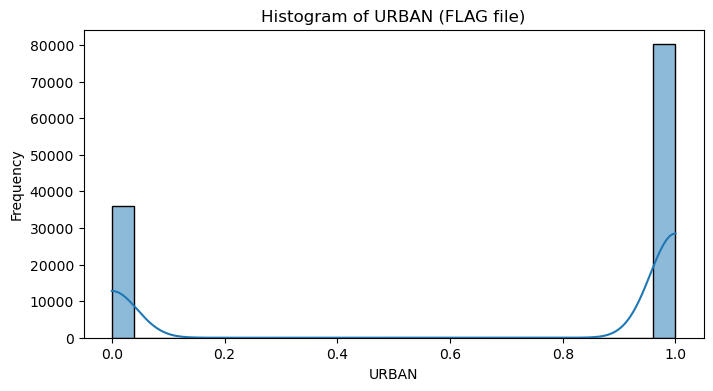

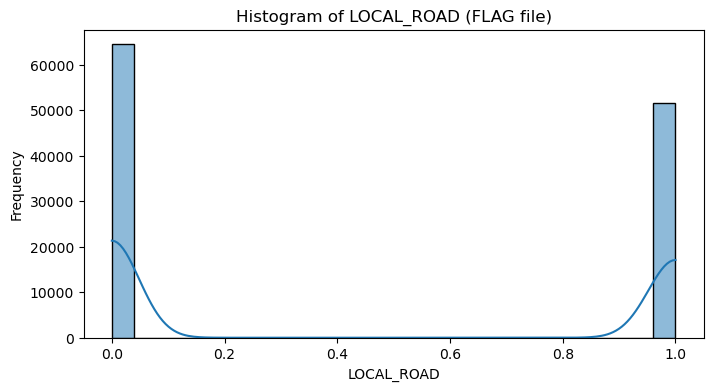

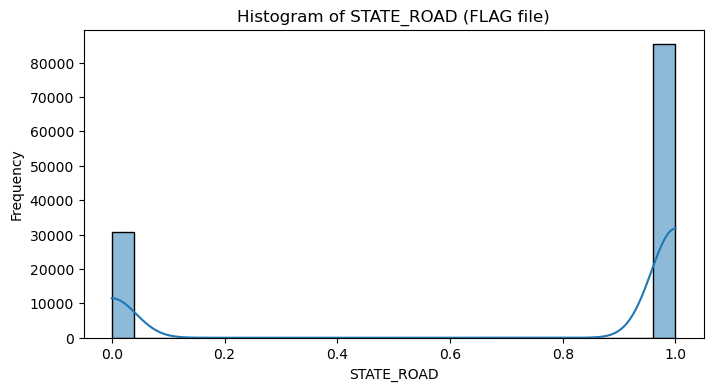

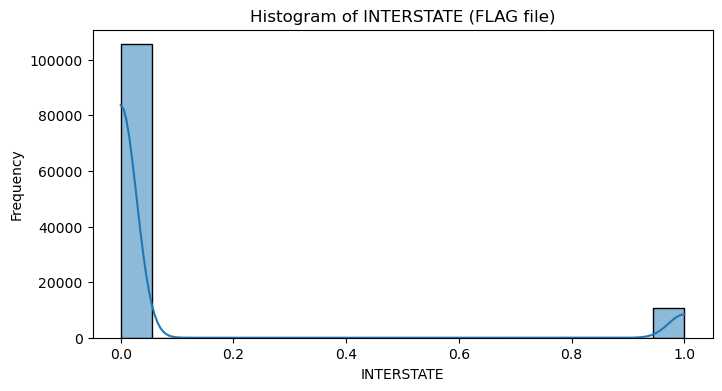


Distribution for 'AGGRESSIVE_DRIVING':
AGGRESSIVE_DRIVING
1    55.91
0    44.09
Name: count, dtype: float64


C:\Users\jason\AppData\Local\Temp\ipykernel_22248\2909666435.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=counts.index, y=counts.values, palette="pastel")


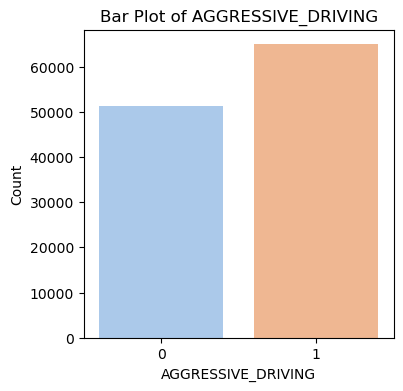


Distribution for 'ALCOHOL_RELATED':
ALCOHOL_RELATED
0    92.5
1     7.5
Name: count, dtype: float64


C:\Users\jason\AppData\Local\Temp\ipykernel_22248\2909666435.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=counts.index, y=counts.values, palette="pastel")


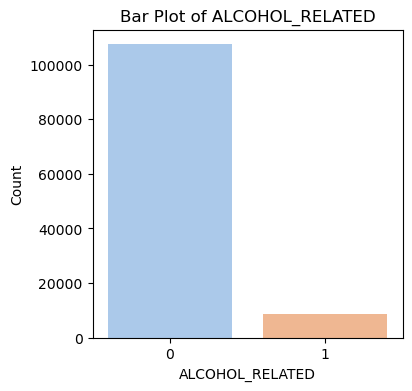

C:\Users\jason\AppData\Local\Temp\ipykernel_22248\2909666435.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=counts.index, y=counts.values, palette="pastel")



Distribution for 'DRUGGED_DRIVER':
DRUGGED_DRIVER
0    97.1
1     2.9
Name: count, dtype: float64


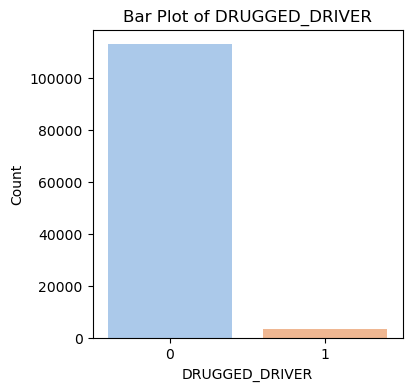


Distribution for 'DRUG_RELATED':
DRUG_RELATED
0    97.03
1     2.97
Name: count, dtype: float64


C:\Users\jason\AppData\Local\Temp\ipykernel_22248\2909666435.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=counts.index, y=counts.values, palette="pastel")


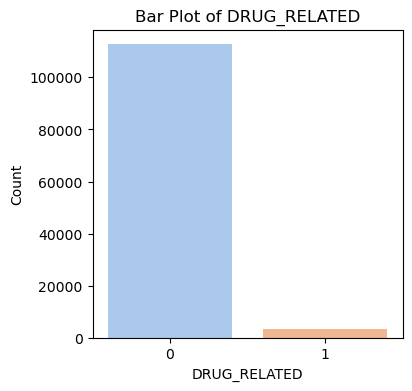


Distribution for 'OPIOID_RELATED':
OPIOID_RELATED
0    99.76
1     0.24
Name: count, dtype: float64


C:\Users\jason\AppData\Local\Temp\ipykernel_22248\2909666435.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=counts.index, y=counts.values, palette="pastel")


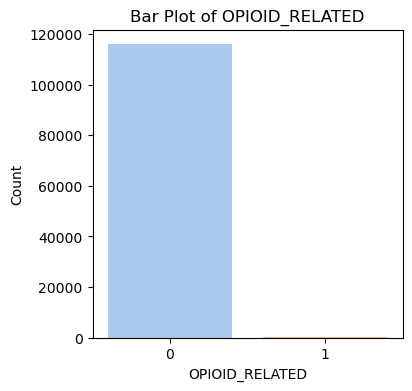


No column name formatting issues detected (FLAG file).

Potential Bias Check (FLAG file):
OPIOID_RELATED distribution (%):
OPIOID_RELATED
0    99.76
1     0.24
Name: proportion, dtype: float64

Planned Cleaning Steps:
- Missing Values: Impute or recode placeholders if needed (e.g., recode -1/9999 to NaN or an appropriate default).
- Duplicates: Remove duplicate rows.
- Outliers: Investigate columns with high outlier counts (e.g., in CRN, WET_ROAD, YOUNG_DRIVER) to decide whether to cap or remove extreme values.
- Collinearity: Review features with high VIF values; consider combining or dropping highly correlated features.
- Data Imbalance: Binary columns with severe imbalance may require resampling or weighting adjustments.
- Formatting: Ensure column names are trimmed and standardized; if additional text fields are present, trim whitespace and standardize capitalization.
- Type Conversions: Confirm that date/time, numeric, and categorical columns have the correct data types.
- Linkag

In [97]:
# Additional Common Analyses (Example on FLAG file DataFrame)

# Outlier Detection (IQR Method) for numeric columns in df_flag
numeric_cols_flag = df_flag.select_dtypes(include=[np.number]).columns.tolist()
print("\nNumeric columns in FLAG file:", numeric_cols_flag)

def detect_outliers(col, df):
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outlier_count = df[(df[col] < lower_bound) | (df[col] > upper_bound)].shape[0]
    return outlier_count, lower_bound, upper_bound

outlier_summary_flag = {}
for col in numeric_cols_flag:
    count, lb, ub = detect_outliers(col, df_flag)
    outlier_summary_flag[col] = {"Outlier Count": count, "Lower Bound": lb, "Upper Bound": ub}
print("\nOutlier Summary for FLAG file:")
print(pd.DataFrame(outlier_summary_flag).T)

# Plot boxplots for numeric columns in FLAG file
for col in numeric_cols_flag:
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=df_flag[col])
    plt.title(f"Boxplot of {col} (FLAG file)")
    plt.show()

# Correlation Matrix and VIF Calculation for FLAG file
df_vif_flag = df_flag[numeric_cols_flag].replace([np.inf, -np.inf], np.nan).dropna()

plt.figure(figsize=(12, 10))
corr_matrix_flag = df_flag[numeric_cols_flag].corr()
sns.heatmap(corr_matrix_flag, annot=True, fmt=".2f", cmap="coolwarm")
plt.title("Correlation Matrix of Numeric Variables (FLAG file)")
plt.show()

vif_data_flag = pd.DataFrame()
vif_data_flag["Feature"] = numeric_cols_flag
vif_data_flag["VIF"] = [variance_inflation_factor(df_vif_flag.values, i) for i in range(len(numeric_cols_flag))]
print("\nVariance Inflation Factor (VIF) for numeric features (FLAG file):")
print(vif_data_flag)

# Distribution Analysis for Numeric Columns (FLAG file)
for col in numeric_cols_flag:
    plt.figure(figsize=(8, 4))
    sns.histplot(df_flag[col], kde=True)
    plt.title(f"Histogram of {col} (FLAG file)")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.show()

# Analyze binary column distributions in FLAG file
binary_columns = ['AGGRESSIVE_DRIVING', 'ALCOHOL_RELATED', 'ANGLE_CRASH', 'ATV',
                  'DRUGGED_DRIVER', 'DRUG_RELATED', 'OPIOID_RELATED']
def analyze_binary_distribution(col, df):
    counts = df[col].value_counts()
    total = counts.sum()
    distribution = (counts / total * 100).round(2)
    print(f"\nDistribution for '{col}':")
    print(distribution)
    plt.figure(figsize=(4, 4))
    sns.barplot(x=counts.index, y=counts.values, palette="pastel")
    plt.title(f"Bar Plot of {col}")
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.show()

for col in binary_columns:
    if col in df_flag.columns:
        analyze_binary_distribution(col, df_flag)

# Check column name formatting issues (applied to FLAG file)
def check_column_name_format(col_name):
    if col_name != col_name.strip():
        return f"Column '{col_name}' has leading/trailing whitespace."
    if re.search(r"[^a-zA-Z0-9_]", col_name):
        return f"Column '{col_name}' contains non-alphanumeric characters."
    return None

format_issues = [check_column_name_format(col) for col in df_flag.columns if check_column_name_format(col) is not None]
if format_issues:
    print("\nColumn Name Formatting Issues (FLAG file):")
    for issue in format_issues:
        print(issue)
else:
    print("\nNo column name formatting issues detected (FLAG file).")

# Potential Bias Check (FLAG file): For example, check the distribution of 'OPIOID_RELATED'
print("\nPotential Bias Check (FLAG file):")
if 'OPIOID_RELATED' in df_flag.columns:
    opioid_distribution = df_flag['OPIOID_RELATED'].value_counts(normalize=True) * 100
    print("OPIOID_RELATED distribution (%):")
    print(opioid_distribution.round(2))
    if opioid_distribution.min() < 10:
        print("Warning: One class in 'OPIOID_RELATED' is underrepresented, which may indicate sampling bias.")
else:
    print("No 'OPIOID_RELATED' column found to check for bias.")

# Summary of Planned Data Cleaning Steps
cleaning_steps = {
    "Missing Values": "Impute or recode placeholders if needed (e.g., recode -1/9999 to NaN or an appropriate default).",
    "Duplicates": "Remove duplicate rows.",
    "Outliers": "Investigate columns with high outlier counts (e.g., in CRN, WET_ROAD, YOUNG_DRIVER) to decide whether to cap or remove extreme values.",
    "Collinearity": "Review features with high VIF values; consider combining or dropping highly correlated features.",
    "Data Imbalance": "Binary columns with severe imbalance may require resampling or weighting adjustments.",
    "Formatting": "Ensure column names are trimmed and standardized; if additional text fields are present, trim whitespace and standardize capitalization.",
    "Type Conversions": "Confirm that date/time, numeric, and categorical columns have the correct data types.",
    "Linkage": "Verify that linking columns (e.g., CRN) correctly reference valid entries from CRASH files.",
    "Bias Considerations": "Note potential sampling or measurement biases (e.g., low representation in key binary outcomes) for later model adjustments."
}
print("\nPlanned Cleaning Steps:")
for step, detail in cleaning_steps.items():
    print(f"- {step}: {detail}")


--- Additional Analyses for CRASH File ---

Numeric columns in CRASH file: ['CRASH_MONTH', 'CRASH_YEAR', 'DAY_OF_WEEK', 'HOUR_OF_DAY', 'COUNTY', 'MUNICIPALITY', 'DISTRICT', 'DEC_LAT', 'DEC_LONG', 'MAX_SEVERITY_LEVEL', 'COLLISION_TYPE', 'RELATION_TO_ROAD', 'ROAD_CONDITION', 'ILLUMINATION', 'URBAN_RURAL', 'DRIVER_COUNT_16YR', 'DRIVER_COUNT_17YR', 'DRIVER_COUNT_18YR', 'DRIVER_COUNT_19YR', 'DRIVER_COUNT_20YR', 'DRIVER_COUNT_50_64YR', 'DRIVER_COUNT_65_74YR', 'DRIVER_COUNT_75PLUS', 'FATAL_COUNT', 'INJURY_COUNT', 'TOT_INJ_COUNT', 'VEHICLE_COUNT', 'TOTAL_UNITS', 'AUTOMOBILE_COUNT', 'BICYCLE_COUNT', 'BUS_COUNT', 'COMM_VEH_COUNT', 'HEAVY_TRUCK_COUNT', 'MOTORCYCLE_COUNT', 'SMALL_TRUCK_COUNT', 'SUV_COUNT', 'VAN_COUNT', 'PERSON_COUNT']

Outlier Summary for CRASH file:
                      Outlier Count  Lower Bound  Upper Bound
CRASH_MONTH                     0.0      -5.0000      19.0000
CRASH_YEAR                      0.0    2022.0000    2022.0000
DAY_OF_WEEK                     0.0      -4.000

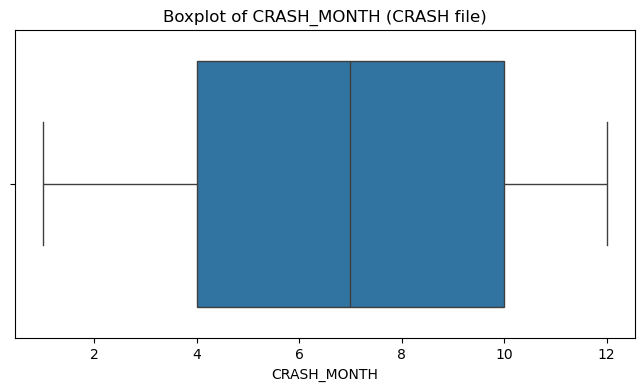

Skipping boxplot for CRASH_YEAR due to lack of variation.


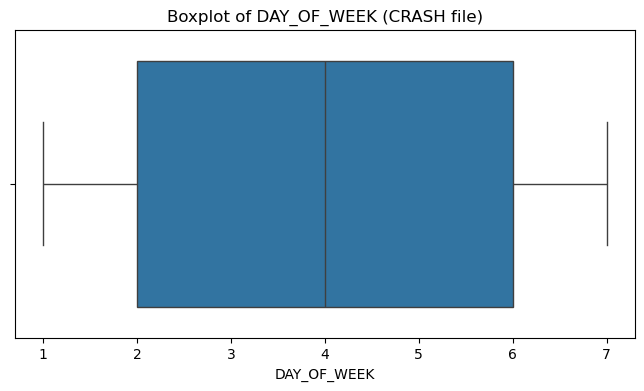

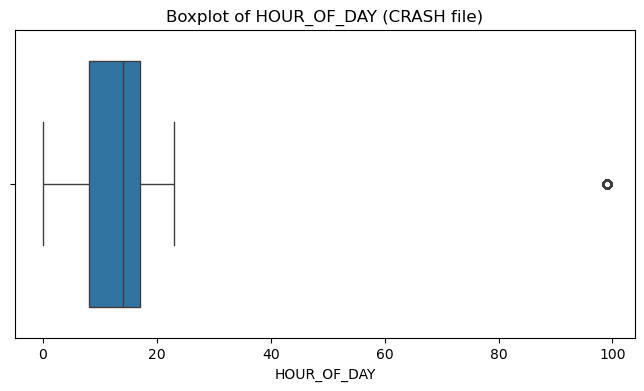

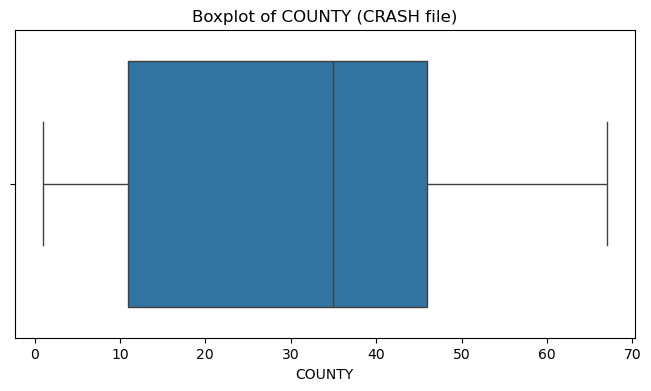

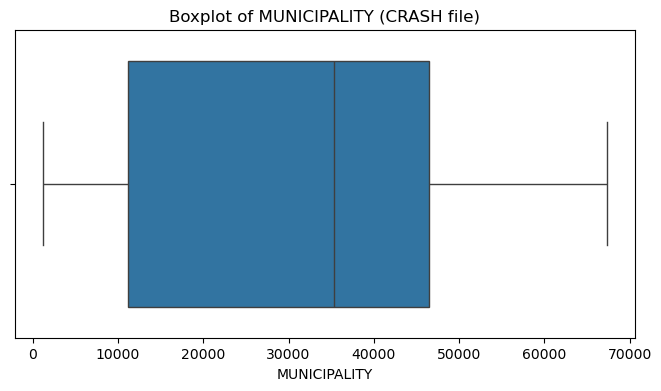

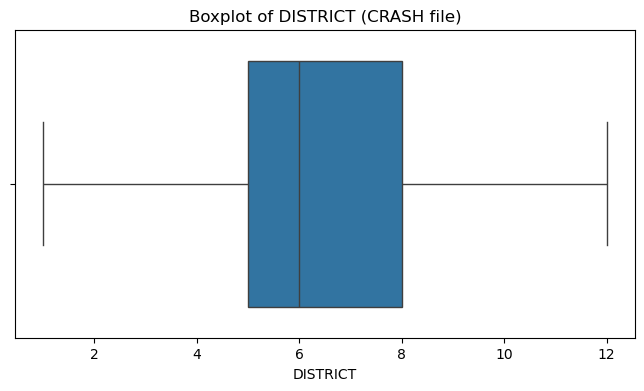

...

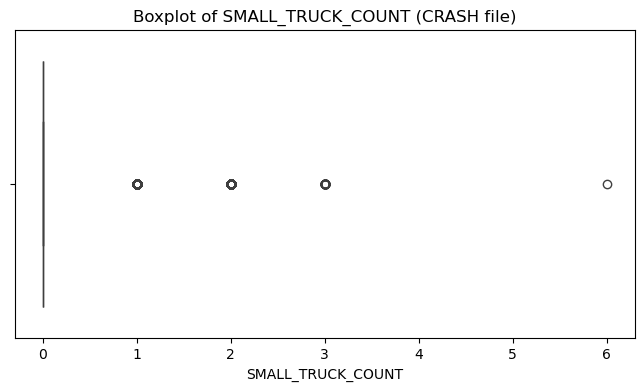

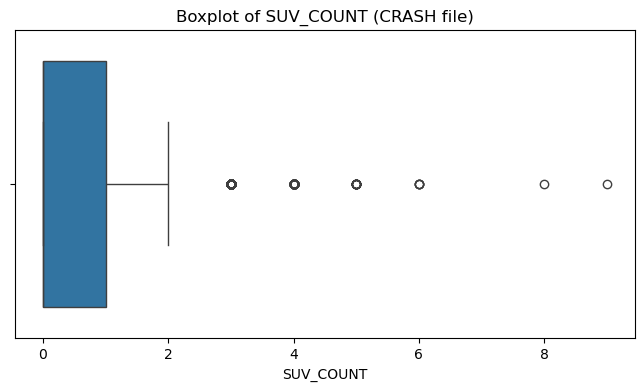

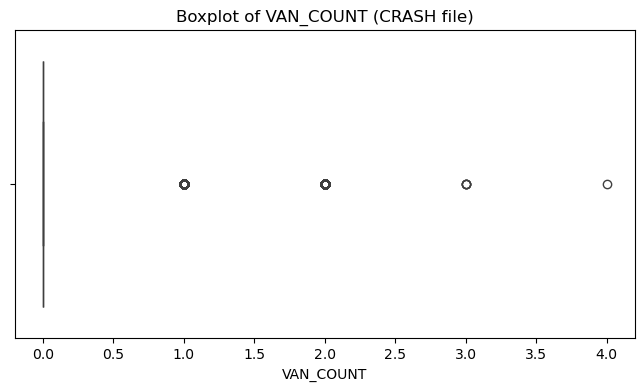

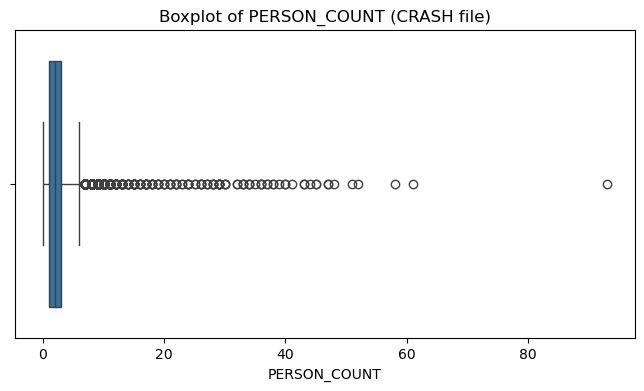

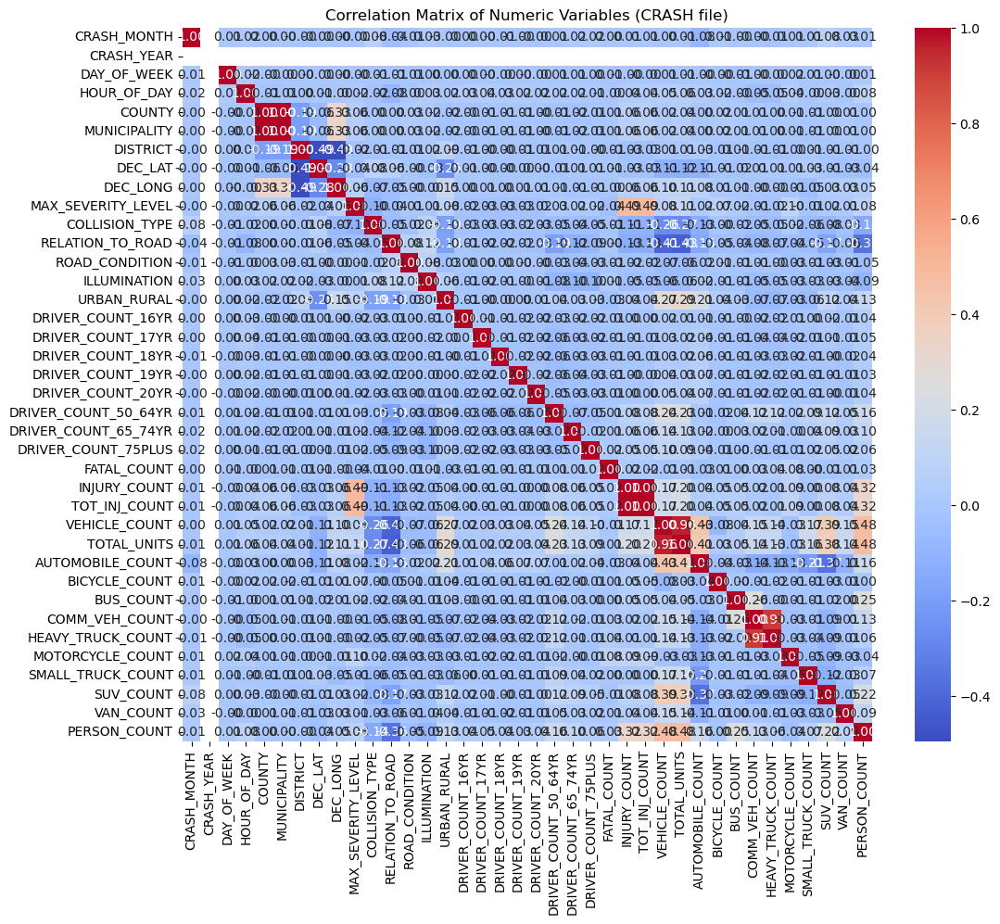


Variance Inflation Factor (VIF) for numeric features (CRASH file):
                 Feature           VIF
0            CRASH_MONTH      1.021118
1             CRASH_YEAR   9664.567637
2            DAY_OF_WEEK      1.001415
3            HOUR_OF_DAY      1.025580
4                 COUNTY  60889.149612
5           MUNICIPALITY  60867.701819
6               DISTRICT      3.067502
7                DEC_LAT      2.554367
8               DEC_LONG      2.659418
9     MAX_SEVERITY_LEVEL      1.380511
10        COLLISION_TYPE      1.183460
11      RELATION_TO_ROAD      1.401009
12        ROAD_CONDITION      1.019399
13          ILLUMINATION      1.076229
14           URBAN_RURAL      1.288617
15     DRIVER_COUNT_16YR      1.011736
16     DRIVER_COUNT_17YR      1.024217
17     DRIVER_COUNT_18YR      1.023003
18     DRIVER_COUNT_19YR      1.022440
19     DRIVER_COUNT_20YR      1.022991
20  DRIVER_COUNT_50_64YR      1.155523
21  DRIVER_COUNT_65_74YR      1.073644
22   DRIVER_COUNT_75PLUS      1.048

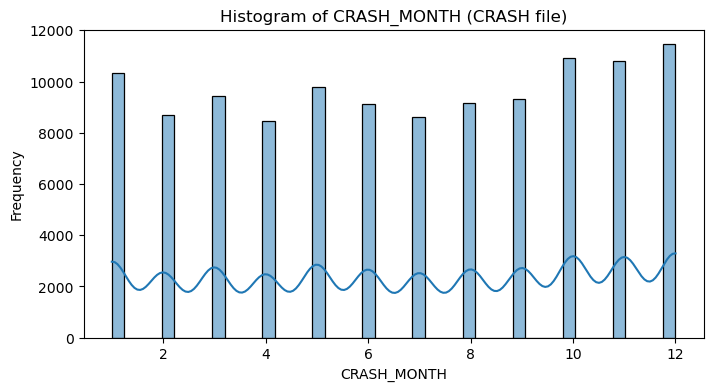

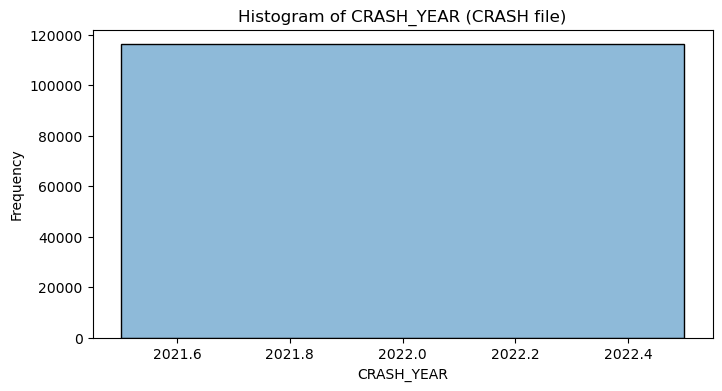

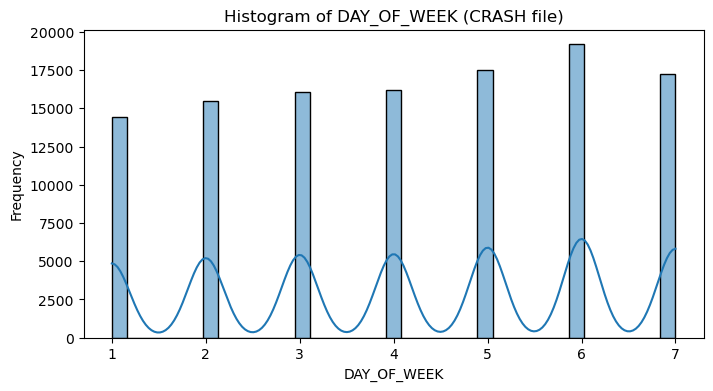

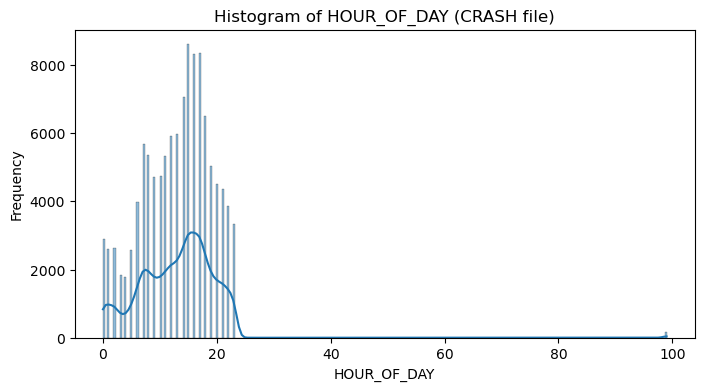

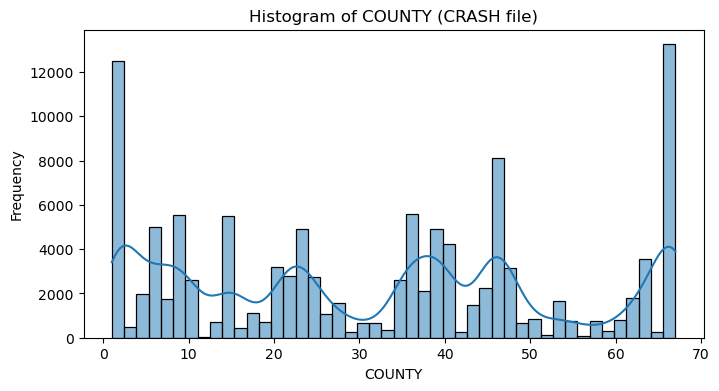

...

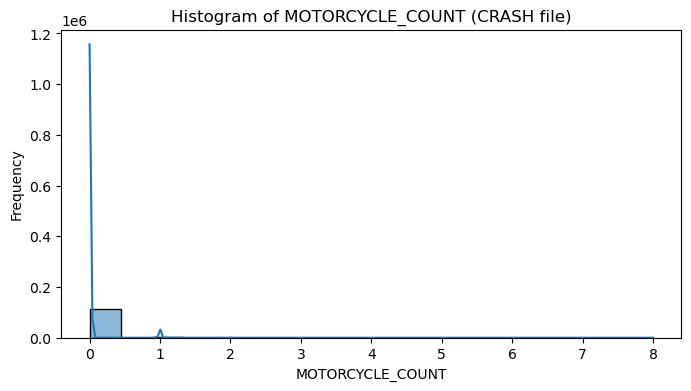

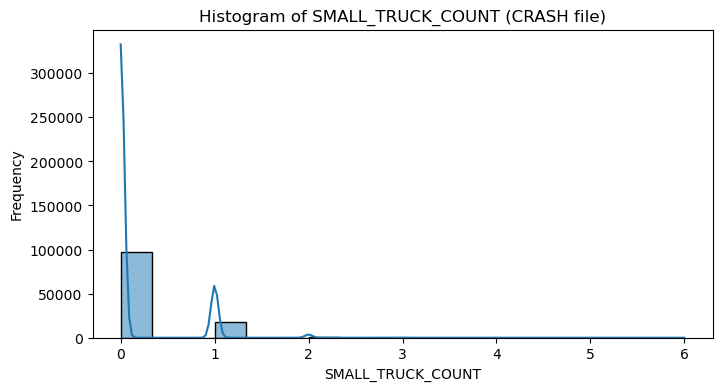

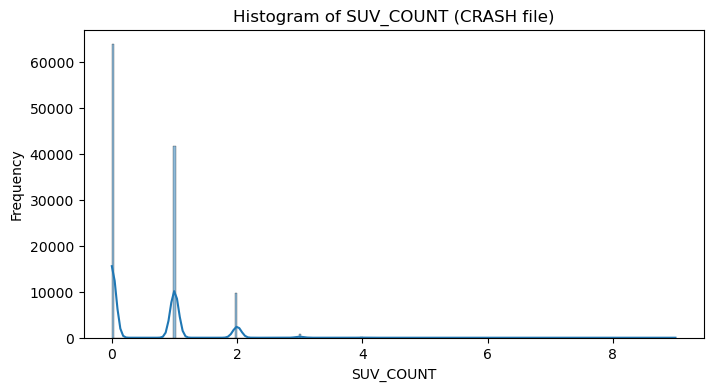

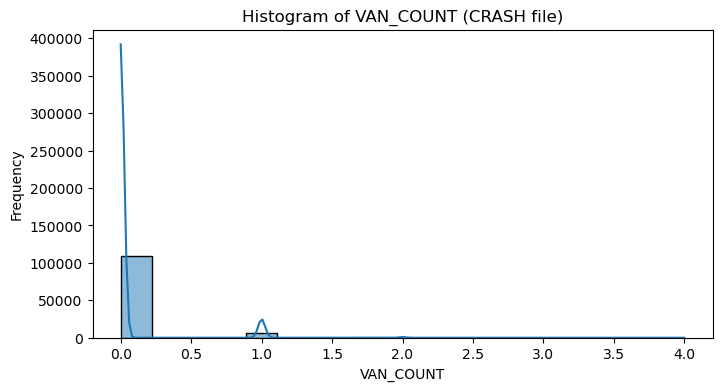

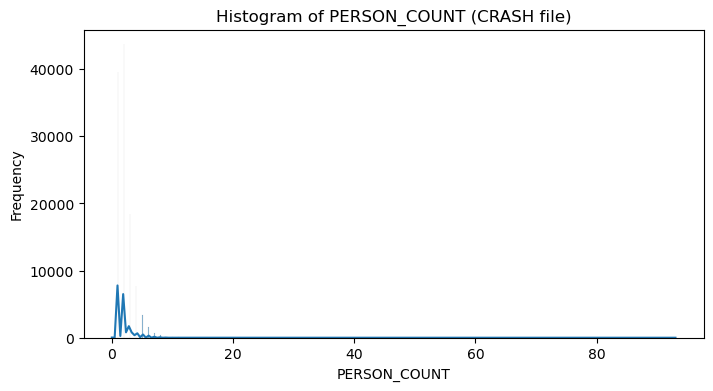


Distribution for 'INTERSECTION_RELATED' (CRASH file):
INTERSECTION_RELATED
N    96.68
Y     3.32
Name: count, dtype: float64


C:\Users\jason\AppData\Local\Temp\ipykernel_22248\2740714259.py:60: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=counts.index, y=counts.values, palette="pastel")


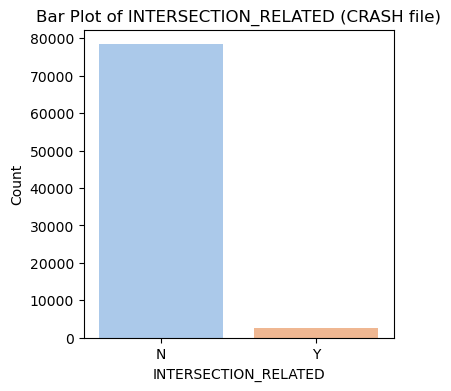


No column name formatting issues detected (CRASH file).

Potential Bias Check (CRASH file):
FATAL_COUNT distribution (%):
FATAL_COUNT
0    99.06
1     0.88
2     0.05
3     0.01
4     0.00
6     0.00
5     0.00
Name: proportion, dtype: float64


In [98]:
# Additional Analyses for CRASH File
print("\n--- Additional Analyses for CRASH File ---")
numeric_cols_crash = df_crash.select_dtypes(include=[np.number]).columns.tolist()
print("\nNumeric columns in CRASH file:", numeric_cols_crash)

# Outlier Detection for CRASH file
outlier_summary_crash = {}
for col in numeric_cols_crash:
    count, lb, ub = detect_outliers(col, df_crash)
    outlier_summary_crash[col] = {"Outlier Count": count, "Lower Bound": lb, "Upper Bound": ub}
print("\nOutlier Summary for CRASH file:")
print(pd.DataFrame(outlier_summary_crash).T)

# Boxplots for CRASH file (only if column has >1 unique value)
for col in numeric_cols_crash:
    col_data = df_crash[col].dropna()
    if col_data.nunique() > 1:
        plt.figure(figsize=(8, 4))
        sns.boxplot(x=col_data)
        plt.title(f"Boxplot of {col} (CRASH file)")
        plt.show()
    else:
        print(f"Skipping boxplot for {col} due to lack of variation.")

# Correlation Matrix and VIF Calculation for CRASH file
df_vif_crash = df_crash[numeric_cols_crash].replace([np.inf, -np.inf], np.nan).dropna()
plt.figure(figsize=(12, 10))
corr_matrix_crash = df_crash[numeric_cols_crash].corr()
sns.heatmap(corr_matrix_crash, annot=True, fmt=".2f", cmap="coolwarm")
plt.title("Correlation Matrix of Numeric Variables (CRASH file)")
plt.show()

if df_vif_crash.shape[0] == 0:
    print("VIF cannot be computed: No data available after cleaning numeric columns in CRASH file.")
else:
    vif_data_crash = pd.DataFrame()
    vif_data_crash["Feature"] = numeric_cols_crash
    vif_data_crash["VIF"] = [variance_inflation_factor(df_vif_crash.values, i) for i in range(len(numeric_cols_crash))]
    print("\nVariance Inflation Factor (VIF) for numeric features (CRASH file):")
    print(vif_data_crash)

# Histograms for CRASH file
for col in numeric_cols_crash:
    plt.figure(figsize=(8, 4))
    sns.histplot(df_crash[col], kde=True)
    plt.title(f"Histogram of {col} (CRASH file)")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.show()

# Analyze binary distributions for CRASH file (example: adjust list as needed)
binary_columns_crash = ['INTERSECTION_RELATED']  # Example; update as appropriate
def analyze_binary_distribution_crash(col, df):
    counts = df[col].value_counts()
    total = counts.sum()
    distribution = (counts / total * 100).round(2)
    print(f"\nDistribution for '{col}' (CRASH file):")
    print(distribution)
    plt.figure(figsize=(4, 4))
    sns.barplot(x=counts.index, y=counts.values, palette="pastel")
    plt.title(f"Bar Plot of {col} (CRASH file)")
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.show()
for col in binary_columns_crash:
    if col in df_crash.columns:
        analyze_binary_distribution_crash(col, df_crash)

# Check column name formatting for CRASH file
format_issues_crash = [check_column_name_format(col) for col in df_crash.columns if check_column_name_format(col) is not None]
if format_issues_crash:
    print("\nColumn Name Formatting Issues (CRASH file):")
    for issue in format_issues_crash:
        print(issue)
else:
    print("\nNo column name formatting issues detected (CRASH file).")

# Potential Bias Check for CRASH file (example: using 'FATAL_COUNT' if available)
print("\nPotential Bias Check (CRASH file):")
if 'FATAL_COUNT' in df_crash.columns:
    fatal_distribution = df_crash['FATAL_COUNT'].value_counts(normalize=True) * 100
    print("FATAL_COUNT distribution (%):")
    print(fatal_distribution.round(2))
else:
    print("No 'FATAL_COUNT' column found to check for bias.")


--- Additional Analyses for PERSON File ---

Numeric columns in PERSON file: ['AGE', 'INJ_SEVERITY', 'PERSON_TYPE', 'SEAT_POSITION', 'RESTRAINT_HELMET', 'DVR_PED_CONDITION', 'VULNERABLE_ROAD_USER', 'INJ_SEVERITY_NUM']

Outlier Summary for PERSON file:
                      Outlier Count  Lower Bound  Upper Bound
AGE                             0.0        -26.0        102.0
INJ_SEVERITY                23426.0         -4.5          7.5
PERSON_TYPE                  5398.0         -0.5          3.5
SEAT_POSITION               64822.0          1.0          1.0
RESTRAINT_HELMET            83145.0          3.0          3.0
DVR_PED_CONDITION           27787.0          0.0          0.0
VULNERABLE_ROAD_USER         4146.0          0.0          0.0
INJ_SEVERITY_NUM            23426.0         -4.5          7.5


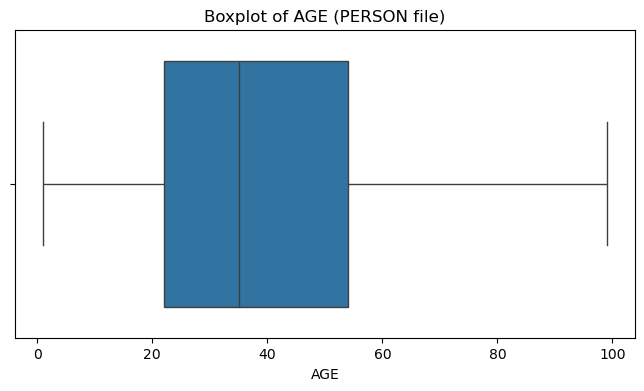

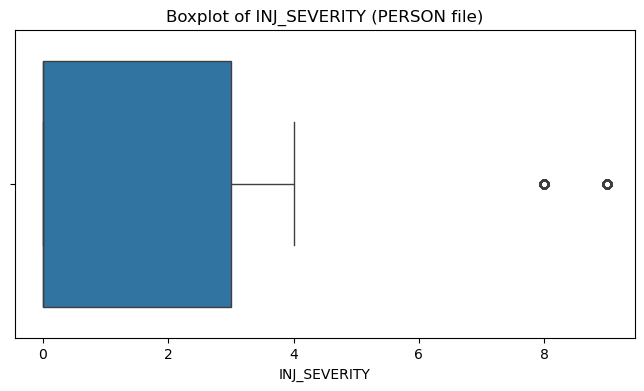

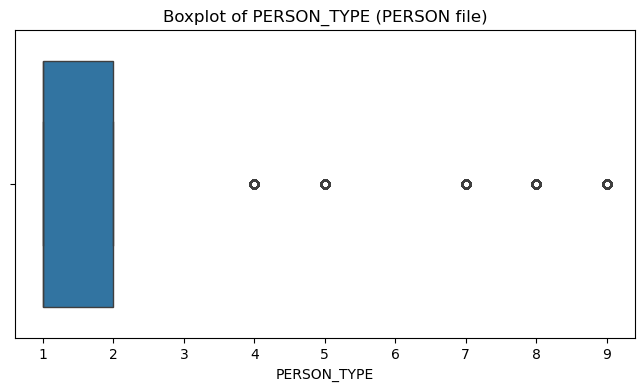

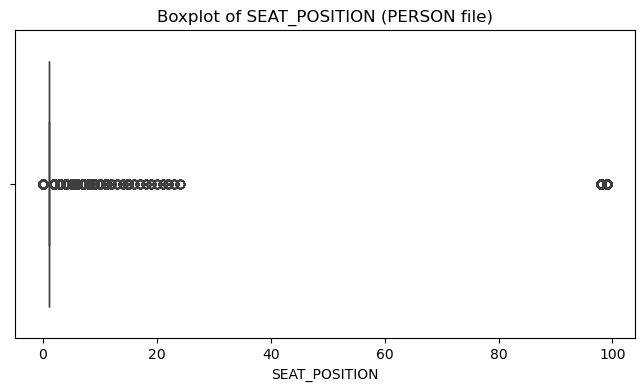

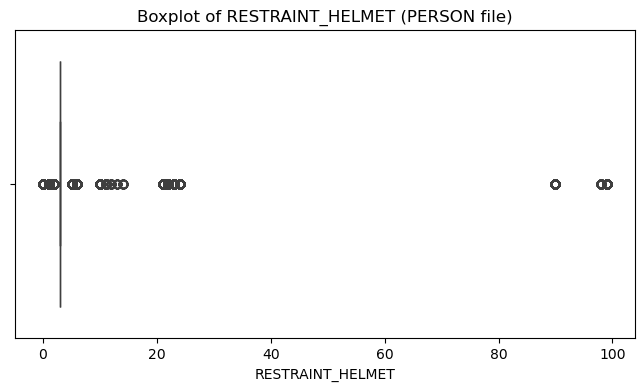

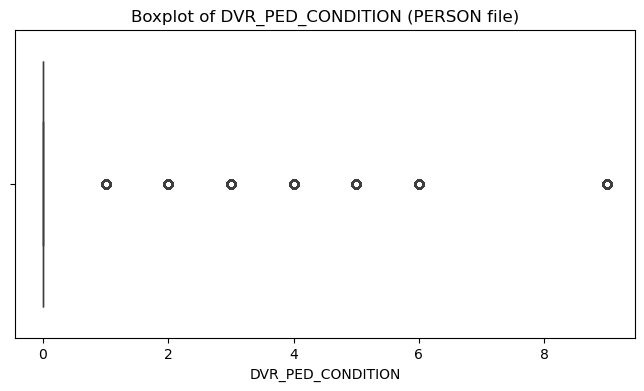

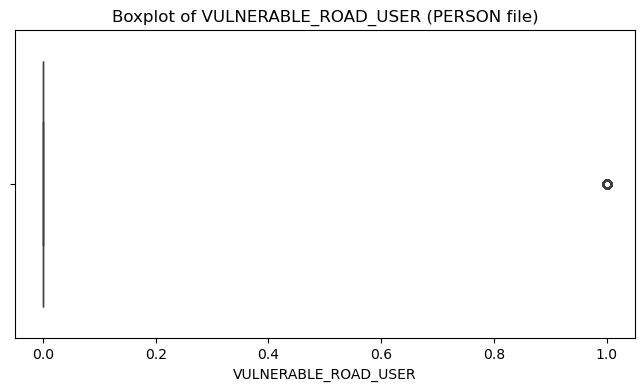

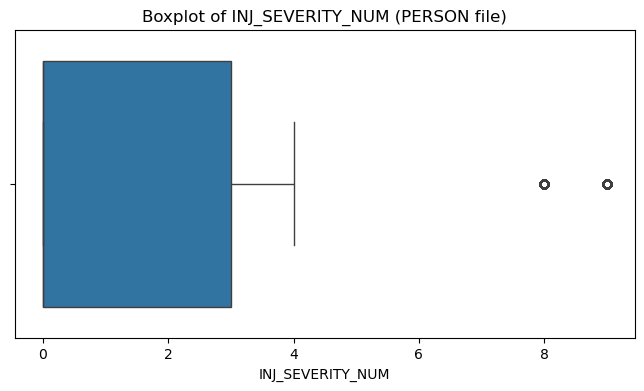

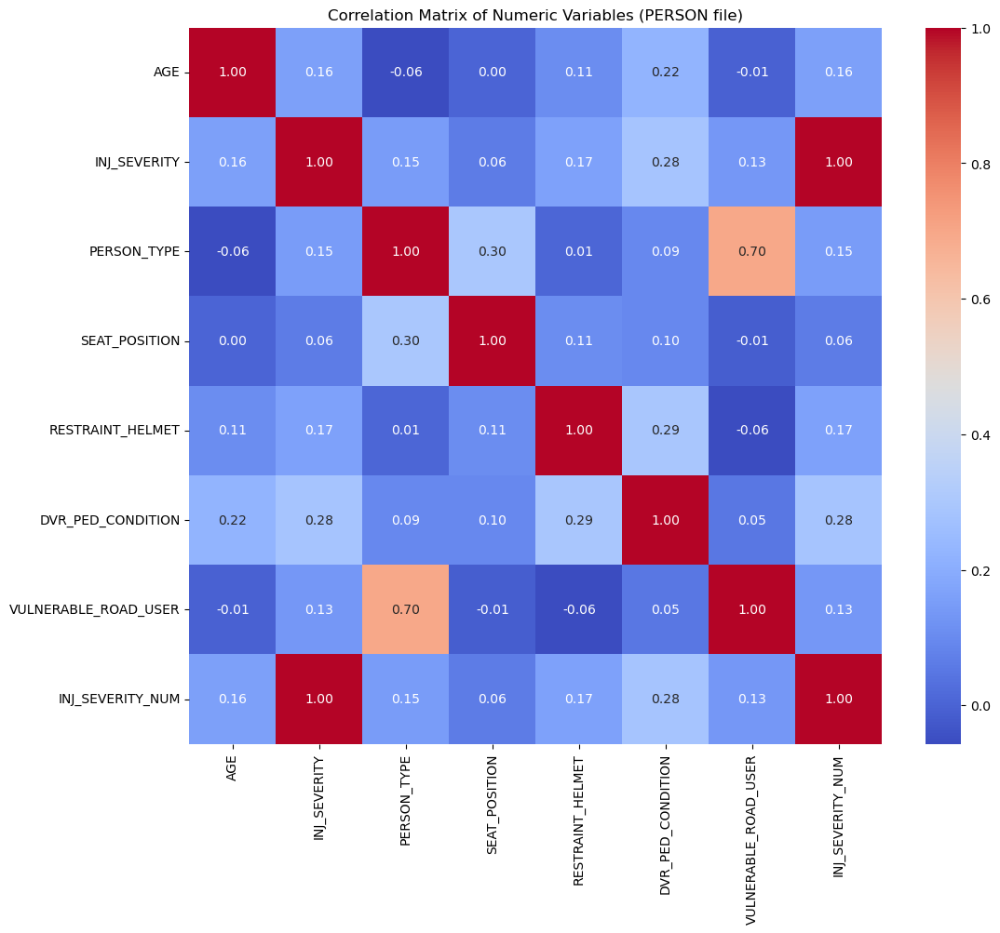

C:\Users\jason\anaconda3\envs\DeepL\lib\site-packages\statsmodels\stats\outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)



Variance Inflation Factor (VIF) for numeric features (PERSON file):
                Feature       VIF
0                   AGE  2.736379
1          INJ_SEVERITY       inf
2           PERSON_TYPE  3.911315
3         SEAT_POSITION  1.294716
4      RESTRAINT_HELMET  1.357221
5     DVR_PED_CONDITION  1.284541
6  VULNERABLE_ROAD_USER  1.729940
7      INJ_SEVERITY_NUM       inf


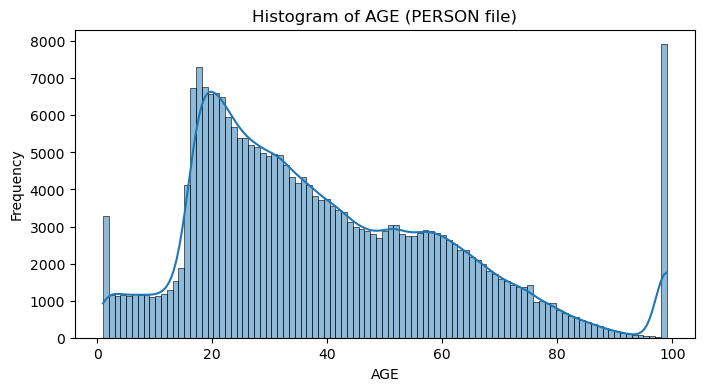

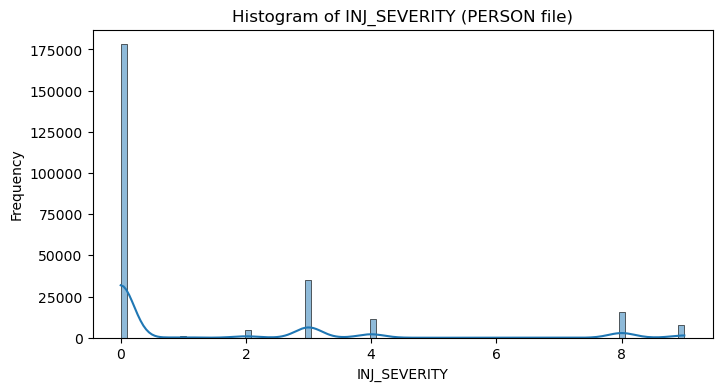

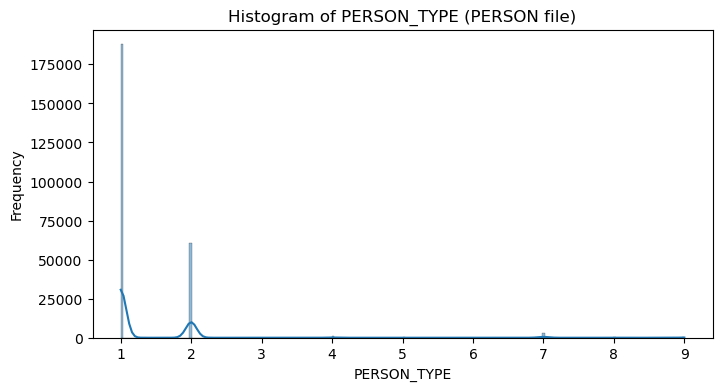

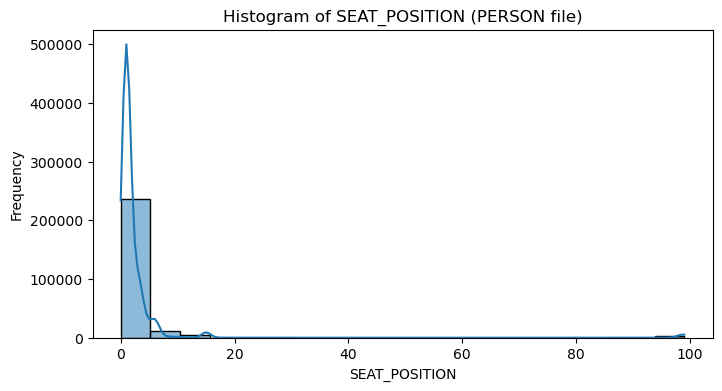

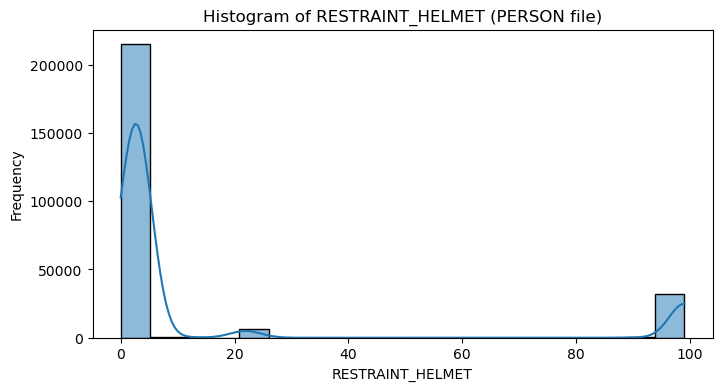

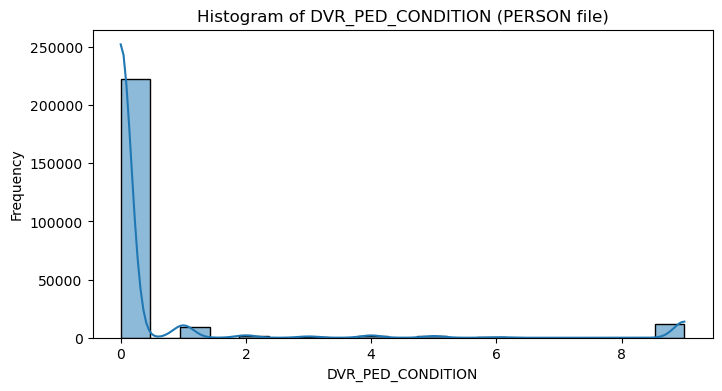

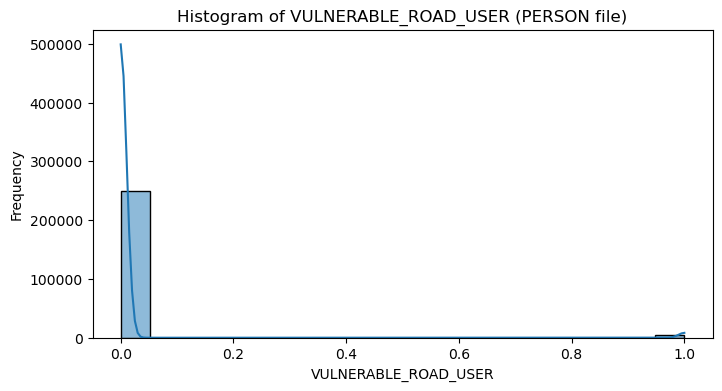

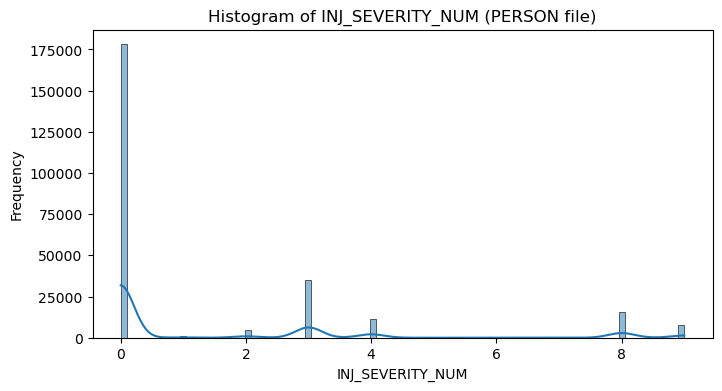


Distribution for 'SEX' (PERSON file):
SEX
M    55.66
F    42.23
U     2.12
Name: count, dtype: float64


C:\Users\jason\AppData\Local\Temp\ipykernel_22248\188639498.py:60: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=counts.index, y=counts.values, palette="pastel")


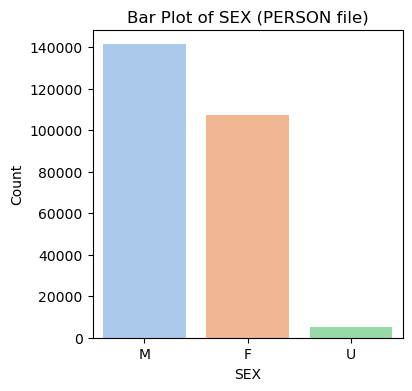


No column name formatting issues detected (PERSON file).

Potential Bias Check (PERSON file):
AGE distribution (%):
AGE
99    3.06
18    2.88
19    2.67
17    2.65
21    2.60
      ... 
93    0.03
94    0.02
95    0.02
96    0.01
97    0.01
Name: proportion, Length: 99, dtype: float64


In [99]:
# Additional Analyses for PERSON File
print("\n--- Additional Analyses for PERSON File ---")
numeric_cols_person = df_person.select_dtypes(include=[np.number]).columns.tolist()
print("\nNumeric columns in PERSON file:", numeric_cols_person)

# Outlier Detection for PERSON file
outlier_summary_person = {}
for col in numeric_cols_person:
    count, lb, ub = detect_outliers(col, df_person)
    outlier_summary_person[col] = {"Outlier Count": count, "Lower Bound": lb, "Upper Bound": ub}
print("\nOutlier Summary for PERSON file:")
print(pd.DataFrame(outlier_summary_person).T)

# Boxplots for PERSON file (only if column has >1 unique value)
for col in numeric_cols_person:
    col_data = df_person[col].dropna()
    if col_data.nunique() > 1:
        plt.figure(figsize=(8, 4))
        sns.boxplot(x=col_data)
        plt.title(f"Boxplot of {col} (PERSON file)")
        plt.show()
    else:
        print(f"Skipping boxplot for {col} due to lack of variation.")

# Correlation Matrix and VIF Calculation for PERSON file
df_vif_person = df_person[numeric_cols_person].replace([np.inf, -np.inf], np.nan).dropna()
plt.figure(figsize=(12, 10))
corr_matrix_person = df_person[numeric_cols_person].corr()
sns.heatmap(corr_matrix_person, annot=True, fmt=".2f", cmap="coolwarm")
plt.title("Correlation Matrix of Numeric Variables (PERSON file)")
plt.show()

if df_vif_person.shape[0] == 0:
    print("VIF cannot be computed: No data available after cleaning numeric columns in PERSON file.")
else:
    vif_data_person = pd.DataFrame()
    vif_data_person["Feature"] = numeric_cols_person
    vif_data_person["VIF"] = [variance_inflation_factor(df_vif_person.values, i) for i in range(len(numeric_cols_person))]
    print("\nVariance Inflation Factor (VIF) for numeric features (PERSON file):")
    print(vif_data_person)

# Histograms for PERSON file
for col in numeric_cols_person:
    plt.figure(figsize=(8, 4))
    sns.histplot(df_person[col], kde=True)
    plt.title(f"Histogram of {col} (PERSON file)")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.show()

# Analyze binary distributions for PERSON file (example: 'SEX' if applicable)
binary_columns_person = ['SEX']  # Adjust as needed
def analyze_binary_distribution_person(col, df):
    counts = df[col].value_counts()
    total = counts.sum()
    distribution = (counts / total * 100).round(2)
    print(f"\nDistribution for '{col}' (PERSON file):")
    print(distribution)
    plt.figure(figsize=(4, 4))
    sns.barplot(x=counts.index, y=counts.values, palette="pastel")
    plt.title(f"Bar Plot of {col} (PERSON file)")
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.show()
for col in binary_columns_person:
    if col in df_person.columns:
        analyze_binary_distribution_person(col, df_person)

# Check column name formatting for PERSON file
format_issues_person = [check_column_name_format(col) for col in df_person.columns if check_column_name_format(col) is not None]
if format_issues_person:
    print("\nColumn Name Formatting Issues (PERSON file):")
    for issue in format_issues_person:
        print(issue)
else:
    print("\nNo column name formatting issues detected (PERSON file).")

# Potential Bias Check for PERSON file (example: using 'AGE')
print("\nPotential Bias Check (PERSON file):")
if 'AGE' in df_person.columns:
    age_distribution = df_person['AGE'].value_counts(normalize=True) * 100
    print("AGE distribution (%):")
    print(age_distribution.round(2))
else:
    print("No 'AGE' column found to check for bias.")


--- Additional Analyses for VEHICLE File ---

Numeric columns in VEHICLE file: ['VEH_TYPE', 'BODY_TYPE', 'MODEL_YR', 'VEH_ROLE', 'VEH_MOVEMENT', 'TRAVEL_SPD', 'UNIT_TYPE', 'TRAVEL_SPD_NUM']

Outlier Summary for VEHICLE file:
                Outlier Count  Lower Bound  Upper Bound
VEH_TYPE               6288.0         -6.5         13.5
BODY_TYPE                 0.0        -66.5        121.5
MODEL_YR               1419.0       1993.0       2033.0
VEH_ROLE                  0.0         -0.5          3.5
VEH_MOVEMENT           5775.0        -15.5         28.5
TRAVEL_SPD                0.0      -1461.0       2475.0
UNIT_TYPE             22450.0          1.0          1.0
TRAVEL_SPD_NUM            0.0      -1461.0       2475.0


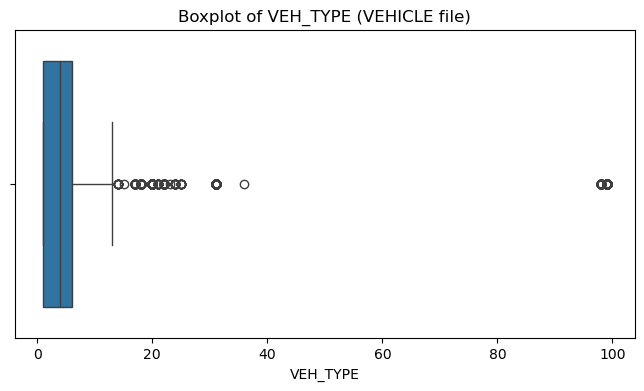

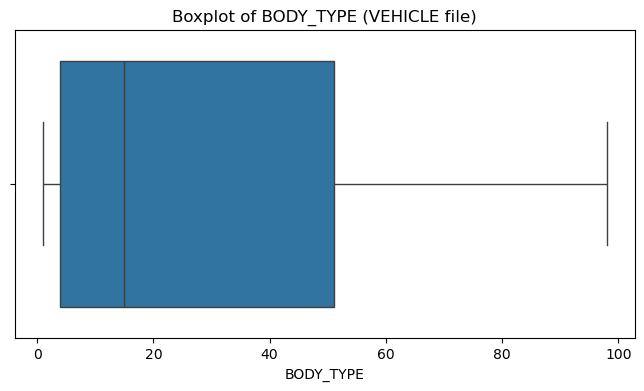

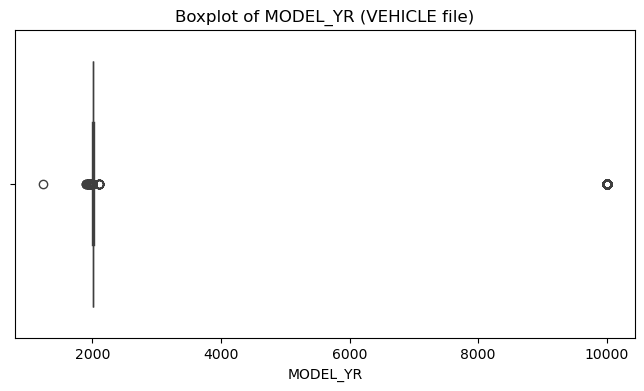

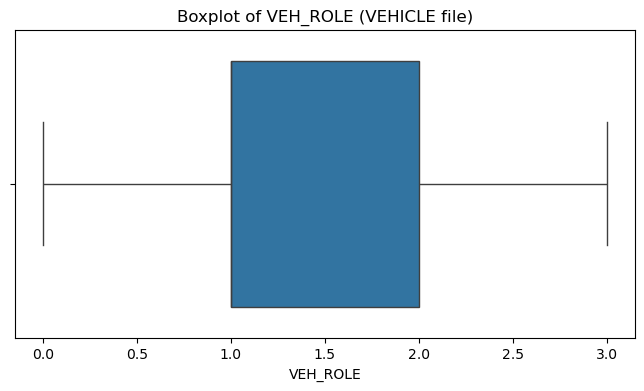

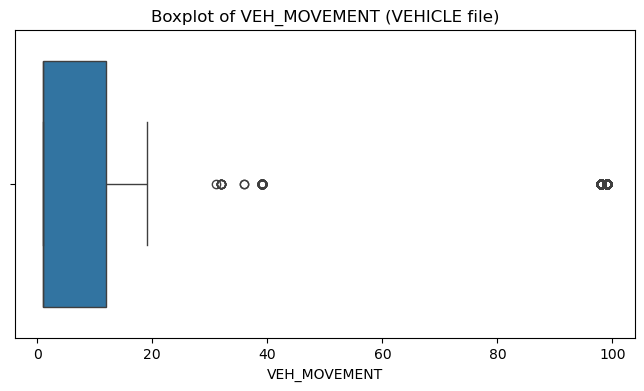

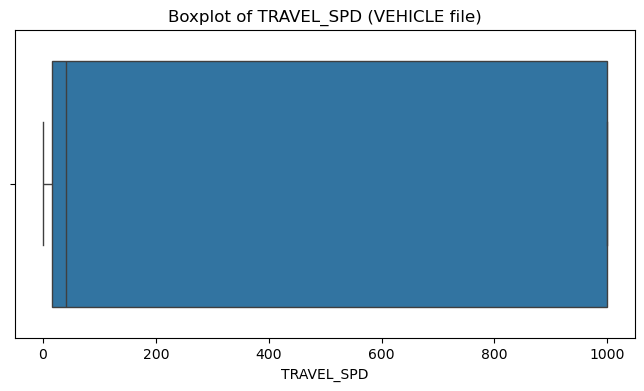

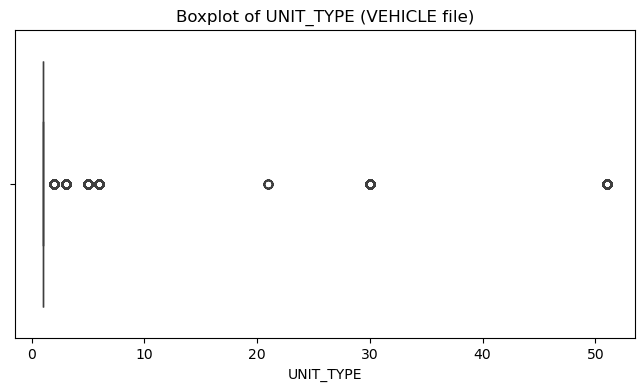

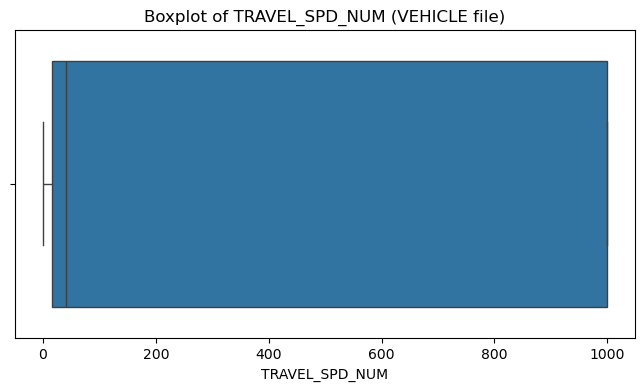

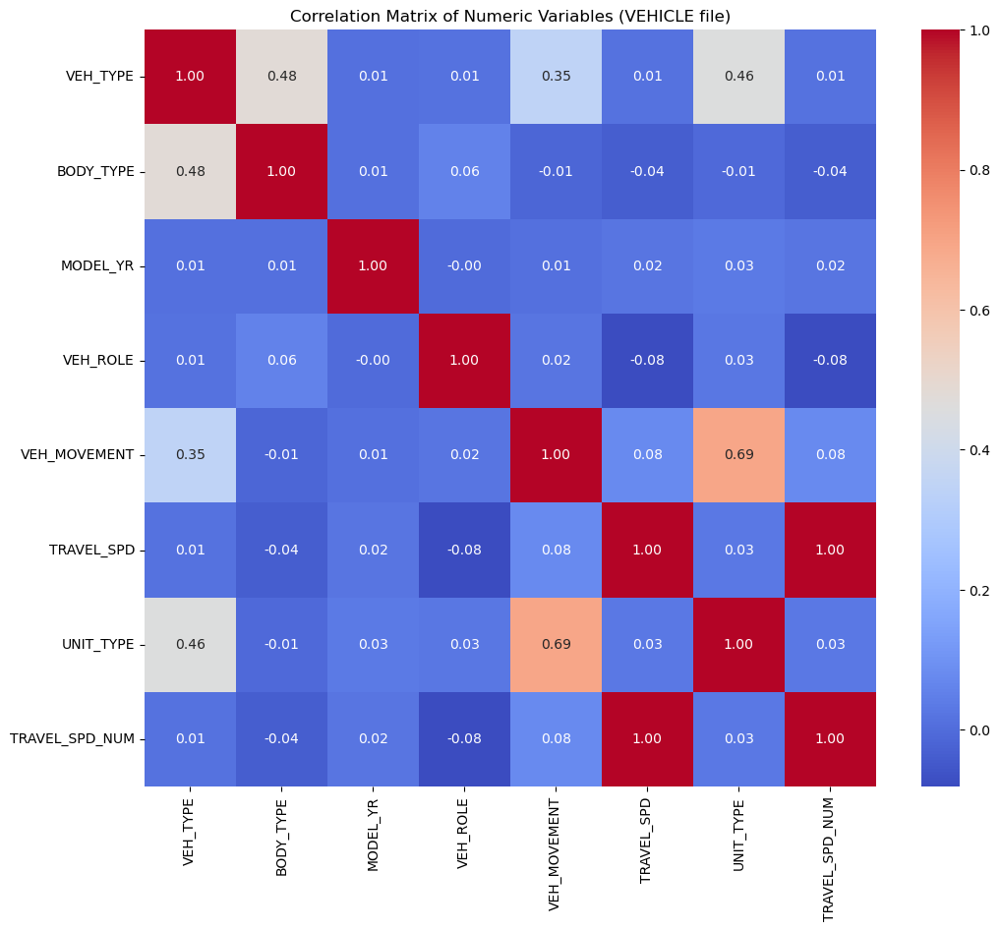

C:\Users\jason\anaconda3\envs\DeepL\lib\site-packages\statsmodels\stats\outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)



Variance Inflation Factor (VIF) for numeric features (VEHICLE file):
          Feature       VIF
0        VEH_TYPE  4.067004
1       BODY_TYPE  2.915407
2        MODEL_YR  8.696219
3        VEH_ROLE  5.078010
4    VEH_MOVEMENT  1.378838
5      TRAVEL_SPD       inf
6       UNIT_TYPE  2.660360
7  TRAVEL_SPD_NUM       inf


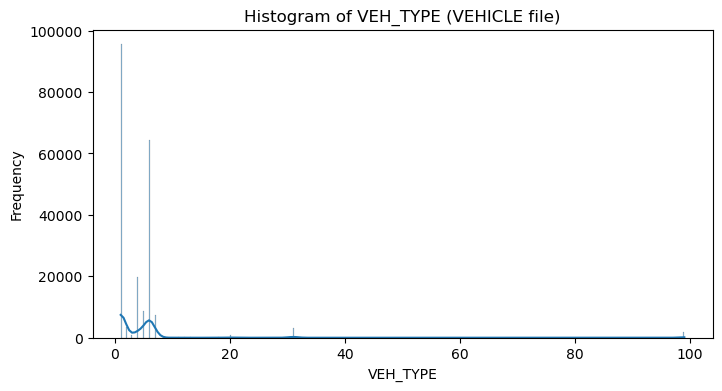

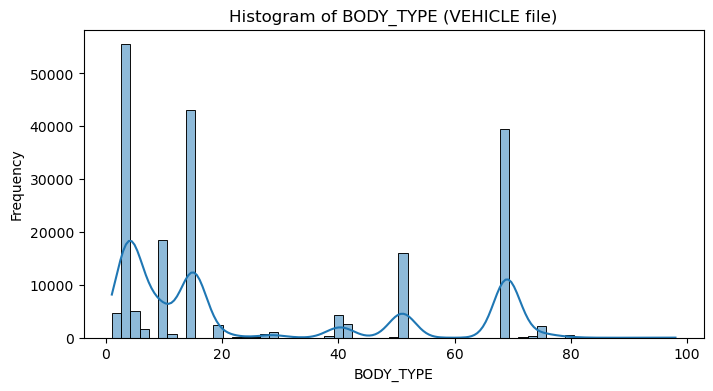

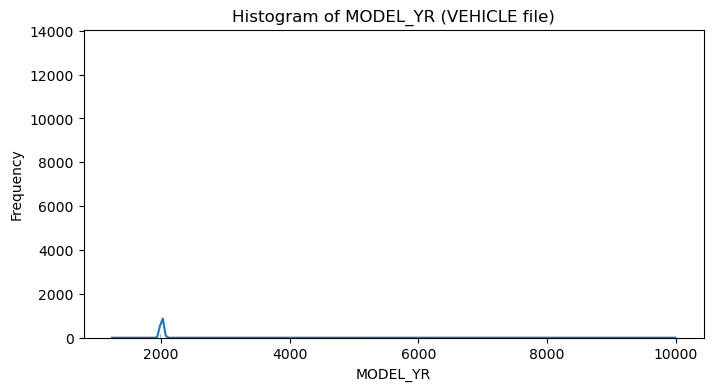

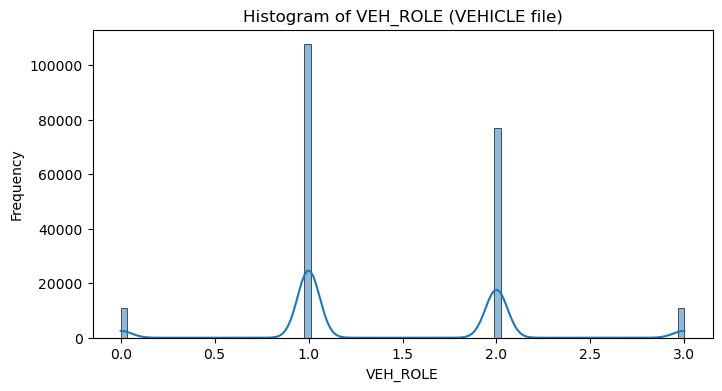

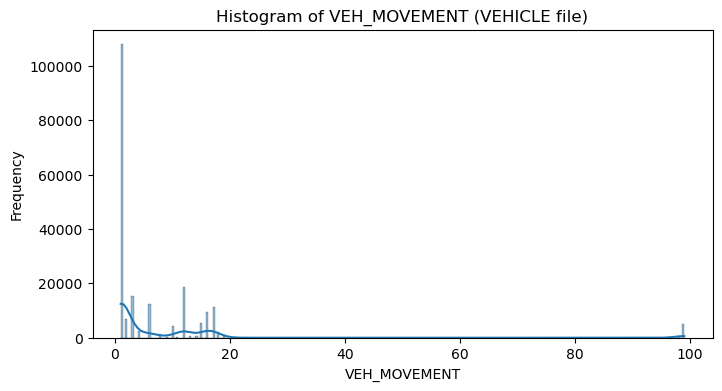

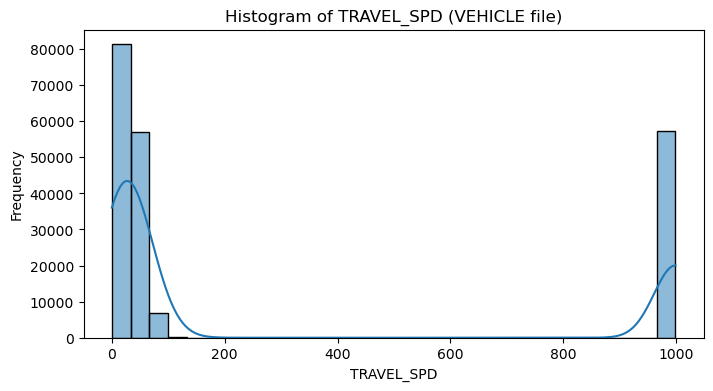

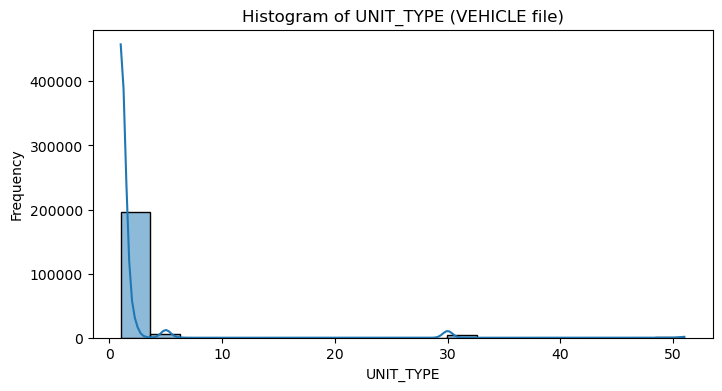

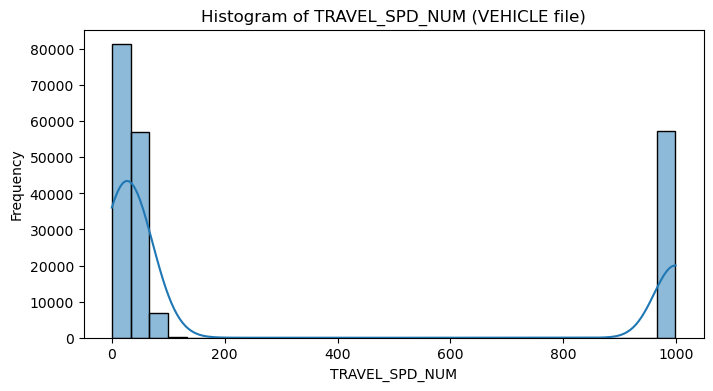


No column name formatting issues detected (VEHICLE file).

Potential Bias Check (VEHICLE file):
No 'PEOPLE_IN_UNIT' column found to check for bias.


In [100]:
# Additional Analyses for VEHICLE File
print("\n--- Additional Analyses for VEHICLE File ---")
numeric_cols_vehicle = df_vehicle.select_dtypes(include=[np.number]).columns.tolist()
print("\nNumeric columns in VEHICLE file:", numeric_cols_vehicle)

# Outlier Detection for VEHICLE file
outlier_summary_vehicle = {}
for col in numeric_cols_vehicle:
    count, lb, ub = detect_outliers(col, df_vehicle)
    outlier_summary_vehicle[col] = {"Outlier Count": count, "Lower Bound": lb, "Upper Bound": ub}
print("\nOutlier Summary for VEHICLE file:")
print(pd.DataFrame(outlier_summary_vehicle).T)

# Boxplots for VEHICLE file (only if column has >1 unique value)
for col in numeric_cols_vehicle:
    col_data = df_vehicle[col].dropna()
    if col_data.nunique() > 1:
        plt.figure(figsize=(8, 4))
        sns.boxplot(x=col_data)
        plt.title(f"Boxplot of {col} (VEHICLE file)")
        plt.show()
    else:
        print(f"Skipping boxplot for {col} due to lack of variation.")

# Correlation Matrix and VIF Calculation for VEHICLE file
df_vif_vehicle = df_vehicle[numeric_cols_vehicle].replace([np.inf, -np.inf], np.nan).dropna()
plt.figure(figsize=(12, 10))
corr_matrix_vehicle = df_vehicle[numeric_cols_vehicle].corr()
sns.heatmap(corr_matrix_vehicle, annot=True, fmt=".2f", cmap="coolwarm")
plt.title("Correlation Matrix of Numeric Variables (VEHICLE file)")
plt.show()

if df_vif_vehicle.shape[0] == 0:
    print("VIF cannot be computed: No data available after cleaning numeric columns in VEHICLE file.")
else:
    vif_data_vehicle = pd.DataFrame()
    vif_data_vehicle["Feature"] = numeric_cols_vehicle
    vif_data_vehicle["VIF"] = [variance_inflation_factor(df_vif_vehicle.values, i) for i in range(len(numeric_cols_vehicle))]
    print("\nVariance Inflation Factor (VIF) for numeric features (VEHICLE file):")
    print(vif_data_vehicle)

# Histograms for VEHICLE file
for col in numeric_cols_vehicle:
    plt.figure(figsize=(8, 4))
    sns.histplot(df_vehicle[col], kde=True)
    plt.title(f"Histogram of {col} (VEHICLE file)")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.show()

# Analyze binary distributions for VEHICLE file (if applicable)
binary_columns_vehicle = []  # Add any VEHICLE binary fields if applicable
def analyze_binary_distribution_vehicle(col, df):
    counts = df[col].value_counts()
    total = counts.sum()
    distribution = (counts / total * 100).round(2)
    print(f"\nDistribution for '{col}' (VEHICLE file):")
    print(distribution)
    plt.figure(figsize=(4, 4))
    sns.barplot(x=counts.index, y=counts.values, palette="pastel")
    plt.title(f"Bar Plot of {col} (VEHICLE file)")
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.show()
for col in binary_columns_vehicle:
    if col in df_vehicle.columns:
        analyze_binary_distribution_vehicle(col, df_vehicle)

# Check column name formatting for VEHICLE file
format_issues_vehicle = [check_column_name_format(col) for col in df_vehicle.columns if check_column_name_format(col) is not None]
if format_issues_vehicle:
    print("\nColumn Name Formatting Issues (VEHICLE file):")
    for issue in format_issues_vehicle:
        print(issue)
else:
    print("\nNo column name formatting issues detected (VEHICLE file).")

# Potential Bias Check for VEHICLE file (example: using 'PEOPLE_IN_UNIT' if available)
print("\nPotential Bias Check (VEHICLE file):")
if 'PEOPLE_IN_UNIT' in df_vehicle.columns:
    people_distribution = df_vehicle['PEOPLE_IN_UNIT'].value_counts(normalize=True) * 100
    print("PEOPLE_IN_UNIT distribution (%):")
    print(people_distribution.round(2))
else:
    print("No 'PEOPLE_IN_UNIT' column found to check for bias.")